In [121]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np
import fiona
from datetime import datetime, timedelta
from netCDF4 import Dataset, num2date, date2num, date2index
from shapely.geometry import shape, Point

In [194]:
layers = fiona.listlayers('data/MED_segments.gpkg')
print layers
with fiona.open('data/MED_segments.gpkg', 'r', layer='MCD_segments') as source:
    #print source.bounds
    print len(source)
    for f in source[2382:2383]:
        geom = shape(f['geometry'])
        _centroid = geom.centroid
        lat = f['properties'].get('Lati')
        lon = f['properties'].get('Longi')
        slope = f['properties'].get('MCD_segment_level_2_cst')
        
        centroid = Point(lon, lat)
        
        mylon = _centroid.x
        mylat = _centroid.y
        print "lat e lon to query: " + str(mylat) + ',' + str(mylon)

[u'MED_segments', u'MCD_segments']
2383
lat e lon to query: 43.4414610369,16.1228500547


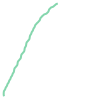

In [168]:
geom

In [200]:
sealevel = Dataset("data/TMES_sea_level_20181029.nc", "r", format="NETCDF4")
print sealevel.variables
lat = sealevel.variables["lat"]
lon = sealevel.variables["lon"]
times = sealevel.variables["time"]
dates = num2date(times[:],units=times.units,calendar=times.calendar)
#for time in times:
#    print num2date(time,units=times.units).isoformat(' ')

waveheight = Dataset("data/TMES_waves_20181029.nc", "r", format="NETCDF4")
#print waveheight.variables
         


OrderedDict([(u'time', <type 'netCDF4._netCDF4.Variable'>
float64 time(time)
    standard_name: time
    units: seconds since 2018-01-01 00:00:00 UTC
    calendar: standard
    axis: T
unlimited dimensions: time
current shape = (24,)
filling off
), (u'lon', <type 'netCDF4._netCDF4.Variable'>
float32 lon(lon)
    standard_name: longitude
    long_name: longitude
    units: degrees_east
    axis: X
unlimited dimensions: 
current shape = (509,)
filling off
), (u'lat', <type 'netCDF4._netCDF4.Variable'>
float32 lat(lat)
    standard_name: latitude
    long_name: latitude
    units: degrees_north
    axis: Y
unlimited dimensions: 
current shape = (460,)
filling off
), (u'sea_level-mean', <type 'netCDF4._netCDF4.Variable'>
float32 sea_level-mean(time, lat, lon)
    units: m
    _FillValue: -999.0
    missing_value: -999.0
unlimited dimensions: time
current shape = (24, 460, 509)
filling off
), (u'sea_level-std', <type 'netCDF4._netCDF4.Variable'>
float32 sea_level-std(time, lat, lon)
    uni

In [197]:
#code from 
#https://www.unidata.ucar.edu/blogs/developer/entry/accessing_netcdf_data_by_coordinates
#https://github.com/Unidata/python-workshop/blob/fall-2016/notebooks/netcdf-by-coordinates.ipynb


def naive_slow(latvar, lonvar, lat0, lon0, mask):
    '''
    Find "closest" point in a set of (lat,lon) points to specified point
    latvar - 2D latitude variable from an open netCDF dataset
    lonvar - 2D longitude variable from an open netCDF dataset
    lat0,lon0 - query point
    Returns iy,ix such that 
     (lonval[iy,ix] - lon0)**2 + (latval[iy,ix] - lat0)**2
    is minimum.  This "closeness" measure works badly near poles and
    longitude boundaries.
    '''
    # Read from file into numpy arrays
    latvals = latvar[:]
    lonvals = lonvar[:]
    print latvals.shape
    ny = len(latvals)
    nx = len(lonvals)
    dist_sq_min = 1.0e30
    for iy in range(ny):
        for ix in range(nx):
            if mask[iy,ix]:           
                continue
            latval = latvals[iy]
            lonval = lonvals[ix]
            dist_sq = (latval - lat0)**2 + (lonval - lon0)**2
            if dist_sq < dist_sq_min:
                iy_min, ix_min, dist_sq_min = iy, ix, dist_sq
    return iy_min,ix_min

def naive_fast(latvar,lonvar,lat0,lon0, mask):
    # Read latitude and longitude from file into numpy arrays
    latvals = latvar[:]
    lonvals = lonvar[:]
    latvals2 = np.repeat([latvals], len(lonvals)).reshape(len(latvals),len(lonvals))
    lonvals2 = np.repeat([lonvals], len(latvals), axis=0)
    #apply mask to array
    m_latvals2 = np.ma.masked_array(latvals2, mask)
    m_lonvals2 = np.ma.masked_array(lonvals2, mask)
    ny,nx = lonvals2.shape
  
    dist_sq = (m_latvals2-lat0)**2 + (lonvals2-lon0)**2
    minindex_flattened = dist_sq.argmin()  # 1D index of min element
    
    #print dist_sq
    
    iy_min,ix_min = np.unravel_index(minindex_flattened, latvals2.shape)
    
        
    return iy_min,ix_min

#get variables from sealevel dataset 
mysealevel = sealevel.variables["sea_level-mean"]
mysealevelstd = sealevel.variables["sea_level-std"] 
times = sealevel.variables["time"]
mask = sealevel['sea_level-mean'][0].mask
#print mysealevel[:]
#get variables from wave  dataset  (mean height enad mean period)
mywaveheight = waveheight.variables["wsh-mean"]
mywaveperiod = waveheight.variables["wmp-mean"]


In [203]:
import csv
levelforecast = open

header = ['locationid', 'slope', 'lat', 'lon', 'time', 'datetime', 'sealevel_mean', 'sealevel_max', 'wave_height_mean', 'wave_period_mean']
rows = []
with open('data/flooding_values.csv', 'wt') as levelforecast:
    csv_writer = csv.writer(levelforecast)
    csv_writer.writerow(header) # write header
    #open med segements database
    with fiona.open('data/MED_segments.gpkg', 'r', layer='MCD_segments') as source:
        latvar = sealevel.variables["lat"]
        lonvar = sealevel.variables["lon"]

        for f in source[:]:
            geom = shape(f['geometry'])
            _centroid = geom.centroid
            mylat = f['properties'].get('Lati') 
            #mylat = 39.8319
            mylon = f['properties'].get('Longi')
            #mylon = 18.2735
            cur_locationid  = f['properties'].get('locationid')
            cur_slope  = f['properties'].get('MCD_segment_level_2_cst')
            #get closest point 
            iy,ix = naive_fast(latvar, lonvar, mylat, mylon, mask)
            cur_lat = round(latvar[iy],8)
            cur_lon = round(lonvar[ix],8)
            
            #print 'Locationid: ' + str(f['properties'].get('locationid'))
            #print 'Point: ' + str(mylat) +',' + str(mylon)
            #print 'Closest point: ' + str(latvar[iy]), str(lonvar[ix])

            timeindices = date2index(dates,times)
            
            for it in timeindices:
                cur_time = it
                cur_datetime = num2date(times[it],units=times.units).isoformat(' ')
                cur_sealevel_mean = mysealevel[it,iy,ix]
                cur_sealevel_max = mysealevel[it,iy,ix] + mysealevelstd[it,iy,ix]
                cur_waveheight = mywaveheight[it,iy,ix]
                print cur_sealevel_mean
                cur_waveperiod = mywaveperiod[it,iy,ix]
                cur_row = [cur_locationid, cur_slope, cur_lat, cur_lon, cur_time, cur_datetime, float(cur_sealevel_mean), float(cur_sealevel_max), float(cur_waveheight), float(cur_waveperiod) ]
                csv_writer.writerow(cur_row)
                print cur_row



-0.380193024874
[2, u'5.04222727', 42.93000031, 17.54999924, 0, '2018-10-29 00:00:00', -0.3801930248737335, -0.2742574214935303, 0.9094942212104797, 3.5970921516418457]
-0.339886635542
[2, u'5.04222727', 42.93000031, 17.54999924, 1, '2018-10-29 01:00:00', -0.3398866355419159, -0.23115473985671997, 0.9050772786140442, 3.5639266967773438]
-0.294916182756
[2, u'5.04222727', 42.93000031, 17.54999924, 2, '2018-10-29 02:00:00', -0.29491618275642395, -0.18896178901195526, 0.9128544926643372, 3.560757875442505]
-0.232057154179
[2, u'5.04222727', 42.93000031, 17.54999924, 3, '2018-10-29 03:00:00', -0.23205715417861938, -0.12701407074928284, 0.9193286299705505, 3.476715564727783]
-0.163010194898
[2, u'5.04222727', 42.93000031, 17.54999924, 4, '2018-10-29 04:00:00', -0.16301019489765167, -0.08491069078445435, 0.9141257405281067, 3.4878363609313965]
-0.112763546407
[2, u'5.04222727', 42.93000031, 17.54999924, 5, '2018-10-29 05:00:00', -0.11276354640722275, -0.07066003233194351, 0.9104560017585754,

-0.227958440781
[3689, u'3.28817868', 42.14999771, 18.97000122, 3, '2018-10-29 03:00:00', -0.22795844078063965, -0.16350823640823364, 3.1882429122924805, 6.897600173950195]
-0.184834808111
[3689, u'3.28817868', 42.14999771, 18.97000122, 4, '2018-10-29 04:00:00', -0.1848348081111908, -0.13507451117038727, 3.113274097442627, 6.806893348693848]
-0.16989377141
[3689, u'3.28817868', 42.14999771, 18.97000122, 5, '2018-10-29 05:00:00', -0.1698937714099884, -0.12170132994651794, 3.03425931930542, 6.840811252593994]
-0.179778963327
[3689, u'3.28817868', 42.14999771, 18.97000122, 6, '2018-10-29 06:00:00', -0.17977896332740784, -0.12255148589611053, 2.902656316757202, 6.862148761749268]
-0.218031302094
[3689, u'3.28817868', 42.14999771, 18.97000122, 7, '2018-10-29 07:00:00', -0.21803130209445953, -0.16246959567070007, 2.770062208175659, 6.88421106338501]
-0.268190771341
[3689, u'3.28817868', 42.14999771, 18.97000122, 8, '2018-10-29 08:00:00', -0.26819077134132385, -0.21188677847385406, 2.65715432

[3694, u'4.23543501', 42.11000061, 19.05000114, 5, '2018-10-29 05:00:00', -0.16927513480186462, -0.11649665236473083, 2.658176898956299, 6.718334197998047]
-0.180303111672
[3694, u'4.23543501', 42.11000061, 19.05000114, 6, '2018-10-29 06:00:00', -0.18030311167240143, -0.11937541514635086, 2.5581119060516357, 6.734621524810791]
-0.218845486641
[3694, u'4.23543501', 42.11000061, 19.05000114, 7, '2018-10-29 07:00:00', -0.21884548664093018, -0.1601293683052063, 2.45154070854187, 6.7503767013549805]
-0.269182235003
[3694, u'4.23543501', 42.11000061, 19.05000114, 8, '2018-10-29 08:00:00', -0.2691822350025177, -0.21021915972232819, 2.3623852729797363, 6.823971271514893]
-0.323101431131
[3694, u'4.23543501', 42.11000061, 19.05000114, 9, '2018-10-29 09:00:00', -0.3231014311313629, -0.2635822594165802, 2.2741267681121826, 6.774555683135986]
-0.36943474412
[3694, u'4.23543501', 42.11000061, 19.05000114, 10, '2018-10-29 10:00:00', -0.36943474411964417, -0.30581197142601013, 2.238612651824951, 6.85

[3699, u'1.01741672', 42.00999832, 19.13000107, 5, '2018-10-29 05:00:00', -0.1735387146472931, -0.1212862879037857, 2.5095200538635254, 6.840705871582031]
-0.185175776482
[3699, u'1.01741672', 42.00999832, 19.13000107, 6, '2018-10-29 06:00:00', -0.18517577648162842, -0.12588703632354736, 2.4145050048828125, 6.840263843536377]
-0.222507581115
[3699, u'1.01741672', 42.00999832, 19.13000107, 7, '2018-10-29 07:00:00', -0.22250758111476898, -0.16346091032028198, 2.320772409439087, 6.773899555206299]
-0.271398961544
[3699, u'1.01741672', 42.00999832, 19.13000107, 8, '2018-10-29 08:00:00', -0.27139896154403687, -0.2097126692533493, 2.241281747817993, 6.824824810028076]
-0.32362356782
[3699, u'1.01741672', 42.00999832, 19.13000107, 9, '2018-10-29 09:00:00', -0.32362356781959534, -0.25945088267326355, 2.166879653930664, 6.807897567749023]
-0.370359629393
[3699, u'1.01741672', 42.00999832, 19.13000107, 10, '2018-10-29 10:00:00', -0.3703596293926239, -0.3032941520214081, 2.1376376152038574, 6.865

-0.263653308153
[3704, u'2.44335508', 42.26999664, 18.82999992, 8, '2018-10-29 08:00:00', -0.26365330815315247, -0.20891642570495605, 2.772345542907715, 6.911143779754639]
-0.317083477974
[3704, u'2.44335508', 42.26999664, 18.82999992, 9, '2018-10-29 09:00:00', -0.317083477973938, -0.25787338614463806, 2.660034656524658, 6.935780048370361]
-0.363630861044
[3704, u'2.44335508', 42.26999664, 18.82999992, 10, '2018-10-29 10:00:00', -0.36363086104393005, -0.3014739155769348, 2.5932116508483887, 6.954054355621338]
-0.390319228172
[3704, u'2.44335508', 42.26999664, 18.82999992, 11, '2018-10-29 11:00:00', -0.39031922817230225, -0.32893121242523193, 2.544522762298584, 6.993130207061768]
-0.40112516284
[3704, u'2.44335508', 42.26999664, 18.82999992, 12, '2018-10-29 12:00:00', -0.4011251628398895, -0.3409107029438019, 2.5179519653320312, 7.1435394287109375]
-0.389248490334
[3704, u'2.44335508', 42.26999664, 18.82999992, 13, '2018-10-29 13:00:00', -0.38924849033355713, -0.3228379487991333, 2.5525

-0.366274595261
[3709, u'1.47538865', 42.25, 18.79000092, 10, '2018-10-29 10:00:00', -0.3662745952606201, -0.30361273884773254, 2.7683427333831787, 6.917734622955322]
-0.392999947071
[3709, u'1.47538865', 42.25, 18.79000092, 11, '2018-10-29 11:00:00', -0.39299994707107544, -0.33148059248924255, 2.7079479694366455, 7.069477558135986]
-0.403730481863
[3709, u'1.47538865', 42.25, 18.79000092, 12, '2018-10-29 12:00:00', -0.40373048186302185, -0.34388381242752075, 2.677849292755127, 7.110433101654053]
-0.391831547022
[3709, u'1.47538865', 42.25, 18.79000092, 13, '2018-10-29 13:00:00', -0.39183154702186584, -0.32610201835632324, 2.718312978744507, 7.13857364654541]
-0.369255334139
[3709, u'1.47538865', 42.25, 18.79000092, 14, '2018-10-29 14:00:00', -0.36925533413887024, -0.29892975091934204, 2.7955236434936523, 7.162914752960205]
-0.34606090188
[3709, u'1.47538865', 42.25, 18.79000092, 15, '2018-10-29 15:00:00', -0.3460609018802643, -0.270667165517807, 2.910191059112549, 7.202057361602783]
-

-0.390087723732
[3714, u'2.45137811', 42.25, 18.87000084, 13, '2018-10-29 13:00:00', -0.39008772373199463, -0.3232530951499939, 2.5002524852752686, 7.191288471221924]
-0.367918640375
[3714, u'2.45137811', 42.25, 18.87000084, 14, '2018-10-29 14:00:00', -0.36791864037513733, -0.29602211713790894, 2.5634870529174805, 7.218992233276367]
-0.345136255026
[3714, u'2.45137811', 42.25, 18.87000084, 15, '2018-10-29 15:00:00', -0.34513625502586365, -0.26777076721191406, 2.663437843322754, 7.256265640258789]
-0.324460804462
[3714, u'2.45137811', 42.25, 18.87000084, 16, '2018-10-29 16:00:00', -0.32446080446243286, -0.24173453450202942, 2.705329179763794, 7.281214714050293]
-0.310405820608
[3714, u'2.45137811', 42.25, 18.87000084, 17, '2018-10-29 17:00:00', -0.31040582060813904, -0.22191619873046875, 2.707829475402832, 7.294689655303955]
-0.307596594095
[3714, u'2.45137811', 42.25, 18.87000084, 18, '2018-10-29 18:00:00', -0.3075965940952301, -0.2124146819114685, 2.6266329288482666, 7.304410934448242

-0.340120851994
[3719, u'2.6335547', 42.38999939, 18.55000114, 15, '2018-10-29 15:00:00', -0.3401208519935608, -0.2676057815551758, 3.0777273178100586, 7.196282386779785]
-0.319945991039
[3719, u'2.6335547', 42.38999939, 18.55000114, 16, '2018-10-29 16:00:00', -0.3199459910392761, -0.24183258414268494, 3.069258213043213, 7.243034839630127]
-0.306583702564
[3719, u'2.6335547', 42.38999939, 18.55000114, 17, '2018-10-29 17:00:00', -0.3065837025642395, -0.22232896089553833, 3.094780206680298, 7.283926963806152]
-0.303883463144
[3719, u'2.6335547', 42.38999939, 18.55000114, 18, '2018-10-29 18:00:00', -0.30388346314430237, -0.21083667874336243, 3.1023831367492676, 7.3222761154174805]
-0.31815341115
[3719, u'2.6335547', 42.38999939, 18.55000114, 19, '2018-10-29 19:00:00', -0.31815341114997864, -0.22323518991470337, 3.072859287261963, 7.321778297424316]
-0.336701691151
[3719, u'2.6335547', 42.38999939, 18.55000114, 20, '2018-10-29 20:00:00', -0.3367016911506653, -0.2344440221786499, 3.04248023

-0.363452464342
[3724, u'3.92418194', 42.40999985, 18.63000107, 14, '2018-10-29 14:00:00', -0.3634524643421173, -0.29359352588653564, 2.4029743671417236, 6.960736274719238]
-0.339591413736
[3724, u'3.92418194', 42.40999985, 18.63000107, 15, '2018-10-29 15:00:00', -0.3395914137363434, -0.2662334740161896, 2.474012851715088, 7.0132575035095215]
-0.318377435207
[3724, u'3.92418194', 42.40999985, 18.63000107, 16, '2018-10-29 16:00:00', -0.31837743520736694, -0.24044030904769897, 2.4908206462860107, 7.070438385009766]
-0.305735051632
[3724, u'3.92418194', 42.40999985, 18.63000107, 17, '2018-10-29 17:00:00', -0.3057350516319275, -0.22187788784503937, 2.543243885040283, 7.214705944061279]
-0.305136650801
[3724, u'3.92418194', 42.40999985, 18.63000107, 18, '2018-10-29 18:00:00', -0.30513665080070496, -0.21190156042575836, 2.5560009479522705, 7.163076400756836]
-0.318712413311
[3724, u'3.92418194', 42.40999985, 18.63000107, 19, '2018-10-29 19:00:00', -0.31871241331100464, -0.22415435314178467, 

[3729, u'5.81507635', 42.43000031, 18.75, 15, '2018-10-29 15:00:00', -0.34096992015838623, -0.26737427711486816, 2.4904680252075195, 6.726409912109375]
-0.320145428181
[3729, u'5.81507635', 42.43000031, 18.75, 16, '2018-10-29 16:00:00', -0.3201454281806946, -0.24184544384479523, 2.5157909393310547, 6.77964973449707]
-0.307618170977
[3729, u'5.81507635', 42.43000031, 18.75, 17, '2018-10-29 17:00:00', -0.3076181709766388, -0.22400547564029694, 2.539684295654297, 6.819894790649414]
-0.307560682297
[3729, u'5.81507635', 42.43000031, 18.75, 18, '2018-10-29 18:00:00', -0.30756068229675293, -0.214304581284523, 2.5365536212921143, 6.8506574630737305]
-0.320692747831
[3729, u'5.81507635', 42.43000031, 18.75, 19, '2018-10-29 19:00:00', -0.3206927478313446, -0.22608554363250732, 2.4974355697631836, 6.850537300109863]
-0.338881909847
[3729, u'5.81507635', 42.43000031, 18.75, 20, '2018-10-29 20:00:00', -0.3388819098472595, -0.23817214369773865, 2.464857578277588, 6.832088947296143]
-0.354115724564


-0.318755984306
[3734, u'8.17982769', 42.46999741, 18.69000053, 16, '2018-10-29 16:00:00', -0.31875598430633545, -0.23982977867126465, 2.594391345977783, 7.088109970092773]
-0.30663189292
[3734, u'8.17982769', 42.46999741, 18.69000053, 17, '2018-10-29 17:00:00', -0.3066318929195404, -0.22242221236228943, 2.6157257556915283, 7.130768299102783]
-0.305839121342
[3734, u'8.17982769', 42.46999741, 18.69000053, 18, '2018-10-29 18:00:00', -0.3058391213417053, -0.21228456497192383, 2.656341314315796, 7.210826396942139]
-0.319131940603
[3734, u'8.17982769', 42.46999741, 18.69000053, 19, '2018-10-29 19:00:00', -0.3191319406032562, -0.22433948516845703, 2.657396078109741, 7.219104290008545]
-0.337223917246
[3734, u'8.17982769', 42.46999741, 18.69000053, 20, '2018-10-29 20:00:00', -0.33722391724586487, -0.2359032779932022, 2.636662244796753, 7.19923210144043]
-0.35284870863
[3734, u'8.17982769', 42.46999741, 18.69000053, 21, '2018-10-29 21:00:00', -0.35284870862960815, -0.2426552176475525, 2.64892

-0.320769995451
[3739, u'10.73958778', 42.46999741, 18.75, 19, '2018-10-29 19:00:00', -0.3207699954509735, -0.22608090937137604, 2.9375152587890625, 7.314597129821777]
-0.33863440156
[3739, u'10.73958778', 42.46999741, 18.75, 20, '2018-10-29 20:00:00', -0.3386344015598297, -0.23771509528160095, 2.9120278358459473, 7.295376777648926]
-0.354078263044
[3739, u'10.73958778', 42.46999741, 18.75, 21, '2018-10-29 21:00:00', -0.3540782630443573, -0.2447216510772705, 2.9279468059539795, 7.270282745361328]
-0.342473655939
[3739, u'10.73958778', 42.46999741, 18.75, 22, '2018-10-29 22:00:00', -0.3424736559391022, -0.22548644244670868, 3.0513319969177246, 7.285933017730713]
-0.309862673283
[3739, u'10.73958778', 42.46999741, 18.75, 23, '2018-10-29 23:00:00', -0.3098626732826233, -0.19194135069847107, 3.249025344848633, 7.338022232055664]
-0.396826595068
[3740, u'3.14191818', 42.38999939, 18.69000053, 0, '2018-10-29 00:00:00', -0.3968265950679779, -0.2959945797920227, 3.509296417236328, 6.7939648628

-0.352426826954
[3744, u'2.4807229', 42.40999985, 18.69000053, 21, '2018-10-29 21:00:00', -0.35242682695388794, -0.241921067237854, 2.271469831466675, 7.009186267852783]
-0.340572059155
[3744, u'2.4807229', 42.40999985, 18.69000053, 22, '2018-10-29 22:00:00', -0.3405720591545105, -0.22267526388168335, 2.366503953933716, 7.024937152862549]
-0.30847966671
[3744, u'2.4807229', 42.40999985, 18.69000053, 23, '2018-10-29 23:00:00', -0.3084796667098999, -0.18939733505249023, 2.52119517326355, 7.079012870788574]
-0.396811872721
[3745, u'2.54959106', 42.40999985, 18.69000053, 0, '2018-10-29 00:00:00', -0.3968118727207184, -0.2962910532951355, 3.099475860595703, 6.656527519226074]
-0.345025509596
[3745, u'2.54959106', 42.40999985, 18.69000053, 1, '2018-10-29 01:00:00', -0.34502550959587097, -0.25028032064437866, 3.0890917778015137, 6.639160633087158]
-0.286069273949
[3745, u'2.54959106', 42.40999985, 18.69000053, 2, '2018-10-29 02:00:00', -0.28606927394866943, -0.19990122318267822, 3.03533864021

[3749, u'1.66118097', 41.90999985, 19.19000053, 22, '2018-10-29 22:00:00', -0.3464771807193756, -0.221101775765419, 2.189974546432495, 6.813414573669434]
-0.314325749874
[3749, u'1.66118097', 41.90999985, 19.19000053, 23, '2018-10-29 23:00:00', -0.314325749874115, -0.18820719420909882, 2.2954397201538086, 6.852253437042236]
-0.410170674324
[3750, u'0.52563882', 41.98999786, 19.13000107, 0, '2018-10-29 00:00:00', -0.41017067432403564, -0.3152807354927063, 2.620502471923828, 6.708518028259277]
-0.357872366905
[3750, u'0.52563882', 41.98999786, 19.13000107, 1, '2018-10-29 01:00:00', -0.3578723669052124, -0.26877447962760925, 2.6232810020446777, 6.701603889465332]
-0.296262800694
[3750, u'0.52563882', 41.98999786, 19.13000107, 2, '2018-10-29 02:00:00', -0.29626280069351196, -0.21218669414520264, 2.636366605758667, 6.7253336906433105]
-0.230180189013
[3750, u'0.52563882', 41.98999786, 19.13000107, 3, '2018-10-29 03:00:00', -0.23018018901348114, -0.16339054703712463, 2.629451036453247, 6.762

-0.409375965595
[3755, u'0.79756761', 42.00999832, 19.13000107, 0, '2018-10-29 00:00:00', -0.40937596559524536, -0.3141893744468689, 2.595067262649536, 6.733614444732666]
-0.356943368912
[3755, u'0.79756761', 42.00999832, 19.13000107, 1, '2018-10-29 01:00:00', -0.35694336891174316, -0.26785728335380554, 2.588134288787842, 6.722855091094971]
-0.29510730505
[3755, u'0.79756761', 42.00999832, 19.13000107, 2, '2018-10-29 02:00:00', -0.29510730504989624, -0.21053364872932434, 2.5973596572875977, 6.717350006103516]
-0.228882774711
[3755, u'0.79756761', 42.00999832, 19.13000107, 3, '2018-10-29 03:00:00', -0.2288827747106552, -0.1614106446504593, 2.587156057357788, 6.751317024230957]
-0.187470734119
[3755, u'0.79756761', 42.00999832, 19.13000107, 4, '2018-10-29 04:00:00', -0.18747073411941528, -0.13305652141571045, 2.5622191429138184, 6.807882785797119]
-0.173538714647
[3755, u'0.79756761', 42.00999832, 19.13000107, 5, '2018-10-29 05:00:00', -0.1735387146472931, -0.1212862879037857, 2.50952005

-0.214576080441
[3760, u'16.76479912', 42.48999786, 18.67000008, 3, '2018-10-29 03:00:00', -0.21457608044147491, -0.1444501280784607, 3.061305046081543, 6.529358863830566]
-0.170593708754
[3760, u'16.76479912', 42.48999786, 18.67000008, 4, '2018-10-29 04:00:00', -0.17059370875358582, -0.11855093389749527, 2.9887471199035645, 6.470251560211182]
-0.158655807376
[3760, u'16.76479912', 42.48999786, 18.67000008, 5, '2018-10-29 05:00:00', -0.1586558073759079, -0.11481107026338577, 2.886068820953369, 6.467861652374268]
-0.175840482116
[3760, u'16.76479912', 42.48999786, 18.67000008, 6, '2018-10-29 06:00:00', -0.17584048211574554, -0.13149407505989075, 2.763937473297119, 6.471984386444092]
-0.213693857193
[3760, u'16.76479912', 42.48999786, 18.67000008, 7, '2018-10-29 07:00:00', -0.21369385719299316, -0.1686421036720276, 2.655334949493408, 6.477471351623535]
-0.26460531354
[3760, u'16.76479912', 42.48999786, 18.67000008, 8, '2018-10-29 08:00:00', -0.264605313539505, -0.2206421047449112, 2.5548

-0.169521644711
[3765, u'0.80297381', 42.26999664, 18.82999992, 5, '2018-10-29 05:00:00', -0.16952164471149445, -0.1255812644958496, 3.1200718879699707, 6.861019134521484]
-0.177678257227
[3765, u'0.80297381', 42.26999664, 18.82999992, 6, '2018-10-29 06:00:00', -0.17767825722694397, -0.12575796246528625, 2.9924309253692627, 6.870584011077881]
-0.214681476355
[3765, u'0.80297381', 42.26999664, 18.82999992, 7, '2018-10-29 07:00:00', -0.214681476354599, -0.1624937504529953, 2.8756415843963623, 6.890015602111816]
-0.263653308153
[3765, u'0.80297381', 42.26999664, 18.82999992, 8, '2018-10-29 08:00:00', -0.26365330815315247, -0.20891642570495605, 2.772345542907715, 6.911143779754639]
-0.317083477974
[3765, u'0.80297381', 42.26999664, 18.82999992, 9, '2018-10-29 09:00:00', -0.317083477973938, -0.25787338614463806, 2.660034656524658, 6.935780048370361]
-0.363630861044
[3765, u'0.80297381', 42.26999664, 18.82999992, 10, '2018-10-29 10:00:00', -0.36363086104393005, -0.3014739155769348, 2.5932116

[3770, u'1.87889242', 42.25, 18.87000084, 8, '2018-10-29 08:00:00', -0.264973521232605, -0.2092869132757187, 2.69952130317688, 6.92919921875]
-0.318471372128
[3770, u'1.87889242', 42.25, 18.87000084, 9, '2018-10-29 09:00:00', -0.31847137212753296, -0.25874587893486023, 2.587118625640869, 6.951800346374512]
-0.364991128445
[3770, u'1.87889242', 42.25, 18.87000084, 10, '2018-10-29 10:00:00', -0.36499112844467163, -0.3022051751613617, 2.5249452590942383, 6.998834609985352]
-0.391372203827
[3770, u'1.87889242', 42.25, 18.87000084, 11, '2018-10-29 11:00:00', -0.3913722038269043, -0.32943427562713623, 2.4820244312286377, 7.1179046630859375]
-0.401998817921
[3770, u'1.87889242', 42.25, 18.87000084, 12, '2018-10-29 12:00:00', -0.4019988179206848, -0.34132120013237, 2.4614145755767822, 7.160848617553711]
-0.390087723732
[3770, u'1.87889242', 42.25, 18.87000084, 13, '2018-10-29 13:00:00', -0.39008772373199463, -0.3232530951499939, 2.5002524852752686, 7.191288471221924]
-0.367918640375
[3770, u'1

[3775, u'2.07873726', 42.16999817, 18.95000076, 11, '2018-10-29 11:00:00', -0.39354556798934937, -0.3314550518989563, 2.4632856845855713, 6.997294902801514]
-0.403477519751
[3775, u'2.07873726', 42.16999817, 18.95000076, 12, '2018-10-29 12:00:00', -0.4034775197505951, -0.3423125445842743, 2.4481585025787354, 7.084259510040283]
-0.391386330128
[3775, u'2.07873726', 42.16999817, 18.95000076, 13, '2018-10-29 13:00:00', -0.39138633012771606, -0.3248857855796814, 2.4985580444335938, 7.07682466506958]
-0.369239479303
[3775, u'2.07873726', 42.16999817, 18.95000076, 14, '2018-10-29 14:00:00', -0.36923947930336, -0.297785222530365, 2.580960512161255, 7.096654891967773]
-0.346229493618
[3775, u'2.07873726', 42.16999817, 18.95000076, 15, '2018-10-29 15:00:00', -0.3462294936180115, -0.26939091086387634, 2.7061424255371094, 7.1218156814575195]
-0.326021909714
[3775, u'2.07873726', 42.16999817, 18.95000076, 16, '2018-10-29 16:00:00', -0.3260219097137451, -0.24391424655914307, 2.7448222637176514, 7.1

-0.366848737001
[3780, u'3.0942173', 42.26999664, 18.82999992, 14, '2018-10-29 14:00:00', -0.36684873700141907, -0.29550814628601074, 2.613051652908325, 7.202385902404785]
-0.34391695261
[3780, u'3.0942173', 42.26999664, 18.82999992, 15, '2018-10-29 15:00:00', -0.34391695261001587, -0.2671174705028534, 2.7135515213012695, 7.238488674163818]
-0.323399066925
[3780, u'3.0942173', 42.26999664, 18.82999992, 16, '2018-10-29 16:00:00', -0.32339906692504883, -0.24116995930671692, 2.753502607345581, 7.268306732177734]
-0.30952423811
[3780, u'3.0942173', 42.26999664, 18.82999992, 17, '2018-10-29 17:00:00', -0.3095242381095886, -0.2214081585407257, 2.7627663612365723, 7.285310745239258]
-0.306392341852
[3780, u'3.0942173', 42.26999664, 18.82999992, 18, '2018-10-29 18:00:00', -0.3063923418521881, -0.2113666534423828, 2.690458297729492, 7.2978010177612305]
-0.322775125504
[3780, u'3.0942173', 42.26999664, 18.82999992, 19, '2018-10-29 19:00:00', -0.32277512550354004, -0.22492916882038116, 2.59451508

0.0294647496194
[3788, u'0.87052244', 45.52999878, 13.56999969, 17, '2018-10-29 17:00:00', 0.02946474961936474, 0.28127241134643555, 1.2182812690734863, 3.7435429096221924]
0.0729385241866
[3788, u'0.87052244', 45.52999878, 13.56999969, 18, '2018-10-29 18:00:00', 0.07293852418661118, 0.33392247557640076, 1.3062955141067505, 3.8536124229431152]
0.227610602975
[3788, u'0.87052244', 45.52999878, 13.56999969, 19, '2018-10-29 19:00:00', 0.22761060297489166, 0.5324091911315918, 1.3397281169891357, 3.9587700366973877]
0.410601496696
[3788, u'0.87052244', 45.52999878, 13.56999969, 20, '2018-10-29 20:00:00', 0.41060149669647217, 0.7820611000061035, 1.3289616107940674, 4.243513584136963]
0.456780552864
[3788, u'0.87052244', 45.52999878, 13.56999969, 21, '2018-10-29 21:00:00', 0.4567805528640747, 0.8212997913360596, 1.3488788604736328, 4.561495304107666]
0.403390347958
[3788, u'0.87052244', 45.52999878, 13.56999969, 22, '2018-10-29 22:00:00', 0.4033903479576111, 0.7679291367530823, 1.358344435691

0.0585462674499
[3793, u'0.64747566', 45.54999924, 13.64999962, 18, '2018-10-29 18:00:00', 0.058546267449855804, 0.3152845799922943, 0.9011997580528259, 3.8693037033081055]
0.214643210173
[3793, u'0.64747566', 45.54999924, 13.64999962, 19, '2018-10-29 19:00:00', 0.2146432101726532, 0.5138202905654907, 0.9012815952301025, 4.037858486175537]
0.423447161913
[3793, u'0.64747566', 45.54999924, 13.64999962, 20, '2018-10-29 20:00:00', 0.4234471619129181, 0.8061988353729248, 0.8389512896537781, 4.150103569030762]
0.466150730848
[3793, u'0.64747566', 45.54999924, 13.64999962, 21, '2018-10-29 21:00:00', 0.4661507308483124, 0.8370969295501709, 0.7976197004318237, 4.178033828735352]
0.408178687096
[3793, u'0.64747566', 45.54999924, 13.64999962, 22, '2018-10-29 22:00:00', 0.4081786870956421, 0.7844405174255371, 0.8075719475746155, 4.587798118591309]
0.377991497517
[3793, u'0.64747566', 45.54999924, 13.64999962, 23, '2018-10-29 23:00:00', 0.3779914975166321, 0.7137691974639893, 0.8319999575614929, 4

[3816, u'0.86891788', 42.16999817, 14.71000004, 18, '2018-10-29 18:00:00', -0.24580644071102142, -0.16508495807647705, 2.519723653793335, 6.210123538970947]
-0.275103271008
[3816, u'0.86891788', 42.16999817, 14.71000004, 19, '2018-10-29 19:00:00', -0.27510327100753784, -0.17200249433517456, 2.45829439163208, 6.668517589569092]
-0.295333892107
[3816, u'0.86891788', 42.16999817, 14.71000004, 20, '2018-10-29 20:00:00', -0.2953338921070099, -0.16891981661319733, 2.3332245349884033, 7.326239585876465]
-0.28858935833
[3816, u'0.86891788', 42.16999817, 14.71000004, 21, '2018-10-29 21:00:00', -0.28858935832977295, -0.1414593756198883, 2.1684343814849854, 7.597687721252441]
-0.269510060549
[3816, u'0.86891788', 42.16999817, 14.71000004, 22, '2018-10-29 22:00:00', -0.26951006054878235, -0.11488305032253265, 2.034426212310791, 7.802127838134766]
-0.224356919527
[3816, u'0.86891788', 42.16999817, 14.71000004, 23, '2018-10-29 23:00:00', -0.22435691952705383, -0.05725009739398956, 1.9170031547546387

-0.273614436388
[3821, u'0.437419', 42.25, 14.53000069, 21, '2018-10-29 21:00:00', -0.27361443638801575, -0.1213173121213913, 2.0905160903930664, 7.99164342880249]
-0.251794159412
[3821, u'0.437419', 42.25, 14.53000069, 22, '2018-10-29 22:00:00', -0.25179415941238403, -0.0934438556432724, 1.9647799730300903, 8.137078285217285]
-0.211554050446
[3821, u'0.437419', 42.25, 14.53000069, 23, '2018-10-29 23:00:00', -0.21155405044555664, -0.04124040901660919, 1.8580090999603271, 8.296212196350098]
-0.367724239826
[3822, u'2.19878578', 42.20999908, 14.56999969, 0, '2018-10-29 00:00:00', -0.3677242398262024, -0.2530054450035095, 1.1263501644134521, 6.697645664215088]
-0.322535961866
[3822, u'2.19878578', 42.20999908, 14.56999969, 1, '2018-10-29 01:00:00', -0.3225359618663788, -0.21465551853179932, 1.0980383157730103, 6.456060886383057]
-0.271293848753
[3822, u'2.19878578', 42.20999908, 14.56999969, 2, '2018-10-29 02:00:00', -0.27129384875297546, -0.16652639210224152, 1.0574324131011963, 6.413383

-0.180908575654
[3826, u'1.1028806', 42.62999725, 14.05000019, 23, '2018-10-29 23:00:00', -0.18090857565402985, -0.006056532263755798, 2.4596145153045654, 8.652271270751953]
-0.334879875183
[3827, u'3.02954054', 42.59000015, 14.09000015, 0, '2018-10-29 00:00:00', -0.33487987518310547, -0.21407410502433777, 1.3460968732833862, 7.2735514640808105]
-0.292655676603
[3827, u'3.02954054', 42.59000015, 14.09000015, 1, '2018-10-29 01:00:00', -0.29265567660331726, -0.18090155720710754, 1.3458976745605469, 7.193292140960693]
-0.239586398005
[3827, u'3.02954054', 42.59000015, 14.09000015, 2, '2018-10-29 02:00:00', -0.23958639800548553, -0.13155147433280945, 1.3283551931381226, 7.145712852478027]
-0.195323243737
[3827, u'3.02954054', 42.59000015, 14.09000015, 3, '2018-10-29 03:00:00', -0.19532324373722076, -0.09681308269500732, 1.3181487321853638, 7.079378604888916]
-0.155213132501
[3827, u'3.02954054', 42.59000015, 14.09000015, 4, '2018-10-29 04:00:00', -0.1552131325006485, -0.07232023775577545, 

-0.350736051798
[3832, u'1.54487085', 42.36999893, 14.39000034, 0, '2018-10-29 00:00:00', -0.3507360517978668, -0.23106831312179565, 1.3655763864517212, 6.922355651855469]
-0.306314140558
[3832, u'1.54487085', 42.36999893, 14.39000034, 1, '2018-10-29 01:00:00', -0.3063141405582428, -0.19526848196983337, 1.3626452684402466, 6.739206790924072]
-0.253800541162
[3832, u'1.54487085', 42.36999893, 14.39000034, 2, '2018-10-29 02:00:00', -0.25380054116249084, -0.1454872488975525, 1.3352608680725098, 6.6085662841796875]
-0.209855750203
[3832, u'1.54487085', 42.36999893, 14.39000034, 3, '2018-10-29 03:00:00', -0.20985575020313263, -0.1083381325006485, 1.309307336807251, 6.407984256744385]
-0.166780859232
[3832, u'1.54487085', 42.36999893, 14.39000034, 4, '2018-10-29 04:00:00', -0.16678085923194885, -0.08521988242864609, 1.290387749671936, 6.173856735229492]
-0.13843652606
[3832, u'1.54487085', 42.36999893, 14.39000034, 5, '2018-10-29 05:00:00', -0.13843652606010437, -0.08468994498252869, 1.28774

-0.294960439205
[3837, u'0.24136768', 42.52999878, 14.15000057, 1, '2018-10-29 01:00:00', -0.2949604392051697, -0.18337565660476685, 1.3349781036376953, 7.1714768409729]
-0.241605013609
[3837, u'0.24136768', 42.52999878, 14.15000057, 2, '2018-10-29 02:00:00', -0.2416050136089325, -0.13326270878314972, 1.3203060626983643, 7.1222076416015625]
-0.196750178933
[3837, u'0.24136768', 42.52999878, 14.15000057, 3, '2018-10-29 03:00:00', -0.19675017893314362, -0.09783520549535751, 1.3041274547576904, 7.044772148132324]
-0.156902134418
[3837, u'0.24136768', 42.52999878, 14.15000057, 4, '2018-10-29 04:00:00', -0.15690213441848755, -0.07409154623746872, 1.3155707120895386, 6.826513767242432]
-0.125595763326
[3837, u'0.24136768', 42.52999878, 14.15000057, 5, '2018-10-29 05:00:00', -0.12559576332569122, -0.07077209651470184, 1.3314350843429565, 6.570361614227295]
-0.118554115295
[3837, u'0.24136768', 42.52999878, 14.15000057, 6, '2018-10-29 06:00:00', -0.11855411529541016, -0.0821094959974289, 1.362

-0.251247316599
[3842, u'1.5260998', 42.38999939, 14.36999989, 2, '2018-10-29 02:00:00', -0.2512473165988922, -0.14359545707702637, 1.268340826034546, 6.620317459106445]
-0.207554250956
[3842, u'1.5260998', 42.38999939, 14.36999989, 3, '2018-10-29 03:00:00', -0.20755425095558167, -0.10697164386510849, 1.2405227422714233, 6.454593658447266]
-0.164679855108
[3842, u'1.5260998', 42.38999939, 14.36999989, 4, '2018-10-29 04:00:00', -0.1646798551082611, -0.0835123285651207, 1.2265022993087769, 6.236431121826172]
-0.136709958315
[3842, u'1.5260998', 42.38999939, 14.36999989, 5, '2018-10-29 05:00:00', -0.13670995831489563, -0.08320531249046326, 1.223429560661316, 6.0367584228515625]
-0.127334564924
[3842, u'1.5260998', 42.38999939, 14.36999989, 6, '2018-10-29 06:00:00', -0.1273345649242401, -0.09185827523469925, 1.2321916818618774, 5.593283176422119]
-0.144507184625
[3842, u'1.5260998', 42.38999939, 14.36999989, 7, '2018-10-29 07:00:00', -0.14450718462467194, -0.10848185420036316, 1.2920348644

-0.170795440674
[3847, u'1.4356848', 42.30999756, 14.45000076, 4, '2018-10-29 04:00:00', -0.17079544067382812, -0.09204763174057007, 1.1498409509658813, 6.265714645385742]
-0.143432468176
[3847, u'1.4356848', 42.30999756, 14.45000076, 5, '2018-10-29 05:00:00', -0.14343246817588806, -0.09072043001651764, 1.1368340253829956, 6.093425273895264]
-0.134096160531
[3847, u'1.4356848', 42.30999756, 14.45000076, 6, '2018-10-29 06:00:00', -0.134096160531044, -0.09936496615409851, 1.137004017829895, 5.916501522064209]
-0.152584627271
[3847, u'1.4356848', 42.30999756, 14.45000076, 7, '2018-10-29 07:00:00', -0.15258462727069855, -0.11666658520698547, 1.1988941431045532, 5.807658672332764]
-0.17648088932
[3847, u'1.4356848', 42.30999756, 14.45000076, 8, '2018-10-29 08:00:00', -0.17648088932037354, -0.13805602490901947, 1.2813929319381714, 5.695440292358398]
-0.200401514769
[3847, u'1.4356848', 42.30999756, 14.45000076, 9, '2018-10-29 09:00:00', -0.20040151476860046, -0.1491820067167282, 1.3615232706

-0.218086570501
[3852, u'0.81081468', 41.08999634, 17.03000069, 6, '2018-10-29 06:00:00', -0.21808657050132751, -0.1737958788871765, 1.1520283222198486, 5.046936511993408]
-0.252488732338
[3852, u'0.81081468', 41.08999634, 17.03000069, 7, '2018-10-29 07:00:00', -0.25248873233795166, -0.2086178958415985, 1.219094157218933, 5.092761516571045]
-0.299627929926
[3852, u'0.81081468', 41.08999634, 17.03000069, 8, '2018-10-29 08:00:00', -0.2996279299259186, -0.2557002305984497, 1.288171410560608, 5.228135108947754]
-0.352597951889
[3852, u'0.81081468', 41.08999634, 17.03000069, 9, '2018-10-29 09:00:00', -0.3525979518890381, -0.3058633804321289, 1.355914831161499, 5.369843482971191]
-0.395469278097
[3852, u'0.81081468', 41.08999634, 17.03000069, 10, '2018-10-29 10:00:00', -0.3954692780971527, -0.3459744453430176, 1.3978391885757446, 5.533560276031494]
-0.422109603882
[3852, u'0.81081468', 41.08999634, 17.03000069, 11, '2018-10-29 11:00:00', -0.42210960388183594, -0.3693205714225769, 1.446862578

-0.300748884678
[3857, u'1.26723361', 39.90999985, 18.05000114, 5, '2018-10-29 05:00:00', -0.30074888467788696, -0.2423759251832962, 3.0374372005462646, 7.344998359680176]
-0.314932823181
[3857, u'1.26723361', 39.90999985, 18.05000114, 6, '2018-10-29 06:00:00', -0.31493282318115234, -0.25941866636276245, 3.0362279415130615, 7.384400367736816]
-0.34506753087
[3857, u'1.26723361', 39.90999985, 18.05000114, 7, '2018-10-29 07:00:00', -0.3450675308704376, -0.2854318618774414, 3.076087474822998, 7.447492599487305]
-0.37678694725
[3857, u'1.26723361', 39.90999985, 18.05000114, 8, '2018-10-29 08:00:00', -0.3767869472503662, -0.3162747621536255, 3.1317813396453857, 7.516963005065918]
-0.406333237886
[3857, u'1.26723361', 39.90999985, 18.05000114, 9, '2018-10-29 09:00:00', -0.40633323788642883, -0.3486010730266571, 3.198314666748047, 7.586852550506592]
-0.427021145821
[3857, u'1.26723361', 39.90999985, 18.05000114, 10, '2018-10-29 10:00:00', -0.4270211458206177, -0.37140023708343506, 3.248690605

-0.333963423967
[3862, u'0.31408203', 40.44999695, 17.15000153, 1, '2018-10-29 01:00:00', -0.33396342396736145, -0.25609487295150757, 2.826647996902466, 6.857563495635986]
-0.291818767786
[3862, u'0.31408203', 40.44999695, 17.15000153, 2, '2018-10-29 02:00:00', -0.291818767786026, -0.22596266865730286, 2.901431083679199, 6.953866481781006]
-0.265421032906
[3862, u'0.31408203', 40.44999695, 17.15000153, 3, '2018-10-29 03:00:00', -0.2654210329055786, -0.19730810821056366, 2.937774896621704, 7.043198585510254]
-0.250011950731
[3862, u'0.31408203', 40.44999695, 17.15000153, 4, '2018-10-29 04:00:00', -0.25001195073127747, -0.1861913502216339, 2.9178340435028076, 7.085927963256836]
-0.244839042425
[3862, u'0.31408203', 40.44999695, 17.15000153, 5, '2018-10-29 05:00:00', -0.24483904242515564, -0.18562452495098114, 2.878553867340088, 7.0869622230529785]
-0.257391661406
[3862, u'0.31408203', 40.44999695, 17.15000153, 6, '2018-10-29 06:00:00', -0.25739166140556335, -0.20150113105773926, 2.842085

[3867, u'0.51707143', 40.43000031, 17.22999954, 4, '2018-10-29 04:00:00', -0.2536952495574951, -0.19205714762210846, 2.1478846073150635, 6.746006011962891]
-0.248338922858
[3867, u'0.51707143', 40.43000031, 17.22999954, 5, '2018-10-29 05:00:00', -0.24833892285823822, -0.19094401597976685, 2.111173152923584, 6.728882312774658]
-0.261353045702
[3867, u'0.51707143', 40.43000031, 17.22999954, 6, '2018-10-29 06:00:00', -0.2613530457019806, -0.2081659436225891, 2.0708320140838623, 6.714305400848389]
-0.291764169931
[3867, u'0.51707143', 40.43000031, 17.22999954, 7, '2018-10-29 07:00:00', -0.29176416993141174, -0.23326364159584045, 2.07537841796875, 6.709575653076172]
-0.323677182198
[3867, u'0.51707143', 40.43000031, 17.22999954, 8, '2018-10-29 08:00:00', -0.3236771821975708, -0.26493558287620544, 2.095874547958374, 6.719607830047607]
-0.355591952801
[3867, u'0.51707143', 40.43000031, 17.22999954, 9, '2018-10-29 09:00:00', -0.35559195280075073, -0.30034008622169495, 2.119976282119751, 6.7576

-0.185207381845
[3872, u'2.65104532', 41.80999756, 16.19000053, 5, '2018-10-29 05:00:00', -0.18520738184452057, -0.11565909534692764, 1.735602855682373, 6.243105888366699]
-0.19826182723
[3872, u'2.65104532', 41.80999756, 16.19000053, 6, '2018-10-29 06:00:00', -0.1982618272304535, -0.1351434886455536, 1.7889872789382935, 6.187902927398682]
-0.228787690401
[3872, u'2.65104532', 41.80999756, 16.19000053, 7, '2018-10-29 07:00:00', -0.22878769040107727, -0.17711134254932404, 1.88992440700531, 6.1671271324157715]
-0.272799521685
[3872, u'2.65104532', 41.80999756, 16.19000053, 8, '2018-10-29 08:00:00', -0.2727995216846466, -0.22549308836460114, 2.0161988735198975, 6.108968257904053]
-0.316892176867
[3872, u'2.65104532', 41.80999756, 16.19000053, 9, '2018-10-29 09:00:00', -0.31689217686653137, -0.2641409635543823, 2.1765389442443848, 6.025766372680664]
-0.353274285793
[3872, u'2.65104532', 41.80999756, 16.19000053, 10, '2018-10-29 10:00:00', -0.35327428579330444, -0.301533967256546, 2.3299355

-0.26580119133
[3877, u'5.65086317', 41.72999954, 16.13000107, 8, '2018-10-29 08:00:00', -0.26580119132995605, -0.21947312355041504, 1.6364203691482544, 5.93650484085083]
-0.311504900455
[3877, u'5.65086317', 41.72999954, 16.13000107, 9, '2018-10-29 09:00:00', -0.31150490045547485, -0.253700315952301, 1.7601906061172485, 5.886468887329102]
-0.353697866201
[3877, u'5.65086317', 41.72999954, 16.13000107, 10, '2018-10-29 10:00:00', -0.35369786620140076, -0.3001600503921509, 1.8954312801361084, 5.969926834106445]
-0.373908698559
[3877, u'5.65086317', 41.72999954, 16.13000107, 11, '2018-10-29 11:00:00', -0.3739086985588074, -0.32180649042129517, 2.0122337341308594, 6.0177178382873535]
-0.369870245457
[3877, u'5.65086317', 41.72999954, 16.13000107, 12, '2018-10-29 12:00:00', -0.36987024545669556, -0.30964285135269165, 2.1450116634368896, 6.039380073547363]
-0.35018658638
[3877, u'5.65086317', 41.72999954, 16.13000107, 13, '2018-10-29 13:00:00', -0.3501865863800049, -0.285556435585022, 2.2577

-0.281772553921
[3882, u'0.64024973', 40.48999786, 17.15000153, 7, '2018-10-29 07:00:00', -0.28177255392074585, -0.21992796659469604, 2.0978121757507324, 6.654219150543213]
-0.313292324543
[3882, u'0.64024973', 40.48999786, 17.15000153, 8, '2018-10-29 08:00:00', -0.31329232454299927, -0.25099462270736694, 2.1172022819519043, 6.669081211090088]
-0.344861775637
[3882, u'0.64024973', 40.48999786, 17.15000153, 9, '2018-10-29 09:00:00', -0.344861775636673, -0.28587770462036133, 2.1428027153015137, 6.698436737060547]
-0.364858806133
[3882, u'0.64024973', 40.48999786, 17.15000153, 10, '2018-10-29 10:00:00', -0.36485880613327026, -0.312640905380249, 2.1617648601531982, 6.735511302947998]
-0.383868247271
[3882, u'0.64024973', 40.48999786, 17.15000153, 11, '2018-10-29 11:00:00', -0.3838682472705841, -0.325906366109848, 2.1960058212280273, 6.785374164581299]
-0.384119093418
[3882, u'0.64024973', 40.48999786, 17.15000153, 12, '2018-10-29 12:00:00', -0.38411909341812134, -0.32980042695999146, 2.229

[3887, u'0.81539178', 40.2899971, 17.51000023, 7, '2018-10-29 07:00:00', -0.30695128440856934, -0.2483794242143631, 3.558419942855835, 7.382471084594727]
-0.339175224304
[3887, u'0.81539178', 40.2899971, 17.51000023, 8, '2018-10-29 08:00:00', -0.3391752243041992, -0.2803295850753784, 3.652320146560669, 7.438810348510742]
-0.370464295149
[3887, u'0.81539178', 40.2899971, 17.51000023, 9, '2018-10-29 09:00:00', -0.3704642951488495, -0.3146232068538666, 3.7273170948028564, 7.498249053955078]
-0.390659928322
[3887, u'0.81539178', 40.2899971, 17.51000023, 10, '2018-10-29 10:00:00', -0.3906599283218384, -0.339508980512619, 3.7796385288238525, 7.559308052062988]
-0.408666670322
[3887, u'0.81539178', 40.2899971, 17.51000023, 11, '2018-10-29 11:00:00', -0.4086666703224182, -0.35356631875038147, 3.859959602355957, 7.655187606811523]
-0.407832711935
[3887, u'0.81539178', 40.2899971, 17.51000023, 12, '2018-10-29 12:00:00', -0.40783271193504333, -0.35514819622039795, 3.870114326477051, 7.71563720703

[3892, u'0.60743505', 40.04999924, 17.97000122, 7, '2018-10-29 07:00:00', -0.32615044713020325, -0.2668343186378479, 2.383882761001587, 7.234576225280762]
-0.357568144798
[3892, u'0.60743505', 40.04999924, 17.97000122, 8, '2018-10-29 08:00:00', -0.3575681447982788, -0.29764288663864136, 2.415308713912964, 7.278120517730713]
-0.387671977282
[3892, u'0.60743505', 40.04999924, 17.97000122, 9, '2018-10-29 09:00:00', -0.38767197728157043, -0.3305060863494873, 2.4515557289123535, 7.332136631011963]
-0.407794117928
[3892, u'0.60743505', 40.04999924, 17.97000122, 10, '2018-10-29 10:00:00', -0.40779411792755127, -0.35473859310150146, 2.4853479862213135, 7.402620315551758]
-0.425315231085
[3892, u'0.60743505', 40.04999924, 17.97000122, 11, '2018-10-29 11:00:00', -0.4253152310848236, -0.36849695444107056, 2.511941909790039, 7.454043865203857]
-0.423728853464
[3892, u'0.60743505', 40.04999924, 17.97000122, 12, '2018-10-29 12:00:00', -0.4237288534641266, -0.370013564825058, 2.5118515491485596, 7.48

[3897, u'0.55533773', 41.16999817, 16.75, 10, '2018-10-29 10:00:00', -0.38408973813056946, -0.33234551548957825, 1.1441373825073242, 5.658567905426025]
-0.413079082966
[3897, u'0.55533773', 41.16999817, 16.75, 11, '2018-10-29 11:00:00', -0.41307908296585083, -0.3580198884010315, 1.1987971067428589, 5.729108810424805]
-0.421799331903
[3897, u'0.55533773', 41.16999817, 16.75, 12, '2018-10-29 12:00:00', -0.42179933190345764, -0.36000940203666687, 1.250740885734558, 5.79020881652832]
-0.412431538105
[3897, u'0.55533773', 41.16999817, 16.75, 13, '2018-10-29 13:00:00', -0.412431538105011, -0.34936657547950745, 1.2816483974456787, 5.787580966949463]
-0.390807658434
[3897, u'0.55533773', 41.16999817, 16.75, 14, '2018-10-29 14:00:00', -0.3908076584339142, -0.32286185026168823, 1.3125156164169312, 5.783872604370117]
-0.371260195971
[3897, u'0.55533773', 41.16999817, 16.75, 15, '2018-10-29 15:00:00', -0.3712601959705353, -0.29848501086235046, 1.3486616611480713, 5.7999587059021]
-0.353586614132
[

-0.41221678257
[3902, u'0.47593191', 41.2899971, 16.43000031, 11, '2018-10-29 11:00:00', -0.41221678256988525, -0.35240665078163147, 1.574427604675293, 5.55790901184082]
-0.41857534647
[3902, u'0.47593191', 41.2899971, 16.43000031, 12, '2018-10-29 12:00:00', -0.41857534646987915, -0.349100261926651, 1.6387693881988525, 5.622354030609131]
-0.40837174654
[3902, u'0.47593191', 41.2899971, 16.43000031, 13, '2018-10-29 13:00:00', -0.4083717465400696, -0.33977603912353516, 1.673375129699707, 5.665532112121582]
-0.387179493904
[3902, u'0.47593191', 41.2899971, 16.43000031, 14, '2018-10-29 14:00:00', -0.38717949390411377, -0.31079038977622986, 1.701003074645996, 5.704422950744629]
-0.365170359612
[3902, u'0.47593191', 41.2899971, 16.43000031, 15, '2018-10-29 15:00:00', -0.36517035961151123, -0.287070631980896, 1.7281485795974731, 5.745722770690918]
-0.347101002932
[3902, u'0.47593191', 41.2899971, 16.43000031, 16, '2018-10-29 16:00:00', -0.34710100293159485, -0.2598782777786255, 1.775178670883

-0.343155503273
[3907, u'0.48272678', 41.88999939, 16.19000053, 13, '2018-10-29 13:00:00', -0.34315550327301025, -0.2834032475948334, 2.879648208618164, 6.540294647216797]
-0.318987488747
[3907, u'0.48272678', 41.88999939, 16.19000053, 14, '2018-10-29 14:00:00', -0.31898748874664307, -0.2492513209581375, 3.0177993774414062, 6.599669933319092]
-0.295768201351
[3907, u'0.48272678', 41.88999939, 16.19000053, 15, '2018-10-29 15:00:00', -0.29576820135116577, -0.22272637486457825, 3.1089110374450684, 6.671222686767578]
-0.277551949024
[3907, u'0.48272678', 41.88999939, 16.19000053, 16, '2018-10-29 16:00:00', -0.27755194902420044, -0.20393520593643188, 3.2495861053466797, 6.759500980377197]
-0.280633956194
[3907, u'0.48272678', 41.88999939, 16.19000053, 17, '2018-10-29 17:00:00', -0.28063395619392395, -0.2041134536266327, 3.4477345943450928, 6.8704752922058105]
-0.293325155973
[3907, u'0.48272678', 41.88999939, 16.19000053, 18, '2018-10-29 18:00:00', -0.29332515597343445, -0.20845544338226318

-0.376101851463
[3912, u'0.66505706', 41.08999634, 16.97000122, 15, '2018-10-29 15:00:00', -0.37610185146331787, -0.305106520652771, 1.5685237646102905, 5.738308429718018]
-0.359700381756
[3912, u'0.66505706', 41.08999634, 16.97000122, 16, '2018-10-29 16:00:00', -0.35970038175582886, -0.28062671422958374, 1.610661506652832, 5.833683967590332]
-0.352965772152
[3912, u'0.66505706', 41.08999634, 16.97000122, 17, '2018-10-29 17:00:00', -0.352965772151947, -0.27389663457870483, 1.6564759016036987, 5.921975135803223]
-0.355758875608
[3912, u'0.66505706', 41.08999634, 16.97000122, 18, '2018-10-29 18:00:00', -0.3557588756084442, -0.26747480034828186, 1.6851825714111328, 6.0178680419921875]
-0.378393530846
[3912, u'0.66505706', 41.08999634, 16.97000122, 19, '2018-10-29 19:00:00', -0.3783935308456421, -0.28738144040107727, 1.6438922882080078, 6.053625583648682]
-0.40412569046
[3912, u'0.66505706', 41.08999634, 16.97000122, 20, '2018-10-29 20:00:00', -0.4041256904602051, -0.3063444495201111, 1.58

-0.348086982965
[3917, u'0.58080941', 39.98999786, 17.98999977, 17, '2018-10-29 17:00:00', -0.34808698296546936, -0.2947638928890228, 3.1434426307678223, 8.11048698425293]
-0.349154740572
[3917, u'0.58080941', 39.98999786, 17.98999977, 18, '2018-10-29 18:00:00', -0.3491547405719757, -0.29409295320510864, 3.204620361328125, 8.165600776672363]
-0.359070569277
[3917, u'0.58080941', 39.98999786, 17.98999977, 19, '2018-10-29 19:00:00', -0.3590705692768097, -0.29626715183258057, 3.2692644596099854, 8.255817413330078]
-0.369599789381
[3917, u'0.58080941', 39.98999786, 17.98999977, 20, '2018-10-29 20:00:00', -0.3695997893810272, -0.304471492767334, 3.344769239425659, 8.346405982971191]
-0.380509614944
[3917, u'0.58080941', 39.98999786, 17.98999977, 21, '2018-10-29 21:00:00', -0.380509614944458, -0.31534111499786377, 3.411296844482422, 8.421329498291016]
-0.385741084814
[3917, u'0.58080941', 39.98999786, 17.98999977, 22, '2018-10-29 22:00:00', -0.38574108481407166, -0.3143301010131836, 3.479096

[3922, u'1.0485754', 40.14999771, 17.93000031, 17, '2018-10-29 17:00:00', -0.3285621404647827, -0.2750681936740875, 2.6759531497955322, 7.494476318359375]
-0.328763782978
[3922, u'1.0485754', 40.14999771, 17.93000031, 18, '2018-10-29 18:00:00', -0.32876378297805786, -0.27327072620391846, 2.767467975616455, 7.5437774658203125]
-0.339356124401
[3922, u'1.0485754', 40.14999771, 17.93000031, 19, '2018-10-29 19:00:00', -0.33935612440109253, -0.27560463547706604, 2.8113222122192383, 7.615309715270996]
-0.34903305769
[3922, u'1.0485754', 40.14999771, 17.93000031, 20, '2018-10-29 20:00:00', -0.34903305768966675, -0.28270334005355835, 2.8653392791748047, 7.756694316864014]
-0.359383404255
[3922, u'1.0485754', 40.14999771, 17.93000031, 21, '2018-10-29 21:00:00', -0.35938340425491333, -0.2926272451877594, 2.9100193977355957, 7.790929317474365]
-0.364409387112
[3922, u'1.0485754', 40.14999771, 17.93000031, 22, '2018-10-29 22:00:00', -0.3644093871116638, -0.2906583547592163, 2.983903408050537, 7.85

[3927, u'3.6502161', 40.04999924, 18.47000122, 18, '2018-10-29 18:00:00', -0.4086913466453552, -0.35678809881210327, 4.097900390625, 7.798222064971924]
-0.421560049057
[3927, u'3.6502161', 40.04999924, 18.47000122, 19, '2018-10-29 19:00:00', -0.42156004905700684, -0.3656192719936371, 4.19974946975708, 7.901553153991699]
-0.43907314539
[3927, u'3.6502161', 40.04999924, 18.47000122, 20, '2018-10-29 20:00:00', -0.4390731453895569, -0.37645891308784485, 4.27304744720459, 8.007736206054688]
-0.453981816769
[3927, u'3.6502161', 40.04999924, 18.47000122, 21, '2018-10-29 21:00:00', -0.45398181676864624, -0.3849450945854187, 4.357204437255859, 8.109397888183594]
-0.461229503155
[3927, u'3.6502161', 40.04999924, 18.47000122, 22, '2018-10-29 22:00:00', -0.46122950315475464, -0.3848501443862915, 4.423402309417725, 8.186915397644043]
-0.452480614185
[3927, u'3.6502161', 40.04999924, 18.47000122, 23, '2018-10-29 23:00:00', -0.45248061418533325, -0.3658616542816162, 4.448933124542236, 8.2650432586669

-0.393016815186
[3932, u'0.49283785', 40.54999924, 18.05000114, 18, '2018-10-29 18:00:00', -0.3930168151855469, -0.3493422865867615, 1.6333626508712769, 4.964267730712891]
-0.411661654711
[3932, u'0.49283785', 40.54999924, 18.05000114, 19, '2018-10-29 19:00:00', -0.41166165471076965, -0.3597990572452545, 1.6242755651474, 5.031149387359619]
-0.442211508751
[3932, u'0.49283785', 40.54999924, 18.05000114, 20, '2018-10-29 20:00:00', -0.4422115087509155, -0.3774799108505249, 1.6220273971557617, 5.101001739501953]
-0.463063776493
[3932, u'0.49283785', 40.54999924, 18.05000114, 21, '2018-10-29 21:00:00', -0.4630637764930725, -0.3799653649330139, 1.627667784690857, 5.188545227050781]
-0.458657592535
[3932, u'0.49283785', 40.54999924, 18.05000114, 22, '2018-10-29 22:00:00', -0.4586575925350189, -0.35643917322158813, 1.6207996606826782, 5.265262603759766]
-0.430779635906
[3932, u'0.49283785', 40.54999924, 18.05000114, 23, '2018-10-29 23:00:00', -0.4307796359062195, -0.31142741441726685, 1.597458

-0.408508419991
[3937, u'0.42490068', 40.34999847, 18.32999992, 18, '2018-10-29 18:00:00', -0.40850841999053955, -0.36379215121269226, 1.9301049709320068, 6.036376476287842]
-0.4239975214
[3937, u'0.42490068', 40.34999847, 18.32999992, 19, '2018-10-29 19:00:00', -0.42399752140045166, -0.374243825674057, 1.9354203939437866, 6.104303359985352]
-0.44831892848
[3937, u'0.42490068', 40.34999847, 18.32999992, 20, '2018-10-29 20:00:00', -0.4483189284801483, -0.38995930552482605, 1.9727274179458618, 6.185801982879639]
-0.465807288885
[3937, u'0.42490068', 40.34999847, 18.32999992, 21, '2018-10-29 21:00:00', -0.4658072888851166, -0.39552295207977295, 2.00225830078125, 6.274572372436523]
-0.466468513012
[3937, u'0.42490068', 40.34999847, 18.32999992, 22, '2018-10-29 22:00:00', -0.4664685130119324, -0.3820030093193054, 2.0157668590545654, 6.34897518157959]
-0.447722345591
[3937, u'0.42490068', 40.34999847, 18.32999992, 23, '2018-10-29 23:00:00', -0.44772234559059143, -0.3486309051513672, 2.015071

[3942, u'1.02900851', 40.93000031, 17.32999992, 19, '2018-10-29 19:00:00', -0.39787906408309937, -0.30339938402175903, 1.7923240661621094, 5.056221008300781]
-0.425028681755
[3942, u'1.02900851', 40.93000031, 17.32999992, 20, '2018-10-29 20:00:00', -0.4250286817550659, -0.32386916875839233, 1.7626105546951294, 5.102909088134766]
-0.44503697753
[3942, u'1.02900851', 40.93000031, 17.32999992, 21, '2018-10-29 21:00:00', -0.44503697752952576, -0.32821178436279297, 1.7165958881378174, 5.147108554840088]
-0.431110113859
[3942, u'1.02900851', 40.93000031, 17.32999992, 22, '2018-10-29 22:00:00', -0.43111011385917664, -0.2998427748680115, 1.640074610710144, 5.269367694854736]
-0.395881831646
[3942, u'1.02900851', 40.93000031, 17.32999992, 23, '2018-10-29 23:00:00', -0.3958818316459656, -0.25505149364471436, 1.5531425476074219, 5.403386116027832]
-0.468734562397
[3943, u'0.58168989', 40.88999939, 17.38999939, 0, '2018-10-29 00:00:00', -0.4687345623970032, -0.3768066465854645, 1.1356961727142334,

[3947, u'0.79452872', 40.76999664, 17.67000008, 20, '2018-10-29 20:00:00', -0.44184592366218567, -0.34210407733917236, 1.4372968673706055, 5.1393609046936035]
-0.461471408606
[3947, u'0.79452872', 40.76999664, 17.67000008, 21, '2018-10-29 21:00:00', -0.46147140860557556, -0.3468729853630066, 1.4258882999420166, 5.177077293395996]
-0.449397563934
[3947, u'0.79452872', 40.76999664, 17.67000008, 22, '2018-10-29 22:00:00', -0.44939756393432617, -0.32011181116104126, 1.4003385305404663, 5.232353210449219]
-0.414299428463
[3947, u'0.79452872', 40.76999664, 17.67000008, 23, '2018-10-29 23:00:00', -0.4142994284629822, -0.2758456766605377, 1.3732670545578003, 5.302908897399902]
-0.487452715635
[3948, u'0.64711624', 40.70999908, 17.79000092, 0, '2018-10-29 00:00:00', -0.4874527156352997, -0.4015983045101166, 1.0635035037994385, 4.447852611541748]
-0.44499245286
[3948, u'0.64711624', 40.70999908, 17.79000092, 1, '2018-10-29 01:00:00', -0.44499245285987854, -0.3586317002773285, 1.051893711090088, 

-0.323637664318
[3952, u'0.26242629', 41.93000031, 15.11000061, 20, '2018-10-29 20:00:00', -0.3236376643180847, -0.20306074619293213, 1.0983901023864746, 6.581350326538086]
-0.31470438838
[3952, u'0.26242629', 41.93000031, 15.11000061, 21, '2018-10-29 21:00:00', -0.31470438838005066, -0.17432698607444763, 1.023169755935669, 7.033893585205078]
-0.300128430128
[3952, u'0.26242629', 41.93000031, 15.11000061, 22, '2018-10-29 22:00:00', -0.30012843012809753, -0.14811772108078003, 0.9735043048858643, 7.330571174621582]
-0.249452158809
[3952, u'0.26242629', 41.93000031, 15.11000061, 23, '2018-10-29 23:00:00', -0.2494521588087082, -0.08524008095264435, 0.9058671593666077, 7.372556686401367]
-0.397839725018
[3953, u'0.15704221', 41.90999985, 15.2300005, 0, '2018-10-29 00:00:00', -0.3978397250175476, -0.28586262464523315, 0.6366267800331116, 5.786713123321533]
-0.351576685905
[3953, u'0.15704221', 41.90999985, 15.2300005, 1, '2018-10-29 01:00:00', -0.35157668590545654, -0.2481091171503067, 0.627

-0.27948820591
[3957, u'0.77610552', 41.93000031, 15.85000038, 18, '2018-10-29 18:00:00', -0.279488205909729, -0.1976015567779541, 1.0475765466690063, 6.297672271728516]
-0.304251819849
[3957, u'0.77610552', 41.93000031, 15.85000038, 19, '2018-10-29 19:00:00', -0.3042518198490143, -0.2143591344356537, 1.040459394454956, 6.663602828979492]
-0.332039237022
[3957, u'0.77610552', 41.93000031, 15.85000038, 20, '2018-10-29 20:00:00', -0.3320392370223999, -0.21551495790481567, 1.0147933959960938, 6.920381546020508]
-0.327700465918
[3957, u'0.77610552', 41.93000031, 15.85000038, 21, '2018-10-29 21:00:00', -0.3277004659175873, -0.19851382076740265, 0.978865385055542, 7.215811729431152]
-0.309633433819
[3957, u'0.77610552', 41.93000031, 15.85000038, 22, '2018-10-29 22:00:00', -0.30963343381881714, -0.1602078527212143, 0.9155876040458679, 7.228771686553955]
-0.273335754871
[3957, u'0.77610552', 41.93000031, 15.85000038, 23, '2018-10-29 23:00:00', -0.2733357548713684, -0.11580491065979004, 0.82918

-0.381796777248
[3962, u'0.24136768', 41.46999741, 15.95000076, 20, '2018-10-29 20:00:00', -0.38179677724838257, -0.2918245196342468, 1.4492467641830444, 6.190964221954346]
-0.426192671061
[3962, u'0.24136768', 41.46999741, 15.95000076, 21, '2018-10-29 21:00:00', -0.42619267106056213, -0.3081789016723633, 1.3985589742660522, 6.7816948890686035]
-0.41088283062
[3962, u'0.24136768', 41.46999741, 15.95000076, 22, '2018-10-29 22:00:00', -0.410882830619812, -0.2854190766811371, 1.2982903718948364, 6.9667067527771]
-0.365861147642
[3962, u'0.24136768', 41.46999741, 15.95000076, 23, '2018-10-29 23:00:00', -0.3658611476421356, -0.25203362107276917, 1.207570195198059, 7.021912574768066]
-0.41653418541
[3963, u'0.21764632', 41.43000031, 16.04999924, 0, '2018-10-29 00:00:00', -0.4165341854095459, -0.3143649697303772, 0.8326215744018555, 6.1695685386657715]
-0.369305163622
[3963, u'0.21764632', 41.43000031, 16.04999924, 1, '2018-10-29 01:00:00', -0.36930516362190247, -0.26699724793434143, 0.826941

[3967, u'1.2944268', 41.93000031, 16.09000015, 20, '2018-10-29 20:00:00', -0.33562490344047546, -0.2295387089252472, 2.9450204372406006, 7.533237457275391]
-0.341810643673
[3967, u'1.2944268', 41.93000031, 16.09000015, 21, '2018-10-29 21:00:00', -0.3418106436729431, -0.22283238172531128, 2.7641360759735107, 7.643880844116211]
-0.319815576077
[3967, u'1.2944268', 41.93000031, 16.09000015, 22, '2018-10-29 22:00:00', -0.31981557607650757, -0.18216542899608612, 2.5411767959594727, 7.666885852813721]
-0.287402451038
[3967, u'1.2944268', 41.93000031, 16.09000015, 23, '2018-10-29 23:00:00', -0.2874024510383606, -0.14136740565299988, 2.2789876461029053, 7.635111331939697]
-0.400566130877
[3968, u'2.82291603', 41.84999847, 16.19000053, 0, '2018-10-29 00:00:00', -0.40056613087654114, -0.3006347715854645, 1.720096468925476, 6.579757213592529]
-0.356175035238
[3968, u'2.82291603', 41.84999847, 16.19000053, 1, '2018-10-29 01:00:00', -0.356175035238266, -0.25793689489364624, 1.7168352603912354, 6.51

[3972, u'0.56249678', 40.44999695, 17.22999954, 18, '2018-10-29 18:00:00', -0.3005136251449585, -0.24517673254013062, 2.332542657852173, 6.874659538269043]
-0.313378244638
[3972, u'0.56249678', 40.44999695, 17.22999954, 19, '2018-10-29 19:00:00', -0.313378244638443, -0.2503497898578644, 2.3867807388305664, 6.9331278800964355]
-0.325219333172
[3972, u'0.56249678', 40.44999695, 17.22999954, 20, '2018-10-29 20:00:00', -0.3252193331718445, -0.2612697184085846, 2.4504916667938232, 6.998617172241211]
-0.335389912128
[3972, u'0.56249678', 40.44999695, 17.22999954, 21, '2018-10-29 21:00:00', -0.3353899121284485, -0.27086853981018066, 2.499610662460327, 7.063499450683594]
-0.340481430292
[3972, u'0.56249678', 40.44999695, 17.22999954, 22, '2018-10-29 22:00:00', -0.3404814302921295, -0.26817479729652405, 2.490004301071167, 7.072688579559326]
-0.335716664791
[3972, u'0.56249678', 40.44999695, 17.22999954, 23, '2018-10-29 23:00:00', -0.3357166647911072, -0.2585005760192871, 2.445587158203125, 7.03

[3977, u'0.2661238', 41.34999847, 16.21000099, 20, '2018-10-29 20:00:00', -0.3931547701358795, -0.30269530415534973, 1.744645357131958, 6.610747337341309]
-0.425682783127
[3977, u'0.2661238', 41.34999847, 16.21000099, 21, '2018-10-29 21:00:00', -0.42568278312683105, -0.31922632455825806, 1.6598825454711914, 6.837672710418701]
-0.408194571733
[3977, u'0.2661238', 41.34999847, 16.21000099, 22, '2018-10-29 22:00:00', -0.40819457173347473, -0.2884021997451782, 1.5252048969268799, 6.967541694641113]
-0.373591691256
[3977, u'0.2661238', 41.34999847, 16.21000099, 23, '2018-10-29 23:00:00', -0.37359169125556946, -0.2515155076980591, 1.4220492839813232, 6.999467849731445]
-0.418857336044
[3978, u'0.25957379', 41.34999847, 16.22999954, 0, '2018-10-29 00:00:00', -0.4188573360443115, -0.3177180588245392, 0.922724187374115, 5.900784969329834]
-0.373055428267
[3978, u'0.25957379', 41.34999847, 16.22999954, 1, '2018-10-29 01:00:00', -0.37305542826652527, -0.27104562520980835, 0.9205589294433594, 5.85

[3982, u'1.03756118', 39.80999756, 18.25, 22, '2018-10-29 22:00:00', -0.42868664860725403, -0.36220234632492065, 4.17373514175415, 8.385424613952637]
-0.423872202635
[3982, u'1.03756118', 39.80999756, 18.25, 23, '2018-10-29 23:00:00', -0.4238722026348114, -0.35157909989356995, 4.186229705810547, 8.449837684631348]
-0.397787451744
[3983, u'0.55550528', 40.2899971, 17.47000122, 0, '2018-10-29 00:00:00', -0.3977874517440796, -0.3065468370914459, 3.4556946754455566, 7.238974094390869]
-0.350700676441
[3983, u'0.55550528', 40.2899971, 17.47000122, 1, '2018-10-29 01:00:00', -0.3507006764411926, -0.27597367763519287, 3.5549380779266357, 7.304075717926025]
-0.307897180319
[3983, u'0.55550528', 40.2899971, 17.47000122, 2, '2018-10-29 02:00:00', -0.3078971803188324, -0.24442443251609802, 3.646977424621582, 7.368862628936768]
-0.282638430595
[3983, u'0.55550528', 40.2899971, 17.47000122, 3, '2018-10-29 03:00:00', -0.28263843059539795, -0.216062530875206, 3.66579532623291, 7.397219181060791]
-0.26

-0.490413337946
[3988, u'1.04091787', 40.14999771, 18.48999977, 0, '2018-10-29 00:00:00', -0.4904133379459381, -0.4127209186553955, 2.641836404800415, 6.82762336730957]
-0.450607329607
[3988, u'1.04091787', 40.14999771, 18.48999977, 1, '2018-10-29 01:00:00', -0.4506073296070099, -0.38098713755607605, 2.6817901134490967, 6.859737396240234]
-0.407221913338
[3988, u'1.04091787', 40.14999771, 18.48999977, 2, '2018-10-29 02:00:00', -0.4072219133377075, -0.3463706374168396, 2.7241549491882324, 6.889740943908691]
-0.3706343472
[3988, u'1.04091787', 40.14999771, 18.48999977, 3, '2018-10-29 03:00:00', -0.3706343472003937, -0.3124440908432007, 2.79103946685791, 6.928285121917725]
-0.34743642807
[3988, u'1.04091787', 40.14999771, 18.48999977, 4, '2018-10-29 04:00:00', -0.34743642807006836, -0.2919260561466217, 2.8447892665863037, 6.950334548950195]
-0.339767187834
[3988, u'1.04091787', 40.14999771, 18.48999977, 5, '2018-10-29 05:00:00', -0.339767187833786, -0.28564658761024475, 2.9095373153686523

-0.363325715065
[3993, u'2.47161269', 40.06999969, 18.48999977, 3, '2018-10-29 03:00:00', -0.36332571506500244, -0.3040376901626587, 3.218621015548706, 7.12856912612915]
-0.342149525881
[3993, u'2.47161269', 40.06999969, 18.48999977, 4, '2018-10-29 04:00:00', -0.3421495258808136, -0.2862209677696228, 3.2675673961639404, 7.145082473754883]
-0.334901332855
[3993, u'2.47161269', 40.06999969, 18.48999977, 5, '2018-10-29 05:00:00', -0.3349013328552246, -0.28066402673721313, 3.315030813217163, 7.148740768432617]
-0.344670712948
[3993, u'2.47161269', 40.06999969, 18.48999977, 6, '2018-10-29 06:00:00', -0.34467071294784546, -0.290632963180542, 3.3592660427093506, 7.160397052764893]
-0.37496945262
[3993, u'2.47161269', 40.06999969, 18.48999977, 7, '2018-10-29 07:00:00', -0.3749694526195526, -0.31892287731170654, 3.4114043712615967, 7.180302619934082]
-0.410828709602
[3993, u'2.47161269', 40.06999969, 18.48999977, 8, '2018-10-29 08:00:00', -0.41082870960235596, -0.35466933250427246, 3.4604613780

-0.324473172426
[3998, u'0.33556932', 40.38999939, 18.31000137, 5, '2018-10-29 05:00:00', -0.32447317242622375, -0.27292436361312866, 1.4365469217300415, 5.8869309425354]
-0.333341360092
[3998, u'0.33556932', 40.38999939, 18.31000137, 6, '2018-10-29 06:00:00', -0.3333413600921631, -0.28489309549331665, 1.4964921474456787, 5.913675308227539]
-0.363998025656
[3998, u'0.33556932', 40.38999939, 18.31000137, 7, '2018-10-29 07:00:00', -0.36399802565574646, -0.3143738806247711, 1.5670310258865356, 5.932313919067383]
-0.402739524841
[3998, u'0.33556932', 40.38999939, 18.31000137, 8, '2018-10-29 08:00:00', -0.4027395248413086, -0.3540145754814148, 1.643174409866333, 5.956457138061523]
-0.439356058836
[3998, u'0.33556932', 40.38999939, 18.31000137, 9, '2018-10-29 09:00:00', -0.4393560588359833, -0.38973063230514526, 1.7045313119888306, 5.981538772583008]
-0.467485368252
[3998, u'0.33556932', 40.38999939, 18.31000137, 10, '2018-10-29 10:00:00', -0.46748536825180054, -0.41673415899276733, 1.727523

-0.237610563636
[4003, u'0.88056415', 41.16999817, 16.71000099, 7, '2018-10-29 07:00:00', -0.2376105636358261, -0.191838800907135, 1.0377180576324463, 5.4297099113464355]
-0.285275310278
[4003, u'0.88056415', 41.16999817, 16.71000099, 8, '2018-10-29 08:00:00', -0.28527531027793884, -0.24006250500679016, 1.114603877067566, 5.4815168380737305]
-0.338338494301
[4003, u'0.88056415', 41.16999817, 16.71000099, 9, '2018-10-29 09:00:00', -0.3383384943008423, -0.28566214442253113, 1.1883076429367065, 5.554094314575195]
-0.381810545921
[4003, u'0.88056415', 41.16999817, 16.71000099, 10, '2018-10-29 10:00:00', -0.3818105459213257, -0.32831382751464844, 1.2515380382537842, 5.6551690101623535]
-0.411147385836
[4003, u'0.88056415', 41.16999817, 16.71000099, 11, '2018-10-29 11:00:00', -0.4111473858356476, -0.35451000928878784, 1.3131327629089355, 5.728799343109131]
-0.419722229242
[4003, u'0.88056415', 41.16999817, 16.71000099, 12, '2018-10-29 12:00:00', -0.41972222924232483, -0.3563108444213867, 1.3

[4008, u'1.48571968', 40.98999786, 17.22999954, 8, '2018-10-29 08:00:00', -0.31418582797050476, -0.2671099901199341, 1.4792742729187012, 4.8342084884643555]
-0.364989876747
[4008, u'1.48571968', 40.98999786, 17.22999954, 9, '2018-10-29 09:00:00', -0.36498987674713135, -0.31446799635887146, 1.5613058805465698, 4.947605133056641]
-0.404654145241
[4008, u'1.48571968', 40.98999786, 17.22999954, 10, '2018-10-29 10:00:00', -0.4046541452407837, -0.35118240118026733, 1.6056842803955078, 5.0353522300720215]
-0.427873402834
[4008, u'1.48571968', 40.98999786, 17.22999954, 11, '2018-10-29 11:00:00', -0.4278734028339386, -0.37200692296028137, 1.647252082824707, 5.070919990539551]
-0.434514433146
[4008, u'1.48571968', 40.98999786, 17.22999954, 12, '2018-10-29 12:00:00', -0.43451443314552307, -0.37514728307724, 1.6784930229187012, 5.06251335144043]
-0.422470897436
[4008, u'1.48571968', 40.98999786, 17.22999954, 13, '2018-10-29 13:00:00', -0.42247089743614197, -0.360565721988678, 1.7303928136825562, 5

[4013, u'0.44688994', 40.80999756, 17.53000069, 11, '2018-10-29 11:00:00', -0.4560903310775757, -0.3972392678260803, 1.1803956031799316, 4.696927070617676]
-0.462230086327
[4013, u'0.44688994', 40.80999756, 17.53000069, 12, '2018-10-29 12:00:00', -0.4622300863265991, -0.4003196358680725, 1.1916565895080566, 4.73919153213501]
-0.448650926352
[4013, u'0.44688994', 40.80999756, 17.53000069, 13, '2018-10-29 13:00:00', -0.44865092635154724, -0.3847166895866394, 1.2296168804168701, 4.768613338470459]
-0.425535589457
[4013, u'0.44688994', 40.80999756, 17.53000069, 14, '2018-10-29 14:00:00', -0.4255355894565582, -0.35701653361320496, 1.2755333185195923, 4.762134075164795]
-0.403456151485
[4013, u'0.44688994', 40.80999756, 17.53000069, 15, '2018-10-29 15:00:00', -0.4034561514854431, -0.3303515613079071, 1.3399531841278076, 4.749947547912598]
-0.390658348799
[4013, u'0.44688994', 40.80999756, 17.53000069, 16, '2018-10-29 16:00:00', -0.39065834879875183, -0.3100931942462921, 1.3651005029678345, 4

[4018, u'0.52217525', 41.32999802, 16.27000046, 13, '2018-10-29 13:00:00', -0.40858379006385803, -0.3359858989715576, 1.3955496549606323, 5.872840404510498]
-0.391293764114
[4018, u'0.52217525', 41.32999802, 16.27000046, 14, '2018-10-29 14:00:00', -0.3912937641143799, -0.31070083379745483, 1.4425411224365234, 5.8988471031188965]
-0.368885189295
[4018, u'0.52217525', 41.32999802, 16.27000046, 15, '2018-10-29 15:00:00', -0.36888518929481506, -0.2861592769622803, 1.4894078969955444, 5.908029556274414]
-0.349870681763
[4018, u'0.52217525', 41.32999802, 16.27000046, 16, '2018-10-29 16:00:00', -0.3498706817626953, -0.26043012738227844, 1.5327173471450806, 5.97377347946167]
-0.344778567553
[4018, u'0.52217525', 41.32999802, 16.27000046, 17, '2018-10-29 17:00:00', -0.34477856755256653, -0.2586873471736908, 1.5643385648727417, 6.091095447540283]
-0.357386618853
[4018, u'0.52217525', 41.32999802, 16.27000046, 18, '2018-10-29 18:00:00', -0.35738661885261536, -0.26129913330078125, 1.59360754489898

[4023, u'1.57464492', 41.93000031, 15.87000084, 15, '2018-10-29 15:00:00', -0.2685054540634155, -0.19240747392177582, 1.0885767936706543, 6.00941801071167]
-0.259116858244
[4023, u'1.57464492', 41.93000031, 15.87000084, 16, '2018-10-29 16:00:00', -0.25911685824394226, -0.18422231078147888, 1.1334948539733887, 6.068706035614014]
-0.269245743752
[4023, u'1.57464492', 41.93000031, 15.87000084, 17, '2018-10-29 17:00:00', -0.2692457437515259, -0.1852337121963501, 1.1765865087509155, 6.180840492248535]
-0.279799759388
[4023, u'1.57464492', 41.93000031, 15.87000084, 18, '2018-10-29 18:00:00', -0.27979975938796997, -0.19870443642139435, 1.2098850011825562, 6.3614654541015625]
-0.304521560669
[4023, u'1.57464492', 41.93000031, 15.87000084, 19, '2018-10-29 19:00:00', -0.3045215606689453, -0.2153942883014679, 1.2034910917282104, 6.70850133895874]
-0.331360220909
[4023, u'1.57464492', 41.93000031, 15.87000084, 20, '2018-10-29 20:00:00', -0.33136022090911865, -0.21626535058021545, 1.179737091064453

-0.280641794205
[4028, u'0.13642962', 41.59000015, 15.89000034, 18, '2018-10-29 18:00:00', -0.2806417942047119, -0.1842687427997589, 1.689440369606018, 5.789844512939453]
-0.302824884653
[4028, u'0.13642962', 41.59000015, 15.89000034, 19, '2018-10-29 19:00:00', -0.30282488465309143, -0.20759159326553345, 1.66158926486969, 5.912559509277344]
-0.376627892256
[4028, u'0.13642962', 41.59000015, 15.89000034, 20, '2018-10-29 20:00:00', -0.3766278922557831, -0.2845906615257263, 1.6138005256652832, 6.1133856773376465]
-0.426255434752
[4028, u'0.13642962', 41.59000015, 15.89000034, 21, '2018-10-29 21:00:00', -0.4262554347515106, -0.29989850521087646, 1.5448063611984253, 6.299582481384277]
-0.409005790949
[4028, u'0.13642962', 41.59000015, 15.89000034, 22, '2018-10-29 22:00:00', -0.4090057909488678, -0.27937373518943787, 1.4285566806793213, 6.7687788009643555]
-0.353383034468
[4028, u'0.13642962', 41.59000015, 15.89000034, 23, '2018-10-29 23:00:00', -0.35338303446769714, -0.2433704137802124, 1.3

-0.369938790798
[4033, u'1.34675097', 41.86999893, 16.17000008, 21, '2018-10-29 21:00:00', -0.36993879079818726, -0.2576777935028076, 2.947824716567993, 7.498701095581055]
-0.343678563833
[4033, u'1.34675097', 41.86999893, 16.17000008, 22, '2018-10-29 22:00:00', -0.3436785638332367, -0.22026801109313965, 2.7260167598724365, 7.5450520515441895]
-0.309101611376
[4033, u'1.34675097', 41.86999893, 16.17000008, 23, '2018-10-29 23:00:00', -0.3091016113758087, -0.17767025530338287, 2.4368655681610107, 7.5953688621521]
-0.379737138748
[4034, u'0.09151987', 40.40999985, 16.88999939, 0, '2018-10-29 00:00:00', -0.37973713874816895, -0.28199076652526855, 3.2441956996917725, 7.1723456382751465]
-0.332206904888
[4034, u'0.09151987', 40.40999985, 16.88999939, 1, '2018-10-29 01:00:00', -0.3322069048881531, -0.25481510162353516, 3.2837703227996826, 7.220012664794922]
-0.288717120886
[4034, u'0.09151987', 40.40999985, 16.88999939, 2, '2018-10-29 02:00:00', -0.288717120885849, -0.22374698519706726, 3.351

-0.414119541645
[4038, u'0.47622511', 39.82999802, 18.19000053, 23, '2018-10-29 23:00:00', -0.41411954164505005, -0.3412110209465027, 4.182405948638916, 8.470548629760742]
-0.445539474487
[4039, u'0.62732995', 39.82999802, 18.19000053, 0, '2018-10-29 00:00:00', -0.4455394744873047, -0.36512359976768494, 3.1053013801574707, 7.265668869018555]
-0.404587477446
[4039, u'0.62732995', 39.82999802, 18.19000053, 1, '2018-10-29 01:00:00', -0.4045874774456024, -0.33636394143104553, 3.137141704559326, 7.2820329666137695]
-0.367489784956
[4039, u'0.62732995', 39.82999802, 18.19000053, 2, '2018-10-29 02:00:00', -0.3674897849559784, -0.3051798641681671, 3.17147159576416, 7.2981672286987305]
-0.341145038605
[4039, u'0.62732995', 39.82999802, 18.19000053, 3, '2018-10-29 03:00:00', -0.34114503860473633, -0.2768881320953369, 3.187587022781372, 7.299627304077148]
-0.326326817274
[4039, u'0.62732995', 39.82999802, 18.19000053, 4, '2018-10-29 04:00:00', -0.32632681727409363, -0.2651546001434326, 3.18406987

-0.387121617794
[4044, u'0.57005572', 40.25, 17.87000084, 0, '2018-10-29 00:00:00', -0.38712161779403687, -0.29564744234085083, 2.6826705932617188, 6.879980564117432]
-0.343090415001
[4044, u'0.57005572', 40.25, 17.87000084, 1, '2018-10-29 01:00:00', -0.3430904150009155, -0.2633122503757477, 2.7415595054626465, 6.946758270263672]
-0.297532111406
[4044, u'0.57005572', 40.25, 17.87000084, 2, '2018-10-29 02:00:00', -0.2975321114063263, -0.2326272577047348, 2.7669854164123535, 7.0109429359436035]
-0.273715794086
[4044, u'0.57005572', 40.25, 17.87000084, 3, '2018-10-29 03:00:00', -0.2737157940864563, -0.20516103506088257, 2.738908529281616, 7.063302040100098]
-0.261585146189
[4044, u'0.57005572', 40.25, 17.87000084, 4, '2018-10-29 04:00:00', -0.26158514618873596, -0.19766107201576233, 2.677354574203491, 7.071630477905273]
-0.258493602276
[4044, u'0.57005572', 40.25, 17.87000084, 5, '2018-10-29 05:00:00', -0.2584936022758484, -0.19905045628547668, 2.623945951461792, 7.086812973022461]
-0.273

-0.389745235443
[4053, u'0.15822297', 40.14999771, 16.69000053, 0, '2018-10-29 00:00:00', -0.38974523544311523, -0.30071255564689636, 2.670339822769165, 7.047882556915283]
-0.342594861984
[4053, u'0.15822297', 40.14999771, 16.69000053, 1, '2018-10-29 01:00:00', -0.34259486198425293, -0.2708810269832611, 2.6890363693237305, 7.199015140533447]
-0.296854257584
[4053, u'0.15822297', 40.14999771, 16.69000053, 2, '2018-10-29 02:00:00', -0.29685425758361816, -0.23733757436275482, 2.743557929992676, 7.366388320922852]
-0.268566042185
[4053, u'0.15822297', 40.14999771, 16.69000053, 3, '2018-10-29 03:00:00', -0.2685660421848297, -0.20556259155273438, 2.848818778991699, 7.445882320404053]
-0.251501053572
[4053, u'0.15822297', 40.14999771, 16.69000053, 4, '2018-10-29 04:00:00', -0.25150105357170105, -0.19088026881217957, 2.99017071723938, 7.407807350158691]
-0.244687870145
[4053, u'0.15822297', 40.14999771, 16.69000053, 5, '2018-10-29 05:00:00', -0.24468787014484406, -0.18829360604286194, 3.077031

[4062, u'7.88570976', 38.22999954, 15.65000057, 2, '2018-10-29 02:00:00', -0.37996363639831543, -0.3154183626174927, 0.9646944403648376, 5.69223165512085]
-0.39910775423
[4062, u'7.88570976', 38.22999954, 15.65000057, 3, '2018-10-29 03:00:00', -0.39910775423049927, -0.34081852436065674, 0.9773370027542114, 5.69541072845459]
-0.44176441431
[4062, u'7.88570976', 38.22999954, 15.65000057, 4, '2018-10-29 04:00:00', -0.4417644143104553, -0.3870255947113037, 0.9596173167228699, 5.747252941131592]
-0.49817571044
[4062, u'7.88570976', 38.22999954, 15.65000057, 5, '2018-10-29 05:00:00', -0.498175710439682, -0.4436899721622467, 0.9369029998779297, 5.813103675842285]
-0.507204532623
[4062, u'7.88570976', 38.22999954, 15.65000057, 6, '2018-10-29 06:00:00', -0.507204532623291, -0.4512733221054077, 0.9132745265960693, 5.887869834899902]
-0.454093873501
[4062, u'7.88570976', 38.22999954, 15.65000057, 7, '2018-10-29 07:00:00', -0.454093873500824, -0.391836941242218, 0.9046558141708374, 6.0047621726989

-0.30667796731
[4070, u'5.82085085', 38.14999771, 15.63000011, 3, '2018-10-29 03:00:00', -0.3066779673099518, -0.24490775167942047, 1.2531962394714355, 5.475654602050781]
-0.287206798792
[4070, u'5.82085085', 38.14999771, 15.63000011, 4, '2018-10-29 04:00:00', -0.2872067987918854, -0.22618067264556885, 1.2178195714950562, 5.540516376495361]
-0.271558076143
[4070, u'5.82085085', 38.14999771, 15.63000011, 5, '2018-10-29 05:00:00', -0.27155807614326477, -0.21063914895057678, 1.1669222116470337, 5.617255687713623]
-0.274879723787
[4070, u'5.82085085', 38.14999771, 15.63000011, 6, '2018-10-29 06:00:00', -0.27487972378730774, -0.213822603225708, 1.1180076599121094, 5.716002941131592]
-0.293087154627
[4070, u'5.82085085', 38.14999771, 15.63000011, 7, '2018-10-29 07:00:00', -0.2930871546268463, -0.22778725624084473, 1.1777868270874023, 5.714804649353027]
-0.320931911469
[4070, u'5.82085085', 38.14999771, 15.63000011, 8, '2018-10-29 08:00:00', -0.32093191146850586, -0.2517912983894348, 1.259758

[4080, u'0.77520585', 39.08999634, 17.13000107, 4, '2018-10-29 04:00:00', -0.3021014630794525, -0.24519550800323486, 1.6024038791656494, 6.750974178314209]
-0.298464953899
[4080, u'0.77520585', 39.08999634, 17.13000107, 5, '2018-10-29 05:00:00', -0.29846495389938354, -0.24433346092700958, 1.6236494779586792, 6.773403644561768]
-0.311958640814
[4080, u'0.77520585', 39.08999634, 17.13000107, 6, '2018-10-29 06:00:00', -0.3119586408138275, -0.25933024287223816, 1.649394154548645, 6.804166316986084]
-0.342102706432
[4080, u'0.77520585', 39.08999634, 17.13000107, 7, '2018-10-29 07:00:00', -0.34210270643234253, -0.2870289087295532, 1.687186598777771, 6.840529918670654]
-0.374655753374
[4080, u'0.77520585', 39.08999634, 17.13000107, 8, '2018-10-29 08:00:00', -0.37465575337409973, -0.3178417384624481, 1.7353379726409912, 6.857726573944092]
-0.403722137213
[4080, u'0.77520585', 39.08999634, 17.13000107, 9, '2018-10-29 09:00:00', -0.4037221372127533, -0.3496498465538025, 1.7804579734802246, 6.882

-0.357019335032
[4092, u'1.59208405', 37.90999985, 15.97000027, 8, '2018-10-29 08:00:00', -0.3570193350315094, -0.2911010980606079, 2.7528913021087646, 7.407973766326904]
-0.384467601776
[4092, u'1.59208405', 37.90999985, 15.97000027, 9, '2018-10-29 09:00:00', -0.38446760177612305, -0.31948670744895935, 2.8900163173675537, 7.487107753753662]
-0.405255883932
[4092, u'1.59208405', 37.90999985, 15.97000027, 10, '2018-10-29 10:00:00', -0.40525588393211365, -0.3424506187438965, 3.0959312915802, 7.59951114654541]
-0.418243467808
[4092, u'1.59208405', 37.90999985, 15.97000027, 11, '2018-10-29 11:00:00', -0.4182434678077698, -0.3571776747703552, 3.3018054962158203, 7.7371978759765625]
-0.416654109955
[4092, u'1.59208405', 37.90999985, 15.97000027, 12, '2018-10-29 12:00:00', -0.416654109954834, -0.35694533586502075, 3.5058417320251465, 7.886102676391602]
-0.403319954872
[4092, u'1.59208405', 37.90999985, 15.97000027, 13, '2018-10-29 13:00:00', -0.40331995487213135, -0.34379664063453674, 3.62945

-0.422853320837
[4098, u'2.24694109', 37.94999695, 16.09000015, 11, '2018-10-29 11:00:00', -0.4228533208370209, -0.36057183146476746, 3.3752529621124268, 7.841370105743408]
-0.421093434095
[4098, u'2.24694109', 37.94999695, 16.09000015, 12, '2018-10-29 12:00:00', -0.4210934340953827, -0.36040282249450684, 3.578857183456421, 7.993566036224365]
-0.407274216413
[4098, u'2.24694109', 37.94999695, 16.09000015, 13, '2018-10-29 13:00:00', -0.4072742164134979, -0.34644028544425964, 3.684479236602783, 8.106925964355469]
-0.391052722931
[4098, u'2.24694109', 37.94999695, 16.09000015, 14, '2018-10-29 14:00:00', -0.3910527229309082, -0.3309728801250458, 3.7528040409088135, 8.201592445373535]
-0.370989590883
[4098, u'2.24694109', 37.94999695, 16.09000015, 15, '2018-10-29 15:00:00', -0.370989590883255, -0.30728673934936523, 3.7942910194396973, 8.281316757202148]
-0.353426635265
[4098, u'2.24694109', 37.94999695, 16.09000015, 16, '2018-10-29 16:00:00', -0.35342663526535034, -0.29101094603538513, 3.73

[4109, u'1.62073123', 38.40999985, 16.54999924, 13, '2018-10-29 13:00:00', -0.42174625396728516, -0.3629770576953888, 3.5191938877105713, 7.949025630950928]
-0.404162049294
[4109, u'1.62073123', 38.40999985, 16.54999924, 14, '2018-10-29 14:00:00', -0.40416204929351807, -0.3433755040168762, 3.621913194656372, 8.067702293395996]
-0.384306967258
[4109, u'1.62073123', 38.40999985, 16.54999924, 15, '2018-10-29 15:00:00', -0.38430696725845337, -0.3218441605567932, 3.7103428840637207, 8.176989555358887]
-0.36493730545
[4109, u'1.62073123', 38.40999985, 16.54999924, 16, '2018-10-29 16:00:00', -0.36493730545043945, -0.3036898970603943, 3.7332944869995117, 8.284123420715332]
-0.356418371201
[4109, u'1.62073123', 38.40999985, 16.54999924, 17, '2018-10-29 17:00:00', -0.3564183712005615, -0.2960658669471741, 3.6858532428741455, 8.372675895690918]
-0.360105216503
[4109, u'1.62073123', 38.40999985, 16.54999924, 18, '2018-10-29 18:00:00', -0.3601052165031433, -0.29644161462783813, 3.6431031227111816, 

-0.402420431376
[4114, u'1.24490893', 38.82999802, 16.67000008, 14, '2018-10-29 14:00:00', -0.40242043137550354, -0.3436830937862396, 3.097806453704834, 8.024524688720703]
-0.381505995989
[4114, u'1.24490893', 38.82999802, 16.67000008, 15, '2018-10-29 15:00:00', -0.3815059959888458, -0.32113030552864075, 3.2320919036865234, 8.143817901611328]
-0.361549586058
[4114, u'1.24490893', 38.82999802, 16.67000008, 16, '2018-10-29 16:00:00', -0.36154958605766296, -0.3042260408401489, 3.315126657485962, 8.226584434509277]
-0.351003617048
[4114, u'1.24490893', 38.82999802, 16.67000008, 17, '2018-10-29 17:00:00', -0.35100361704826355, -0.2950946092605591, 3.375563621520996, 8.292486190795898]
-0.353462994099
[4114, u'1.24490893', 38.82999802, 16.67000008, 18, '2018-10-29 18:00:00', -0.35346299409866333, -0.2926866412162781, 3.4087259769439697, 8.343541145324707]
-0.366295844316
[4114, u'1.24490893', 38.82999802, 16.67000008, 19, '2018-10-29 19:00:00', -0.36629584431648254, -0.300628662109375, 3.384

-0.383582264185
[4119, u'1.28211808', 38.90999985, 17.03000069, 15, '2018-10-29 15:00:00', -0.3835822641849518, -0.3227458894252777, 3.256547689437866, 8.294859886169434]
-0.363960087299
[4119, u'1.28211808', 38.90999985, 17.03000069, 16, '2018-10-29 16:00:00', -0.3639600872993469, -0.30689942836761475, 3.368351936340332, 8.372217178344727]
-0.352909326553
[4119, u'1.28211808', 38.90999985, 17.03000069, 17, '2018-10-29 17:00:00', -0.3529093265533447, -0.29724282026290894, 3.4512200355529785, 8.41670036315918]
-0.354548662901
[4119, u'1.28211808', 38.90999985, 17.03000069, 18, '2018-10-29 18:00:00', -0.3545486629009247, -0.29366427659988403, 3.514998435974121, 8.459227561950684]
-0.366840600967
[4119, u'1.28211808', 38.90999985, 17.03000069, 19, '2018-10-29 19:00:00', -0.3668406009674072, -0.3006846308708191, 3.4985692501068115, 8.464760780334473]
-0.378642976284
[4119, u'1.28211808', 38.90999985, 17.03000069, 20, '2018-10-29 20:00:00', -0.3786429762840271, -0.31098270416259766, 3.47100

[4124, u'4.31107473', 39.2899971, 17.11000061, 15, '2018-10-29 15:00:00', -0.3838251829147339, -0.3275981843471527, 2.7880172729492188, 7.810292720794678]
-0.364961743355
[4124, u'4.31107473', 39.2899971, 17.11000061, 16, '2018-10-29 16:00:00', -0.36496174335479736, -0.3110165297985077, 2.7994093894958496, 7.906808376312256]
-0.35582190752
[4124, u'4.31107473', 39.2899971, 17.11000061, 17, '2018-10-29 17:00:00', -0.3558219075202942, -0.3008791506290436, 2.8403239250183105, 8.002300262451172]
-0.358945727348
[4124, u'4.31107473', 39.2899971, 17.11000061, 18, '2018-10-29 18:00:00', -0.35894572734832764, -0.2998765707015991, 2.8839685916900635, 8.096061706542969]
-0.372788012028
[4124, u'4.31107473', 39.2899971, 17.11000061, 19, '2018-10-29 19:00:00', -0.3727880120277405, -0.3081692159175873, 2.904788017272949, 8.158679008483887]
-0.385271906853
[4124, u'4.31107473', 39.2899971, 17.11000061, 20, '2018-10-29 20:00:00', -0.38527190685272217, -0.31753021478652954, 2.9159467220306396, 8.20634

-0.309363603592
[4129, u'3.62626195', 39.62999725, 16.67000008, 17, '2018-10-29 17:00:00', -0.30936360359191895, -0.2532147765159607, 1.1911735534667969, 6.255575180053711]
-0.312761723995
[4129, u'3.62626195', 39.62999725, 16.67000008, 18, '2018-10-29 18:00:00', -0.31276172399520874, -0.25471431016921997, 1.1781738996505737, 6.425294399261475]
-0.32824164629
[4129, u'3.62626195', 39.62999725, 16.67000008, 19, '2018-10-29 19:00:00', -0.32824164628982544, -0.2625376880168915, 1.1616586446762085, 6.575774669647217]
-0.342385083437
[4129, u'3.62626195', 39.62999725, 16.67000008, 20, '2018-10-29 20:00:00', -0.34238508343696594, -0.2751752734184265, 1.1402372121810913, 6.711825370788574]
-0.358622789383
[4129, u'3.62626195', 39.62999725, 16.67000008, 21, '2018-10-29 21:00:00', -0.35862278938293457, -0.2931775152683258, 1.1131949424743652, 6.830015659332275]
-0.367475420237
[4129, u'3.62626195', 39.62999725, 16.67000008, 22, '2018-10-29 22:00:00', -0.3674754202365875, -0.2962808609008789, 1.

[4134, u'6.10598946', 40.00999832, 16.61000061, 18, '2018-10-29 18:00:00', -0.3086712658405304, -0.2523993253707886, 3.239537239074707, 7.706303596496582]
-0.323683172464
[4134, u'6.10598946', 40.00999832, 16.61000061, 19, '2018-10-29 19:00:00', -0.3236831724643707, -0.2590503394603729, 3.154891014099121, 7.83135461807251]
-0.337940961123
[4134, u'6.10598946', 40.00999832, 16.61000061, 20, '2018-10-29 20:00:00', -0.3379409611225128, -0.2738562822341919, 3.049612522125244, 7.93519401550293]
-0.353435784578
[4134, u'6.10598946', 40.00999832, 16.61000061, 21, '2018-10-29 21:00:00', -0.35343578457832336, -0.29209306836128235, 2.907109260559082, 8.064446449279785]
-0.362122952938
[4134, u'6.10598946', 40.00999832, 16.61000061, 22, '2018-10-29 22:00:00', -0.36212295293807983, -0.2947405278682709, 2.7781708240509033, 8.155729293823242]
-0.36013880372
[4134, u'6.10598946', 40.00999832, 16.61000061, 23, '2018-10-29 23:00:00', -0.36013880372047424, -0.289697527885437, 2.6538383960723877, 8.21970

[4139, u'0.06752932', 39.75, 16.51000023, 20, '2018-10-29 20:00:00', -0.3394947946071625, -0.2741304039955139, 1.5286643505096436, 7.303812026977539]
-0.355997413397
[4139, u'0.06752932', 39.75, 16.51000023, 21, '2018-10-29 21:00:00', -0.3559974133968353, -0.2929306626319885, 1.4939197301864624, 7.3957200050354]
-0.365076392889
[4139, u'0.06752932', 39.75, 16.51000023, 22, '2018-10-29 22:00:00', -0.3650763928890228, -0.296058714389801, 1.4413224458694458, 7.476611137390137]
-0.363723516464
[4139, u'0.06752932', 39.75, 16.51000023, 23, '2018-10-29 23:00:00', -0.3637235164642334, -0.29190313816070557, 1.402099847793579, 7.5739569664001465]
-0.395380526781
[4140, u'0.10071805', 39.70999908, 16.53000069, 0, '2018-10-29 00:00:00', -0.39538052678108215, -0.3107897937297821, 0.9242985248565674, 6.132475852966309]
-0.349199295044
[4140, u'0.10071805', 39.70999908, 16.53000069, 1, '2018-10-29 01:00:00', -0.3491992950439453, -0.2788922190666199, 0.9359975457191467, 6.209296226501465]
-0.30275523

-0.40027987957
[4148, u'1.90901935', 37.90999985, 16.03000069, 23, '2018-10-29 23:00:00', -0.4002798795700073, -0.32996582984924316, 3.078824043273926, 8.124671936035156]
-0.429180532694
[4149, u'1.19107306', 37.96999741, 16.11000061, 0, '2018-10-29 00:00:00', -0.4291805326938629, -0.35218802094459534, 2.3134329319000244, 6.786170959472656]
-0.390296787024
[4149, u'1.19107306', 37.96999741, 16.11000061, 1, '2018-10-29 01:00:00', -0.3902967870235443, -0.3188241422176361, 2.363063335418701, 6.859269618988037]
-0.343336045742
[4149, u'1.19107306', 37.96999741, 16.11000061, 2, '2018-10-29 02:00:00', -0.3433360457420349, -0.2789413332939148, 2.410313129425049, 6.956855773925781]
-0.312548011541
[4149, u'1.19107306', 37.96999741, 16.11000061, 3, '2018-10-29 03:00:00', -0.3125480115413666, -0.2482769787311554, 2.450237512588501, 7.048208713531494]
-0.296460211277
[4149, u'1.19107306', 37.96999741, 16.11000061, 4, '2018-10-29 04:00:00', -0.29646021127700806, -0.23329803347587585, 2.48094415664

-0.432569146156
[4159, u'1.35157597', 38.42999649, 16.56999969, 0, '2018-10-29 00:00:00', -0.43256914615631104, -0.351152628660202, 2.4589717388153076, 6.8492560386657715]
-0.393103480339
[4159, u'1.35157597', 38.42999649, 16.56999969, 1, '2018-10-29 01:00:00', -0.3931034803390503, -0.31826290488243103, 2.4866273403167725, 6.932651996612549]
-0.346348196268
[4159, u'1.35157597', 38.42999649, 16.56999969, 2, '2018-10-29 02:00:00', -0.34634819626808167, -0.27779263257980347, 2.536963939666748, 7.03148078918457]
-0.317181110382
[4159, u'1.35157597', 38.42999649, 16.56999969, 3, '2018-10-29 03:00:00', -0.3171811103820801, -0.24668322503566742, 2.5846903324127197, 7.103116989135742]
-0.301389992237
[4159, u'1.35157597', 38.42999649, 16.56999969, 4, '2018-10-29 04:00:00', -0.30138999223709106, -0.23322322964668274, 2.616770029067993, 7.147154331207275]
-0.296854704618
[4159, u'1.35157597', 38.42999649, 16.56999969, 5, '2018-10-29 05:00:00', -0.296854704618454, -0.2311658412218094, 2.63437628

-0.387039214373
[4164, u'0.75044549', 38.88999939, 16.79000092, 1, '2018-10-29 01:00:00', -0.3870392143726349, -0.3115761876106262, 2.5876624584198, 6.979083061218262]
-0.341049432755
[4164, u'0.75044549', 38.88999939, 16.79000092, 2, '2018-10-29 02:00:00', -0.3410494327545166, -0.2728509306907654, 2.6175732612609863, 7.06101655960083]
-0.314094811678
[4164, u'0.75044549', 38.88999939, 16.79000092, 3, '2018-10-29 03:00:00', -0.31409481167793274, -0.24399662017822266, 2.6308681964874268, 7.140096187591553]
-0.298228979111
[4164, u'0.75044549', 38.88999939, 16.79000092, 4, '2018-10-29 04:00:00', -0.2982289791107178, -0.23111626505851746, 2.646479606628418, 7.214094638824463]
-0.294292867184
[4164, u'0.75044549', 38.88999939, 16.79000092, 5, '2018-10-29 05:00:00', -0.2942928671836853, -0.23060242831707, 2.667297601699829, 7.284559726715088]
-0.307996183634
[4164, u'0.75044549', 38.88999939, 16.79000092, 6, '2018-10-29 06:00:00', -0.3079961836338043, -0.24669736623764038, 2.672630786895752

[4169, u'1.10169923', 38.90999985, 17.03000069, 2, '2018-10-29 02:00:00', -0.34269750118255615, -0.2754826247692108, 2.683293104171753, 7.136641025543213]
-0.31575948
[4169, u'1.10169923', 38.90999985, 17.03000069, 3, '2018-10-29 03:00:00', -0.31575947999954224, -0.24687489867210388, 2.7066829204559326, 7.203952789306641]
-0.300168633461
[4169, u'1.10169923', 38.90999985, 17.03000069, 4, '2018-10-29 04:00:00', -0.30016863346099854, -0.2339111864566803, 2.701369285583496, 7.288102626800537]
-0.296401083469
[4169, u'1.10169923', 38.90999985, 17.03000069, 5, '2018-10-29 05:00:00', -0.29640108346939087, -0.23350226879119873, 2.69148850440979, 7.367362976074219]
-0.309731334448
[4169, u'1.10169923', 38.90999985, 17.03000069, 6, '2018-10-29 06:00:00', -0.3097313344478607, -0.24873177707195282, 2.676806926727295, 7.4229350090026855]
-0.339287847281
[4169, u'1.10169923', 38.90999985, 17.03000069, 7, '2018-10-29 07:00:00', -0.3392878472805023, -0.27602478861808777, 2.654968500137329, 7.47948884

[4174, u'1.30152023', 39.48999786, 16.97000122, 4, '2018-10-29 04:00:00', -0.2792554199695587, -0.21941658854484558, 1.2061320543289185, 5.933297157287598]
-0.27496561408
[4174, u'1.30152023', 39.48999786, 16.97000122, 5, '2018-10-29 05:00:00', -0.2749656140804291, -0.21853551268577576, 1.2293334007263184, 5.958795547485352]
-0.288891553879
[4174, u'1.30152023', 39.48999786, 16.97000122, 6, '2018-10-29 06:00:00', -0.2888915538787842, -0.23483671247959137, 1.2529734373092651, 6.009687423706055]
-0.320274084806
[4174, u'1.30152023', 39.48999786, 16.97000122, 7, '2018-10-29 07:00:00', -0.32027408480644226, -0.2628215253353119, 1.2874295711517334, 6.093140602111816]
-0.352881580591
[4174, u'1.30152023', 39.48999786, 16.97000122, 8, '2018-10-29 08:00:00', -0.3528815805912018, -0.2945278584957123, 1.3229470252990723, 6.177711009979248]
-0.384140789509
[4174, u'1.30152023', 39.48999786, 16.97000122, 9, '2018-10-29 09:00:00', -0.3841407895088196, -0.3288056254386902, 1.349469780921936, 6.28267

-0.297335535288
[4180, u'3.78972888', 39.62999725, 16.63000107, 7, '2018-10-29 07:00:00', -0.29733553528785706, -0.24081489443778992, 0.7758644223213196, 5.907387733459473]
-0.329751044512
[4180, u'3.78972888', 39.62999725, 16.63000107, 8, '2018-10-29 08:00:00', -0.32975104451179504, -0.2719252109527588, 0.8110124468803406, 5.938389778137207]
-0.360134422779
[4180, u'3.78972888', 39.62999725, 16.63000107, 9, '2018-10-29 09:00:00', -0.36013442277908325, -0.3052508533000946, 0.8418754935264587, 6.020680904388428]
-0.378465086222
[4180, u'3.78972888', 39.62999725, 16.63000107, 10, '2018-10-29 10:00:00', -0.37846508622169495, -0.3294071555137634, 0.8964990973472595, 6.048366546630859]
-0.395755320787
[4180, u'3.78972888', 39.62999725, 16.63000107, 11, '2018-10-29 11:00:00', -0.3957553207874298, -0.34096813201904297, 0.9735708236694336, 5.971323490142822]
-0.393279522657
[4180, u'3.78972888', 39.62999725, 16.63000107, 12, '2018-10-29 12:00:00', -0.3932795226573944, -0.3399420976638794, 1.04

[4185, u'4.17457962', 39.6099968, 16.71000099, 8, '2018-10-29 08:00:00', -0.33142173290252686, -0.2719845175743103, 1.086766242980957, 6.1140570640563965]
-0.362454384565
[4185, u'4.17457962', 39.6099968, 16.71000099, 9, '2018-10-29 09:00:00', -0.3624543845653534, -0.30590566992759705, 1.1420329809188843, 6.2044172286987305]
-0.381822913885
[4185, u'4.17457962', 39.6099968, 16.71000099, 10, '2018-10-29 10:00:00', -0.3818229138851166, -0.3312152028083801, 1.2151610851287842, 6.187498092651367]
-0.39973500371
[4185, u'4.17457962', 39.6099968, 16.71000099, 11, '2018-10-29 11:00:00', -0.3997350037097931, -0.3443167805671692, 1.2995530366897583, 6.101157188415527]
-0.3978484869
[4185, u'4.17457962', 39.6099968, 16.71000099, 12, '2018-10-29 12:00:00', -0.3978484869003296, -0.34436318278312683, 1.3678762912750244, 6.033480644226074]
-0.382198154926
[4185, u'4.17457962', 39.6099968, 16.71000099, 13, '2018-10-29 13:00:00', -0.38219815492630005, -0.3322378098964691, 1.399032473564148, 6.04013252

-0.394973993301
[4190, u'3.56356764', 40.02999878, 16.61000061, 11, '2018-10-29 11:00:00', -0.3949739933013916, -0.3419744372367859, 2.8645031452178955, 7.222810745239258]
-0.392313092947
[4190, u'3.56356764', 40.02999878, 16.61000061, 12, '2018-10-29 12:00:00', -0.3923130929470062, -0.33989304304122925, 3.058396577835083, 7.301979064941406]
-0.375374555588
[4190, u'3.56356764', 40.02999878, 16.61000061, 13, '2018-10-29 13:00:00', -0.37537455558776855, -0.32536694407463074, 3.1443533897399902, 7.295989036560059]
-0.360176563263
[4190, u'3.56356764', 40.02999878, 16.61000061, 14, '2018-10-29 14:00:00', -0.36017656326293945, -0.3054010570049286, 3.1700329780578613, 7.279402732849121]
-0.335930466652
[4190, u'3.56356764', 40.02999878, 16.61000061, 15, '2018-10-29 15:00:00', -0.3359304666519165, -0.27603667974472046, 3.22243595123291, 7.31274938583374]
-0.314755827188
[4190, u'3.56356764', 40.02999878, 16.61000061, 16, '2018-10-29 16:00:00', -0.3147558271884918, -0.25920969247817993, 3.268

-0.408531099558
[4199, u'1.45431423', 37.98999786, 16.13000107, 13, '2018-10-29 13:00:00', -0.4085310995578766, -0.348660945892334, 3.513993501663208, 7.898782730102539]
-0.3925588727
[4199, u'1.45431423', 37.98999786, 16.13000107, 14, '2018-10-29 14:00:00', -0.39255887269973755, -0.3329997658729553, 3.5939884185791016, 8.013263702392578]
-0.372408211231
[4199, u'1.45431423', 37.98999786, 16.13000107, 15, '2018-10-29 15:00:00', -0.3724082112312317, -0.30871543288230896, 3.6570067405700684, 8.112717628479004]
-0.354846537113
[4199, u'1.45431423', 37.98999786, 16.13000107, 16, '2018-10-29 16:00:00', -0.3548465371131897, -0.292418509721756, 3.619696617126465, 8.150167465209961]
-0.347280681133
[4199, u'1.45431423', 37.98999786, 16.13000107, 17, '2018-10-29 17:00:00', -0.34728068113327026, -0.2847228944301605, 3.5679209232330322, 8.176201820373535]
-0.353551030159
[4199, u'1.45431423', 37.98999786, 16.13000107, 18, '2018-10-29 18:00:00', -0.3535510301589966, -0.28937584161758423, 3.4968137

0.362185806036
[4298, u'0.15069139', 44.26999664, 12.36999989, 12, '2018-10-29 12:00:00', 0.3621858060359955, 0.5165548324584961, 1.7978078126907349, 5.146036624908447]
0.321745812893
[4298, u'0.15069139', 44.26999664, 12.36999989, 13, '2018-10-29 13:00:00', 0.3217458128929138, 0.46704456210136414, 1.9446871280670166, 5.525853157043457]
0.250858038664
[4298, u'0.15069139', 44.26999664, 12.36999989, 14, '2018-10-29 14:00:00', 0.25085803866386414, 0.4048352837562561, 2.064857006072998, 5.947864532470703]
0.172716349363
[4298, u'0.15069139', 44.26999664, 12.36999989, 15, '2018-10-29 15:00:00', 0.17271634936332703, 0.3560965657234192, 2.2221641540527344, 6.359155654907227]
0.0921583548188
[4298, u'0.15069139', 44.26999664, 12.36999989, 16, '2018-10-29 16:00:00', 0.09215835481882095, 0.2913270592689514, 2.35943341255188, 6.730615139007568]
0.0261067375541
[4298, u'0.15069139', 44.26999664, 12.36999989, 17, '2018-10-29 17:00:00', 0.026106737554073334, 0.24967113137245178, 2.4713425636291504,

-0.0102080907673
[4303, u'0.16399939', 44.06999969, 12.56999969, 8, '2018-10-29 08:00:00', -0.010208090767264366, 0.04445328563451767, 0.8311141729354858, 5.145384788513184]
0.0881213694811
[4303, u'0.16399939', 44.06999969, 12.56999969, 9, '2018-10-29 09:00:00', 0.08812136948108673, 0.1597374975681305, 0.9832324385643005, 5.17496395111084]
0.179193988442
[4303, u'0.16399939', 44.06999969, 12.56999969, 10, '2018-10-29 10:00:00', 0.17919398844242096, 0.2638092339038849, 1.1241201162338257, 4.291642665863037]
0.250487685204
[4303, u'0.16399939', 44.06999969, 12.56999969, 11, '2018-10-29 11:00:00', 0.25048768520355225, 0.3578783869743347, 1.2776020765304565, 4.458662509918213]
0.293863326311
[4303, u'0.16399939', 44.06999969, 12.56999969, 12, '2018-10-29 12:00:00', 0.29386332631111145, 0.4362926781177521, 1.4640038013458252, 4.725903511047363]
0.252022176981
[4303, u'0.16399939', 44.06999969, 12.56999969, 13, '2018-10-29 13:00:00', 0.2520221769809723, 0.3868768513202667, 1.594530105590820

[4308, u'0.03050665', 44.46999741, 12.28999996, 9, '2018-10-29 09:00:00', 0.1792449653148651, 0.2514817714691162, 1.6174472570419312, 4.903444290161133]
0.282222419977
[4308, u'0.03050665', 44.46999741, 12.28999996, 10, '2018-10-29 10:00:00', 0.2822224199771881, 0.372807115316391, 1.7852503061294556, 5.022385597229004]
0.372050404549
[4308, u'0.03050665', 44.46999741, 12.28999996, 11, '2018-10-29 11:00:00', 0.372050404548645, 0.49112096428871155, 1.939710259437561, 5.204625606536865]
0.418105512857
[4308, u'0.03050665', 44.46999741, 12.28999996, 12, '2018-10-29 12:00:00', 0.41810551285743713, 0.5826203227043152, 2.1752781867980957, 5.400424480438232]
0.37878459692
[4308, u'0.03050665', 44.46999741, 12.28999996, 13, '2018-10-29 13:00:00', 0.3787845969200134, 0.5358757376670837, 2.3412282466888428, 5.887490749359131]
0.290893018246
[4308, u'0.03050665', 44.46999741, 12.28999996, 14, '2018-10-29 14:00:00', 0.290893018245697, 0.4651300311088562, 2.457737684249878, 6.145698070526123]
0.2146

0.107771225274
[4313, u'0.02157146', 44.68999863, 12.25, 8, '2018-10-29 08:00:00', 0.10777122527360916, 0.16482651233673096, 1.4948989152908325, 4.824474334716797]
0.224815443158
[4313, u'0.02157146', 44.68999863, 12.25, 9, '2018-10-29 09:00:00', 0.22481544315814972, 0.30205801129341125, 1.6830415725708008, 4.955233573913574]
0.342075526714
[4313, u'0.02157146', 44.68999863, 12.25, 10, '2018-10-29 10:00:00', 0.34207552671432495, 0.4413680136203766, 1.8596587181091309, 5.132385730743408]
0.430020660162
[4313, u'0.02157146', 44.68999863, 12.25, 11, '2018-10-29 11:00:00', 0.43002066016197205, 0.5617048740386963, 2.044694662094116, 5.249262809753418]
0.484213382006
[4313, u'0.02157146', 44.68999863, 12.25, 12, '2018-10-29 12:00:00', 0.48421338200569153, 0.6627084016799927, 2.2648863792419434, 5.4883527755737305]
0.443466752768
[4313, u'0.02157146', 44.68999863, 12.25, 13, '2018-10-29 13:00:00', 0.44346675276756287, 0.6147019267082214, 2.458005428314209, 5.789122581481934]
0.343269169331
[4

0.25235798955
[4318, u'0.0192941', 44.79000092, 12.27000046, 9, '2018-10-29 09:00:00', 0.25235798954963684, 0.3312937021255493, 1.6314284801483154, 5.006608009338379]
0.376810729504
[4318, u'0.0192941', 44.79000092, 12.27000046, 10, '2018-10-29 10:00:00', 0.3768107295036316, 0.48294317722320557, 1.7899069786071777, 5.205690860748291]
0.466291069984
[4318, u'0.0192941', 44.79000092, 12.27000046, 11, '2018-10-29 11:00:00', 0.46629106998443604, 0.6054257154464722, 1.9726791381835938, 5.301468372344971]
0.527268767357
[4318, u'0.0192941', 44.79000092, 12.27000046, 12, '2018-10-29 12:00:00', 0.5272687673568726, 0.7142796516418457, 2.205214738845825, 5.511410236358643]
0.492908656597
[4318, u'0.0192941', 44.79000092, 12.27000046, 13, '2018-10-29 13:00:00', 0.49290865659713745, 0.6764280796051025, 2.40140438079834, 5.763871669769287]
0.389554321766
[4318, u'0.0192941', 44.79000092, 12.27000046, 14, '2018-10-29 14:00:00', 0.38955432176589966, 0.596062958240509, 2.5748085975646973, 6.1222090721

0.148765578866
[4323, u'0.02157146', 45.66999817, 13.35000038, 8, '2018-10-29 08:00:00', 0.14876557886600494, 0.22326087951660156, 0.7888283729553223, 3.436694383621216]
0.334225475788
[4323, u'0.02157146', 45.66999817, 13.35000038, 9, '2018-10-29 09:00:00', 0.33422547578811646, 0.4430472254753113, 0.9460129141807556, 3.3752853870391846]
0.475237369537
[4323, u'0.02157146', 45.66999817, 13.35000038, 10, '2018-10-29 10:00:00', 0.4752373695373535, 0.613733172416687, 1.1566203832626343, 3.677062749862671]
0.536317586899
[4323, u'0.02157146', 45.66999817, 13.35000038, 11, '2018-10-29 11:00:00', 0.5363175868988037, 0.7133386135101318, 1.4420106410980225, 3.9963490962982178]
0.526809871197
[4323, u'0.02157146', 45.66999817, 13.35000038, 12, '2018-10-29 12:00:00', 0.5268098711967468, 0.75357985496521, 1.8287112712860107, 4.3339619636535645]
0.437962204218
[4323, u'0.02157146', 45.66999817, 13.35000038, 13, '2018-10-29 13:00:00', 0.43796220421791077, 0.6445527076721191, 2.136946201324463, 4.79

[4328, u'0.05868069', 45.66999817, 13.32999992, 2, '2018-10-29 02:00:00', -0.18570753931999207, -0.06144063174724579, 0.7650552988052368, 4.329019069671631]
-0.244538843632
[4328, u'0.05868069', 45.66999817, 13.32999992, 3, '2018-10-29 03:00:00', -0.24453884363174438, -0.14805690944194794, 0.7055850028991699, 4.22467565536499]
-0.263732999563
[4328, u'0.05868069', 45.66999817, 13.32999992, 4, '2018-10-29 04:00:00', -0.26373299956321716, -0.19742001593112946, 0.6725306510925293, 4.057480335235596]
-0.238147079945
[4328, u'0.05868069', 45.66999817, 13.32999992, 5, '2018-10-29 05:00:00', -0.2381470799446106, -0.18478159606456757, 0.6383869647979736, 3.9309613704681396]
-0.16470271349
[4328, u'0.05868069', 45.66999817, 13.32999992, 6, '2018-10-29 06:00:00', -0.16470271348953247, -0.09918251633644104, 0.6112696528434753, 3.831179141998291]
-0.0212078392506
[4328, u'0.05868069', 45.66999817, 13.32999992, 7, '2018-10-29 07:00:00', -0.021207839250564575, 0.04673808813095093, 0.6796382069587708

[4333, u'0.01364299', 45.66999817, 13.32999992, 2, '2018-10-29 02:00:00', -0.18570753931999207, -0.06144063174724579, 0.7650552988052368, 4.329019069671631]
-0.244538843632
[4333, u'0.01364299', 45.66999817, 13.32999992, 3, '2018-10-29 03:00:00', -0.24453884363174438, -0.14805690944194794, 0.7055850028991699, 4.22467565536499]
-0.263732999563
[4333, u'0.01364299', 45.66999817, 13.32999992, 4, '2018-10-29 04:00:00', -0.26373299956321716, -0.19742001593112946, 0.6725306510925293, 4.057480335235596]
-0.238147079945
[4333, u'0.01364299', 45.66999817, 13.32999992, 5, '2018-10-29 05:00:00', -0.2381470799446106, -0.18478159606456757, 0.6383869647979736, 3.9309613704681396]
-0.16470271349
[4333, u'0.01364299', 45.66999817, 13.32999992, 6, '2018-10-29 06:00:00', -0.16470271348953247, -0.09918251633644104, 0.6112696528434753, 3.831179141998291]
-0.0212078392506
[4333, u'0.01364299', 45.66999817, 13.32999992, 7, '2018-10-29 07:00:00', -0.021207839250564575, 0.04673808813095093, 0.6796382069587708

-0.170254528522
[4338, u'0.00964705', 45.62999725, 13.09000015, 2, '2018-10-29 02:00:00', -0.17025452852249146, -0.046666353940963745, 0.9342849850654602, 4.952478885650635]
-0.23184081912
[4338, u'0.00964705', 45.62999725, 13.09000015, 3, '2018-10-29 03:00:00', -0.2318408191204071, -0.13166892528533936, 0.8645794987678528, 4.909719944000244]
-0.248192951083
[4338, u'0.00964705', 45.62999725, 13.09000015, 4, '2018-10-29 04:00:00', -0.2481929510831833, -0.17884068191051483, 0.8261060118675232, 4.77004337310791]
-0.22136439383
[4338, u'0.00964705', 45.62999725, 13.09000015, 5, '2018-10-29 05:00:00', -0.22136439383029938, -0.1697729229927063, 0.8058508634567261, 4.618548393249512]
-0.151952311397
[4338, u'0.00964705', 45.62999725, 13.09000015, 6, '2018-10-29 06:00:00', -0.15195231139659882, -0.09498773515224457, 0.7925628423690796, 4.502540588378906]
-0.010060810484
[4338, u'0.00964705', 45.62999725, 13.09000015, 7, '2018-10-29 07:00:00', -0.0100608104839921, 0.05192722752690315, 0.916654

-0.0270111430436
[4343, u'0', 45.68999863, 13.2300005, 0, '2018-10-29 00:00:00', -0.027011143043637276, 0.13833250105381012, 0.9157437086105347, 4.528861999511719]
-0.0978620052338
[4343, u'0', 45.68999863, 13.2300005, 1, '2018-10-29 01:00:00', -0.09786200523376465, 0.04680292308330536, 0.8485873937606812, 4.495950698852539]
-0.17810626328
[4343, u'0', 45.68999863, 13.2300005, 2, '2018-10-29 02:00:00', -0.17810626327991486, -0.05289998650550842, 0.7692208886146545, 4.451453685760498]
-0.23810890317
[4343, u'0', 45.68999863, 13.2300005, 3, '2018-10-29 03:00:00', -0.23810890316963196, -0.14075204730033875, 0.7095487713813782, 4.333211898803711]
-0.25673905015
[4343, u'0', 45.68999863, 13.2300005, 4, '2018-10-29 04:00:00', -0.2567390501499176, -0.18903277814388275, 0.6808579564094543, 4.161070346832275]
-0.231897443533
[4343, u'0', 45.68999863, 13.2300005, 5, '2018-10-29 05:00:00', -0.23189744353294373, -0.17612555623054504, 0.6543184518814087, 4.035853862762451]
-0.161198690534
[4343, u'

-0.199148952961
[4348, u'3.0269227', 45.75, 13.63000011, 2, '2018-10-29 02:00:00', -0.19914895296096802, -0.07366693019866943, 0.37422606348991394, 3.4528517723083496]
-0.252003729343
[4348, u'3.0269227', 45.75, 13.63000011, 3, '2018-10-29 03:00:00', -0.2520037293434143, -0.16064971685409546, 0.337357759475708, 3.4433834552764893]
-0.27903047204
[4348, u'3.0269227', 45.75, 13.63000011, 4, '2018-10-29 04:00:00', -0.2790304720401764, -0.2131376415491104, 0.31796228885650635, 3.3504645824432373]
-0.255433410406
[4348, u'3.0269227', 45.75, 13.63000011, 5, '2018-10-29 05:00:00', -0.25543341040611267, -0.2040657103061676, 0.29960814118385315, 3.2586021423339844]
-0.172994181514
[4348, u'3.0269227', 45.75, 13.63000011, 6, '2018-10-29 06:00:00', -0.17299418151378632, -0.09946441650390625, 0.28355467319488525, 3.1726648807525635]
-0.0291097871959
[4348, u'3.0269227', 45.75, 13.63000011, 7, '2018-10-29 07:00:00', -0.029109787195920944, 0.03869073465466499, 0.31537920236587524, 3.058011054992676]

-0.207210734487
[4495, u'0.19864412', 43.64999771, 13.39000034, 0, '2018-10-29 00:00:00', -0.2072107344865799, -0.070378378033638, 0.7995828986167908, 6.814019203186035]
-0.189718469977
[4495, u'0.19864412', 43.64999771, 13.39000034, 1, '2018-10-29 01:00:00', -0.18971846997737885, -0.06052689254283905, 0.7806532382965088, 6.8637003898620605]
-0.181152269244
[4495, u'0.19864412', 43.64999771, 13.39000034, 2, '2018-10-29 02:00:00', -0.18115226924419403, -0.058260902762413025, 0.765838086605072, 6.9132795333862305]
-0.180441096425
[4495, u'0.19864412', 43.64999771, 13.39000034, 3, '2018-10-29 03:00:00', -0.18044109642505646, -0.06782683730125427, 0.7478964328765869, 6.929676532745361]
-0.181966468692
[4495, u'0.19864412', 43.64999771, 13.39000034, 4, '2018-10-29 04:00:00', -0.18196646869182587, -0.08842404186725616, 0.7471147775650024, 6.845807075500488]
-0.182831332088
[4495, u'0.19864412', 43.64999771, 13.39000034, 5, '2018-10-29 05:00:00', -0.18283133208751678, -0.10817592591047287, 0.

-0.268727988005
[4500, u'1.40732694', 42.94999695, 13.89000034, 1, '2018-10-29 01:00:00', -0.26872798800468445, -0.14967623353004456, 1.4572482109069824, 7.080488204956055]
-0.221444785595
[4500, u'1.40732694', 42.94999695, 13.89000034, 2, '2018-10-29 02:00:00', -0.22144478559494019, -0.10182403028011322, 1.4440590143203735, 7.0945587158203125]
-0.183755725622
[4500, u'1.40732694', 42.94999695, 13.89000034, 3, '2018-10-29 03:00:00', -0.18375572562217712, -0.0683746337890625, 1.4321236610412598, 7.071357727050781]
-0.146683484316
[4500, u'1.40732694', 42.94999695, 13.89000034, 4, '2018-10-29 04:00:00', -0.1466834843158722, -0.04857882112264633, 1.4675390720367432, 6.902655124664307]
-0.11602845788
[4500, u'1.40732694', 42.94999695, 13.89000034, 5, '2018-10-29 05:00:00', -0.11602845788002014, -0.0510026216506958, 1.515758991241455, 6.684606075286865]
-0.110219985247
[4500, u'1.40732694', 42.94999695, 13.89000034, 6, '2018-10-29 06:00:00', -0.11021998524665833, -0.06738875061273575, 1.577

-0.155994087458
[4505, u'0.42708519', 43.96999741, 12.75, 0, '2018-10-29 00:00:00', -0.15599408745765686, -0.008616328239440918, 0.6222771406173706, 6.4911017417907715]
-0.15452606976
[4505, u'0.42708519', 43.96999741, 12.75, 1, '2018-10-29 01:00:00', -0.15452606976032257, -0.021690353751182556, 0.6140823364257812, 6.394387245178223]
-0.164024412632
[4505, u'0.42708519', 43.96999741, 12.75, 2, '2018-10-29 02:00:00', -0.16402441263198853, -0.04119072109460831, 0.603490948677063, 6.347071647644043]
-0.188698917627
[4505, u'0.42708519', 43.96999741, 12.75, 3, '2018-10-29 03:00:00', -0.1886989176273346, -0.07687166333198547, 0.5954973697662354, 6.304927349090576]
-0.21086448431
[4505, u'0.42708519', 43.96999741, 12.75, 4, '2018-10-29 04:00:00', -0.21086448431015015, -0.1268901377916336, 0.597902238368988, 6.249942779541016]
-0.214033618569
[4505, u'0.42708519', 43.96999741, 12.75, 5, '2018-10-29 05:00:00', -0.21403361856937408, -0.13953900337219238, 0.6044581532478333, 6.101203441619873]
-

[4510, u'0.13121383', 42.90999985, 13.90999985, 2, '2018-10-29 02:00:00', -0.2238796502351761, -0.10397222638130188, 1.3987696170806885, 7.143311023712158]
-0.18549542129
[4510, u'0.13121383', 42.90999985, 13.90999985, 3, '2018-10-29 03:00:00', -0.18549542129039764, -0.06989958137273788, 1.3842085599899292, 7.118742942810059]
-0.147732585669
[4510, u'0.13121383', 42.90999985, 13.90999985, 4, '2018-10-29 04:00:00', -0.14773258566856384, -0.04896377772092819, 1.4165366888046265, 6.956526756286621]
-0.116932600737
[4510, u'0.13121383', 42.90999985, 13.90999985, 5, '2018-10-29 05:00:00', -0.11693260073661804, -0.0507771372795105, 1.456632375717163, 6.754827499389648]
-0.111090183258
[4510, u'0.13121383', 42.90999985, 13.90999985, 6, '2018-10-29 06:00:00', -0.11109018325805664, -0.06744660437107086, 1.507243275642395, 6.527798175811768]
-0.120304606855
[4510, u'0.13121383', 42.90999985, 13.90999985, 7, '2018-10-29 07:00:00', -0.12030460685491562, -0.08054867386817932, 1.5935766696929932, 6.

-0.15864174068
[4515, u'0.27319857', 43.40999985, 13.67000008, 4, '2018-10-29 04:00:00', -0.1586417406797409, -0.059931524097919464, 1.3418265581130981, 7.063450336456299]
-0.140597358346
[4515, u'0.27319857', 43.40999985, 13.67000008, 5, '2018-10-29 05:00:00', -0.1405973583459854, -0.06420905143022537, 1.3772730827331543, 6.933743476867676]
-0.135088905692
[4515, u'0.27319857', 43.40999985, 13.67000008, 6, '2018-10-29 06:00:00', -0.13508890569210052, -0.08379336446523666, 1.4349312782287598, 6.744370937347412]
-0.1226805076
[4515, u'0.27319857', 43.40999985, 13.67000008, 7, '2018-10-29 07:00:00', -0.12268050760030746, -0.0854845717549324, 1.5478004217147827, 6.433690547943115]
-0.103697411716
[4515, u'0.27319857', 43.40999985, 13.67000008, 8, '2018-10-29 08:00:00', -0.10369741171598434, -0.060695830732584, 1.6812894344329834, 6.277294635772705]
-0.0805878192186
[4515, u'0.27319857', 43.40999985, 13.67000008, 9, '2018-10-29 09:00:00', -0.08058781921863556, -0.022184018045663834, 1.8446

-0.200122132897
[4520, u'2.2621212', 43.86999893, 12.97000027, 5, '2018-10-29 05:00:00', -0.20012213289737701, -0.12769979238510132, 0.817993700504303, 6.464038372039795]
-0.174153164029
[4520, u'2.2621212', 43.86999893, 12.97000027, 6, '2018-10-29 06:00:00', -0.1741531640291214, -0.12220504879951477, 0.8350222110748291, 6.235713481903076]
-0.114953108132
[4520, u'2.2621212', 43.86999893, 12.97000027, 7, '2018-10-29 07:00:00', -0.11495310813188553, -0.07786215841770172, 0.9221615195274353, 5.939836502075195]
-0.0429839678109
[4520, u'2.2621212', 43.86999893, 12.97000027, 8, '2018-10-29 08:00:00', -0.04298396781086922, 0.0010158978402614594, 1.036155104637146, 5.724756240844727]
0.0285494569689
[4520, u'2.2621212', 43.86999893, 12.97000027, 9, '2018-10-29 09:00:00', 0.02854945696890354, 0.08402054756879807, 1.2241127490997314, 5.627324104309082]
0.0995266884565
[4520, u'2.2621212', 43.86999893, 12.97000027, 10, '2018-10-29 10:00:00', 0.09952668845653534, 0.17480136454105377, 1.393514275

-0.110606916249
[4525, u'1.72640705', 42.93000031, 13.89000034, 6, '2018-10-29 06:00:00', -0.11060691624879837, -0.06751510500907898, 1.5332608222961426, 6.505285739898682]
-0.118975386024
[4525, u'1.72640705', 42.93000031, 13.89000034, 7, '2018-10-29 07:00:00', -0.11897538602352142, -0.07915586233139038, 1.624988079071045, 6.350275993347168]
-0.134086593986
[4525, u'1.72640705', 42.93000031, 13.89000034, 8, '2018-10-29 08:00:00', -0.13408659398555756, -0.09178636968135834, 1.7336819171905518, 6.068057060241699]
-0.144758835435
[4525, u'1.72640705', 42.93000031, 13.89000034, 9, '2018-10-29 09:00:00', -0.14475883543491364, -0.08767488598823547, 1.8519798517227173, 5.980836868286133]
-0.15074634552
[4525, u'1.72640705', 42.93000031, 13.89000034, 10, '2018-10-29 10:00:00', -0.15074634552001953, -0.09326397627592087, 1.9550336599349976, 5.97860050201416]
-0.145924061537
[4525, u'1.72640705', 42.93000031, 13.89000034, 11, '2018-10-29 11:00:00', -0.14592406153678894, -0.08954420685768127, 2.

-0.128893524408
[4530, u'0.93806386', 43.25, 13.77000046, 6, '2018-10-29 06:00:00', -0.12889352440834045, -0.0695543885231018, 1.6078438758850098, 6.520522117614746]
-0.126169323921
[4530, u'0.93806386', 43.25, 13.77000046, 7, '2018-10-29 07:00:00', -0.1261693239212036, -0.08540908247232437, 1.7191699743270874, 6.306094646453857]
-0.122496142983
[4530, u'0.93806386', 43.25, 13.77000046, 8, '2018-10-29 08:00:00', -0.12249614298343658, -0.08059676736593246, 1.8507200479507446, 6.126457214355469]
-0.111923411489
[4530, u'0.93806386', 43.25, 13.77000046, 9, '2018-10-29 09:00:00', -0.11192341148853302, -0.05211601406335831, 2.0207901000976562, 6.0043511390686035]
-0.1077048406
[4530, u'0.93806386', 43.25, 13.77000046, 10, '2018-10-29 10:00:00', -0.10770484060049057, -0.05004800856113434, 2.19596266746521, 5.9971699714660645]
-0.0950484424829
[4530, u'0.93806386', 43.25, 13.77000046, 11, '2018-10-29 11:00:00', -0.0950484424829483, -0.03790164738893509, 2.3314690589904785, 6.058479309082031]


-0.184489622712
[4535, u'1.08896053', 43.96999741, 12.77000046, 6, '2018-10-29 06:00:00', -0.18448962271213531, -0.126096710562706, 0.6518393754959106, 6.046902179718018]
-0.114264786243
[4535, u'1.08896053', 43.96999741, 12.77000046, 7, '2018-10-29 07:00:00', -0.11426478624343872, -0.0736774355173111, 0.7208199501037598, 5.73593282699585]
-0.0291999951005
[4535, u'1.08896053', 43.96999741, 12.77000046, 8, '2018-10-29 08:00:00', -0.0291999951004982, 0.019763432443141937, 0.8088043928146362, 5.51240873336792]
0.05782372877
[4535, u'1.08896053', 43.96999741, 12.77000046, 9, '2018-10-29 09:00:00', 0.057823728770017624, 0.12253975868225098, 0.9511315822601318, 5.435206890106201]
0.139803826809
[4535, u'1.08896053', 43.96999741, 12.77000046, 10, '2018-10-29 10:00:00', 0.13980382680892944, 0.22000256180763245, 1.0948070287704468, 5.323911190032959]
0.204008340836
[4535, u'1.08896053', 43.96999741, 12.77000046, 11, '2018-10-29 11:00:00', 0.2040083408355713, 0.30575692653656006, 1.278574347496

[4540, u'1.27352965', 43.66999817, 13.28999996, 7, '2018-10-29 07:00:00', -0.12192337214946747, -0.08660820871591568, 0.8833255767822266, 6.168640613555908]
-0.0655278339982
[4540, u'1.27352965', 43.66999817, 13.28999996, 8, '2018-10-29 08:00:00', -0.06552783399820328, -0.022633180022239685, 0.985610842704773, 6.02506685256958]
-0.0116887185723
[4540, u'1.27352965', 43.66999817, 13.28999996, 9, '2018-10-29 09:00:00', -0.01168871857225895, 0.0450030192732811, 1.108024001121521, 5.868311405181885]
0.031435418874
[4540, u'1.27352965', 43.66999817, 13.28999996, 10, '2018-10-29 10:00:00', 0.031435418874025345, 0.10738030076026917, 1.2870017290115356, 5.8035993576049805]
0.0753907486796
[4540, u'1.27352965', 43.66999817, 13.28999996, 11, '2018-10-29 11:00:00', 0.07539074867963791, 0.16053633391857147, 1.5041182041168213, 5.889216423034668]
0.0921008363366
[4540, u'1.27352965', 43.66999817, 13.28999996, 12, '2018-10-29 12:00:00', 0.0921008363366127, 0.19195449352264404, 1.7063130140304565, 6.

-0.181605100632
[4545, u'0.50089121', 42.02999878, 14.85000038, 7, '2018-10-29 07:00:00', -0.18160510063171387, -0.14515654742717743, 0.718949556350708, 5.4167633056640625]
-0.20824110508
[4545, u'0.50089121', 42.02999878, 14.85000038, 8, '2018-10-29 08:00:00', -0.20824110507965088, -0.16839691996574402, 0.7829545140266418, 5.257697582244873]
-0.23341961205
[4545, u'0.50089121', 42.02999878, 14.85000038, 9, '2018-10-29 09:00:00', -0.23341961205005646, -0.17904508113861084, 0.8574974536895752, 5.17458438873291]
-0.248575896025
[4545, u'0.50089121', 42.02999878, 14.85000038, 10, '2018-10-29 10:00:00', -0.24857589602470398, -0.19387191534042358, 0.9393048882484436, 5.206691741943359]
-0.260319501162
[4545, u'0.50089121', 42.02999878, 14.85000038, 11, '2018-10-29 11:00:00', -0.2603195011615753, -0.20453102886676788, 1.0329393148422241, 5.241105079650879]
-0.259326964617
[4545, u'0.50089121', 42.02999878, 14.85000038, 12, '2018-10-29 12:00:00', -0.2593269646167755, -0.19748039543628693, 1.1

-0.299899429083
[4908, u'0.67842412', 36.82999802, 15.11000061, 7, '2018-10-29 07:00:00', -0.2998994290828705, -0.23223356902599335, 2.372997522354126, 7.085859775543213]
-0.332167565823
[4908, u'0.67842412', 36.82999802, 15.11000061, 8, '2018-10-29 08:00:00', -0.3321675658226013, -0.26038146018981934, 2.5297107696533203, 7.158541679382324]
-0.35888260603
[4908, u'0.67842412', 36.82999802, 15.11000061, 9, '2018-10-29 09:00:00', -0.3588826060295105, -0.2908951938152313, 2.649076461791992, 7.261867523193359]
-0.380148649216
[4908, u'0.67842412', 36.82999802, 15.11000061, 10, '2018-10-29 10:00:00', -0.38014864921569824, -0.31565460562705994, 2.7613441944122314, 7.397228240966797]
-0.392565339804
[4908, u'0.67842412', 36.82999802, 15.11000061, 11, '2018-10-29 11:00:00', -0.3925653398036957, -0.3286038339138031, 2.775282382965088, 7.514499187469482]
-0.389363050461
[4908, u'0.67842412', 36.82999802, 15.11000061, 12, '2018-10-29 12:00:00', -0.38936305046081543, -0.3281659483909607, 2.7587833

-0.29487580061
[4913, u'4.26048899', 37.56999969, 15.17000008, 7, '2018-10-29 07:00:00', -0.2948758006095886, -0.2312595546245575, 2.326749086380005, 7.168938636779785]
-0.32649409771
[4913, u'4.26048899', 37.56999969, 15.17000008, 8, '2018-10-29 08:00:00', -0.32649409770965576, -0.2589401602745056, 2.391174793243408, 7.223930835723877]
-0.353428721428
[4913, u'4.26048899', 37.56999969, 15.17000008, 9, '2018-10-29 09:00:00', -0.3534287214279175, -0.28787508606910706, 2.4639933109283447, 7.287262916564941]
-0.373374760151
[4913, u'4.26048899', 37.56999969, 15.17000008, 10, '2018-10-29 10:00:00', -0.3733747601509094, -0.30883076786994934, 2.622012138366699, 7.416613578796387]
-0.385519623756
[4913, u'4.26048899', 37.56999969, 15.17000008, 11, '2018-10-29 11:00:00', -0.3855196237564087, -0.3209739625453949, 2.7815566062927246, 7.623506546020508]
-0.381367176771
[4913, u'4.26048899', 37.56999969, 15.17000008, 12, '2018-10-29 12:00:00', -0.38136717677116394, -0.31726372241973877, 2.91444063

-0.257901638746
[4929, u'3.93082237', 37.52999878, 15.13000011, 5, '2018-10-29 05:00:00', -0.2579016387462616, -0.20041948556900024, 1.9031976461410522, 6.990373611450195]
-0.269956856966
[4929, u'3.93082237', 37.52999878, 15.13000011, 6, '2018-10-29 06:00:00', -0.2699568569660187, -0.21200907230377197, 2.0240414142608643, 7.015803337097168]
-0.295489579439
[4929, u'3.93082237', 37.52999878, 15.13000011, 7, '2018-10-29 07:00:00', -0.2954895794391632, -0.23258012533187866, 2.0981876850128174, 7.067478179931641]
-0.32670468092
[4929, u'3.93082237', 37.52999878, 15.13000011, 8, '2018-10-29 08:00:00', -0.3267046809196472, -0.2597501277923584, 2.153844118118286, 7.120492458343506]
-0.352967500687
[4929, u'3.93082237', 37.52999878, 15.13000011, 9, '2018-10-29 09:00:00', -0.3529675006866455, -0.287880539894104, 2.2156362533569336, 7.181515693664551]
-0.372682392597
[4929, u'3.93082237', 37.52999878, 15.13000011, 10, '2018-10-29 10:00:00', -0.3726823925971985, -0.30877426266670227, 2.350857019

-0.273369759321
[4972, u'0.3693648', 36.75, 15.11000061, 6, '2018-10-29 06:00:00', -0.27336975932121277, -0.2105020433664322, 2.1778879165649414, 6.867317199707031]
-0.300489217043
[4972, u'0.3693648', 36.75, 15.11000061, 7, '2018-10-29 07:00:00', -0.300489217042923, -0.23298069834709167, 2.300529956817627, 6.975285053253174]
-0.334725618362
[4972, u'0.3693648', 36.75, 15.11000061, 8, '2018-10-29 08:00:00', -0.33472561836242676, -0.26405176520347595, 2.4261908531188965, 7.064133167266846]
-0.361782878637
[4972, u'0.3693648', 36.75, 15.11000061, 9, '2018-10-29 09:00:00', -0.36178287863731384, -0.2943454682826996, 2.5298900604248047, 7.182741165161133]
-0.384552001953
[4972, u'0.3693648', 36.75, 15.11000061, 10, '2018-10-29 10:00:00', -0.384552001953125, -0.32216906547546387, 2.6253345012664795, 7.314390659332275]
-0.396937012672
[4972, u'0.3693648', 36.75, 15.11000061, 11, '2018-10-29 11:00:00', -0.3969370126724243, -0.33504119515419006, 2.6281023025512695, 7.396225452423096]
-0.3936176

[4979, u'0.68163961', 36.72999954, 15.13000011, 7, '2018-10-29 07:00:00', -0.2994944751262665, -0.23124966025352478, 2.4211041927337646, 6.934325218200684]
-0.33404186368
[4979, u'0.68163961', 36.72999954, 15.13000011, 8, '2018-10-29 08:00:00', -0.33404186367988586, -0.26226121187210083, 2.5497591495513916, 7.031264781951904]
-0.361243546009
[4979, u'0.68163961', 36.72999954, 15.13000011, 9, '2018-10-29 09:00:00', -0.3612435460090637, -0.29203060269355774, 2.6622703075408936, 7.159895896911621]
-0.383574813604
[4979, u'0.68163961', 36.72999954, 15.13000011, 10, '2018-10-29 10:00:00', -0.38357481360435486, -0.3187542259693146, 2.7621467113494873, 7.289705276489258]
-0.396078884602
[4979, u'0.68163961', 36.72999954, 15.13000011, 11, '2018-10-29 11:00:00', -0.396078884601593, -0.3322387933731079, 2.7685322761535645, 7.359238624572754]
-0.393249630928
[4979, u'0.68163961', 36.72999954, 15.13000011, 12, '2018-10-29 12:00:00', -0.39324963092803955, -0.3318089246749878, 2.7543489933013916, 7.

[4988, u'0.44751421', 36.96999741, 15.27000046, 8, '2018-10-29 08:00:00', -0.3311211168766022, -0.2620234787464142, 3.0233101844787598, 7.257026672363281]
-0.356857478619
[4988, u'0.44751421', 36.96999741, 15.27000046, 9, '2018-10-29 09:00:00', -0.3568574786186218, -0.29028651118278503, 3.216632604598999, 7.35536003112793]
-0.3772611022
[4988, u'0.44751421', 36.96999741, 15.27000046, 10, '2018-10-29 10:00:00', -0.37726110219955444, -0.3129252791404724, 3.3922228813171387, 7.504692554473877]
-0.389544129372
[4988, u'0.44751421', 36.96999741, 15.27000046, 11, '2018-10-29 11:00:00', -0.38954412937164307, -0.32557395100593567, 3.4625983238220215, 7.61250638961792]
-0.386594116688
[4988, u'0.44751421', 36.96999741, 15.27000046, 12, '2018-10-29 12:00:00', -0.38659411668777466, -0.3247632682323456, 3.4770660400390625, 7.6864776611328125]
-0.374228984118
[4988, u'0.44751421', 36.96999741, 15.27000046, 13, '2018-10-29 13:00:00', -0.37422898411750793, -0.3158852756023407, 3.4502005577087402, 7.6

[4993, u'0.80245221', 37.20999908, 15.21000004, 7, '2018-10-29 07:00:00', -0.2966170907020569, -0.23224201798439026, 1.5648494958877563, 6.977431774139404]
-0.328602910042
[4993, u'0.80245221', 37.20999908, 15.21000004, 8, '2018-10-29 08:00:00', -0.3286029100418091, -0.2600628435611725, 1.63828706741333, 7.05081033706665]
-0.35497045517
[4993, u'0.80245221', 37.20999908, 15.21000004, 9, '2018-10-29 09:00:00', -0.35497045516967773, -0.2887116074562073, 1.7252484560012817, 7.123544216156006]
-0.375225812197
[4993, u'0.80245221', 37.20999908, 15.21000004, 10, '2018-10-29 10:00:00', -0.37522581219673157, -0.3104684054851532, 1.8296791315078735, 7.220802307128906]
-0.387125700712
[4993, u'0.80245221', 37.20999908, 15.21000004, 11, '2018-10-29 11:00:00', -0.387125700712204, -0.32180342078208923, 1.9169213771820068, 7.338083744049072]
-0.383504807949
[4993, u'0.80245221', 37.20999908, 15.21000004, 12, '2018-10-29 12:00:00', -0.38350480794906616, -0.3186432719230652, 1.9731032848358154, 7.4328

[5008, u'9.79937744', 37.90999985, 15.35000038, 8, '2018-10-29 08:00:00', -0.3283447027206421, -0.26444700360298157, 2.5299015045166016, 7.150021553039551]
-0.355508297682
[5008, u'9.79937744', 37.90999985, 15.35000038, 9, '2018-10-29 09:00:00', -0.35550829768180847, -0.2938210368156433, 2.6642799377441406, 7.220527648925781]
-0.37461578846
[5008, u'9.79937744', 37.90999985, 15.35000038, 10, '2018-10-29 10:00:00', -0.37461578845977783, -0.31378623843193054, 2.793604850769043, 7.316988468170166]
-0.386641472578
[5008, u'9.79937744', 37.90999985, 15.35000038, 11, '2018-10-29 11:00:00', -0.3866414725780487, -0.32569971680641174, 2.952388048171997, 7.449639797210693]
-0.383947432041
[5008, u'9.79937744', 37.90999985, 15.35000038, 12, '2018-10-29 12:00:00', -0.3839474320411682, -0.32405969500541687, 3.117727756500244, 7.607559680938721]
-0.37199857831
[5008, u'9.79937744', 37.90999985, 15.35000038, 13, '2018-10-29 13:00:00', -0.3719985783100128, -0.314831018447876, 3.22153902053833, 7.79382

[5062, u'0.11576444', 36.76999664, 15.11000061, 8, '2018-10-29 08:00:00', -0.33425235748291016, -0.26156869530677795, 2.4390931129455566, 7.054533004760742]
-0.361033082008
[5062, u'0.11576444', 36.76999664, 15.11000061, 9, '2018-10-29 09:00:00', -0.3610330820083618, -0.29190918803215027, 2.5453147888183594, 7.165370464324951]
-0.383181750774
[5062, u'0.11576444', 36.76999664, 15.11000061, 10, '2018-10-29 10:00:00', -0.38318175077438354, -0.3185087740421295, 2.6449546813964844, 7.294403076171875]
-0.39555439353
[5062, u'0.11576444', 36.76999664, 15.11000061, 11, '2018-10-29 11:00:00', -0.39555439352989197, -0.33136916160583496, 2.6495320796966553, 7.3867974281311035]
-0.392362564802
[5062, u'0.11576444', 36.76999664, 15.11000061, 12, '2018-10-29 12:00:00', -0.3923625648021698, -0.33083632588386536, 2.632309675216675, 7.455225467681885]
-0.378231585026
[5062, u'0.11576444', 36.76999664, 15.11000061, 13, '2018-10-29 13:00:00', -0.37823158502578735, -0.31983911991119385, 2.591102600097656

-0.377354323864
[5067, u'0.92251319', 36.94999695, 15.2300005, 10, '2018-10-29 10:00:00', -0.37735432386398315, -0.3131069839000702, 3.262479305267334, 7.448451042175293]
-0.389506191015
[5067, u'0.92251319', 36.94999695, 15.2300005, 11, '2018-10-29 11:00:00', -0.38950619101524353, -0.3254026770591736, 3.3204126358032227, 7.561374187469482]
-0.386536478996
[5067, u'0.92251319', 36.94999695, 15.2300005, 12, '2018-10-29 12:00:00', -0.38653647899627686, -0.32475146651268005, 3.3296895027160645, 7.643404960632324]
-0.373831570148
[5067, u'0.92251319', 36.94999695, 15.2300005, 13, '2018-10-29 13:00:00', -0.373831570148468, -0.3153883218765259, 3.302213191986084, 7.638925075531006]
-0.353910475969
[5067, u'0.92251319', 36.94999695, 15.2300005, 14, '2018-10-29 14:00:00', -0.3539104759693146, -0.29423028230667114, 3.213653564453125, 7.659080505371094]
-0.336425274611
[5067, u'0.92251319', 36.94999695, 15.2300005, 15, '2018-10-29 15:00:00', -0.3364252746105194, -0.2758369743824005, 3.0801930427

[5077, u'1.87317085', 37.30999756, 15.15000057, 11, '2018-10-29 11:00:00', -0.385252982378006, -0.3212628960609436, 1.288539171218872, 7.051969528198242]
-0.381771415472
[5077, u'1.87317085', 37.30999756, 15.15000057, 12, '2018-10-29 12:00:00', -0.38177141547203064, -0.319143682718277, 1.3467276096343994, 7.200033664703369]
-0.370577692986
[5077, u'1.87317085', 37.30999756, 15.15000057, 13, '2018-10-29 13:00:00', -0.37057769298553467, -0.3126314878463745, 1.344722032546997, 7.321049213409424]
-0.351117372513
[5077, u'1.87317085', 37.30999756, 15.15000057, 14, '2018-10-29 14:00:00', -0.3511173725128174, -0.29129964113235474, 1.3321365118026733, 7.409790992736816]
-0.333932071924
[5077, u'1.87317085', 37.30999756, 15.15000057, 15, '2018-10-29 15:00:00', -0.3339320719242096, -0.27263444662094116, 1.309272289276123, 7.505956649780273]
-0.318577766418
[5077, u'1.87317085', 37.30999756, 15.15000057, 16, '2018-10-29 16:00:00', -0.31857776641845703, -0.2576529085636139, 1.276148796081543, 7.62

-0.370828002691
[5129, u'1.50536609', 37.80999756, 15.27000046, 13, '2018-10-29 13:00:00', -0.3708280026912689, -0.31177327036857605, 3.1569206714630127, 7.842951774597168]
-0.350724875927
[5129, u'1.50536609', 37.80999756, 15.27000046, 14, '2018-10-29 14:00:00', -0.35072487592697144, -0.28743231296539307, 3.1871299743652344, 7.912749290466309]
-0.33248308301
[5129, u'1.50536609', 37.80999756, 15.27000046, 15, '2018-10-29 15:00:00', -0.33248308300971985, -0.2670561373233795, 3.2000632286071777, 7.974040985107422]
-0.317488253117
[5129, u'1.50536609', 37.80999756, 15.27000046, 16, '2018-10-29 16:00:00', -0.31748825311660767, -0.25403082370758057, 3.1518335342407227, 8.031695365905762]
-0.313272207975
[5129, u'1.50536609', 37.80999756, 15.27000046, 17, '2018-10-29 17:00:00', -0.3132722079753876, -0.2505359649658203, 3.053915500640869, 8.080436706542969]
-0.320638448
[5129, u'1.50536609', 37.80999756, 15.27000046, 18, '2018-10-29 18:00:00', -0.3206384479999542, -0.2546774446964264, 2.9487

-0.205580964684
[5213, u'0', 45.36999893, 12.35000038, 3, '2018-10-29 03:00:00', -0.2055809646844864, -0.10478370636701584, 1.001763939857483, 5.818026065826416]
-0.227470815182
[5213, u'0', 45.36999893, 12.35000038, 4, '2018-10-29 04:00:00', -0.22747081518173218, -0.14981666207313538, 0.991133987903595, 5.749523639678955]
-0.196677923203
[5213, u'0', 45.36999893, 12.35000038, 5, '2018-10-29 05:00:00', -0.19667792320251465, -0.14748311042785645, 0.9878962635993958, 5.663228988647461]
-0.132702484727
[5213, u'0', 45.36999893, 12.35000038, 6, '2018-10-29 06:00:00', -0.13270248472690582, -0.08662934601306915, 1.0189058780670166, 5.511703968048096]
-0.00143623258919
[5213, u'0', 45.36999893, 12.35000038, 7, '2018-10-29 07:00:00', -0.0014362325891852379, 0.04305874556303024, 1.1670242547988892, 5.1497907638549805]
0.170217558742
[5213, u'0', 45.36999893, 12.35000038, 8, '2018-10-29 08:00:00', 0.17021755874156952, 0.23413223028182983, 1.3759979009628296, 4.645641326904297]
0.346093386412
[52

-0.0499205924571
[5218, u'0.08242437', 44.98999786, 12.48999977, 0, '2018-10-29 00:00:00', -0.049920592457056046, 0.11608287692070007, 0.9581700563430786, 5.86616849899292]
-0.0830033421516
[5218, u'0.08242437', 44.98999786, 12.48999977, 1, '2018-10-29 01:00:00', -0.08300334215164185, 0.058718547224998474, 0.9394548535346985, 5.932638168334961]
-0.140409499407
[5218, u'0.08242437', 44.98999786, 12.48999977, 2, '2018-10-29 02:00:00', -0.14040949940681458, -0.017549023032188416, 0.9198290705680847, 5.924201011657715]
-0.206263273954
[5218, u'0.08242437', 44.98999786, 12.48999977, 3, '2018-10-29 03:00:00', -0.20626327395439148, -0.10362976789474487, 0.9193136692047119, 5.810882091522217]
-0.23195232451
[5218, u'0.08242437', 44.98999786, 12.48999977, 4, '2018-10-29 04:00:00', -0.23195232450962067, -0.1580045223236084, 0.9279904365539551, 5.641230583190918]
-0.212363019586
[5218, u'0.08242437', 44.98999786, 12.48999977, 5, '2018-10-29 05:00:00', -0.21236301958560944, -0.16124382615089417, 0

-0.0867880135775
[5223, u'0.17735828', 44.90999985, 12.51000023, 1, '2018-10-29 01:00:00', -0.08678801357746124, 0.05448809266090393, 1.391655683517456, 6.0680108070373535]
-0.134033069015
[5223, u'0.17735828', 44.90999985, 12.51000023, 2, '2018-10-29 02:00:00', -0.13403306901454926, -0.014248847961425781, 1.363948106765747, 6.090213298797607]
-0.1890052706
[5223, u'0.17735828', 44.90999985, 12.51000023, 3, '2018-10-29 03:00:00', -0.1890052706003189, -0.0888407751917839, 1.3579165935516357, 6.067993640899658]
-0.212645888329
[5223, u'0.17735828', 44.90999985, 12.51000023, 4, '2018-10-29 04:00:00', -0.21264588832855225, -0.14098477363586426, 1.3645923137664795, 6.034581661224365]
-0.197507143021
[5223, u'0.17735828', 44.90999985, 12.51000023, 5, '2018-10-29 05:00:00', -0.19750714302062988, -0.14744162559509277, 1.3758500814437866, 6.020782947540283]
-0.141311436892
[5223, u'0.17735828', 44.90999985, 12.51000023, 6, '2018-10-29 06:00:00', -0.1413114368915558, -0.09983491897583008, 1.4405

-0.0318058133125
[5228, u'0.06101328', 45.61000061, 12.98999977, 0, '2018-10-29 00:00:00', -0.03180581331253052, 0.13489826023578644, 1.1262872219085693, 5.214859485626221]
-0.0889900401235
[5228, u'0.06101328', 45.61000061, 12.98999977, 1, '2018-10-29 01:00:00', -0.08899004012346268, 0.05635193735361099, 1.0688583850860596, 5.153687953948975]
-0.166343614459
[5228, u'0.06101328', 45.61000061, 12.98999977, 2, '2018-10-29 02:00:00', -0.16634361445903778, -0.04240120202302933, 1.0006868839263916, 5.155699729919434]
-0.228904306889
[5228, u'0.06101328', 45.61000061, 12.98999977, 3, '2018-10-29 03:00:00', -0.22890430688858032, -0.12695083022117615, 0.9343234896659851, 5.145928859710693]
-0.245143935084
[5228, u'0.06101328', 45.61000061, 12.98999977, 4, '2018-10-29 04:00:00', -0.24514393508434296, -0.17420685291290283, 0.8916196227073669, 5.0597639083862305]
-0.218377277255
[5228, u'0.06101328', 45.61000061, 12.98999977, 5, '2018-10-29 05:00:00', -0.2183772772550583, -0.1674385666847229, 0.

-0.0665690973401
[5233, u'0', 44.88999939, 12.48999977, 0, '2018-10-29 00:00:00', -0.06656909734010696, 0.09480933099985123, 1.443203330039978, 6.060681343078613]
-0.0876562967896
[5233, u'0', 44.88999939, 12.48999977, 1, '2018-10-29 01:00:00', -0.08765629678964615, 0.05356339365243912, 1.4207179546356201, 6.088094234466553]
-0.133256882429
[5233, u'0', 44.88999939, 12.48999977, 2, '2018-10-29 02:00:00', -0.13325688242912292, -0.013609260320663452, 1.395915150642395, 6.117379665374756]
-0.186841443181
[5233, u'0', 44.88999939, 12.48999977, 3, '2018-10-29 03:00:00', -0.1868414431810379, -0.08688818663358688, 1.3978734016418457, 6.092419624328613]
-0.210312157869
[5233, u'0', 44.88999939, 12.48999977, 4, '2018-10-29 04:00:00', -0.210312157869339, -0.1387416124343872, 1.4111381769180298, 6.047505855560303]
-0.195682302117
[5233, u'0', 44.88999939, 12.48999977, 5, '2018-10-29 05:00:00', -0.19568230211734772, -0.14580750465393066, 1.4295122623443604, 6.034691333770752]
-0.139261350036
[5233

-0.0566418319941
[5238, u'0.04314291', 44.96999741, 12.55000019, 0, '2018-10-29 00:00:00', -0.0566418319940567, 0.1078052967786789, 1.39018976688385, 5.95101261138916]
-0.0855859741569
[5238, u'0.04314291', 44.96999741, 12.55000019, 1, '2018-10-29 01:00:00', -0.08558597415685654, 0.05607692152261734, 1.360733151435852, 5.992631435394287]
-0.139716207981
[5238, u'0.04314291', 44.96999741, 12.55000019, 2, '2018-10-29 02:00:00', -0.13971620798110962, -0.01786314696073532, 1.3270379304885864, 6.002986431121826]
-0.200637370348
[5238, u'0.04314291', 44.96999741, 12.55000019, 3, '2018-10-29 03:00:00', -0.20063737034797668, -0.09816506505012512, 1.315382480621338, 5.888878345489502]
-0.225350573659
[5238, u'0.04314291', 44.96999741, 12.55000019, 4, '2018-10-29 04:00:00', -0.22535057365894318, -0.15169313549995422, 1.3205982446670532, 5.839789390563965]
-0.207910120487
[5238, u'0.04314291', 44.96999741, 12.55000019, 5, '2018-10-29 05:00:00', -0.20791012048721313, -0.15669600665569305, 1.330873

-0.0406801477075
[5243, u'0.12578194', 45.09000015, 12.35000038, 0, '2018-10-29 00:00:00', -0.04068014770746231, 0.12763527035713196, 0.7603331804275513, 5.595801830291748]
-0.0764459967613
[5243, u'0.12578194', 45.09000015, 12.35000038, 1, '2018-10-29 01:00:00', -0.07644599676132202, 0.06729742884635925, 0.7480793595314026, 5.663706302642822]
-0.1389824301
[5243, u'0.12578194', 45.09000015, 12.35000038, 2, '2018-10-29 02:00:00', -0.13898243010044098, -0.014570064842700958, 0.7285587191581726, 5.654344081878662]
-0.207602709532
[5243, u'0.12578194', 45.09000015, 12.35000038, 3, '2018-10-29 03:00:00', -0.20760270953178406, -0.10428895801305771, 0.7191548347473145, 5.549357891082764]
-0.23177999258
[5243, u'0.12578194', 45.09000015, 12.35000038, 4, '2018-10-29 04:00:00', -0.23177999258041382, -0.1571946144104004, 0.7395055294036865, 5.351904392242432]
-0.206457704306
[5243, u'0.12578194', 45.09000015, 12.35000038, 5, '2018-10-29 05:00:00', -0.2064577043056488, -0.15662920475006104, 0.769

-0.0301875751466
[5248, u'0', 45.44999695, 12.52999973, 0, '2018-10-29 00:00:00', -0.0301875751465559, 0.13963159918785095, 1.190401315689087, 5.6456828117370605]
-0.0743230134249
[5248, u'0', 45.44999695, 12.52999973, 1, '2018-10-29 01:00:00', -0.07432301342487335, 0.07307349145412445, 1.1569058895111084, 5.660258769989014]
-0.144217669964
[5248, u'0', 45.44999695, 12.52999973, 2, '2018-10-29 02:00:00', -0.14421766996383667, -0.020296022295951843, 1.1144566535949707, 5.66884183883667]
-0.212717533112
[5248, u'0', 45.44999695, 12.52999973, 3, '2018-10-29 03:00:00', -0.21271753311157227, -0.11175674945116043, 1.0727671384811401, 5.6622161865234375]
-0.231601551175
[5248, u'0', 45.44999695, 12.52999973, 4, '2018-10-29 04:00:00', -0.2316015511751175, -0.15401555597782135, 1.0504409074783325, 5.617075443267822]
-0.202074810863
[5248, u'0', 45.44999695, 12.52999973, 5, '2018-10-29 05:00:00', -0.2020748108625412, -0.15383757650852203, 1.0389090776443481, 5.567572593688965]
-0.137257993221
[5

-0.0393568500876
[5253, u'0.08628577', 45.11000061, 12.32999992, 0, '2018-10-29 00:00:00', -0.03935685008764267, 0.12959018349647522, 0.7824667692184448, 5.663839817047119]
-0.0756856426597
[5253, u'0.08628577', 45.11000061, 12.32999992, 1, '2018-10-29 01:00:00', -0.07568564265966415, 0.06813564151525497, 0.7691735029220581, 5.726413249969482]
-0.138230100274
[5253, u'0.08628577', 45.11000061, 12.32999992, 2, '2018-10-29 02:00:00', -0.138230100274086, -0.013747066259384155, 0.7475144863128662, 5.729825973510742]
-0.206760808825
[5253, u'0.08628577', 45.11000061, 12.32999992, 3, '2018-10-29 03:00:00', -0.20676080882549286, -0.10350336134433746, 0.7343319654464722, 5.641773223876953]
-0.230292871594
[5253, u'0.08628577', 45.11000061, 12.32999992, 4, '2018-10-29 04:00:00', -0.23029287159442902, -0.1551288664340973, 0.7500179409980774, 5.455477714538574]
-0.204599589109
[5253, u'0.08628577', 45.11000061, 12.32999992, 5, '2018-10-29 05:00:00', -0.20459958910942078, -0.1546444445848465, 0.78

-0.0275957807899
[5258, u'0.04314291', 45.38999939, 12.36999989, 0, '2018-10-29 00:00:00', -0.027595780789852142, 0.14337509870529175, 1.0761209726333618, 5.78262996673584]
-0.0688040107489
[5258, u'0.04314291', 45.38999939, 12.36999989, 1, '2018-10-29 01:00:00', -0.06880401074886322, 0.07913650572299957, 1.0477386713027954, 5.803536891937256]
-0.137089416385
[5258, u'0.04314291', 45.38999939, 12.36999989, 2, '2018-10-29 02:00:00', -0.13708941638469696, -0.013529881834983826, 1.0110597610473633, 5.802515983581543]
-0.205968692899
[5258, u'0.04314291', 45.38999939, 12.36999989, 3, '2018-10-29 03:00:00', -0.2059686928987503, -0.10454297065734863, 0.977206826210022, 5.782502174377441]
-0.227670133114
[5258, u'0.04314291', 45.38999939, 12.36999989, 4, '2018-10-29 04:00:00', -0.22767013311386108, -0.14951324462890625, 0.9658682942390442, 5.725002765655518]
-0.196970522404
[5258, u'0.04314291', 45.38999939, 12.36999989, 5, '2018-10-29 05:00:00', -0.19697052240371704, -0.1471949964761734, 0.9

-0.0408455058932
[5263, u'0.00964705', 45.06999969, 12.35000038, 0, '2018-10-29 00:00:00', -0.04084550589323044, 0.12743091583251953, 0.764315128326416, 5.626453399658203]
-0.0764331743121
[5263, u'0.00964705', 45.06999969, 12.35000038, 1, '2018-10-29 01:00:00', -0.07643317431211472, 0.06735529750585556, 0.7583435773849487, 5.648921012878418]
-0.138646319509
[5263, u'0.00964705', 45.06999969, 12.35000038, 2, '2018-10-29 02:00:00', -0.13864631950855255, -0.013952381908893585, 0.7448879480361938, 5.575506687164307]
-0.207351967692
[5263, u'0.00964705', 45.06999969, 12.35000038, 3, '2018-10-29 03:00:00', -0.20735196769237518, -0.10368319600820541, 0.7433965802192688, 5.432273864746094]
-0.231878772378
[5263, u'0.00964705', 45.06999969, 12.35000038, 4, '2018-10-29 04:00:00', -0.23187877237796783, -0.1570800542831421, 0.7658911347389221, 5.250815391540527]
-0.207298278809
[5263, u'0.00964705', 45.06999969, 12.35000038, 5, '2018-10-29 05:00:00', -0.20729827880859375, -0.15733420848846436, 0.

-0.034012183547
[5267, u'0.12541145', 45.16999817, 12.32999992, 0, '2018-10-29 00:00:00', -0.03401218354701996, 0.1353745460510254, 0.9938477277755737, 5.862301349639893]
-0.0711507052183
[5267, u'0.12541145', 45.16999817, 12.32999992, 1, '2018-10-29 01:00:00', -0.07115070521831512, 0.07294954359531403, 0.9702163338661194, 5.901083946228027]
-0.134653016925
[5267, u'0.12541145', 45.16999817, 12.32999992, 2, '2018-10-29 02:00:00', -0.1346530169248581, -0.011596262454986572, 0.9360553026199341, 5.9672956466674805]
-0.203142374754
[5267, u'0.12541145', 45.16999817, 12.32999992, 3, '2018-10-29 03:00:00', -0.20314237475395203, -0.10236868262290955, 0.9125922322273254, 5.940849781036377]
-0.225485786796
[5267, u'0.12541145', 45.16999817, 12.32999992, 4, '2018-10-29 04:00:00', -0.22548578679561615, -0.151845782995224, 0.9195095300674438, 5.769786834716797]
-0.198976799846
[5267, u'0.12541145', 45.16999817, 12.32999992, 5, '2018-10-29 05:00:00', -0.1989767998456955, -0.15116117894649506, 0.946

[5315, u'0.54373848', 36.72999954, 15.13000011, 1, '2018-10-29 01:00:00', -0.3698326051235199, -0.2941874861717224, 1.7914155721664429, 6.419075965881348]
-0.318120896816
[5315, u'0.54373848', 36.72999954, 15.13000011, 2, '2018-10-29 02:00:00', -0.31812089681625366, -0.25194060802459717, 1.8379051685333252, 6.530715465545654]
-0.284892499447
[5315, u'0.54373848', 36.72999954, 15.13000011, 3, '2018-10-29 03:00:00', -0.2848924994468689, -0.2206507921218872, 1.9034390449523926, 6.60599422454834]
-0.266935169697
[5315, u'0.54373848', 36.72999954, 15.13000011, 4, '2018-10-29 04:00:00', -0.26693516969680786, -0.20271646976470947, 2.023925304412842, 6.651368618011475]
-0.260366559029
[5315, u'0.54373848', 36.72999954, 15.13000011, 5, '2018-10-29 05:00:00', -0.2603665590286255, -0.19911044836044312, 2.162087917327881, 6.727838516235352]
-0.27267742157
[5315, u'0.54373848', 36.72999954, 15.13000011, 6, '2018-10-29 06:00:00', -0.2726774215698242, -0.20923420786857605, 2.2930405139923096, 6.81886

-0.285507440567
[5320, u'0.58280861', 36.7899971, 15.11000061, 3, '2018-10-29 03:00:00', -0.2855074405670166, -0.2207319438457489, 1.7472469806671143, 6.688968181610107]
-0.267719745636
[5320, u'0.58280861', 36.7899971, 15.11000061, 4, '2018-10-29 04:00:00', -0.26771974563598633, -0.20317059755325317, 1.8488367795944214, 6.750723361968994]
-0.261838287115
[5320, u'0.58280861', 36.7899971, 15.11000061, 5, '2018-10-29 05:00:00', -0.26183828711509705, -0.19989067316055298, 1.9791653156280518, 6.831334114074707]
-0.273885786533
[5320, u'0.58280861', 36.7899971, 15.11000061, 6, '2018-10-29 06:00:00', -0.2738857865333557, -0.21013975143432617, 2.1140317916870117, 6.918705463409424]
-0.300384372473
[5320, u'0.58280861', 36.7899971, 15.11000061, 7, '2018-10-29 07:00:00', -0.30038437247276306, -0.23112139105796814, 2.243558883666992, 7.008850574493408]
-0.333281099796
[5320, u'0.58280861', 36.7899971, 15.11000061, 8, '2018-10-29 08:00:00', -0.33328109979629517, -0.25996705889701843, 2.378757238

-0.258254826069
[5325, u'1.08038461', 37.18999863, 15.19000053, 5, '2018-10-29 05:00:00', -0.2582548260688782, -0.19974464178085327, 1.2370219230651855, 6.734182357788086]
-0.271259427071
[5325, u'1.08038461', 37.18999863, 15.19000053, 6, '2018-10-29 06:00:00', -0.2712594270706177, -0.21297866106033325, 1.295296549797058, 6.83878755569458]
-0.297059893608
[5325, u'1.08038461', 37.18999863, 15.19000053, 7, '2018-10-29 07:00:00', -0.29705989360809326, -0.23301617801189423, 1.3604190349578857, 6.9223432540893555]
-0.329022079706
[5325, u'1.08038461', 37.18999863, 15.19000053, 8, '2018-10-29 08:00:00', -0.329022079706192, -0.26061633229255676, 1.4246255159378052, 6.9917731285095215]
-0.355627000332
[5325, u'1.08038461', 37.18999863, 15.19000053, 9, '2018-10-29 09:00:00', -0.35562700033187866, -0.2898333668708801, 1.497969388961792, 7.063971042633057]
-0.376490712166
[5325, u'1.08038461', 37.18999863, 15.19000053, 10, '2018-10-29 10:00:00', -0.3764907121658325, -0.3129817843437195, 1.584063

-0.386563658714
[5330, u'1.81152713', 39.7899971, 18.37000084, 7, '2018-10-29 07:00:00', -0.38656365871429443, -0.3312293291091919, 3.7076303958892822, 7.446707725524902]
-0.418312400579
[5330, u'1.81152713', 39.7899971, 18.37000084, 8, '2018-10-29 08:00:00', -0.4183124005794525, -0.3624560236930847, 3.7985339164733887, 7.495513439178467]
-0.4467856884
[5330, u'1.81152713', 39.7899971, 18.37000084, 9, '2018-10-29 09:00:00', -0.44678568840026855, -0.39256352186203003, 3.882955551147461, 7.538758277893066]
-0.469692528248
[5330, u'1.81152713', 39.7899971, 18.37000084, 10, '2018-10-29 10:00:00', -0.46969252824783325, -0.4164656400680542, 3.9096646308898926, 7.562337398529053]
-0.48588719964
[5330, u'1.81152713', 39.7899971, 18.37000084, 11, '2018-10-29 11:00:00', -0.48588719964027405, -0.4329415261745453, 3.912853240966797, 7.579901218414307]
-0.484956622124
[5330, u'1.81152713', 39.7899971, 18.37000084, 12, '2018-10-29 12:00:00', -0.48495662212371826, -0.434020459651947, 3.90845227241516

[5335, u'0.28125516', 41.11000061, 16.90999985, 7, '2018-10-29 07:00:00', -0.2456672191619873, -0.20030370354652405, 1.1490750312805176, 4.3529372215271]
-0.293187081814
[5335, u'0.28125516', 41.11000061, 16.90999985, 8, '2018-10-29 08:00:00', -0.29318708181381226, -0.24828702211380005, 1.2193286418914795, 4.41822624206543]
-0.34614276886
[5335, u'0.28125516', 41.11000061, 16.90999985, 9, '2018-10-29 09:00:00', -0.3461427688598633, -0.297309547662735, 1.2837706804275513, 4.515295505523682]
-0.389197081327
[5335, u'0.28125516', 41.11000061, 16.90999985, 10, '2018-10-29 10:00:00', -0.38919708132743835, -0.33836448192596436, 1.3304213285446167, 4.630740165710449]
-0.416440427303
[5335, u'0.28125516', 41.11000061, 16.90999985, 11, '2018-10-29 11:00:00', -0.4164404273033142, -0.362393319606781, 1.3824427127838135, 4.709720611572266]
-0.424767136574
[5335, u'0.28125516', 41.11000061, 16.90999985, 12, '2018-10-29 12:00:00', -0.4247671365737915, -0.36517590284347534, 1.4299641847610474, 5.8109

-0.137163594365
[5340, u'0.01364299', 45.34999847, 12.32999992, 6, '2018-10-29 06:00:00', -0.13716359436511993, -0.08676283061504364, 0.9262367486953735, 4.896031379699707]
-0.0116596622393
[5340, u'0.01364299', 45.34999847, 12.32999992, 7, '2018-10-29 07:00:00', -0.011659662239253521, 0.033629175275564194, 1.062508463859558, 4.599892616271973]
0.153216779232
[5340, u'0.01364299', 45.34999847, 12.32999992, 8, '2018-10-29 08:00:00', 0.15321677923202515, 0.207893967628479, 1.2468414306640625, 4.416103363037109]
0.322288781404
[5340, u'0.01364299', 45.34999847, 12.32999992, 9, '2018-10-29 09:00:00', 0.32228878140449524, 0.3793681561946869, 1.481882929801941, 4.284695625305176]
0.452106952667
[5340, u'0.01364299', 45.34999847, 12.32999992, 10, '2018-10-29 10:00:00', 0.45210695266723633, 0.5353277325630188, 1.6575405597686768, 4.42232608795166]
0.551068305969
[5340, u'0.01364299', 45.34999847, 12.32999992, 11, '2018-10-29 11:00:00', 0.5510683059692383, 0.6764494180679321, 1.8206913471221924

[5550, u'5.40688181', 37.90999985, 15.71000004, 8, '2018-10-29 08:00:00', -0.34223416447639465, -0.27278074622154236, 2.6399025917053223, 7.254047393798828]
-0.371115744114
[5550, u'5.40688181', 37.90999985, 15.71000004, 9, '2018-10-29 09:00:00', -0.3711157441139221, -0.3036057949066162, 2.7640910148620605, 7.318400859832764]
-0.391914188862
[5550, u'5.40688181', 37.90999985, 15.71000004, 10, '2018-10-29 10:00:00', -0.3919141888618469, -0.32594674825668335, 2.9451584815979004, 7.460590362548828]
-0.40581959486
[5550, u'5.40688181', 37.90999985, 15.71000004, 11, '2018-10-29 11:00:00', -0.4058195948600769, -0.3416178524494171, 3.141162633895874, 7.6245245933532715]
-0.404532879591
[5550, u'5.40688181', 37.90999985, 15.71000004, 12, '2018-10-29 12:00:00', -0.40453287959098816, -0.34163230657577515, 3.3308591842651367, 7.793346405029297]
-0.392189562321
[5550, u'5.40688181', 37.90999985, 15.71000004, 13, '2018-10-29 13:00:00', -0.39218956232070923, -0.33106857538223267, 3.4465584754943848,

[5555, u'1.10528171', 37.90999985, 15.89000034, 8, '2018-10-29 08:00:00', -0.3535834848880768, -0.285960853099823, 2.6868555545806885, 7.415058135986328]
-0.38252556324
[5555, u'1.10528171', 37.90999985, 15.89000034, 9, '2018-10-29 09:00:00', -0.38252556324005127, -0.31628644466400146, 2.814056396484375, 7.492654323577881]
-0.404235899448
[5555, u'1.10528171', 37.90999985, 15.89000034, 10, '2018-10-29 10:00:00', -0.4042358994483948, -0.3403344452381134, 3.0207433700561523, 7.614656925201416]
-0.417916536331
[5555, u'1.10528171', 37.90999985, 15.89000034, 11, '2018-10-29 11:00:00', -0.41791653633117676, -0.3558327257633209, 3.229921340942383, 7.7552385330200195]
-0.4162786901
[5555, u'1.10528171', 37.90999985, 15.89000034, 12, '2018-10-29 12:00:00', -0.4162786900997162, -0.35543063282966614, 3.4350786209106445, 7.90692663192749]
-0.402842134237
[5555, u'1.10528171', 37.90999985, 15.89000034, 13, '2018-10-29 13:00:00', -0.40284213423728943, -0.342616468667984, 3.555600881576538, 8.025602

[5560, u'0.95769328', 38.1099968, 16.17000008, 10, '2018-10-29 10:00:00', -0.412347674369812, -0.35012415051460266, 2.7257840633392334, 7.504665851593018]
-0.424556165934
[5560, u'0.95769328', 38.1099968, 16.17000008, 11, '2018-10-29 11:00:00', -0.424556165933609, -0.3631879687309265, 2.907278537750244, 7.602121353149414]
-0.422555088997
[5560, u'0.95769328', 38.1099968, 16.17000008, 12, '2018-10-29 12:00:00', -0.4225550889968872, -0.3631460964679718, 3.080266237258911, 7.7181854248046875]
-0.409495949745
[5560, u'0.95769328', 38.1099968, 16.17000008, 13, '2018-10-29 13:00:00', -0.4094959497451782, -0.35120439529418945, 3.1878578662872314, 7.832928657531738]
-0.393416702747
[5560, u'0.95769328', 38.1099968, 16.17000008, 14, '2018-10-29 14:00:00', -0.39341670274734497, -0.33535075187683105, 3.264113664627075, 7.9759955406188965]
-0.372646152973
[5560, u'0.95769328', 38.1099968, 16.17000008, 15, '2018-10-29 15:00:00', -0.37264615297317505, -0.3105343282222748, 3.334275960922241, 8.092651

[5565, u'1.04216826', 38.16999817, 16.21000099, 11, '2018-10-29 11:00:00', -0.42439067363739014, -0.36325886845588684, 3.002915143966675, 7.664644241333008]
-0.422368705273
[5565, u'1.04216826', 38.16999817, 16.21000099, 12, '2018-10-29 12:00:00', -0.42236870527267456, -0.3636890649795532, 3.194793224334717, 7.776482582092285]
-0.409642338753
[5565, u'1.04216826', 38.16999817, 16.21000099, 13, '2018-10-29 13:00:00', -0.4096423387527466, -0.352741539478302, 3.3142426013946533, 7.901434898376465]
-0.393465667963
[5565, u'1.04216826', 38.16999817, 16.21000099, 14, '2018-10-29 14:00:00', -0.39346566796302795, -0.3365962505340576, 3.4012293815612793, 8.043166160583496]
-0.372837752104
[5565, u'1.04216826', 38.16999817, 16.21000099, 15, '2018-10-29 15:00:00', -0.37283775210380554, -0.3122900426387787, 3.479837656021118, 8.168356895446777]
-0.354485332966
[5565, u'1.04216826', 38.16999817, 16.21000099, 16, '2018-10-29 16:00:00', -0.35448533296585083, -0.2954528033733368, 3.4865665435791016, 8

-0.42912247777
[5570, u'5.00563908', 38.30999756, 16.40999985, 11, '2018-10-29 11:00:00', -0.4291224777698517, -0.3688123822212219, 3.0460190773010254, 7.64091682434082]
-0.42730280757
[5570, u'5.00563908', 38.30999756, 16.40999985, 12, '2018-10-29 12:00:00', -0.4273028075695038, -0.36921390891075134, 3.25553560256958, 7.7574052810668945]
-0.416083574295
[5570, u'5.00563908', 38.30999756, 16.40999985, 13, '2018-10-29 13:00:00', -0.41608357429504395, -0.36104804277420044, 3.4010884761810303, 7.877677917480469]
-0.399249017239
[5570, u'5.00563908', 38.30999756, 16.40999985, 14, '2018-10-29 14:00:00', -0.39924901723861694, -0.3427814543247223, 3.495504140853882, 8.01605224609375]
-0.379394292831
[5570, u'5.00563908', 38.30999756, 16.40999985, 15, '2018-10-29 15:00:00', -0.3793942928314209, -0.3206416368484497, 3.5822997093200684, 8.152209281921387]
-0.360427737236
[5570, u'5.00563908', 38.30999756, 16.40999985, 16, '2018-10-29 16:00:00', -0.36042773723602295, -0.3027230203151703, 3.603235

-0.418680936098
[5575, u'5.15728617', 38.75, 16.56999969, 13, '2018-10-29 13:00:00', -0.41868093609809875, -0.35974714159965515, 2.7627601623535156, 7.696555137634277]
-0.400564074516
[5575, u'5.15728617', 38.75, 16.56999969, 14, '2018-10-29 14:00:00', -0.4005640745162964, -0.33939123153686523, 2.9036831855773926, 7.869848728179932]
-0.379429787397
[5575, u'5.15728617', 38.75, 16.56999969, 15, '2018-10-29 15:00:00', -0.37942978739738464, -0.31624165177345276, 3.022125482559204, 7.994067192077637]
-0.359807252884
[5575, u'5.15728617', 38.75, 16.56999969, 16, '2018-10-29 16:00:00', -0.35980725288391113, -0.29996606707572937, 3.0851426124572754, 8.075801849365234]
-0.350027412176
[5575, u'5.15728617', 38.75, 16.56999969, 17, '2018-10-29 17:00:00', -0.3500274121761322, -0.2919619083404541, 3.1142218112945557, 8.148299217224121]
-0.352668374777
[5575, u'5.15728617', 38.75, 16.56999969, 18, '2018-10-29 18:00:00', -0.3526683747768402, -0.28970015048980713, 3.116178035736084, 8.213582038879395

-0.383421987295
[5580, u'1.24960685', 38.90999985, 16.98999977, 15, '2018-10-29 15:00:00', -0.38342198729515076, -0.3228908181190491, 3.081712245941162, 8.122702598571777]
-0.363758563995
[5580, u'1.24960685', 38.90999985, 16.98999977, 16, '2018-10-29 16:00:00', -0.36375856399536133, -0.3067788779735565, 3.1935887336730957, 8.202367782592773]
-0.35268548131
[5580, u'1.24960685', 38.90999985, 16.98999977, 17, '2018-10-29 17:00:00', -0.35268548130989075, -0.2969556450843811, 3.282383680343628, 8.261012077331543]
-0.354361474514
[5580, u'1.24960685', 38.90999985, 16.98999977, 18, '2018-10-29 18:00:00', -0.35436147451400757, -0.2934773564338684, 3.353562116622925, 8.316164016723633]
-0.366443186998
[5580, u'1.24960685', 38.90999985, 16.98999977, 19, '2018-10-29 19:00:00', -0.3664431869983673, -0.30028241872787476, 3.344576120376587, 8.337387084960938]
-0.378048688173
[5580, u'1.24960685', 38.90999985, 16.98999977, 20, '2018-10-29 20:00:00', -0.37804868817329407, -0.31041833758354187, 3.329

-0.293451994658
[5585, u'0.02728597', 40.36999893, 16.85000038, 17, '2018-10-29 17:00:00', -0.2934519946575165, -0.2348768264055252, 4.12028169631958, 7.979106903076172]
-0.294423937798
[5585, u'0.02728597', 40.36999893, 16.85000038, 18, '2018-10-29 18:00:00', -0.2944239377975464, -0.2335124909877777, 4.179863929748535, 8.087333679199219]
-0.308071255684
[5585, u'0.02728597', 40.36999893, 16.85000038, 19, '2018-10-29 19:00:00', -0.3080712556838989, -0.2393779307603836, 4.23543119430542, 8.15896224975586]
-0.320428490639
[5585, u'0.02728597', 40.36999893, 16.85000038, 20, '2018-10-29 20:00:00', -0.3204284906387329, -0.251812607049942, 4.242142200469971, 8.208349227905273]
-0.332174181938
[5585, u'0.02728597', 40.36999893, 16.85000038, 21, '2018-10-29 21:00:00', -0.3321741819381714, -0.26374953985214233, 4.185377597808838, 8.259532928466797]
-0.340671211481
[5585, u'0.02728597', 40.36999893, 16.85000038, 22, '2018-10-29 22:00:00', -0.34067121148109436, -0.26732495427131653, 3.99236154556

[5590, u'0.6644972', 40.2899971, 17.53000069, 14, '2018-10-29 14:00:00', -0.37601494789123535, -0.3218073844909668, 3.8892080783843994, 7.737286567687988]
-0.353388130665
[5590, u'0.6644972', 40.2899971, 17.53000069, 15, '2018-10-29 15:00:00', -0.35338813066482544, -0.29567211866378784, 3.9136996269226074, 7.780299663543701]
-0.329895764589
[5590, u'0.6644972', 40.2899971, 17.53000069, 16, '2018-10-29 16:00:00', -0.3298957645893097, -0.2754742503166199, 4.012856483459473, 7.883047103881836]
-0.318242311478
[5590, u'0.6644972', 40.2899971, 17.53000069, 17, '2018-10-29 17:00:00', -0.31824231147766113, -0.26471903920173645, 4.161982536315918, 8.006526947021484]
-0.318684697151
[5590, u'0.6644972', 40.2899971, 17.53000069, 18, '2018-10-29 18:00:00', -0.3186846971511841, -0.26382631063461304, 4.298431396484375, 8.07814884185791]
-0.330675214529
[5590, u'0.6644972', 40.2899971, 17.53000069, 19, '2018-10-29 19:00:00', -0.3306752145290375, -0.26868098974227905, 4.356346130371094, 8.13057136535

-0.369504630566
[5595, u'0.46324924', 40.26999664, 17.75, 14, '2018-10-29 14:00:00', -0.3695046305656433, -0.3159220516681671, 3.4140102863311768, 7.462900161743164]
-0.346231758595
[5595, u'0.46324924', 40.26999664, 17.75, 15, '2018-10-29 15:00:00', -0.34623175859451294, -0.28785985708236694, 3.4209556579589844, 7.51168966293335]
-0.324058234692
[5595, u'0.46324924', 40.26999664, 17.75, 16, '2018-10-29 16:00:00', -0.3240582346916199, -0.2694156765937805, 3.5171010494232178, 7.629456520080566]
-0.31220009923
[5595, u'0.46324924', 40.26999664, 17.75, 17, '2018-10-29 17:00:00', -0.3122000992298126, -0.25732558965682983, 3.6485488414764404, 7.753355979919434]
-0.311842858791
[5595, u'0.46324924', 40.26999664, 17.75, 18, '2018-10-29 18:00:00', -0.3118428587913513, -0.25521016120910645, 3.782057523727417, 7.823326587677002]
-0.322719991207
[5595, u'0.46324924', 40.26999664, 17.75, 19, '2018-10-29 19:00:00', -0.3227199912071228, -0.25793373584747314, 3.843491554260254, 7.87570858001709]
-0.3

[5600, u'0.81994325', 40.25, 17.87000084, 16, '2018-10-29 16:00:00', -0.3250732421875, -0.27200156450271606, 2.8799703121185303, 7.638280391693115]
-0.313584148884
[5600, u'0.81994325', 40.25, 17.87000084, 17, '2018-10-29 17:00:00', -0.3135841488838196, -0.25957924127578735, 2.9989821910858154, 7.753482818603516]
-0.313360512257
[5600, u'0.81994325', 40.25, 17.87000084, 18, '2018-10-29 18:00:00', -0.3133605122566223, -0.2576104402542114, 3.1288018226623535, 7.8062920570373535]
-0.324090749025
[5600, u'0.81994325', 40.25, 17.87000084, 19, '2018-10-29 19:00:00', -0.32409074902534485, -0.2598353624343872, 3.188323974609375, 7.844613552093506]
-0.333016723394
[5600, u'0.81994325', 40.25, 17.87000084, 20, '2018-10-29 20:00:00', -0.3330167233943939, -0.2656681537628174, 3.2409651279449463, 7.908092975616455]
-0.34260648489
[5600, u'0.81994325', 40.25, 17.87000084, 21, '2018-10-29 21:00:00', -0.34260648488998413, -0.2743341028690338, 3.2729392051696777, 7.981930255889893]
-0.347912728786
[560

[5605, u'1.18857145', 40.09000015, 17.98999977, 18, '2018-10-29 18:00:00', -0.33698955178260803, -0.28300294280052185, 2.3469338417053223, 7.792061805725098]
-0.347791463137
[5605, u'1.18857145', 40.09000015, 17.98999977, 19, '2018-10-29 19:00:00', -0.347791463136673, -0.28596776723861694, 2.387160062789917, 7.856617450714111]
-0.357188880444
[5605, u'1.18857145', 40.09000015, 17.98999977, 20, '2018-10-29 20:00:00', -0.357188880443573, -0.29258430004119873, 2.435147523880005, 7.957245826721191]
-0.367916703224
[5605, u'1.18857145', 40.09000015, 17.98999977, 21, '2018-10-29 21:00:00', -0.36791670322418213, -0.3032516837120056, 2.4722018241882324, 8.038712501525879]
-0.372880339622
[5605, u'1.18857145', 40.09000015, 17.98999977, 22, '2018-10-29 22:00:00', -0.37288033962249756, -0.3009306788444519, 2.5381479263305664, 8.051319122314453]
-0.367816776037
[5605, u'1.18857145', 40.09000015, 17.98999977, 23, '2018-10-29 23:00:00', -0.3678167760372162, -0.29122552275657654, 2.628131866455078, 8

[5610, u'0.69482142', 40.02999878, 17.98999977, 20, '2018-10-29 20:00:00', -0.3636491000652313, -0.2973189353942871, 2.976518392562866, 8.139704704284668]
-0.37450966239
[5610, u'0.69482142', 40.02999878, 17.98999977, 21, '2018-10-29 21:00:00', -0.37450966238975525, -0.30801114439964294, 3.026172637939453, 8.215779304504395]
-0.379931926727
[5610, u'0.69482142', 40.02999878, 17.98999977, 22, '2018-10-29 22:00:00', -0.3799319267272949, -0.3068435788154602, 3.0890135765075684, 8.22818374633789]
-0.374291390181
[5610, u'0.69482142', 40.02999878, 17.98999977, 23, '2018-10-29 23:00:00', -0.37429139018058777, -0.2967132329940796, 3.1543900966644287, 8.221980094909668]
-0.443244814873
[5611, u'0.35576105', 39.82999802, 18.17000008, 0, '2018-10-29 00:00:00', -0.4432448148727417, -0.36250799894332886, 3.098973274230957, 7.28167724609375]
-0.40135166049
[5611, u'0.35576105', 39.82999802, 18.17000008, 1, '2018-10-29 01:00:00', -0.401351660490036, -0.33340445160865784, 3.1332054138183594, 7.297883

[5615, u'2.47946906', 39.7899971, 18.31000137, 22, '2018-10-29 22:00:00', -0.4352801442146301, -0.36724311113357544, 4.509153366088867, 8.4174165725708]
-0.430178493261
[5615, u'2.47946906', 39.7899971, 18.31000137, 23, '2018-10-29 23:00:00', -0.4301784932613373, -0.3557979464530945, 4.507666110992432, 8.469497680664062]
-0.469891726971
[5616, u'1.86611259', 39.7899971, 18.37000084, 0, '2018-10-29 00:00:00', -0.4698917269706726, -0.3934801518917084, 3.4811599254608154, 7.271459579467773]
-0.431519299746
[5616, u'1.86611259', 39.7899971, 18.37000084, 1, '2018-10-29 01:00:00', -0.4315192997455597, -0.3653501272201538, 3.510312557220459, 7.303514003753662]
-0.393206179142
[5616, u'1.86611259', 39.7899971, 18.37000084, 2, '2018-10-29 02:00:00', -0.3932061791419983, -0.3334043622016907, 3.5532801151275635, 7.318441867828369]
-0.366240113974
[5616, u'1.86611259', 39.7899971, 18.37000084, 3, '2018-10-29 03:00:00', -0.36624011397361755, -0.3059631288051605, 3.564659833908081, 7.330047607421875

-0.490439355373
[5621, u'0.7234903', 40.25, 18.45000076, 0, '2018-10-29 00:00:00', -0.49043935537338257, -0.4119550287723541, 1.9199552536010742, 6.305879592895508]
-0.452020645142
[5621, u'0.7234903', 40.25, 18.45000076, 1, '2018-10-29 01:00:00', -0.45202064514160156, -0.3804740011692047, 1.9430979490280151, 6.348967552185059]
-0.406156390905
[5621, u'0.7234903', 40.25, 18.45000076, 2, '2018-10-29 02:00:00', -0.40615639090538025, -0.34577059745788574, 1.952907919883728, 6.371191024780273]
-0.368488699198
[5621, u'0.7234903', 40.25, 18.45000076, 3, '2018-10-29 03:00:00', -0.36848869919776917, -0.31174707412719727, 1.985700249671936, 6.411924362182617]
-0.343653798103
[5621, u'0.7234903', 40.25, 18.45000076, 4, '2018-10-29 04:00:00', -0.3436537981033325, -0.29016047716140747, 2.039295196533203, 6.437990188598633]
-0.335523337126
[5621, u'0.7234903', 40.25, 18.45000076, 5, '2018-10-29 05:00:00', -0.3355233371257782, -0.28373801708221436, 2.10591721534729, 6.462457656860352]
-0.3457978963

-0.351939588785
[5626, u'0.23826317', 40.50999832, 18.11000061, 3, '2018-10-29 03:00:00', -0.3519395887851715, -0.29372116923332214, 0.9691654443740845, 5.530284881591797]
-0.317514896393
[5626, u'0.23826317', 40.50999832, 18.11000061, 4, '2018-10-29 04:00:00', -0.31751489639282227, -0.26565706729888916, 0.9954501390457153, 5.553999900817871]
-0.305893242359
[5626, u'0.23826317', 40.50999832, 18.11000061, 5, '2018-10-29 05:00:00', -0.3058932423591614, -0.25768113136291504, 1.0286407470703125, 5.588104724884033]
-0.314717829227
[5626, u'0.23826317', 40.50999832, 18.11000061, 6, '2018-10-29 06:00:00', -0.3147178292274475, -0.2684580087661743, 1.0671093463897705, 5.628579616546631]
-0.344771504402
[5626, u'0.23826317', 40.50999832, 18.11000061, 7, '2018-10-29 07:00:00', -0.34477150440216064, -0.29738298058509827, 1.1212937831878662, 5.641051292419434]
-0.385301172733
[5626, u'0.23826317', 40.50999832, 18.11000061, 8, '2018-10-29 08:00:00', -0.3853011727333069, -0.33792322874069214, 1.1897

-0.2594589293
[5631, u'0.70479351', 40.7899971, 17.59000015, 5, '2018-10-29 05:00:00', -0.2594589293003082, -0.21311169862747192, 1.0510388612747192, 4.2414727210998535]
-0.267857730389
[5631, u'0.70479351', 40.7899971, 17.59000015, 6, '2018-10-29 06:00:00', -0.26785773038864136, -0.22334985435009003, 1.0712603330612183, 4.307459831237793]
-0.301012486219
[5631, u'0.70479351', 40.7899971, 17.59000015, 7, '2018-10-29 07:00:00', -0.30101248621940613, -0.2561473250389099, 1.1107630729675293, 4.373373985290527]
-0.345769286156
[5631, u'0.70479351', 40.7899971, 17.59000015, 8, '2018-10-29 08:00:00', -0.3457692861557007, -0.2993779480457306, 1.1613221168518066, 4.433566570281982]
-0.394201636314
[5631, u'0.70479351', 40.7899971, 17.59000015, 9, '2018-10-29 09:00:00', -0.3942016363143921, -0.3409939408302307, 1.2147821187973022, 4.515005588531494]
-0.433446466923
[5631, u'0.70479351', 40.7899971, 17.59000015, 10, '2018-10-29 10:00:00', -0.43344646692276, -0.3754151463508606, 1.249965310096740

-0.304938226938
[5636, u'0.70320749', 41.06999969, 17.06999969, 8, '2018-10-29 08:00:00', -0.3049382269382477, -0.25796064734458923, 1.4639801979064941, 4.824042797088623]
-0.356597095728
[5636, u'0.70320749', 41.06999969, 17.06999969, 9, '2018-10-29 09:00:00', -0.35659709572792053, -0.30678683519363403, 1.5409177541732788, 4.938504695892334]
-0.397146761417
[5636, u'0.70320749', 41.06999969, 17.06999969, 10, '2018-10-29 10:00:00', -0.3971467614173889, -0.34436023235321045, 1.591354250907898, 5.055299282073975]
-0.421737790108
[5636, u'0.70320749', 41.06999969, 17.06999969, 11, '2018-10-29 11:00:00', -0.42173779010772705, -0.3657152056694031, 1.6467068195343018, 5.144173622131348]
-0.42875289917
[5636, u'0.70320749', 41.06999969, 17.06999969, 12, '2018-10-29 12:00:00', -0.4287528991699219, -0.3676378130912781, 1.6904724836349487, 5.1851420402526855]
-0.417079687119
[5636, u'0.70320749', 41.06999969, 17.06999969, 13, '2018-10-29 13:00:00', -0.4170796871185303, -0.3542575240135193, 1.736

-0.363072395325
[5641, u'0.08242437', 41.56999969, 15.89000034, 11, '2018-10-29 11:00:00', -0.36307239532470703, -0.31071996688842773, 1.1632243394851685, 5.4511494636535645]
-0.365471184254
[5641, u'0.08242437', 41.56999969, 15.89000034, 12, '2018-10-29 12:00:00', -0.3654711842536926, -0.29994967579841614, 1.2679954767227173, 5.220756530761719]
-0.335543304682
[5641, u'0.08242437', 41.56999969, 15.89000034, 13, '2018-10-29 13:00:00', -0.33554330468177795, -0.26225852966308594, 1.3294832706451416, 5.2889299392700195]
-0.323384582996
[5641, u'0.08242437', 41.56999969, 15.89000034, 14, '2018-10-29 14:00:00', -0.3233845829963684, -0.25443363189697266, 1.391467809677124, 5.315253734588623]
-0.278354376554
[5641, u'0.08242437', 41.56999969, 15.89000034, 15, '2018-10-29 15:00:00', -0.27835437655448914, -0.20080064237117767, 1.4539942741394043, 5.358969211578369]
-0.24407581985
[5641, u'0.08242437', 41.56999969, 15.89000034, 16, '2018-10-29 16:00:00', -0.24407581984996796, -0.1648196280002594

[5646, u'1.08051372', 41.98999786, 15.01000023, 12, '2018-10-29 12:00:00', -0.2654464840888977, -0.20601709187030792, 0.9964412450790405, 4.80465030670166]
-0.254537403584
[5646, u'1.08051372', 41.98999786, 15.01000023, 13, '2018-10-29 13:00:00', -0.2545374035835266, -0.18121874332427979, 1.0763537883758545, 4.967563152313232]
-0.236063808203
[5646, u'1.08051372', 41.98999786, 15.01000023, 14, '2018-10-29 14:00:00', -0.23606380820274353, -0.16069874167442322, 1.1495420932769775, 5.239457607269287]
-0.222216367722
[5646, u'1.08051372', 41.98999786, 15.01000023, 15, '2018-10-29 15:00:00', -0.22221636772155762, -0.14494028687477112, 1.2329002618789673, 5.385653495788574]
-0.223694339395
[5646, u'1.08051372', 41.98999786, 15.01000023, 16, '2018-10-29 16:00:00', -0.2236943393945694, -0.14724776148796082, 1.297782301902771, 5.57602071762085]
-0.240718737245
[5646, u'1.08051372', 41.98999786, 15.01000023, 17, '2018-10-29 17:00:00', -0.24071873724460602, -0.1608046144247055, 1.3527394533157349

[5651, u'3.31001472', 42.2899971, 14.47000027, 14, '2018-10-29 14:00:00', -0.192979097366333, -0.11233370751142502, 1.8762810230255127, 6.258905410766602]
-0.177859023213
[5651, u'3.31001472', 42.2899971, 14.47000027, 15, '2018-10-29 15:00:00', -0.17785902321338654, -0.09445109218358994, 2.0068724155426025, 6.498934268951416]
-0.178428590298
[5651, u'3.31001472', 42.2899971, 14.47000027, 16, '2018-10-29 16:00:00', -0.17842859029769897, -0.10379417985677719, 2.1970767974853516, 6.711037635803223]
-0.196030303836
[5651, u'3.31001472', 42.2899971, 14.47000027, 17, '2018-10-29 17:00:00', -0.19603030383586884, -0.1156863197684288, 2.415757417678833, 6.951940059661865]
-0.23129683733
[5651, u'3.31001472', 42.2899971, 14.47000027, 18, '2018-10-29 18:00:00', -0.2312968373298645, -0.13902275264263153, 2.541311502456665, 7.234186172485352]
-0.256583929062
[5651, u'3.31001472', 42.2899971, 14.47000027, 19, '2018-10-29 19:00:00', -0.25658392906188965, -0.1472419649362564, 2.522327184677124, 7.6967

[5656, u'0.20281675', 42.88999939, 13.93000031, 16, '2018-10-29 16:00:00', -0.1060163751244545, -0.02426711469888687, 2.7997021675109863, 6.782081604003906]
-0.13144890964
[5656, u'0.20281675', 42.88999939, 13.93000031, 17, '2018-10-29 17:00:00', -0.1314489096403122, -0.037688493728637695, 2.9917564392089844, 7.066727161407471]
-0.172385320067
[5656, u'0.20281675', 42.88999939, 13.93000031, 18, '2018-10-29 18:00:00', -0.1723853200674057, -0.06128600239753723, 3.152959108352661, 7.537136554718018]
-0.217241063714
[5656, u'0.20281675', 42.88999939, 13.93000031, 19, '2018-10-29 19:00:00', -0.2172410637140274, -0.08591826260089874, 3.1707277297973633, 7.8485941886901855]
-0.214728534222
[5656, u'0.20281675', 42.88999939, 13.93000031, 20, '2018-10-29 20:00:00', -0.21472853422164917, -0.0617978572845459, 3.1008975505828857, 8.098361015319824]
-0.21801148355
[5656, u'0.20281675', 42.88999939, 13.93000031, 21, '2018-10-29 21:00:00', -0.21801148355007172, -0.0599212646484375, 3.006007671356201,

[5661, u'0.09151987', 43.64999771, 13.36999989, 18, '2018-10-29 18:00:00', -0.1339293122291565, 0.01708061993122101, 2.6061861515045166, 7.855237007141113]
-0.137460783124
[5661, u'0.09151987', 43.64999771, 13.36999989, 19, '2018-10-29 19:00:00', -0.13746078312397003, 0.03566867113113403, 2.607668399810791, 8.221331596374512]
-0.118209131062
[5661, u'0.09151987', 43.64999771, 13.36999989, 20, '2018-10-29 20:00:00', -0.11820913106203079, 0.07074183970689774, 2.558871030807495, 8.710123062133789]
-0.0711588785052
[5661, u'0.09151987', 43.64999771, 13.36999989, 21, '2018-10-29 21:00:00', -0.07115887850522995, 0.13743770122528076, 2.4432578086853027, 8.90224838256836]
-0.0211045928299
[5661, u'0.09151987', 43.64999771, 13.36999989, 22, '2018-10-29 22:00:00', -0.021104592829942703, 0.19334480166435242, 2.1868743896484375, 8.854357719421387]
0.0151031725109
[5661, u'0.09151987', 43.64999771, 13.36999989, 23, '2018-10-29 23:00:00', 0.01510317251086235, 0.23496903479099274, 1.932687759399414, 

0.0349059589207
[5666, u'0.168478', 44.38999939, 12.31000042, 20, '2018-10-29 20:00:00', 0.03490595892071724, 0.27997952699661255, 2.843580722808838, 7.728610038757324]
0.115688219666
[5666, u'0.168478', 44.38999939, 12.31000042, 21, '2018-10-29 21:00:00', 0.11568821966648102, 0.3668055534362793, 2.7476625442504883, 7.952872276306152]
0.148034214973
[5666, u'0.168478', 44.38999939, 12.31000042, 22, '2018-10-29 22:00:00', 0.1480342149734497, 0.404997855424881, 2.6125576496124268, 8.076689720153809]
0.157317116857
[5666, u'0.168478', 44.38999939, 12.31000042, 23, '2018-10-29 23:00:00', 0.157317116856575, 0.41402631998062134, 2.4716601371765137, 8.094237327575684]
-0.108573518693
[5667, u'0.05457194', 44.38999939, 12.31000042, 0, '2018-10-29 00:00:00', -0.10857351869344711, 0.045027367770671844, 0.9680138826370239, 5.940885543823242]
-0.111908376217
[5667, u'0.05457194', 44.38999939, 12.31000042, 1, '2018-10-29 01:00:00', -0.11190837621688843, 0.025196239352226257, 0.9690772891044617, 5.8

[5671, u'0.09501234', 45.43000031, 12.47000027, 19, '2018-10-29 19:00:00', 0.3601193130016327, 0.7223997116088867, 4.359621047973633, 7.252254486083984]
0.393474251032
[5671, u'0.09501234', 45.43000031, 12.47000027, 20, '2018-10-29 20:00:00', 0.3934742510318756, 0.7409313321113586, 4.3149518966674805, 7.372556686401367]
0.443848490715
[5671, u'0.09501234', 45.43000031, 12.47000027, 21, '2018-10-29 21:00:00', 0.44384849071502686, 0.8026243448257446, 4.200721740722656, 7.420737266540527]
0.433810740709
[5671, u'0.09501234', 45.43000031, 12.47000027, 22, '2018-10-29 22:00:00', 0.4338107407093048, 0.7913510799407959, 3.876695394515991, 7.382363796234131]
0.347112923861
[5671, u'0.09501234', 45.43000031, 12.47000027, 23, '2018-10-29 23:00:00', 0.3471129238605499, 0.6778661012649536, 3.482309103012085, 7.315559387207031]
-0.0282611306757
[5672, u'0.04823524', 45.64999771, 13.10999966, 0, '2018-10-29 00:00:00', -0.028261130675673485, 0.13809019327163696, 0.9597170352935791, 5.064835548400879]

0.468021124601
[5676, u'0.05457194', 45.66999817, 13.13000011, 20, '2018-10-29 20:00:00', 0.46802112460136414, 0.8523073196411133, 3.8783926963806152, 7.213108062744141]
0.523545145988
[5676, u'0.05457194', 45.66999817, 13.13000011, 21, '2018-10-29 21:00:00', 0.5235451459884644, 0.9166221618652344, 3.9614627361297607, 7.386355400085449]
0.467882245779
[5676, u'0.05457194', 45.66999817, 13.13000011, 22, '2018-10-29 22:00:00', 0.4678822457790375, 0.8378353118896484, 3.758451461791992, 7.296426773071289]
0.409969270229
[5676, u'0.05457194', 45.66999817, 13.13000011, 23, '2018-10-29 23:00:00', 0.4099692702293396, 0.7693437337875366, 3.457620620727539, 7.115556240081787]
-0.01704050228
[5677, u'0.27624732', 45.76999664, 13.56999969, 0, '2018-10-29 00:00:00', -0.017040502279996872, 0.14709922671318054, 0.4047796130180359, 3.0909008979797363]
-0.111256428063
[5677, u'0.27624732', 45.76999664, 13.56999969, 1, '2018-10-29 01:00:00', -0.1112564280629158, 0.03212491422891617, 0.36206257343292236,

0.495652467012
[5681, u'6.09042406', 45.68999863, 13.71000004, 21, '2018-10-29 21:00:00', 0.4956524670124054, 0.8825084567070007, 1.2741550207138062, 4.028287410736084]
0.430449545383
[5681, u'6.09042406', 45.68999863, 13.71000004, 22, '2018-10-29 22:00:00', 0.43044954538345337, 0.8256351947784424, 1.3760089874267578, 4.200223445892334]
0.400944262743
[5681, u'6.09042406', 45.68999863, 13.71000004, 23, '2018-10-29 23:00:00', 0.4009442627429962, 0.7467712163925171, 1.436964750289917, 4.4165215492248535]
-0.402997106314
[5682, u'4.99420643', 38.12999725, 15.53000069, 0, '2018-10-29 00:00:00', -0.40299710631370544, -0.3302319645881653, 1.6156710386276245, 5.953685760498047]
-0.368221312761
[5682, u'4.99420643', 38.12999725, 15.53000069, 1, '2018-10-29 01:00:00', -0.36822131276130676, -0.30032914876937866, 1.6166660785675049, 5.99535608291626]
-0.325181365013
[5682, u'4.99420643', 38.12999725, 15.53000069, 2, '2018-10-29 02:00:00', -0.32518136501312256, -0.26633307337760925, 1.632889270782

-0.338887989521
[5686, u'8.67630672', 37.84999847, 15.31000042, 19, '2018-10-29 19:00:00', -0.3388879895210266, -0.27044278383255005, 2.8881423473358154, 8.141435623168945]
-0.356345415115
[5686, u'8.67630672', 37.84999847, 15.31000042, 20, '2018-10-29 20:00:00', -0.35634541511535645, -0.28721487522125244, 2.802074432373047, 8.17050552368164]
-0.371272295713
[5686, u'8.67630672', 37.84999847, 15.31000042, 21, '2018-10-29 21:00:00', -0.3712722957134247, -0.30434370040893555, 2.741604804992676, 8.167762756347656]
-0.378421574831
[5686, u'8.67630672', 37.84999847, 15.31000042, 22, '2018-10-29 22:00:00', -0.3784215748310089, -0.3099411427974701, 2.6917545795440674, 8.125661849975586]
-0.375325500965
[5686, u'8.67630672', 37.84999847, 15.31000042, 23, '2018-10-29 23:00:00', -0.3753255009651184, -0.3042263984680176, 2.634366273880005, 8.098373413085938]
-0.402604103088
[5687, u'5.73547125', 37.84999847, 15.31000042, 0, '2018-10-29 00:00:00', -0.4026041030883789, -0.3286556005477905, 1.811487

-0.375673949718
[5691, u'5.2757926', 37.64999771, 15.19000053, 21, '2018-10-29 21:00:00', -0.37567394971847534, -0.3123842477798462, 2.5116117000579834, 8.343389511108398]
-0.382877826691
[5691, u'5.2757926', 37.64999771, 15.19000053, 22, '2018-10-29 22:00:00', -0.38287782669067383, -0.3177230954170227, 2.4570140838623047, 8.34485912322998]
-0.379852950573
[5691, u'5.2757926', 37.64999771, 15.19000053, 23, '2018-10-29 23:00:00', -0.37985295057296753, -0.31191009283065796, 2.3978869915008545, 8.345022201538086]
-0.401775509119
[5692, u'7.05825424', 37.62999725, 15.19000053, 0, '2018-10-29 00:00:00', -0.4017755091190338, -0.32841023802757263, 1.7158257961273193, 6.600604057312012]
-0.36452421546
[5692, u'7.05825424', 37.62999725, 15.19000053, 1, '2018-10-29 01:00:00', -0.3645242154598236, -0.29343146085739136, 1.7720071077346802, 6.706550598144531]
-0.314885467291
[5692, u'7.05825424', 37.62999725, 15.19000053, 2, '2018-10-29 02:00:00', -0.3148854672908783, -0.2535344660282135, 1.8360807

[5696, u'6.08054924', 37.58999634, 15.17000008, 23, '2018-10-29 23:00:00', -0.38215500116348267, -0.31652551889419556, 2.269771099090576, 8.35888385772705]
-0.401701301336
[5697, u'5.39574623', 37.56999969, 15.17000008, 0, '2018-10-29 00:00:00', -0.40170130133628845, -0.32699283957481384, 1.6929521560668945, 6.679399013519287]
-0.363745301962
[5697, u'5.39574623', 37.56999969, 15.17000008, 1, '2018-10-29 01:00:00', -0.3637453019618988, -0.2910240590572357, 1.7498903274536133, 6.7910637855529785]
-0.313476234674
[5697, u'5.39574623', 37.56999969, 15.17000008, 2, '2018-10-29 02:00:00', -0.31347623467445374, -0.25030869245529175, 1.8125919103622437, 6.9400482177734375]
-0.281266152859
[5697, u'5.39574623', 37.56999969, 15.17000008, 3, '2018-10-29 03:00:00', -0.28126615285873413, -0.22023889422416687, 1.872369647026062, 7.064901828765869]
-0.263432174921
[5697, u'5.39574623', 37.56999969, 15.17000008, 4, '2018-10-29 04:00:00', -0.26343217492103577, -0.20256493985652924, 1.9701344966888428,

-0.397694557905
[5702, u'0.45350447', 37.36999893, 15.09000015, 0, '2018-10-29 00:00:00', -0.39769455790519714, -0.32416778802871704, 0.9698261618614197, 6.279618263244629]
-0.360768437386
[5702, u'0.45350447', 37.36999893, 15.09000015, 1, '2018-10-29 01:00:00', -0.3607684373855591, -0.28762876987457275, 1.0090301036834717, 6.4476776123046875]
-0.310370028019
[5702, u'0.45350447', 37.36999893, 15.09000015, 2, '2018-10-29 02:00:00', -0.3103700280189514, -0.24662457406520844, 1.0539904832839966, 6.640509605407715]
-0.278561353683
[5702, u'0.45350447', 37.36999893, 15.09000015, 3, '2018-10-29 03:00:00', -0.2785613536834717, -0.21691428124904633, 1.1033940315246582, 6.757017612457275]
-0.260531544685
[5702, u'0.45350447', 37.36999893, 15.09000015, 4, '2018-10-29 04:00:00', -0.26053154468536377, -0.19815769791603088, 1.1790404319763184, 6.730732440948486]
-0.25473433733
[5702, u'0.45350447', 37.36999893, 15.09000015, 5, '2018-10-29 05:00:00', -0.2547343373298645, -0.1955971121788025, 1.2784

[5707, u'1.44256616', 37.2899971, 15.19000053, 1, '2018-10-29 01:00:00', -0.3620743751525879, -0.28946319222450256, 1.035879373550415, 6.09639835357666]
-0.312047123909
[5707, u'1.44256616', 37.2899971, 15.19000053, 2, '2018-10-29 02:00:00', -0.3120471239089966, -0.24877741932868958, 1.0762276649475098, 6.216996669769287]
-0.280328840017
[5707, u'1.44256616', 37.2899971, 15.19000053, 3, '2018-10-29 03:00:00', -0.2803288400173187, -0.21895161271095276, 1.1164122819900513, 6.303937911987305]
-0.263010263443
[5707, u'1.44256616', 37.2899971, 15.19000053, 4, '2018-10-29 04:00:00', -0.26301026344299316, -0.20169006288051605, 1.1753422021865845, 6.3392558097839355]
-0.257443845272
[5707, u'1.44256616', 37.2899971, 15.19000053, 5, '2018-10-29 05:00:00', -0.2574438452720642, -0.19936369359493256, 1.2456237077713013, 6.384827613830566]
-0.270020186901
[5707, u'1.44256616', 37.2899971, 15.19000053, 6, '2018-10-29 06:00:00', -0.27002018690109253, -0.21196332573890686, 1.3018085956573486, 6.471469

-0.363911092281
[5712, u'0.57703215', 37.14999771, 15.2300005, 1, '2018-10-29 01:00:00', -0.36391109228134155, -0.2920544743537903, 1.0978355407714844, 6.518984317779541]
-0.314336150885
[5712, u'0.57703215', 37.14999771, 15.2300005, 2, '2018-10-29 02:00:00', -0.3143361508846283, -0.2512306869029999, 1.133650302886963, 6.6496734619140625]
-0.282787084579
[5712, u'0.57703215', 37.14999771, 15.2300005, 3, '2018-10-29 03:00:00', -0.2827870845794678, -0.2215660661458969, 1.1646028757095337, 6.762966156005859]
-0.265691578388
[5712, u'0.57703215', 37.14999771, 15.2300005, 4, '2018-10-29 04:00:00', -0.2656915783882141, -0.20475487411022186, 1.2113550901412964, 6.859524726867676]
-0.260148227215
[5712, u'0.57703215', 37.14999771, 15.2300005, 5, '2018-10-29 05:00:00', -0.26014822721481323, -0.20217663049697876, 1.2727885246276855, 6.9736104011535645]
-0.272842288017
[5712, u'0.57703215', 37.14999771, 15.2300005, 6, '2018-10-29 06:00:00', -0.27284228801727295, -0.2149128019809723, 1.34377110004

-0.266937464476
[5717, u'1.35312319', 36.98999786, 15.31000042, 4, '2018-10-29 04:00:00', -0.2669374644756317, -0.20546172559261322, 2.335324287414551, 6.838129997253418]
-0.261713176966
[5717, u'1.35312319', 36.98999786, 15.31000042, 5, '2018-10-29 05:00:00', -0.2617131769657135, -0.20332086086273193, 2.4505083560943604, 6.937614917755127]
-0.274281233549
[5717, u'1.35312319', 36.98999786, 15.31000042, 6, '2018-10-29 06:00:00', -0.27428123354911804, -0.2158726155757904, 2.581696033477783, 7.072384834289551]
-0.299933075905
[5717, u'1.35312319', 36.98999786, 15.31000042, 7, '2018-10-29 07:00:00', -0.2999330759048462, -0.2354934811592102, 2.768613338470459, 7.162627220153809]
-0.331518262625
[5717, u'1.35312319', 36.98999786, 15.31000042, 8, '2018-10-29 08:00:00', -0.3315182626247406, -0.26233088970184326, 2.99337100982666, 7.217824459075928]
-0.357180804014
[5717, u'1.35312319', 36.98999786, 15.31000042, 9, '2018-10-29 09:00:00', -0.35718080401420593, -0.29042956233024597, 3.1945748329

-0.261662513018
[5722, u'0.41794482', 36.98999786, 15.27000046, 5, '2018-10-29 05:00:00', -0.2616625130176544, -0.20338061451911926, 2.3828351497650146, 6.9922966957092285]
-0.274113416672
[5722, u'0.41794482', 36.98999786, 15.27000046, 6, '2018-10-29 06:00:00', -0.27411341667175293, -0.21576213836669922, 2.5178115367889404, 7.123231887817383]
-0.299870014191
[5722, u'0.41794482', 36.98999786, 15.27000046, 7, '2018-10-29 07:00:00', -0.29987001419067383, -0.2355523407459259, 2.703944683074951, 7.212522506713867]
-0.331406831741
[5722, u'0.41794482', 36.98999786, 15.27000046, 8, '2018-10-29 08:00:00', -0.331406831741333, -0.2622404098510742, 2.928027391433716, 7.263585090637207]
-0.357046693563
[5722, u'0.41794482', 36.98999786, 15.27000046, 9, '2018-10-29 09:00:00', -0.3570466935634613, -0.2902309000492096, 3.123305559158325, 7.3571672439575195]
-0.37740957737
[5722, u'0.41794482', 36.98999786, 15.27000046, 10, '2018-10-29 10:00:00', -0.37740957736968994, -0.31278151273727417, 3.2898035

-0.334243357182
[5727, u'1.00527489', 36.68999863, 15.13000011, 8, '2018-10-29 08:00:00', -0.3342433571815491, -0.26345789432525635, 2.8710474967956543, 7.114823341369629]
-0.362090945244
[5727, u'1.00527489', 36.68999863, 15.13000011, 9, '2018-10-29 09:00:00', -0.36209094524383545, -0.29315584897994995, 2.995877742767334, 7.274560451507568]
-0.384507715702
[5727, u'1.00527489', 36.68999863, 15.13000011, 10, '2018-10-29 10:00:00', -0.3845077157020569, -0.31988030672073364, 3.0992469787597656, 7.4171552658081055]
-0.397400319576
[5727, u'1.00527489', 36.68999863, 15.13000011, 11, '2018-10-29 11:00:00', -0.3974003195762634, -0.3344390094280243, 3.09177565574646, 7.474427700042725]
-0.395493447781
[5727, u'1.00527489', 36.68999863, 15.13000011, 12, '2018-10-29 12:00:00', -0.39549344778060913, -0.335204541683197, 3.056476354598999, 7.530649185180664]
-0.381181776524
[5727, u'1.00527489', 36.68999863, 15.13000011, 13, '2018-10-29 13:00:00', -0.3811817765235901, -0.3231056332588196, 2.986615

-0.308798313141
[5849, u'5.1525712', 38.22999954, 15.59000015, 10, '2018-10-29 10:00:00', -0.30879831314086914, -0.24059227108955383, 1.3865456581115723, 6.3997273445129395]
-0.312997728586
[5849, u'5.1525712', 38.22999954, 15.59000015, 11, '2018-10-29 11:00:00', -0.3129977285861969, -0.24699808657169342, 1.521498680114746, 6.504035949707031]
-0.327782601118
[5849, u'5.1525712', 38.22999954, 15.59000015, 12, '2018-10-29 12:00:00', -0.32778260111808777, -0.2630236744880676, 1.6569899320602417, 6.673114776611328]
-0.335812628269
[5849, u'5.1525712', 38.22999954, 15.59000015, 13, '2018-10-29 13:00:00', -0.33581262826919556, -0.27106356620788574, 1.7134740352630615, 6.933182239532471]
-0.335337996483
[5849, u'5.1525712', 38.22999954, 15.59000015, 14, '2018-10-29 14:00:00', -0.3353379964828491, -0.26910310983657837, 1.765479564666748, 7.1626176834106445]
-0.331361949444
[5849, u'5.1525712', 38.22999954, 15.59000015, 15, '2018-10-29 15:00:00', -0.33136194944381714, -0.2596737742424011, 1.797

[8356, u'9.94774437', 38.14999771, 22.37000084, 11, '2018-10-29 11:00:00', -0.6448850631713867, -0.5610253810882568, 0.2936243414878845, 4.407520771026611]
-0.653488636017
[8356, u'9.94774437', 38.14999771, 22.37000084, 12, '2018-10-29 12:00:00', -0.6534886360168457, -0.5825605988502502, 0.30612125992774963, 4.472440719604492]
-0.611769556999
[8356, u'9.94774437', 38.14999771, 22.37000084, 13, '2018-10-29 13:00:00', -0.6117695569992065, -0.5568413734436035, 0.3091483414173126, 4.469143867492676]
-0.52874571085
[8356, u'9.94774437', 38.14999771, 22.37000084, 14, '2018-10-29 14:00:00', -0.528745710849762, -0.49073120951652527, 0.31420910358428955, 4.465435981750488]
-0.435707271099
[8356, u'9.94774437', 38.14999771, 22.37000084, 15, '2018-10-29 15:00:00', -0.4357072710990906, -0.39785364270210266, 0.31839877367019653, 4.437519550323486]
-0.360768198967
[8356, u'9.94774437', 38.14999771, 22.37000084, 16, '2018-10-29 16:00:00', -0.36076819896698, -0.3182813823223114, 0.32063421607017517, 4

[8428, u'7.41161251', 38.14999771, 22.37000084, 11, '2018-10-29 11:00:00', -0.6448850631713867, -0.5610253810882568, 0.2936243414878845, 4.407520771026611]
-0.653488636017
[8428, u'7.41161251', 38.14999771, 22.37000084, 12, '2018-10-29 12:00:00', -0.6534886360168457, -0.5825605988502502, 0.30612125992774963, 4.472440719604492]
-0.611769556999
[8428, u'7.41161251', 38.14999771, 22.37000084, 13, '2018-10-29 13:00:00', -0.6117695569992065, -0.5568413734436035, 0.3091483414173126, 4.469143867492676]
-0.52874571085
[8428, u'7.41161251', 38.14999771, 22.37000084, 14, '2018-10-29 14:00:00', -0.528745710849762, -0.49073120951652527, 0.31420910358428955, 4.465435981750488]
-0.435707271099
[8428, u'7.41161251', 38.14999771, 22.37000084, 15, '2018-10-29 15:00:00', -0.4357072710990906, -0.39785364270210266, 0.31839877367019653, 4.437519550323486]
-0.360768198967
[8428, u'7.41161251', 38.14999771, 22.37000084, 16, '2018-10-29 16:00:00', -0.36076819896698, -0.3182813823223114, 0.32063421607017517, 4

[8500, u'1.13234389', 38.46999741, 21.01000023, 1, '2018-10-29 01:00:00', -0.42807236313819885, -0.35459744930267334, 0.7799282073974609, 5.019695281982422]
-0.384712785482
[8500, u'1.13234389', 38.46999741, 21.01000023, 2, '2018-10-29 02:00:00', -0.3847127854824066, -0.32731717824935913, 0.734222412109375, 5.0530266761779785]
-0.36936673522
[8500, u'1.13234389', 38.46999741, 21.01000023, 3, '2018-10-29 03:00:00', -0.36936673521995544, -0.3083098530769348, 0.6960998773574829, 5.115191459655762]
-0.363424509764
[8500, u'1.13234389', 38.46999741, 21.01000023, 4, '2018-10-29 04:00:00', -0.36342450976371765, -0.30077359080314636, 0.679945170879364, 5.207402229309082]
-0.358634650707
[8500, u'1.13234389', 38.46999741, 21.01000023, 5, '2018-10-29 05:00:00', -0.3586346507072449, -0.3039115071296692, 0.6677259802818298, 5.315587997436523]
-0.375265330076
[8500, u'1.13234389', 38.46999741, 21.01000023, 6, '2018-10-29 06:00:00', -0.37526533007621765, -0.319477915763855, 0.6574888825416565, 5.429

-0.305161386728
[8505, u'0.10434868', 39.00999832, 21.06999969, 0, '2018-10-29 00:00:00', -0.30516138672828674, -0.12030434608459473, 0.26161086559295654, 4.583398818969727]
-0.306948125362
[8505, u'0.10434868', 39.00999832, 21.06999969, 1, '2018-10-29 01:00:00', -0.30694812536239624, -0.11818213760852814, 0.25634655356407166, 4.560844898223877]
-0.293556123972
[8505, u'0.10434868', 39.00999832, 21.06999969, 2, '2018-10-29 02:00:00', -0.2935561239719391, -0.10222029685974121, 0.2517339289188385, 4.516197681427002]
-0.268309593201
[8505, u'0.10434868', 39.00999832, 21.06999969, 3, '2018-10-29 03:00:00', -0.2683095932006836, -0.08526742458343506, 0.2466645985841751, 4.460920810699463]
-0.251255631447
[8505, u'0.10434868', 39.00999832, 21.06999969, 4, '2018-10-29 04:00:00', -0.2512556314468384, -0.07116477191448212, 0.2395387887954712, 4.4208221435546875]
-0.241693779826
[8505, u'0.10434868', 39.00999832, 21.06999969, 5, '2018-10-29 05:00:00', -0.24169377982616425, -0.05530896782875061, 0

-0.446524977684
[8510, u'0.32757023', 38.88999939, 20.75, 0, '2018-10-29 00:00:00', -0.446524977684021, -0.3725526034832001, 0.65225750207901, 6.550487041473389]
-0.40385478735
[8510, u'0.32757023', 38.88999939, 20.75, 1, '2018-10-29 01:00:00', -0.4038547873497009, -0.34721946716308594, 0.636939287185669, 6.677201271057129]
-0.379913806915
[8510, u'0.32757023', 38.88999939, 20.75, 2, '2018-10-29 02:00:00', -0.3799138069152832, -0.3236099183559418, 0.6192536354064941, 6.803995132446289]
-0.363585263491
[8510, u'0.32757023', 38.88999939, 20.75, 3, '2018-10-29 03:00:00', -0.3635852634906769, -0.3044150471687317, 0.6013893485069275, 6.9103779792785645]
-0.354384958744
[8510, u'0.32757023', 38.88999939, 20.75, 4, '2018-10-29 04:00:00', -0.3543849587440491, -0.2975134253501892, 0.5835551023483276, 6.932915210723877]
-0.357318729162
[8510, u'0.32757023', 38.88999939, 20.75, 5, '2018-10-29 05:00:00', -0.3573187291622162, -0.3018982708454132, 0.5634570717811584, 6.968820095062256]
-0.3722460865

-0.44674256444
[8515, u'3.56979752', 38.75, 20.77000046, 0, '2018-10-29 00:00:00', -0.44674256443977356, -0.3717612624168396, 0.8516101837158203, 4.4968719482421875]
-0.420134186745
[8515, u'3.56979752', 38.75, 20.77000046, 1, '2018-10-29 01:00:00', -0.42013418674468994, -0.3483661413192749, 0.8078541159629822, 4.42782735824585]
-0.376408487558
[8515, u'3.56979752', 38.75, 20.77000046, 2, '2018-10-29 02:00:00', -0.37640848755836487, -0.3209485411643982, 0.7643865346908569, 4.353555202484131]
-0.364162921906
[8515, u'3.56979752', 38.75, 20.77000046, 3, '2018-10-29 03:00:00', -0.3641629219055176, -0.3029211163520813, 0.7034136056900024, 4.296289920806885]
-0.355850636959
[8515, u'3.56979752', 38.75, 20.77000046, 4, '2018-10-29 04:00:00', -0.3558506369590759, -0.29466235637664795, 0.6534786224365234, 4.273045539855957]
-0.351978927851
[8515, u'3.56979752', 38.75, 20.77000046, 5, '2018-10-29 05:00:00', -0.35197892785072327, -0.2978951930999756, 0.615127444267273, 4.265002250671387]
-0.3676

-0.369122505188
[8519, u'0.12688692', 38.2899971, 21.49000168, 18, '2018-10-29 18:00:00', -0.3691225051879883, -0.3173273205757141, 0.365268737077713, 3.988369941711426]
-0.383288085461
[8519, u'0.12688692', 38.2899971, 21.49000168, 19, '2018-10-29 19:00:00', -0.38328808546066284, -0.3279374837875366, 0.37477612495422363, 3.8956246376037598]
-0.417889893055
[8519, u'0.12688692', 38.2899971, 21.49000168, 20, '2018-10-29 20:00:00', -0.41788989305496216, -0.3440479636192322, 0.38302573561668396, 3.8161251544952393]
-0.429013609886
[8519, u'0.12688692', 38.2899971, 21.49000168, 21, '2018-10-29 21:00:00', -0.42901360988616943, -0.36766842007637024, 0.3922019302845001, 3.740800142288208]
-0.455499917269
[8519, u'0.12688692', 38.2899971, 21.49000168, 22, '2018-10-29 22:00:00', -0.45549991726875305, -0.38130301237106323, 0.3959263861179352, 3.705552816390991]
-0.46094301343
[8519, u'0.12688692', 38.2899971, 21.49000168, 23, '2018-10-29 23:00:00', -0.4609430134296417, -0.3836578130722046, 0.401

-0.387586057186
[8524, u'0', 38.32999802, 21.45000076, 19, '2018-10-29 19:00:00', -0.3875860571861267, -0.3333977162837982, 0.36247795820236206, 4.944764137268066]
-0.418048620224
[8524, u'0', 38.32999802, 21.45000076, 20, '2018-10-29 20:00:00', -0.418048620223999, -0.34588122367858887, 0.35802289843559265, 4.877101898193359]
-0.425061881542
[8524, u'0', 38.32999802, 21.45000076, 21, '2018-10-29 21:00:00', -0.4250618815422058, -0.3651655614376068, 0.354585736989975, 4.820970058441162]
-0.449501305819
[8524, u'0', 38.32999802, 21.45000076, 22, '2018-10-29 22:00:00', -0.44950130581855774, -0.3768094778060913, 0.34924444556236267, 4.846032619476318]
-0.454725325108
[8524, u'0', 38.32999802, 21.45000076, 23, '2018-10-29 23:00:00', -0.45472532510757446, -0.37855833768844604, 0.34587568044662476, 4.892978668212891]
-0.499309957027
[8525, u'0.08185787', 38.42999649, 21.35000038, 0, '2018-10-29 00:00:00', -0.4993099570274353, -0.42060691118240356, 0.28773850202560425, 4.810280799865723]
-0.476

[8529, u'0.17788224', 37.62999725, 21.37000084, 16, '2018-10-29 16:00:00', -0.4267842173576355, -0.374234139919281, 1.743757724761963, 6.5030741691589355]
-0.420150071383
[8529, u'0.17788224', 37.62999725, 21.37000084, 17, '2018-10-29 17:00:00', -0.4201500713825226, -0.3667825162410736, 1.715574026107788, 6.51418924331665]
-0.42154070735
[8529, u'0.17788224', 37.62999725, 21.37000084, 18, '2018-10-29 18:00:00', -0.4215407073497772, -0.3634973466396332, 1.6778539419174194, 6.51556921005249]
-0.426534324884
[8529, u'0.17788224', 37.62999725, 21.37000084, 19, '2018-10-29 19:00:00', -0.4265343248844147, -0.363883912563324, 1.6448673009872437, 6.553652763366699]
-0.42867398262
[8529, u'0.17788224', 37.62999725, 21.37000084, 20, '2018-10-29 20:00:00', -0.42867398262023926, -0.3653610348701477, 1.6156890392303467, 6.603463172912598]
-0.428700059652
[8529, u'0.17788224', 37.62999725, 21.37000084, 21, '2018-10-29 21:00:00', -0.4287000596523285, -0.3652569353580475, 1.5940357446670532, 6.6466898

-0.424734562635
[8534, u'0.33984065', 37.72999954, 21.29000092, 16, '2018-10-29 16:00:00', -0.42473456263542175, -0.37192103266716003, 1.7765368223190308, 6.625289440155029]
-0.418104797602
[8534, u'0.33984065', 37.72999954, 21.29000092, 17, '2018-10-29 17:00:00', -0.41810479760169983, -0.3639262914657593, 1.739996314048767, 6.658773899078369]
-0.419540911913
[8534, u'0.33984065', 37.72999954, 21.29000092, 18, '2018-10-29 18:00:00', -0.4195409119129181, -0.36098021268844604, 1.6909809112548828, 6.673464298248291]
-0.425174683332
[8534, u'0.33984065', 37.72999954, 21.29000092, 19, '2018-10-29 19:00:00', -0.42517468333244324, -0.36195942759513855, 1.652184009552002, 6.717186450958252]
-0.427927136421
[8534, u'0.33984065', 37.72999954, 21.29000092, 20, '2018-10-29 20:00:00', -0.4279271364212036, -0.3637550175189972, 1.6172033548355103, 6.763687610626221]
-0.427950441837
[8534, u'0.33984065', 37.72999954, 21.29000092, 21, '2018-10-29 21:00:00', -0.4279504418373108, -0.3639881908893585, 1.5

-0.302215248346
[8539, u'1.76782489', 38.94999695, 20.93000031, 13, '2018-10-29 13:00:00', -0.30221524834632874, -0.1139080822467804, 0.21833261847496033, 4.327339172363281]
-0.306097358465
[8539, u'1.76782489', 38.94999695, 20.93000031, 14, '2018-10-29 14:00:00', -0.3060973584651947, -0.11939878761768341, 0.2176208347082138, 4.437967777252197]
-0.300537705421
[8539, u'1.76782489', 38.94999695, 20.93000031, 15, '2018-10-29 15:00:00', -0.30053770542144775, -0.11674295365810394, 0.2170240432024002, 4.569842338562012]
-0.284252464771
[8539, u'1.76782489', 38.94999695, 20.93000031, 16, '2018-10-29 16:00:00', -0.28425246477127075, -0.10721021890640259, 0.22033503651618958, 4.597634792327881]
-0.267375856638
[8539, u'1.76782489', 38.94999695, 20.93000031, 17, '2018-10-29 17:00:00', -0.2673758566379547, -0.09607072174549103, 0.22214612364768982, 4.620386123657227]
-0.25556987524
[8539, u'1.76782489', 38.94999695, 20.93000031, 18, '2018-10-29 18:00:00', -0.2555698752403259, -0.0851490348577499

[8544, u'0.57574058', 38.90999985, 21.13000107, 13, '2018-10-29 13:00:00', -0.30648377537727356, -0.11693306267261505, 0.22563612461090088, 4.261046409606934]
-0.31081032753
[8544, u'0.57574058', 38.90999985, 21.13000107, 14, '2018-10-29 14:00:00', -0.3108103275299072, -0.1226436048746109, 0.22654637694358826, 4.291671276092529]
-0.30787551403
[8544, u'0.57574058', 38.90999985, 21.13000107, 15, '2018-10-29 15:00:00', -0.30787551403045654, -0.12197834253311157, 0.22966867685317993, 4.347113132476807]
-0.290848970413
[8544, u'0.57574058', 38.90999985, 21.13000107, 16, '2018-10-29 16:00:00', -0.290848970413208, -0.11216439306735992, 0.2356409728527069, 4.3400044441223145]
-0.268789499998
[8544, u'0.57574058', 38.90999985, 21.13000107, 17, '2018-10-29 17:00:00', -0.26878949999809265, -0.09584875404834747, 0.24199089407920837, 4.320055961608887]
-0.258330911398
[8544, u'0.57574058', 38.90999985, 21.13000107, 18, '2018-10-29 18:00:00', -0.25833091139793396, -0.0853113979101181, 0.24469619989

[8549, u'4.34660959', 38.26999664, 22.11000061, 13, '2018-10-29 13:00:00', -0.6052045226097107, -0.5514335036277771, 0.2168567031621933, 3.470024824142456]
-0.525267422199
[8549, u'4.34660959', 38.26999664, 22.11000061, 14, '2018-10-29 14:00:00', -0.5252674221992493, -0.4874327480792999, 0.21809004247188568, 3.4665966033935547]
-0.435505151749
[8549, u'4.34660959', 38.26999664, 22.11000061, 15, '2018-10-29 15:00:00', -0.4355051517486572, -0.3981899619102478, 0.2187708169221878, 3.442643404006958]
-0.362830609083
[8549, u'4.34660959', 38.26999664, 22.11000061, 16, '2018-10-29 16:00:00', -0.36283060908317566, -0.321384072303772, 0.23891104757785797, 3.416149139404297]
-0.317299008369
[8549, u'4.34660959', 38.26999664, 22.11000061, 17, '2018-10-29 17:00:00', -0.3172990083694458, -0.2738437354564667, 0.26130956411361694, 3.4117634296417236]
-0.310995012522
[8549, u'4.34660959', 38.26999664, 22.11000061, 18, '2018-10-29 18:00:00', -0.3109950125217438, -0.26370343565940857, 0.283847779035568

[8554, u'1.80445874', 38.50999832, 21.03000069, 13, '2018-10-29 13:00:00', -0.4611329138278961, -0.41353920102119446, 0.7386988997459412, 5.332520008087158]
-0.451493263245
[8554, u'1.80445874', 38.50999832, 21.03000069, 14, '2018-10-29 14:00:00', -0.4514932632446289, -0.396864116191864, 0.804250180721283, 5.399934768676758]
-0.433405190706
[8554, u'1.80445874', 38.50999832, 21.03000069, 15, '2018-10-29 15:00:00', -0.43340519070625305, -0.3760257065296173, 0.8643803596496582, 5.4593186378479]
-0.412196397781
[8554, u'1.80445874', 38.50999832, 21.03000069, 16, '2018-10-29 16:00:00', -0.41219639778137207, -0.3647057116031647, 0.8910620212554932, 5.5373969078063965]
-0.406426280737
[8554, u'1.80445874', 38.50999832, 21.03000069, 17, '2018-10-29 17:00:00', -0.4064262807369232, -0.35285842418670654, 0.9029256105422974, 5.620949745178223]
-0.403048932552
[8554, u'1.80445874', 38.50999832, 21.03000069, 18, '2018-10-29 18:00:00', -0.40304893255233765, -0.34753599762916565, 0.9027662873268127, 

[8559, u'1.40478075', 38.34999847, 21.85000038, 11, '2018-10-29 11:00:00', -0.6136646270751953, -0.5376084446907043, 0.520177960395813, 4.338662147521973]
-0.621474385262
[8559, u'1.40478075', 38.34999847, 21.85000038, 12, '2018-10-29 12:00:00', -0.6214743852615356, -0.5509480237960815, 0.5225505232810974, 4.215085983276367]
-0.581057310104
[8559, u'1.40478075', 38.34999847, 21.85000038, 13, '2018-10-29 13:00:00', -0.5810573101043701, -0.5307126641273499, 0.5059425830841064, 4.163296222686768]
-0.515287280083
[8559, u'1.40478075', 38.34999847, 21.85000038, 14, '2018-10-29 14:00:00', -0.5152872800827026, -0.4752770662307739, 0.486887663602829, 4.104743957519531]
-0.437184691429
[8559, u'1.40478075', 38.34999847, 21.85000038, 15, '2018-10-29 15:00:00', -0.4371846914291382, -0.3979041278362274, 0.468934565782547, 4.025146961212158]
-0.369802087545
[8559, u'1.40478075', 38.34999847, 21.85000038, 16, '2018-10-29 16:00:00', -0.3698020875453949, -0.3306328058242798, 0.46709561347961426, 3.970

-0.595031201839
[8564, u'1.5023675', 38.32999802, 21.77000046, 12, '2018-10-29 12:00:00', -0.595031201839447, -0.5244979858398438, 0.5949670076370239, 4.65198278427124]
-0.556232631207
[8564, u'1.5023675', 38.32999802, 21.77000046, 13, '2018-10-29 13:00:00', -0.5562326312065125, -0.5085797905921936, 0.5774270296096802, 4.5464653968811035]
-0.505546689034
[8564, u'1.5023675', 38.32999802, 21.77000046, 14, '2018-10-29 14:00:00', -0.5055466890335083, -0.46257835626602173, 0.5583854913711548, 4.403172969818115]
-0.4410610497
[8564, u'1.5023675', 38.32999802, 21.77000046, 15, '2018-10-29 15:00:00', -0.4410610496997833, -0.3969798982143402, 0.5405784249305725, 4.202693462371826]
-0.379638761282
[8564, u'1.5023675', 38.32999802, 21.77000046, 16, '2018-10-29 16:00:00', -0.37963876128196716, -0.34108299016952515, 0.5372179746627808, 4.056631565093994]
-0.352693259716
[8564, u'1.5023675', 38.32999802, 21.77000046, 17, '2018-10-29 17:00:00', -0.35269325971603394, -0.30668729543685913, 0.537129163

-0.437273651361
[8569, u'1.25168908', 37.80999756, 21.15000153, 15, '2018-10-29 15:00:00', -0.43727365136146545, -0.3822263181209564, 2.089608669281006, 6.487641334533691]
-0.422642529011
[8569, u'1.25168908', 37.80999756, 21.15000153, 16, '2018-10-29 16:00:00', -0.4226425290107727, -0.37054550647735596, 2.0727181434631348, 6.518585205078125]
-0.415845125914
[8569, u'1.25168908', 37.80999756, 21.15000153, 17, '2018-10-29 17:00:00', -0.41584512591362, -0.3613188862800598, 2.0411629676818848, 6.544931888580322]
-0.416897058487
[8569, u'1.25168908', 37.80999756, 21.15000153, 18, '2018-10-29 18:00:00', -0.4168970584869385, -0.3584609627723694, 1.9938457012176514, 6.552798271179199]
-0.423142701387
[8569, u'1.25168908', 37.80999756, 21.15000153, 19, '2018-10-29 19:00:00', -0.4231427013874054, -0.35994797945022583, 1.947998285293579, 6.592001914978027]
-0.426882863045
[8569, u'1.25168908', 37.80999756, 21.15000153, 20, '2018-10-29 20:00:00', -0.42688286304473877, -0.36223480105400085, 1.9056

-0.410192281008
[8574, u'0.86709571', 38.93000031, 20.88999939, 18, '2018-10-29 18:00:00', -0.4101922810077667, -0.352335661649704, 0.22050590813159943, 4.472710609436035]
-0.403865665197
[8574, u'0.86709571', 38.93000031, 20.88999939, 19, '2018-10-29 19:00:00', -0.40386566519737244, -0.3408151865005493, 0.22857309877872467, 4.455618858337402]
-0.398416429758
[8574, u'0.86709571', 38.93000031, 20.88999939, 20, '2018-10-29 20:00:00', -0.3984164297580719, -0.33420664072036743, 0.23501457273960114, 4.4116387367248535]
-0.396618515253
[8574, u'0.86709571', 38.93000031, 20.88999939, 21, '2018-10-29 21:00:00', -0.396618515253067, -0.333146870136261, 0.24119862914085388, 4.362747669219971]
-0.400376319885
[8574, u'0.86709571', 38.93000031, 20.88999939, 22, '2018-10-29 22:00:00', -0.4003763198852539, -0.33205047249794006, 0.24449926614761353, 4.291238784790039]
-0.403048396111
[8574, u'0.86709571', 38.93000031, 20.88999939, 23, '2018-10-29 23:00:00', -0.40304839611053467, -0.33023327589035034,

[8579, u'8.8535223', 38.14999771, 22.35000038, 20, '2018-10-29 20:00:00', -0.39066892862319946, -0.31816115975379944, 0.30860862135887146, 4.376639366149902]
-0.45866689086
[8579, u'8.8535223', 38.14999771, 22.35000038, 21, '2018-10-29 21:00:00', -0.4586668908596039, -0.3747783303260803, 0.3044879138469696, 4.3682050704956055]
-0.508472383022
[8579, u'8.8535223', 38.14999771, 22.35000038, 22, '2018-10-29 22:00:00', -0.5084723830223083, -0.4259589910507202, 0.2955549955368042, 4.362555980682373]
-0.533062398434
[8579, u'8.8535223', 38.14999771, 22.35000038, 23, '2018-10-29 23:00:00', -0.5330623984336853, -0.45788490772247314, 0.2885015606880188, 4.362597942352295]
-0.637555599213
[8580, u'14.12110329', 38.16999817, 22.31000137, 0, '2018-10-29 00:00:00', -0.6375555992126465, -0.5428999066352844, 0.25010499358177185, 3.706393003463745]
-0.587397634983
[8580, u'14.12110329', 38.16999817, 22.31000137, 1, '2018-10-29 01:00:00', -0.5873976349830627, -0.4875495433807373, 0.2520948648452759, 3.

[8584, u'3.56467152', 38.26999664, 22.05000114, 22, '2018-10-29 22:00:00', -0.5064470767974854, -0.4248977303504944, 0.30674681067466736, 3.885056972503662]
-0.529549360275
[8584, u'3.56467152', 38.26999664, 22.05000114, 23, '2018-10-29 23:00:00', -0.5295493602752686, -0.4545438289642334, 0.2959855794906616, 3.861039638519287]
-0.628335535526
[8585, u'6.73078728', 38.30999756, 22.01000214, 0, '2018-10-29 00:00:00', -0.6283355355262756, -0.5347799062728882, 0.15015974640846252, 5.10237979888916]
-0.579032421112
[8585, u'6.73078728', 38.30999756, 22.01000214, 1, '2018-10-29 01:00:00', -0.5790324211120605, -0.48071080446243286, 0.15974146127700806, 4.579605579376221]
-0.492528438568
[8585, u'6.73078728', 38.30999756, 22.01000214, 2, '2018-10-29 02:00:00', -0.49252843856811523, -0.40517759323120117, 0.16878806054592133, 4.016900539398193]
-0.385225117207
[8585, u'6.73078728', 38.30999756, 22.01000214, 3, '2018-10-29 03:00:00', -0.3852251172065735, -0.31903913617134094, 0.17982487380504608,

-0.500452101231
[8590, u'0.13436761', 38.36999893, 21.40999985, 0, '2018-10-29 00:00:00', -0.5004521012306213, -0.42386576533317566, 0.3739175796508789, 5.375832557678223]
-0.476881355047
[8590, u'0.13436761', 38.36999893, 21.40999985, 1, '2018-10-29 01:00:00', -0.47688135504722595, -0.40149205923080444, 0.3640178442001343, 5.440140247344971]
-0.421046376228
[8590, u'0.13436761', 38.36999893, 21.40999985, 2, '2018-10-29 02:00:00', -0.4210463762283325, -0.3575460612773895, 0.3523928225040436, 5.530902862548828]
-0.379288554192
[8590, u'0.13436761', 38.36999893, 21.40999985, 3, '2018-10-29 03:00:00', -0.37928855419158936, -0.3157988488674164, 0.3411923348903656, 5.626735210418701]
-0.365774601698
[8590, u'0.13436761', 38.36999893, 21.40999985, 4, '2018-10-29 04:00:00', -0.36577460169792175, -0.2940584421157837, 0.335424542427063, 5.711252689361572]
-0.323343604803
[8590, u'0.13436761', 38.36999893, 21.40999985, 5, '2018-10-29 05:00:00', -0.3233436048030853, -0.2740418612957001, 0.3315542

[8595, u'1.40252817', 38.32999802, 21.77000046, 2, '2018-10-29 02:00:00', -0.46836400032043457, -0.39097195863723755, 0.4653332829475403, 4.4822492599487305]
-0.386272549629
[8595, u'1.40252817', 38.32999802, 21.77000046, 3, '2018-10-29 03:00:00', -0.3862725496292114, -0.31972435116767883, 0.4698319137096405, 4.476096153259277]
-0.326427996159
[8595, u'1.40252817', 38.32999802, 21.77000046, 4, '2018-10-29 04:00:00', -0.32642799615859985, -0.26753708720207214, 0.46898338198661804, 4.652499675750732]
-0.269059568644
[8595, u'1.40252817', 38.32999802, 21.77000046, 5, '2018-10-29 05:00:00', -0.26905956864356995, -0.2218770682811737, 0.4725935459136963, 4.783268928527832]
-0.278268009424
[8595, u'1.40252817', 38.32999802, 21.77000046, 6, '2018-10-29 06:00:00', -0.2782680094242096, -0.22722814977169037, 0.48042216897010803, 4.866885662078857]
-0.322609275579
[8595, u'1.40252817', 38.32999802, 21.77000046, 7, '2018-10-29 07:00:00', -0.3226092755794525, -0.27141544222831726, 0.5113068222999573

-0.396832853556
[8600, u'0.37734097', 39.64999771, 19.85000038, 1, '2018-10-29 01:00:00', -0.3968328535556793, -0.30966103076934814, 0.8207389116287231, 3.8976950645446777]
-0.335561335087
[8600, u'0.37734097', 39.64999771, 19.85000038, 2, '2018-10-29 02:00:00', -0.3355613350868225, -0.28535565733909607, 0.8295285701751709, 3.923661470413208]
-0.323562413454
[8600, u'0.37734097', 39.64999771, 19.85000038, 3, '2018-10-29 03:00:00', -0.3235624134540558, -0.25603237748146057, 0.8336970806121826, 3.9639832973480225]
-0.311303079128
[8600, u'0.37734097', 39.64999771, 19.85000038, 4, '2018-10-29 04:00:00', -0.3113030791282654, -0.24691753089427948, 0.8152816295623779, 3.9673244953155518]
-0.301342397928
[8600, u'0.37734097', 39.64999771, 19.85000038, 5, '2018-10-29 05:00:00', -0.3013423979282379, -0.2505754828453064, 0.7919506430625916, 3.952885389328003]
-0.334214091301
[8600, u'0.37734097', 39.64999771, 19.85000038, 6, '2018-10-29 06:00:00', -0.33421409130096436, -0.2687385082244873, 0.772

-0.452576160431
[8605, u'2.41341925', 37.92999649, 20.69000053, 0, '2018-10-29 00:00:00', -0.4525761604309082, -0.38165974617004395, 0.8668627142906189, 5.471864700317383]
-0.423503994942
[8605, u'2.41341925', 37.92999649, 20.69000053, 1, '2018-10-29 01:00:00', -0.4235039949417114, -0.35791367292404175, 0.8573198914527893, 5.4910807609558105]
-0.389515995979
[8605, u'2.41341925', 37.92999649, 20.69000053, 2, '2018-10-29 02:00:00', -0.3895159959793091, -0.33191806077957153, 0.851965606212616, 5.488763332366943]
-0.373080253601
[8605, u'2.41341925', 37.92999649, 20.69000053, 3, '2018-10-29 03:00:00', -0.3730802536010742, -0.31372693181037903, 0.8450930118560791, 5.486934185028076]
-0.36753320694
[8605, u'2.41341925', 37.92999649, 20.69000053, 4, '2018-10-29 04:00:00', -0.36753320693969727, -0.30864274501800537, 0.8372407555580139, 5.443578243255615]
-0.370541661978
[8605, u'2.41341925', 37.92999649, 20.69000053, 5, '2018-10-29 05:00:00', -0.37054166197776794, -0.3148837089538574, 0.83116

-0.450431317091
[8610, u'11.46821976', 37.88999939, 20.63000107, 0, '2018-10-29 00:00:00', -0.45043131709098816, -0.37954309582710266, 1.473609447479248, 6.393076419830322]
-0.420997709036
[8610, u'11.46821976', 37.88999939, 20.63000107, 1, '2018-10-29 01:00:00', -0.4209977090358734, -0.3556951880455017, 1.484841227531433, 6.433816432952881]
-0.388540029526
[8610, u'11.46821976', 37.88999939, 20.63000107, 2, '2018-10-29 02:00:00', -0.38854002952575684, -0.33043158054351807, 1.5003196001052856, 6.490121364593506]
-0.371460705996
[8610, u'11.46821976', 37.88999939, 20.63000107, 3, '2018-10-29 03:00:00', -0.3714607059955597, -0.3121460974216461, 1.5142439603805542, 6.538165092468262]
-0.365860402584
[8610, u'11.46821976', 37.88999939, 20.63000107, 4, '2018-10-29 04:00:00', -0.3658604025840759, -0.3070908784866333, 1.5124338865280151, 6.571653842926025]
-0.369717180729
[8610, u'11.46821976', 37.88999939, 20.63000107, 5, '2018-10-29 05:00:00', -0.36971718072891235, -0.3136116564273834, 1.50

[8615, u'1.47620773', 39.34999847, 20.06999969, 2, '2018-10-29 02:00:00', -0.35694420337677, -0.2974680960178375, 2.1962952613830566, 6.595810413360596]
-0.337263733149
[8615, u'1.47620773', 39.34999847, 20.06999969, 3, '2018-10-29 03:00:00', -0.33726373314857483, -0.2742173969745636, 2.19722580909729, 6.631746292114258]
-0.326758831739
[8615, u'1.47620773', 39.34999847, 20.06999969, 4, '2018-10-29 04:00:00', -0.32675883173942566, -0.26412245631217957, 2.182492971420288, 6.644992351531982]
-0.32696172595
[8615, u'1.47620773', 39.34999847, 20.06999969, 5, '2018-10-29 05:00:00', -0.3269617259502411, -0.2682644724845886, 2.1606032848358154, 6.64238166809082]
-0.344381779432
[8615, u'1.47620773', 39.34999847, 20.06999969, 6, '2018-10-29 06:00:00', -0.34438177943229675, -0.28494977951049805, 2.1394829750061035, 6.63040018081665]
-0.372558236122
[8615, u'1.47620773', 39.34999847, 20.06999969, 7, '2018-10-29 07:00:00', -0.37255823612213135, -0.31058305501937866, 2.134223461151123, 6.609218597

-0.329410016537
[8620, u'3.93671155', 39.46999741, 19.95000076, 3, '2018-10-29 03:00:00', -0.32941001653671265, -0.262214332818985, 0.9041044116020203, 3.914581537246704]
-0.317636191845
[8620, u'3.93671155', 39.46999741, 19.95000076, 4, '2018-10-29 04:00:00', -0.3176361918449402, -0.2531769275665283, 0.8897837400436401, 3.899707317352295]
-0.307677030563
[8620, u'3.93671155', 39.46999741, 19.95000076, 5, '2018-10-29 05:00:00', -0.3076770305633545, -0.256879597902298, 0.8739718794822693, 3.875190258026123]
-0.340112775564
[8620, u'3.93671155', 39.46999741, 19.95000076, 6, '2018-10-29 06:00:00', -0.3401127755641937, -0.2752782702445984, 0.8584222197532654, 3.8537051677703857]
-0.357719600201
[8620, u'3.93671155', 39.46999741, 19.95000076, 7, '2018-10-29 07:00:00', -0.3577196002006531, -0.30363765358924866, 0.8651570081710815, 3.8338844776153564]
-0.399083048105
[8620, u'3.93671155', 39.46999741, 19.95000076, 8, '2018-10-29 08:00:00', -0.39908304810523987, -0.3345094323158264, 0.88161933

[8625, u'1.57871366', 39.43000031, 20.01000023, 5, '2018-10-29 05:00:00', -0.3138387203216553, -0.2624201774597168, 1.3297412395477295, 5.250067710876465]
-0.344419062138
[8625, u'1.57871366', 39.43000031, 20.01000023, 6, '2018-10-29 06:00:00', -0.34441906213760376, -0.28011706471443176, 1.3084381818771362, 5.239007472991943]
-0.363520890474
[8625, u'1.57871366', 39.43000031, 20.01000023, 7, '2018-10-29 07:00:00', -0.36352089047431946, -0.30816650390625, 1.308543086051941, 5.205753803253174]
-0.403194367886
[8625, u'1.57871366', 39.43000031, 20.01000023, 8, '2018-10-29 08:00:00', -0.4031943678855896, -0.3383188247680664, 1.3253800868988037, 5.1669511795043945]
-0.428471922874
[8625, u'1.57871366', 39.43000031, 20.01000023, 9, '2018-10-29 09:00:00', -0.4284719228744507, -0.3670039474964142, 1.3494672775268555, 5.146002769470215]
-0.441770672798
[8625, u'1.57871366', 39.43000031, 20.01000023, 10, '2018-10-29 10:00:00', -0.44177067279815674, -0.3932780623435974, 1.376394510269165, 5.18203

-0.398011237383
[8630, u'4.19423342', 39.54999924, 19.82999992, 8, '2018-10-29 08:00:00', -0.3980112373828888, -0.3348449170589447, 2.075918436050415, 7.178541660308838]
-0.424460411072
[8630, u'4.19423342', 39.54999924, 19.82999992, 9, '2018-10-29 09:00:00', -0.42446041107177734, -0.36600109934806824, 2.087782144546509, 7.169240951538086]
-0.44501927495
[8630, u'4.19423342', 39.54999924, 19.82999992, 10, '2018-10-29 10:00:00', -0.44501927495002747, -0.3887051045894623, 2.1097819805145264, 7.195250034332275]
-0.45869165659
[8630, u'4.19423342', 39.54999924, 19.82999992, 11, '2018-10-29 11:00:00', -0.45869165658950806, -0.39905014634132385, 2.139098644256592, 7.2246551513671875]
-0.456000000238
[8630, u'4.19423342', 39.54999924, 19.82999992, 12, '2018-10-29 12:00:00', -0.4560000002384186, -0.3993406593799591, 2.1719672679901123, 7.256656169891357]
-0.440950751305
[8630, u'4.19423342', 39.54999924, 19.82999992, 13, '2018-10-29 13:00:00', -0.44095075130462646, -0.3868224024772644, 2.21372

[8635, u'6.15873241', 39.6099968, 19.72999954, 9, '2018-10-29 09:00:00', -0.4236346483230591, -0.3655650019645691, 2.3335864543914795, 7.172802925109863]
-0.444573700428
[8635, u'6.15873241', 39.6099968, 19.72999954, 10, '2018-10-29 10:00:00', -0.44457370042800903, -0.3886701464653015, 2.3559491634368896, 7.201953887939453]
-0.458403944969
[8635, u'6.15873241', 39.6099968, 19.72999954, 11, '2018-10-29 11:00:00', -0.45840394496917725, -0.39927542209625244, 2.384056806564331, 7.252877712249756]
-0.455679923296
[8635, u'6.15873241', 39.6099968, 19.72999954, 12, '2018-10-29 12:00:00', -0.45567992329597473, -0.39973756670951843, 2.421175241470337, 7.30294942855835]
-0.440302252769
[8635, u'6.15873241', 39.6099968, 19.72999954, 13, '2018-10-29 13:00:00', -0.4403022527694702, -0.38709548115730286, 2.468764305114746, 7.362415313720703]
-0.424466997385
[8635, u'6.15873241', 39.6099968, 19.72999954, 14, '2018-10-29 14:00:00', -0.424466997385025, -0.36740508675575256, 2.51033091545105, 7.43653726

[8640, u'5.35701466', 39.54999924, 19.82999992, 11, '2018-10-29 11:00:00', -0.45869165658950806, -0.39905014634132385, 2.139098644256592, 7.2246551513671875]
-0.456000000238
[8640, u'5.35701466', 39.54999924, 19.82999992, 12, '2018-10-29 12:00:00', -0.4560000002384186, -0.3993406593799591, 2.1719672679901123, 7.256656169891357]
-0.440950751305
[8640, u'5.35701466', 39.54999924, 19.82999992, 13, '2018-10-29 13:00:00', -0.44095075130462646, -0.3868224024772644, 2.2137224674224854, 7.312919616699219]
-0.425523787737
[8640, u'5.35701466', 39.54999924, 19.82999992, 14, '2018-10-29 14:00:00', -0.4255237877368927, -0.36747968196868896, 2.252406120300293, 7.383471965789795]
-0.406335949898
[8640, u'5.35701466', 39.54999924, 19.82999992, 15, '2018-10-29 15:00:00', -0.4063359498977661, -0.34651854634284973, 2.289795160293579, 7.459704399108887]
-0.388488739729
[8640, u'5.35701466', 39.54999924, 19.82999992, 16, '2018-10-29 16:00:00', -0.3884887397289276, -0.33007773756980896, 2.3106846809387207,

[8645, u'0.40298146', 39.59000015, 19.93000031, 13, '2018-10-29 13:00:00', -0.43209758400917053, -0.38694876432418823, 0.9234229922294617, 3.6937170028686523]
-0.42274415493
[8645, u'0.40298146', 39.59000015, 19.93000031, 14, '2018-10-29 14:00:00', -0.42274415493011475, -0.36493855714797974, 0.9031596183776855, 3.690772294998169]
-0.398715287447
[8645, u'0.40298146', 39.59000015, 19.93000031, 15, '2018-10-29 15:00:00', -0.3987152874469757, -0.3409954905509949, 0.8782354593276978, 3.6773955821990967]
-0.380716860294
[8645, u'0.40298146', 39.59000015, 19.93000031, 16, '2018-10-29 16:00:00', -0.38071686029434204, -0.32976123690605164, 0.8483386635780334, 3.6575469970703125]
-0.373538553715
[8645, u'0.40298146', 39.59000015, 19.93000031, 17, '2018-10-29 17:00:00', -0.3735385537147522, -0.3150615990161896, 0.8216310143470764, 3.617175340652466]
-0.367997467518
[8645, u'0.40298146', 39.59000015, 19.93000031, 18, '2018-10-29 18:00:00', -0.3679974675178528, -0.3114094138145447, 0.8090811967849

-0.397438794374
[8650, u'1.08317924', 39.64999771, 19.87000084, 15, '2018-10-29 15:00:00', -0.39743879437446594, -0.33914679288864136, 0.7670291662216187, 3.734363079071045]
-0.380081117153
[8650, u'1.08317924', 39.64999771, 19.87000084, 16, '2018-10-29 16:00:00', -0.3800811171531677, -0.32841190695762634, 0.7426222562789917, 3.710742950439453]
-0.372658520937
[8650, u'1.08317924', 39.64999771, 19.87000084, 17, '2018-10-29 17:00:00', -0.37265852093696594, -0.3135225772857666, 0.7197169065475464, 3.6537113189697266]
-0.367113739252
[8650, u'1.08317924', 39.64999771, 19.87000084, 18, '2018-10-29 18:00:00', -0.36711373925209045, -0.3092488944530487, 0.7050698399543762, 3.596815586090088]
-0.385256767273
[8650, u'1.08317924', 39.64999771, 19.87000084, 19, '2018-10-29 19:00:00', -0.3852567672729492, -0.31884631514549255, 0.7020818591117859, 3.5992002487182617]
-0.391492545605
[8650, u'1.08317924', 39.64999771, 19.87000084, 20, '2018-10-29 20:00:00', -0.3914925456047058, -0.32206839323043823

[8655, u'0.90582305', 39.75, 19.63000107, 16, '2018-10-29 16:00:00', -0.38216841220855713, -0.32652726769447327, 2.334606170654297, 7.741490364074707]
-0.370292514563
[8655, u'0.90582305', 39.75, 19.63000107, 17, '2018-10-29 17:00:00', -0.3702925145626068, -0.31397745013237, 2.340914249420166, 7.814142227172852]
-0.371438056231
[8655, u'0.90582305', 39.75, 19.63000107, 18, '2018-10-29 18:00:00', -0.37143805623054504, -0.31113919615745544, 2.350322723388672, 7.851320743560791]
-0.380103617907
[8655, u'0.90582305', 39.75, 19.63000107, 19, '2018-10-29 19:00:00', -0.38010361790657043, -0.3148954510688782, 2.3824312686920166, 7.8720927238464355]
-0.388641744852
[8655, u'0.90582305', 39.75, 19.63000107, 20, '2018-10-29 20:00:00', -0.38864174485206604, -0.32195931673049927, 2.434300184249878, 7.905353546142578]
-0.392365783453
[8655, u'0.90582305', 39.75, 19.63000107, 21, '2018-10-29 21:00:00', -0.39236578345298767, -0.3238956332206726, 2.5179500579833984, 7.932992458343506]
-0.391754388809
[

-0.380344688892
[8660, u'1.72971511', 39.68999863, 19.67000008, 19, '2018-10-29 19:00:00', -0.3803446888923645, -0.314254492521286, 2.606811285018921, 7.798506736755371]
-0.388299405575
[8660, u'1.72971511', 39.68999863, 19.67000008, 20, '2018-10-29 20:00:00', -0.3882994055747986, -0.32105910778045654, 2.662454605102539, 7.8297576904296875]
-0.393173247576
[8660, u'1.72971511', 39.68999863, 19.67000008, 21, '2018-10-29 21:00:00', -0.3931732475757599, -0.3249600827693939, 2.749997854232788, 7.859177589416504]
-0.393416970968
[8660, u'1.72971511', 39.68999863, 19.67000008, 22, '2018-10-29 22:00:00', -0.39341697096824646, -0.3200479745864868, 2.8520054817199707, 7.913982391357422]
-0.383704483509
[8660, u'1.72971511', 39.68999863, 19.67000008, 23, '2018-10-29 23:00:00', -0.3837044835090637, -0.3080233335494995, 2.8961384296417236, 8.032554626464844]
-0.423261165619
[8661, u'6.41242361', 39.70999908, 19.90999985, 0, '2018-10-29 00:00:00', -0.4232611656188965, -0.3392573893070221, 0.7697609

-0.394946694374
[8665, u'1.09513605', 39.7899971, 19.69000053, 21, '2018-10-29 21:00:00', -0.3949466943740845, -0.3224068880081177, 1.0729279518127441, 6.799658298492432]
-0.394414782524
[8665, u'1.09513605', 39.7899971, 19.69000053, 22, '2018-10-29 22:00:00', -0.3944147825241089, -0.3144819140434265, 1.1262640953063965, 6.929126262664795]
-0.380676597357
[8665, u'1.09513605', 39.7899971, 19.69000053, 23, '2018-10-29 23:00:00', -0.38067659735679626, -0.2988002598285675, 1.1508831977844238, 7.173069477081299]
-0.429442316294
[8666, u'0.69629294', 39.7899971, 19.77000046, 0, '2018-10-29 00:00:00', -0.42944231629371643, -0.3447364866733551, 0.8217458724975586, 6.453429222106934]
-0.392783403397
[8666, u'0.69629294', 39.7899971, 19.77000046, 1, '2018-10-29 01:00:00', -0.39278340339660645, -0.3127784729003906, 0.8229750990867615, 6.437911033630371]
-0.346316188574
[8666, u'0.69629294', 39.7899971, 19.77000046, 2, '2018-10-29 02:00:00', -0.3463161885738373, -0.28501835465431213, 0.8237369060

[8670, u'5.44581652', 39.66999817, 19.67000008, 23, '2018-10-29 23:00:00', -0.38604485988616943, -0.3106396198272705, 2.9826271533966064, 7.960538387298584]
-0.450703561306
[8671, u'2.43696308', 38.08999634, 20.53000069, 0, '2018-10-29 00:00:00', -0.45070356130599976, -0.3807294964790344, 1.8102847337722778, 6.22674560546875]
-0.420515924692
[8671, u'2.43696308', 38.08999634, 20.53000069, 1, '2018-10-29 01:00:00', -0.42051592469215393, -0.3563562333583832, 1.815321683883667, 6.266012191772461]
-0.387695968151
[8671, u'2.43696308', 38.08999634, 20.53000069, 2, '2018-10-29 02:00:00', -0.38769596815109253, -0.33083075284957886, 1.829547643661499, 6.311117172241211]
-0.370559930801
[8671, u'2.43696308', 38.08999634, 20.53000069, 3, '2018-10-29 03:00:00', -0.3705599308013916, -0.31215569376945496, 1.841007113456726, 6.357151508331299]
-0.364635765553
[8671, u'2.43696308', 38.08999634, 20.53000069, 4, '2018-10-29 04:00:00', -0.36463576555252075, -0.30703550577163696, 1.8385761976242065, 6.39

-0.453864008188
[8676, u'9.77493954', 38.08999634, 20.63000107, 0, '2018-10-29 00:00:00', -0.4538640081882477, -0.38452303409576416, 1.46587073802948, 6.094311714172363]
-0.425332725048
[8676, u'9.77493954', 38.08999634, 20.63000107, 1, '2018-10-29 01:00:00', -0.4253327250480652, -0.3611164391040802, 1.4630508422851562, 6.1471381187438965]
-0.391418039799
[8676, u'9.77493954', 38.08999634, 20.63000107, 2, '2018-10-29 02:00:00', -0.3914180397987366, -0.3355677127838135, 1.469631314277649, 6.196931838989258]
-0.375276982784
[8676, u'9.77493954', 38.08999634, 20.63000107, 3, '2018-10-29 03:00:00', -0.37527698278427124, -0.31762510538101196, 1.471268653869629, 6.254202365875244]
-0.369574308395
[8676, u'9.77493954', 38.08999634, 20.63000107, 4, '2018-10-29 04:00:00', -0.36957430839538574, -0.31251096725463867, 1.4628461599349976, 6.291133403778076]
-0.372289180756
[8676, u'9.77493954', 38.08999634, 20.63000107, 5, '2018-10-29 05:00:00', -0.37228918075561523, -0.31843602657318115, 1.4540319

-0.380426615477
[8681, u'10.50328255', 38.18999863, 20.33000183, 2, '2018-10-29 02:00:00', -0.3804266154766083, -0.32168513536453247, 2.0516579151153564, 6.449416160583496]
-0.361745983362
[8681, u'10.50328255', 38.18999863, 20.33000183, 3, '2018-10-29 03:00:00', -0.3617459833621979, -0.3014774024486542, 2.0613534450531006, 6.49277925491333]
-0.354434996843
[8681, u'10.50328255', 38.18999863, 20.33000183, 4, '2018-10-29 04:00:00', -0.354434996843338, -0.29491275548934937, 2.056243896484375, 6.52835750579834]
-0.357135981321
[8681, u'10.50328255', 38.18999863, 20.33000183, 5, '2018-10-29 05:00:00', -0.35713598132133484, -0.3003329932689667, 2.050931453704834, 6.567532539367676]
-0.372944056988
[8681, u'10.50328255', 38.18999863, 20.33000183, 6, '2018-10-29 06:00:00', -0.37294405698776245, -0.31625449657440186, 2.0528998374938965, 6.602403163909912]
-0.399870097637
[8681, u'10.50328255', 38.18999863, 20.33000183, 7, '2018-10-29 07:00:00', -0.3998700976371765, -0.339585542678833, 2.072014

[8686, u'16.04136848', 38.22999954, 20.35000038, 4, '2018-10-29 04:00:00', -0.35364627838134766, -0.2937803268432617, 1.5876121520996094, 6.603540420532227]
-0.356156587601
[8686, u'16.04136848', 38.22999954, 20.35000038, 5, '2018-10-29 05:00:00', -0.356156587600708, -0.2990148663520813, 1.5782880783081055, 6.624321937561035]
-0.371894031763
[8686, u'16.04136848', 38.22999954, 20.35000038, 6, '2018-10-29 06:00:00', -0.3718940317630768, -0.31483104825019836, 1.5725502967834473, 6.643576145172119]
-0.398765206337
[8686, u'16.04136848', 38.22999954, 20.35000038, 7, '2018-10-29 07:00:00', -0.3987652063369751, -0.33792644739151, 1.577163815498352, 6.662123680114746]
-0.425893187523
[8686, u'16.04136848', 38.22999954, 20.35000038, 8, '2018-10-29 08:00:00', -0.4258931875228882, -0.3623678386211395, 1.592534065246582, 6.677333831787109]
-0.448186725378
[8686, u'16.04136848', 38.22999954, 20.35000038, 9, '2018-10-29 09:00:00', -0.4481867253780365, -0.3907128870487213, 1.6205568313598633, 6.7006

-0.447965025902
[8691, u'5.60656452', 38.32999802, 20.45000076, 0, '2018-10-29 00:00:00', -0.44796502590179443, -0.3760102391242981, 0.6717057824134827, 5.830453395843506]
-0.414670735598
[8691, u'5.60656452', 38.32999802, 20.45000076, 1, '2018-10-29 01:00:00', -0.4146707355976105, -0.3503938913345337, 0.6589519381523132, 5.877843856811523]
-0.381716638803
[8691, u'5.60656452', 38.32999802, 20.45000076, 2, '2018-10-29 02:00:00', -0.38171663880348206, -0.3242054581642151, 0.644746720790863, 5.914273262023926]
-0.363325983286
[8691, u'5.60656452', 38.32999802, 20.45000076, 3, '2018-10-29 03:00:00', -0.36332598328590393, -0.30415382981300354, 0.6303403377532959, 5.948786735534668]
-0.355658859015
[8691, u'5.60656452', 38.32999802, 20.45000076, 4, '2018-10-29 04:00:00', -0.3556588590145111, -0.29731616377830505, 0.6176512837409973, 5.94417667388916]
-0.357704281807
[8691, u'5.60656452', 38.32999802, 20.45000076, 5, '2018-10-29 05:00:00', -0.3577042818069458, -0.3020418584346771, 0.60568535

-0.438502758741
[8696, u'3.67524672', 39.84999847, 19.40999985, 0, '2018-10-29 00:00:00', -0.4385027587413788, -0.35814332962036133, 2.7977054119110107, 6.83973503112793]
-0.397116363049
[8696, u'3.67524672', 39.84999847, 19.40999985, 1, '2018-10-29 01:00:00', -0.39711636304855347, -0.3285064399242401, 2.818483352661133, 6.864432334899902]
-0.354148000479
[8696, u'3.67524672', 39.84999847, 19.40999985, 2, '2018-10-29 02:00:00', -0.3541480004787445, -0.29825830459594727, 2.8184561729431152, 6.897231101989746]
-0.325316429138
[8696, u'3.67524672', 39.84999847, 19.40999985, 3, '2018-10-29 03:00:00', -0.3253164291381836, -0.2706080675125122, 2.8066844940185547, 6.924922943115234]
-0.310322403908
[8696, u'3.67524672', 39.84999847, 19.40999985, 4, '2018-10-29 04:00:00', -0.3103224039077759, -0.2576230764389038, 2.755589008331299, 6.951417922973633]
-0.309862464666
[8696, u'3.67524672', 39.84999847, 19.40999985, 5, '2018-10-29 05:00:00', -0.3098624646663666, -0.2581823468208313, 2.71578741073

-0.453074246645
[8701, u'3.24877167', 37.25, 21.01000023, 0, '2018-10-29 00:00:00', -0.45307424664497375, -0.3817448019981384, 2.086859703063965, 5.711487770080566]
-0.426405012608
[8701, u'3.24877167', 37.25, 21.01000023, 1, '2018-10-29 01:00:00', -0.42640501260757446, -0.35864895582199097, 2.1102185249328613, 5.764178276062012]
-0.398668557405
[8701, u'3.24877167', 37.25, 21.01000023, 2, '2018-10-29 02:00:00', -0.3986685574054718, -0.335515558719635, 2.126521110534668, 5.8198652267456055]
-0.381781339645
[8701, u'3.24877167', 37.25, 21.01000023, 3, '2018-10-29 03:00:00', -0.38178133964538574, -0.3185659945011139, 2.139279842376709, 5.866935729980469]
-0.377856642008
[8701, u'3.24877167', 37.25, 21.01000023, 4, '2018-10-29 04:00:00', -0.37785664200782776, -0.3150816857814789, 2.1498165130615234, 5.8790788650512695]
-0.383760392666
[8701, u'3.24877167', 37.25, 21.01000023, 5, '2018-10-29 05:00:00', -0.38376039266586304, -0.3226201832294464, 2.1658201217651367, 5.886557102203369]
-0.400

-0.323562413454
[8706, u'1.66456318', 39.64999771, 19.85000038, 3, '2018-10-29 03:00:00', -0.3235624134540558, -0.25603237748146057, 0.8336970806121826, 3.9639832973480225]
-0.311303079128
[8706, u'1.66456318', 39.64999771, 19.85000038, 4, '2018-10-29 04:00:00', -0.3113030791282654, -0.24691753089427948, 0.8152816295623779, 3.9673244953155518]
-0.301342397928
[8706, u'1.66456318', 39.64999771, 19.85000038, 5, '2018-10-29 05:00:00', -0.3013423979282379, -0.2505754828453064, 0.7919506430625916, 3.952885389328003]
-0.334214091301
[8706, u'1.66456318', 39.64999771, 19.85000038, 6, '2018-10-29 06:00:00', -0.33421409130096436, -0.2687385082244873, 0.772219181060791, 3.8932719230651855]
-0.351015269756
[8706, u'1.66456318', 39.64999771, 19.85000038, 7, '2018-10-29 07:00:00', -0.35101526975631714, -0.29780882596969604, 0.784636378288269, 3.8633289337158203]
-0.393708586693
[8706, u'1.66456318', 39.64999771, 19.85000038, 8, '2018-10-29 08:00:00', -0.39370858669281006, -0.3297443985939026, 0.807

-0.424817323685
[8711, u'7.0440526', 37.68999863, 20.87000084, 1, '2018-10-29 01:00:00', -0.4248173236846924, -0.35980120301246643, 1.8200513124465942, 5.763627529144287]
-0.396334916353
[8711, u'7.0440526', 37.68999863, 20.87000084, 2, '2018-10-29 02:00:00', -0.3963349163532257, -0.3370678722858429, 1.8442726135253906, 5.837591648101807]
-0.379563629627
[8711, u'7.0440526', 37.68999863, 20.87000084, 3, '2018-10-29 03:00:00', -0.3795636296272278, -0.32019945979118347, 1.8634109497070312, 5.907094955444336]
-0.375058442354
[8711, u'7.0440526', 37.68999863, 20.87000084, 4, '2018-10-29 04:00:00', -0.37505844235420227, -0.31608128547668457, 1.8701430559158325, 5.942952632904053]
-0.379645287991
[8711, u'7.0440526', 37.68999863, 20.87000084, 5, '2018-10-29 05:00:00', -0.37964528799057007, -0.3231595754623413, 1.8788151741027832, 5.972334384918213]
-0.395126342773
[8711, u'7.0440526', 37.68999863, 20.87000084, 6, '2018-10-29 06:00:00', -0.3951263427734375, -0.33903419971466064, 1.89409744739

[8716, u'4.03033876', 37.75, 20.95000076, 3, '2018-10-29 03:00:00', -0.38073527812957764, -0.32163894176483154, 1.0814179182052612, 4.683752536773682]
-0.376242339611
[8716, u'4.03033876', 37.75, 20.95000076, 4, '2018-10-29 04:00:00', -0.37624233961105347, -0.31708911061286926, 1.0825014114379883, 4.722546577453613]
-0.379742562771
[8716, u'4.03033876', 37.75, 20.95000076, 5, '2018-10-29 05:00:00', -0.3797425627708435, -0.3236565589904785, 1.089098334312439, 4.745719909667969]
-0.395846635103
[8716, u'4.03033876', 37.75, 20.95000076, 6, '2018-10-29 06:00:00', -0.3958466351032257, -0.3399386703968048, 1.1012029647827148, 4.7598395347595215]
-0.420786112547
[8716, u'4.03033876', 37.75, 20.95000076, 7, '2018-10-29 07:00:00', -0.4207861125469208, -0.3615207076072693, 1.1281166076660156, 4.772452354431152]
-0.444796383381
[8716, u'4.03033876', 37.75, 20.95000076, 8, '2018-10-29 08:00:00', -0.4447963833808899, -0.383699893951416, 1.1609182357788086, 4.7949137687683105]
-0.464581787586
[8716,

-0.337446987629
[8721, u'0.25468776', 39.59000015, 19.93000031, 6, '2018-10-29 06:00:00', -0.33744698762893677, -0.2723992168903351, 0.7471737861633301, 3.3884544372558594]
-0.354110896587
[8721, u'0.25468776', 39.59000015, 19.93000031, 7, '2018-10-29 07:00:00', -0.3541108965873718, -0.30121922492980957, 0.7752166390419006, 3.383592367172241]
-0.396197855473
[8721, u'0.25468776', 39.59000015, 19.93000031, 8, '2018-10-29 08:00:00', -0.3961978554725647, -0.33243364095687866, 0.8256646990776062, 3.4175209999084473]
-0.422033727169
[8721, u'0.25468776', 39.59000015, 19.93000031, 9, '2018-10-29 09:00:00', -0.42203372716903687, -0.3610451817512512, 0.881820559501648, 3.480196714401245]
-0.433499962091
[8721, u'0.25468776', 39.59000015, 19.93000031, 10, '2018-10-29 10:00:00', -0.4334999620914459, -0.38722315430641174, 0.9109959602355957, 3.5620532035827637]
-0.459664016962
[8721, u'0.25468776', 39.59000015, 19.93000031, 11, '2018-10-29 11:00:00', -0.4596640169620514, -0.3958412706851959, 0.93

[8726, u'6.20987082', 38.38999939, 20.61000061, 6, '2018-10-29 06:00:00', -0.3753650188446045, -0.3215489089488983, 0.5447562336921692, 3.7258055210113525]
-0.404168963432
[8726, u'6.20987082', 38.38999939, 20.61000061, 7, '2018-10-29 07:00:00', -0.404168963432312, -0.3426351249217987, 0.5448657870292664, 3.682830810546875]
-0.42876419425
[8726, u'6.20987082', 38.38999939, 20.61000061, 8, '2018-10-29 08:00:00', -0.4287641942501068, -0.3697766065597534, 0.5497487783432007, 3.640915632247925]
-0.45453619957
[8726, u'6.20987082', 38.38999939, 20.61000061, 9, '2018-10-29 09:00:00', -0.45453619956970215, -0.3956902325153351, 0.5573561191558838, 3.601391553878784]
-0.469250202179
[8726, u'6.20987082', 38.38999939, 20.61000061, 10, '2018-10-29 10:00:00', -0.4692502021789551, -0.41587957739830017, 0.5706710815429688, 3.5886411666870117]
-0.480511754751
[8726, u'6.20987082', 38.38999939, 20.61000061, 11, '2018-10-29 11:00:00', -0.48051175475120544, -0.4232715368270874, 0.5864582061767578, 3.604

-0.430175304413
[8731, u'2.52296615', 38.16999817, 20.47000122, 8, '2018-10-29 08:00:00', -0.4301753044128418, -0.3699670732021332, 1.6340045928955078, 6.339878559112549]
-0.450576633215
[8731, u'2.52296615', 38.16999817, 20.47000122, 9, '2018-10-29 09:00:00', -0.45057663321495056, -0.3958696126937866, 1.6706427335739136, 6.340911865234375]
-0.465261876583
[8731, u'2.52296615', 38.16999817, 20.47000122, 10, '2018-10-29 10:00:00', -0.46526187658309937, -0.4107024669647217, 1.747931957244873, 6.354547500610352]
-0.474367797375
[8731, u'2.52296615', 38.16999817, 20.47000122, 11, '2018-10-29 11:00:00', -0.47436779737472534, -0.41761285066604614, 1.8209303617477417, 6.378849506378174]
-0.471616506577
[8731, u'2.52296615', 38.16999817, 20.47000122, 12, '2018-10-29 12:00:00', -0.4716165065765381, -0.41796183586120605, 1.8878766298294067, 6.4090142250061035]
-0.459599018097
[8731, u'2.52296615', 38.16999817, 20.47000122, 13, '2018-10-29 13:00:00', -0.45959901809692383, -0.40881240367889404, 1.

-0.465691506863
[8736, u'2.36572313', 38.20999908, 20.43000031, 11, '2018-10-29 11:00:00', -0.4656915068626404, -0.4084877073764801, 1.4684962034225464, 6.427580833435059]
-0.462070047855
[8736, u'2.36572313', 38.20999908, 20.43000031, 12, '2018-10-29 12:00:00', -0.4620700478553772, -0.4080478549003601, 1.5322731733322144, 6.465188503265381]
-0.450182616711
[8736, u'2.36572313', 38.20999908, 20.43000031, 13, '2018-10-29 13:00:00', -0.45018261671066284, -0.3997073173522949, 1.5548394918441772, 6.550883769989014]
-0.437997162342
[8736, u'2.36572313', 38.20999908, 20.43000031, 14, '2018-10-29 14:00:00', -0.43799716234207153, -0.3870391845703125, 1.5669596195220947, 6.640254974365234]
-0.422909021378
[8736, u'2.36572313', 38.20999908, 20.43000031, 15, '2018-10-29 15:00:00', -0.4229090213775635, -0.37192925810813904, 1.5742450952529907, 6.719876289367676]
-0.406223416328
[8736, u'2.36572313', 38.20999908, 20.43000031, 16, '2018-10-29 16:00:00', -0.4062234163284302, -0.3559921681880951, 1.56

-0.448364764452
[8741, u'2.70701909', 38.38999939, 20.51000023, 14, '2018-10-29 14:00:00', -0.4483647644519806, -0.39473360776901245, 0.5685665607452393, 5.358207702636719]
-0.432292163372
[8741, u'2.70701909', 38.38999939, 20.51000023, 15, '2018-10-29 15:00:00', -0.4322921633720398, -0.3779571056365967, 0.5694302916526794, 5.411276817321777]
-0.414836168289
[8741, u'2.70701909', 38.38999939, 20.51000023, 16, '2018-10-29 16:00:00', -0.41483616828918457, -0.360603928565979, 0.5631109476089478, 5.403016090393066]
-0.405597090721
[8741, u'2.70701909', 38.38999939, 20.51000023, 17, '2018-10-29 17:00:00', -0.40559709072113037, -0.3504054546356201, 0.5561382174491882, 5.384789943695068]
-0.406356096268
[8741, u'2.70701909', 38.38999939, 20.51000023, 18, '2018-10-29 18:00:00', -0.4063560962677002, -0.3467535972595215, 0.5505850911140442, 5.36592435836792]
-0.413962960243
[8741, u'2.70701909', 38.38999939, 20.51000023, 19, '2018-10-29 19:00:00', -0.4139629602432251, -0.3497050404548645, 0.5490

[8746, u'0.75637335', 37.68999863, 20.87000084, 8, '2018-10-29 08:00:00', -0.44289854168891907, -0.38121771812438965, 1.9637161493301392, 6.040969371795654]
-0.461049646139
[8746, u'0.75637335', 37.68999863, 20.87000084, 9, '2018-10-29 09:00:00', -0.4610496461391449, -0.4033159613609314, 2.0093331336975098, 6.071974277496338]
-0.475419402122
[8746, u'0.75637335', 37.68999863, 20.87000084, 10, '2018-10-29 10:00:00', -0.47541940212249756, -0.4194461405277252, 2.092590808868408, 6.1363911628723145]
-0.483527481556
[8746, u'0.75637335', 37.68999863, 20.87000084, 11, '2018-10-29 11:00:00', -0.4835274815559387, -0.4270471930503845, 2.1759042739868164, 6.21105432510376]
-0.482004314661
[8746, u'0.75637335', 37.68999863, 20.87000084, 12, '2018-10-29 12:00:00', -0.482004314661026, -0.42845508456230164, 2.260270357131958, 6.278518199920654]
-0.470548629761
[8746, u'0.75637335', 37.68999863, 20.87000084, 13, '2018-10-29 13:00:00', -0.4705486297607422, -0.4187071919441223, 2.3117949962615967, 6.35

-0.47911760211
[8751, u'1.016868', 37.7899971, 20.88999939, 10, '2018-10-29 10:00:00', -0.47911760210990906, -0.42372018098831177, 1.1057451963424683, 4.707498550415039]
-0.488520622253
[8751, u'1.016868', 37.7899971, 20.88999939, 11, '2018-10-29 11:00:00', -0.48852062225341797, -0.4316689968109131, 1.158833622932434, 4.789302349090576]
-0.488083481789
[8751, u'1.016868', 37.7899971, 20.88999939, 12, '2018-10-29 12:00:00', -0.48808348178863525, -0.4333708882331848, 1.2114009857177734, 4.866963863372803]
-0.474040359259
[8751, u'1.016868', 37.7899971, 20.88999939, 13, '2018-10-29 13:00:00', -0.47404035925865173, -0.4231610894203186, 1.2391600608825684, 4.957524299621582]
-0.462133347988
[8751, u'1.016868', 37.7899971, 20.88999939, 14, '2018-10-29 14:00:00', -0.46213334798812866, -0.4083250164985657, 1.2664172649383545, 5.042140483856201]
-0.446420580149
[8751, u'1.016868', 37.7899971, 20.88999939, 15, '2018-10-29 15:00:00', -0.4464205801486969, -0.3919055461883545, 1.294384241104126, 5.

-0.449431747198
[8756, u'1.31403625', 39.62999725, 19.93000031, 12, '2018-10-29 12:00:00', -0.44943174719810486, -0.39441511034965515, 0.892126202583313, 3.682493209838867]
-0.431588441133
[8756, u'1.31403625', 39.62999725, 19.93000031, 13, '2018-10-29 13:00:00', -0.43158844113349915, -0.38649919629096985, 0.8845673203468323, 3.692047357559204]
-0.422008812428
[8756, u'1.31403625', 39.62999725, 19.93000031, 14, '2018-10-29 14:00:00', -0.42200881242752075, -0.36400166153907776, 0.8696479797363281, 3.690840482711792]
-0.397901386023
[8756, u'1.31403625', 39.62999725, 19.93000031, 15, '2018-10-29 15:00:00', -0.39790138602256775, -0.3399512469768524, 0.8442832231521606, 3.6791164875030518]
-0.380348801613
[8756, u'1.31403625', 39.62999725, 19.93000031, 16, '2018-10-29 16:00:00', -0.380348801612854, -0.32916951179504395, 0.8058595657348633, 3.6550581455230713]
-0.373075515032
[8756, u'1.31403625', 39.62999725, 19.93000031, 17, '2018-10-29 17:00:00', -0.3730755150318146, -0.3143359422683716,

[8761, u'5.86727524', 38.14999771, 20.79000092, 14, '2018-10-29 14:00:00', -0.4621204435825348, -0.40969961881637573, 1.1150314807891846, 4.719268798828125]
-0.443987727165
[8761, u'5.86727524', 38.14999771, 20.79000092, 15, '2018-10-29 15:00:00', -0.44398772716522217, -0.38922032713890076, 1.1364004611968994, 4.822282791137695]
-0.422671943903
[8761, u'5.86727524', 38.14999771, 20.79000092, 16, '2018-10-29 16:00:00', -0.42267194390296936, -0.3748875856399536, 1.137858271598816, 4.86665153503418]
-0.416699796915
[8761, u'5.86727524', 38.14999771, 20.79000092, 17, '2018-10-29 17:00:00', -0.4166997969150543, -0.36311087012290955, 1.1412420272827148, 4.89796257019043]
-0.414465546608
[8761, u'5.86727524', 38.14999771, 20.79000092, 18, '2018-10-29 18:00:00', -0.4144655466079712, -0.35882800817489624, 1.1405783891677856, 4.880363941192627]
-0.42297694087
[8761, u'5.86727524', 38.14999771, 20.79000092, 19, '2018-10-29 19:00:00', -0.42297694087028503, -0.36342358589172363, 1.1299934387207031,

[8766, u'2.21873903', 38.36999893, 20.51000023, 16, '2018-10-29 16:00:00', -0.41492071747779846, -0.36092498898506165, 0.4305502772331238, 5.274697303771973]
-0.405692219734
[8766, u'2.21873903', 38.36999893, 20.51000023, 17, '2018-10-29 17:00:00', -0.4056922197341919, -0.3506559133529663, 0.4259415566921234, 5.25217342376709]
-0.406501829624
[8766, u'2.21873903', 38.36999893, 20.51000023, 18, '2018-10-29 18:00:00', -0.406501829624176, -0.34695547819137573, 0.4233478307723999, 5.23435115814209]
-0.41415014863
[8766, u'2.21873903', 38.36999893, 20.51000023, 19, '2018-10-29 19:00:00', -0.4141501486301422, -0.34989768266677856, 0.4226832389831543, 5.229090213775635]
-0.417996227741
[8766, u'2.21873903', 38.36999893, 20.51000023, 20, '2018-10-29 20:00:00', -0.41799622774124146, -0.3515743613243103, 0.4222975969314575, 5.224925518035889]
-0.418629705906
[8766, u'2.21873903', 38.36999893, 20.51000023, 21, '2018-10-29 21:00:00', -0.4186297059059143, -0.3502103090286255, 0.4273473620414734, 5.

-0.433046549559
[8771, u'1.84212828', 39.18999863, 20.49000168, 14, '2018-10-29 14:00:00', -0.4330465495586395, -0.37392324209213257, 1.643410086631775, 6.989879608154297]
-0.415150821209
[8771, u'1.84212828', 39.18999863, 20.49000168, 15, '2018-10-29 15:00:00', -0.41515082120895386, -0.3542095422744751, 1.6766809225082397, 7.103460788726807]
-0.398930847645
[8771, u'1.84212828', 39.18999863, 20.49000168, 16, '2018-10-29 16:00:00', -0.3989308476448059, -0.3404066264629364, 1.6974003314971924, 7.189538478851318]
-0.389389336109
[8771, u'1.84212828', 39.18999863, 20.49000168, 17, '2018-10-29 17:00:00', -0.3893893361091614, -0.3314831256866455, 1.7122734785079956, 7.267693519592285]
-0.389882296324
[8771, u'1.84212828', 39.18999863, 20.49000168, 18, '2018-10-29 18:00:00', -0.38988229632377625, -0.32843202352523804, 1.7204340696334839, 7.343278884887695]
-0.398707926273
[8771, u'1.84212828', 39.18999863, 20.49000168, 19, '2018-10-29 19:00:00', -0.39870792627334595, -0.33363664150238037, 1.

[8776, u'0.08242437', 39.59000015, 20.15000153, 12, '2018-10-29 12:00:00', -0.44984501600265503, -0.39429208636283875, 0.7456201314926147, 4.877487659454346]
-0.43288692832
[8776, u'0.08242437', 39.59000015, 20.15000153, 13, '2018-10-29 13:00:00', -0.43288692831993103, -0.3862158954143524, 0.7559385299682617, 4.980591773986816]
-0.423667311668
[8776, u'0.08242437', 39.59000015, 20.15000153, 14, '2018-10-29 14:00:00', -0.423667311668396, -0.3650621175765991, 0.7595251202583313, 5.1210832595825195]
-0.400234520435
[8776, u'0.08242437', 39.59000015, 20.15000153, 15, '2018-10-29 15:00:00', -0.40023452043533325, -0.34159138798713684, 0.7544985413551331, 5.29814338684082]
-0.383133262396
[8776, u'0.08242437', 39.59000015, 20.15000153, 16, '2018-10-29 16:00:00', -0.38313326239585876, -0.330986887216568, 0.7407869100570679, 5.57473087310791]
-0.375996470451
[8776, u'0.08242437', 39.59000015, 20.15000153, 17, '2018-10-29 17:00:00', -0.375996470451355, -0.31650134921073914, 0.7267719507217407, 5

-0.45114916563
[8781, u'0.82136041', 39.52999878, 20.15000153, 12, '2018-10-29 12:00:00', -0.4511491656303406, -0.3955536186695099, 1.2191141843795776, 5.54980993270874]
-0.434393048286
[8781, u'0.82136041', 39.52999878, 20.15000153, 13, '2018-10-29 13:00:00', -0.434393048286438, -0.38673195242881775, 1.2312750816345215, 5.653203964233398]
-0.424627691507
[8781, u'0.82136041', 39.52999878, 20.15000153, 14, '2018-10-29 14:00:00', -0.4246276915073395, -0.3662075698375702, 1.240781307220459, 5.77396821975708]
-0.401806563139
[8781, u'0.82136041', 39.52999878, 20.15000153, 15, '2018-10-29 15:00:00', -0.4018065631389618, -0.34322160482406616, 1.2381298542022705, 5.921202182769775]
-0.384271800518
[8781, u'0.82136041', 39.52999878, 20.15000153, 16, '2018-10-29 16:00:00', -0.3842718005180359, -0.331275075674057, 1.2315926551818848, 6.088126182556152]
-0.376646161079
[8781, u'0.82136041', 39.52999878, 20.15000153, 17, '2018-10-29 17:00:00', -0.37664616107940674, -0.31741636991500854, 1.2265307

[8786, u'0.40700263', 39.48999786, 20.21000099, 12, '2018-10-29 12:00:00', -0.4520825743675232, -0.39645594358444214, 1.3017265796661377, 6.543951988220215]
-0.435960024595
[8786, u'0.40700263', 39.48999786, 20.21000099, 13, '2018-10-29 13:00:00', -0.4359600245952606, -0.38650795817375183, 1.3289539813995361, 6.628320217132568]
-0.425430327654
[8786, u'0.40700263', 39.48999786, 20.21000099, 14, '2018-10-29 14:00:00', -0.4254303276538849, -0.3669333755970001, 1.3555030822753906, 6.743192195892334]
-0.403662264347
[8786, u'0.40700263', 39.48999786, 20.21000099, 15, '2018-10-29 15:00:00', -0.4036622643470764, -0.3448706567287445, 1.3730672597885132, 6.893923759460449]
-0.38629040122
[8786, u'0.40700263', 39.48999786, 20.21000099, 16, '2018-10-29 16:00:00', -0.38629040122032166, -0.33196285367012024, 1.3849303722381592, 7.045783996582031]
-0.378048658371
[8786, u'0.40700263', 39.48999786, 20.21000099, 17, '2018-10-29 17:00:00', -0.3780486583709717, -0.3191143870353699, 1.3952579498291016, 

[8791, u'1.89104509', 39.32999802, 20.27000046, 13, '2018-10-29 13:00:00', -0.44198721647262573, -0.3888464570045471, 1.6047427654266357, 6.349859714508057]
-0.428509950638
[8791, u'1.89104509', 39.32999802, 20.27000046, 14, '2018-10-29 14:00:00', -0.4285099506378174, -0.3706757724285126, 1.6312133073806763, 6.4477338790893555]
-0.409567266703
[8791, u'1.89104509', 39.32999802, 20.27000046, 15, '2018-10-29 15:00:00', -0.409567266702652, -0.35025620460510254, 1.6468836069107056, 6.563510894775391]
-0.39277151227
[8791, u'1.89104509', 39.32999802, 20.27000046, 16, '2018-10-29 16:00:00', -0.39277151226997375, -0.33598220348358154, 1.6690983772277832, 6.60472297668457]
-0.38239428401
[8791, u'1.89104509', 39.32999802, 20.27000046, 17, '2018-10-29 17:00:00', -0.38239428400993347, -0.3249048888683319, 1.6912684440612793, 6.630259037017822]
-0.382425397635
[8791, u'1.89104509', 39.32999802, 20.27000046, 18, '2018-10-29 18:00:00', -0.3824253976345062, -0.3219779133796692, 1.712625503540039, 6.

-0.292071759701
[8796, u'0.25248581', 39.00999832, 20.99000168, 12, '2018-10-29 12:00:00', -0.29207175970077515, -0.10232344269752502, 0.24950411915779114, 4.665890693664551]
-0.301994174719
[8796, u'0.25248581', 39.00999832, 20.99000168, 13, '2018-10-29 13:00:00', -0.3019941747188568, -0.11399425566196442, 0.2464202493429184, 4.68820858001709]
-0.306659400463
[8796, u'0.25248581', 39.00999832, 20.99000168, 14, '2018-10-29 14:00:00', -0.30665940046310425, -0.12025250494480133, 0.24331413209438324, 4.687362194061279]
-0.302803754807
[8796, u'0.25248581', 39.00999832, 20.99000168, 15, '2018-10-29 15:00:00', -0.30280375480651855, -0.11900734901428223, 0.239546537399292, 4.671011924743652]
-0.286833673716
[8796, u'0.25248581', 39.00999832, 20.99000168, 16, '2018-10-29 16:00:00', -0.28683367371559143, -0.10984393954277039, 0.2470470815896988, 4.690821647644043]
-0.267596751451
[8796, u'0.25248581', 39.00999832, 20.99000168, 17, '2018-10-29 17:00:00', -0.2675967514514923, -0.0965121090412139

-0.402067810297
[8801, u'0.80088538', 38.98999786, 20.90999985, 9, '2018-10-29 09:00:00', -0.40206781029701233, -0.3464953303337097, 0.2579144239425659, 4.667818069458008]
-0.415946900845
[8801, u'0.80088538', 38.98999786, 20.90999985, 10, '2018-10-29 10:00:00', -0.415946900844574, -0.362534761428833, 0.2511451244354248, 4.6591691970825195]
-0.436595410109
[8801, u'0.80088538', 38.98999786, 20.90999985, 11, '2018-10-29 11:00:00', -0.4365954101085663, -0.381043016910553, 0.2468401938676834, 4.650424480438232]
-0.448296636343
[8801, u'0.80088538', 38.98999786, 20.90999985, 12, '2018-10-29 12:00:00', -0.4482966363430023, -0.39572933316230774, 0.2433805614709854, 4.637725353240967]
-0.452056854963
[8801, u'0.80088538', 38.98999786, 20.90999985, 13, '2018-10-29 13:00:00', -0.4520568549633026, -0.4037332832813263, 0.24468955397605896, 4.697709560394287]
-0.459346294403
[8801, u'0.80088538', 38.98999786, 20.90999985, 14, '2018-10-29 14:00:00', -0.45934629440307617, -0.40735888481140137, 0.241

[8806, u'5.90456676', 39.26999664, 20.38999939, 8, '2018-10-29 08:00:00', -0.4104151427745819, -0.3465646505355835, 1.52773916721344, 6.823190689086914]
-0.432975679636
[8806, u'5.90456676', 39.26999664, 20.38999939, 9, '2018-10-29 09:00:00', -0.4329756796360016, -0.37458184361457825, 1.5412287712097168, 6.758383274078369]
-0.450290858746
[8806, u'5.90456676', 39.26999664, 20.38999939, 10, '2018-10-29 10:00:00', -0.45029085874557495, -0.3936637341976166, 1.5792710781097412, 6.7032389640808105]
-0.462756097317
[8806, u'5.90456676', 39.26999664, 20.38999939, 11, '2018-10-29 11:00:00', -0.46275609731674194, -0.40280213952064514, 1.6213109493255615, 6.677473068237305]
-0.458817511797
[8806, u'5.90456676', 39.26999664, 20.38999939, 12, '2018-10-29 12:00:00', -0.4588175117969513, -0.4020429849624634, 1.668421983718872, 6.665128231048584]
-0.444777607918
[8806, u'5.90456676', 39.26999664, 20.38999939, 13, '2018-10-29 13:00:00', -0.44477760791778564, -0.3902909457683563, 1.7115784883499146, 6.

-0.399731963873
[8811, u'2.27960467', 39.00999832, 20.69000053, 7, '2018-10-29 07:00:00', -0.39973196387290955, -0.3393413722515106, 1.0295000076293945, 7.139866828918457]
-0.426544159651
[8811, u'2.27960467', 39.00999832, 20.69000053, 8, '2018-10-29 08:00:00', -0.4265441596508026, -0.36403292417526245, 1.0106894969940186, 7.109238624572754]
-0.447724699974
[8811, u'2.27960467', 39.00999832, 20.69000053, 9, '2018-10-29 09:00:00', -0.44772469997406006, -0.3905988931655884, 0.9986045956611633, 7.041065216064453]
-0.464098274708
[8811, u'2.27960467', 39.00999832, 20.69000053, 10, '2018-10-29 10:00:00', -0.4640982747077942, -0.40863198041915894, 1.0122803449630737, 6.8987274169921875]
-0.475903362036
[8811, u'2.27960467', 39.00999832, 20.69000053, 11, '2018-10-29 11:00:00', -0.47590336203575134, -0.41793292760849, 1.0303807258605957, 6.756043910980225]
-0.47245323658
[8811, u'2.27960467', 39.00999832, 20.69000053, 12, '2018-10-29 12:00:00', -0.472453236579895, -0.4179246425628662, 1.058098

[8816, u'0.15253289', 39.40999985, 20.22999954, 9, '2018-10-29 09:00:00', -0.4279182553291321, -0.36917707324028015, 1.4489156007766724, 6.631357669830322]
-0.443784177303
[8816, u'0.15253289', 39.40999985, 20.22999954, 10, '2018-10-29 10:00:00', -0.4437841773033142, -0.39058181643486023, 1.4824453592300415, 6.579071998596191]
-0.460781306028
[8816, u'0.15253289', 39.40999985, 20.22999954, 11, '2018-10-29 11:00:00', -0.4607813060283661, -0.39953434467315674, 1.5147379636764526, 6.566664695739746]
-0.454244434834
[8816, u'0.15253289', 39.40999985, 20.22999954, 12, '2018-10-29 12:00:00', -0.4542444348335266, -0.39848142862319946, 1.5468813180923462, 6.5709357261657715]
-0.439116001129
[8816, u'0.15253289', 39.40999985, 20.22999954, 13, '2018-10-29 13:00:00', -0.4391160011291504, -0.3875771164894104, 1.5756821632385254, 6.645371437072754]
-0.427058041096
[8816, u'0.15253289', 39.40999985, 20.22999954, 14, '2018-10-29 14:00:00', -0.42705804109573364, -0.36870265007019043, 1.604245781898498

-0.277809381485
[8821, u'0.05457194', 39.00999832, 20.93000031, 11, '2018-10-29 11:00:00', -0.27780938148498535, -0.08857522904872894, 0.2573224604129791, 4.72926664352417]
-0.292053341866
[8821, u'0.05457194', 39.00999832, 20.93000031, 12, '2018-10-29 12:00:00', -0.29205334186553955, -0.10250474512577057, 0.2557300925254822, 4.72764253616333]
-0.300534784794
[8821, u'0.05457194', 39.00999832, 20.93000031, 13, '2018-10-29 13:00:00', -0.30053478479385376, -0.11271290481090546, 0.25613370537757874, 4.7992048263549805]
-0.305159300566
[8821, u'0.05457194', 39.00999832, 20.93000031, 14, '2018-10-29 14:00:00', -0.3051593005657196, -0.11902393400669098, 0.25287389755249023, 4.836429595947266]
-0.300421178341
[8821, u'0.05457194', 39.00999832, 20.93000031, 15, '2018-10-29 15:00:00', -0.30042117834091187, -0.1171339750289917, 0.24906645715236664, 4.922885417938232]
-0.284704089165
[8821, u'0.05457194', 39.00999832, 20.93000031, 16, '2018-10-29 16:00:00', -0.2847040891647339, -0.107976585626602

[8855, u'0.76323098', 36.94999695, 21.67000198, 8, '2018-10-29 08:00:00', -0.45403343439102173, -0.39241355657577515, 1.2978895902633667, 6.179282188415527]
-0.468281984329
[8855, u'0.76323098', 36.94999695, 21.67000198, 9, '2018-10-29 09:00:00', -0.46828198432922363, -0.4111318290233612, 1.3391305208206177, 6.123897552490234]
-0.480195999146
[8855, u'0.76323098', 36.94999695, 21.67000198, 10, '2018-10-29 10:00:00', -0.4801959991455078, -0.4244631230831146, 1.3681831359863281, 6.128220081329346]
-0.48549669981
[8855, u'0.76323098', 36.94999695, 21.67000198, 11, '2018-10-29 11:00:00', -0.4854966998100281, -0.4301375448703766, 1.385201334953308, 6.15332555770874]
-0.483042150736
[8855, u'0.76323098', 36.94999695, 21.67000198, 12, '2018-10-29 12:00:00', -0.4830421507358551, -0.42848750948905945, 1.39426589012146, 6.165268421173096]
-0.474123626947
[8855, u'0.76323098', 36.94999695, 21.67000198, 13, '2018-10-29 13:00:00', -0.47412362694740295, -0.42156440019607544, 1.3764524459838867, 6.18

-0.434053182602
[8864, u'4.61239719', 36.72999954, 21.69000053, 7, '2018-10-29 07:00:00', -0.4340531826019287, -0.3731589615345001, 1.6696311235427856, 5.6891326904296875]
-0.455358505249
[8864, u'4.61239719', 36.72999954, 21.69000053, 8, '2018-10-29 08:00:00', -0.45535850524902344, -0.3927537798881531, 1.7300864458084106, 5.69135046005249]
-0.470195293427
[8864, u'4.61239719', 36.72999954, 21.69000053, 9, '2018-10-29 09:00:00', -0.47019529342651367, -0.4121861457824707, 1.7905939817428589, 5.697249412536621]
-0.482686370611
[8864, u'4.61239719', 36.72999954, 21.69000053, 10, '2018-10-29 10:00:00', -0.4826863706111908, -0.42626088857650757, 1.816338300704956, 5.722193241119385]
-0.487922042608
[8864, u'4.61239719', 36.72999954, 21.69000053, 11, '2018-10-29 11:00:00', -0.4879220426082611, -0.43198463320732117, 1.8225369453430176, 5.7429986000061035]
-0.485631525517
[8864, u'4.61239719', 36.72999954, 21.69000053, 12, '2018-10-29 12:00:00', -0.48563152551651, -0.43035295605659485, 1.81685

-0.214157342911
[8887, u'7.78938723', 38.14999771, 22.37000084, 6, '2018-10-29 06:00:00', -0.2141573429107666, -0.16044361889362335, 0.2497984617948532, 4.081172943115234]
-0.268683940172
[8887, u'7.78938723', 38.14999771, 22.37000084, 7, '2018-10-29 07:00:00', -0.26868394017219543, -0.22307604551315308, 0.2549857497215271, 4.104947566986084]
-0.369996130466
[8887, u'7.78938723', 38.14999771, 22.37000084, 8, '2018-10-29 08:00:00', -0.3699961304664612, -0.32126638293266296, 0.2611989676952362, 4.145299911499023]
-0.48481747508
[8887, u'7.78938723', 38.14999771, 22.37000084, 9, '2018-10-29 09:00:00', -0.4848174750804901, -0.420973539352417, 0.2665290832519531, 4.2070746421813965]
-0.585233509541
[8887, u'7.78938723', 38.14999771, 22.37000084, 10, '2018-10-29 10:00:00', -0.5852335095405579, -0.5047900676727295, 0.2809108793735504, 4.315089702606201]
-0.644885063171
[8887, u'7.78938723', 38.14999771, 22.37000084, 11, '2018-10-29 11:00:00', -0.6448850631713867, -0.5610253810882568, 0.293624

[8892, u'11.80012894', 38.14999771, 22.37000084, 6, '2018-10-29 06:00:00', -0.2141573429107666, -0.16044361889362335, 0.2497984617948532, 4.081172943115234]
-0.268683940172
[8892, u'11.80012894', 38.14999771, 22.37000084, 7, '2018-10-29 07:00:00', -0.26868394017219543, -0.22307604551315308, 0.2549857497215271, 4.104947566986084]
-0.369996130466
[8892, u'11.80012894', 38.14999771, 22.37000084, 8, '2018-10-29 08:00:00', -0.3699961304664612, -0.32126638293266296, 0.2611989676952362, 4.145299911499023]
-0.48481747508
[8892, u'11.80012894', 38.14999771, 22.37000084, 9, '2018-10-29 09:00:00', -0.4848174750804901, -0.420973539352417, 0.2665290832519531, 4.2070746421813965]
-0.585233509541
[8892, u'11.80012894', 38.14999771, 22.37000084, 10, '2018-10-29 10:00:00', -0.5852335095405579, -0.5047900676727295, 0.2809108793735504, 4.315089702606201]
-0.644885063171
[8892, u'11.80012894', 38.14999771, 22.37000084, 11, '2018-10-29 11:00:00', -0.6448850631713867, -0.5610253810882568, 0.2936243414878845

-0.396028339863
[8897, u'2.78959394', 36.92999649, 21.67000198, 5, '2018-10-29 05:00:00', -0.3960283398628235, -0.3394455313682556, 1.1878091096878052, 6.243578910827637]
-0.411564260721
[8897, u'2.78959394', 36.92999649, 21.67000198, 6, '2018-10-29 06:00:00', -0.41156426072120667, -0.35521751642227173, 1.2051801681518555, 6.280768394470215]
-0.433566331863
[8897, u'2.78959394', 36.92999649, 21.67000198, 7, '2018-10-29 07:00:00', -0.4335663318634033, -0.3741840720176697, 1.240622878074646, 6.2424774169921875]
-0.454190909863
[8897, u'2.78959394', 36.92999649, 21.67000198, 8, '2018-10-29 08:00:00', -0.4541909098625183, -0.3926537334918976, 1.2794548273086548, 6.187093734741211]
-0.468483030796
[8897, u'2.78959394', 36.92999649, 21.67000198, 9, '2018-10-29 09:00:00', -0.468483030796051, -0.41142383217811584, 1.3204015493392944, 6.129836082458496]
-0.480431824923
[8897, u'2.78959394', 36.92999649, 21.67000198, 10, '2018-10-29 10:00:00', -0.48043182492256165, -0.42478251457214355, 1.347503

[8943, u'2.09150195', 38.14999771, 22.37000084, 6, '2018-10-29 06:00:00', -0.2141573429107666, -0.16044361889362335, 0.2497984617948532, 4.081172943115234]
-0.268683940172
[8943, u'2.09150195', 38.14999771, 22.37000084, 7, '2018-10-29 07:00:00', -0.26868394017219543, -0.22307604551315308, 0.2549857497215271, 4.104947566986084]
-0.369996130466
[8943, u'2.09150195', 38.14999771, 22.37000084, 8, '2018-10-29 08:00:00', -0.3699961304664612, -0.32126638293266296, 0.2611989676952362, 4.145299911499023]
-0.48481747508
[8943, u'2.09150195', 38.14999771, 22.37000084, 9, '2018-10-29 09:00:00', -0.4848174750804901, -0.420973539352417, 0.2665290832519531, 4.2070746421813965]
-0.585233509541
[8943, u'2.09150195', 38.14999771, 22.37000084, 10, '2018-10-29 10:00:00', -0.5852335095405579, -0.5047900676727295, 0.2809108793735504, 4.315089702606201]
-0.644885063171
[8943, u'2.09150195', 38.14999771, 22.37000084, 11, '2018-10-29 11:00:00', -0.6448850631713867, -0.5610253810882568, 0.2936243414878845, 4.40

[8961, u'5.55750656', 38.14999771, 22.35000038, 8, '2018-10-29 08:00:00', -0.3701879382133484, -0.3214714229106903, 0.25991126894950867, 4.300239562988281]
-0.484831690788
[8961, u'5.55750656', 38.14999771, 22.35000038, 9, '2018-10-29 09:00:00', -0.48483169078826904, -0.420986533164978, 0.26394203305244446, 4.3587117195129395]
-0.585054516792
[8961, u'5.55750656', 38.14999771, 22.35000038, 10, '2018-10-29 10:00:00', -0.5850545167922974, -0.504647970199585, 0.2765628695487976, 4.461136341094971]
-0.644588112831
[8961, u'5.55750656', 38.14999771, 22.35000038, 11, '2018-10-29 11:00:00', -0.6445881128311157, -0.560772180557251, 0.28816282749176025, 4.547561168670654]
-0.653144717216
[8961, u'5.55750656', 38.14999771, 22.35000038, 12, '2018-10-29 12:00:00', -0.6531447172164917, -0.5822364091873169, 0.2993393540382385, 4.604030132293701]
-0.611433744431
[8961, u'5.55750656', 38.14999771, 22.35000038, 13, '2018-10-29 13:00:00', -0.611433744430542, -0.5565533638000488, 0.30149298906326294, 4.5

-0.48121085763
[8966, u'1.61900949', 37.26999664, 21.65000153, 11, '2018-10-29 11:00:00', -0.481210857629776, -0.42489635944366455, 0.5177122354507446, 6.466150760650635]
-0.478379100561
[8966, u'1.61900949', 37.26999664, 21.65000153, 12, '2018-10-29 12:00:00', -0.47837910056114197, -0.42377427220344543, 0.5226073861122131, 6.441666603088379]
-0.468929588795
[8966, u'1.61900949', 37.26999664, 21.65000153, 13, '2018-10-29 13:00:00', -0.46892958879470825, -0.4167115092277527, 0.5210235714912415, 6.312032699584961]
-0.457834661007
[8966, u'1.61900949', 37.26999664, 21.65000153, 14, '2018-10-29 14:00:00', -0.4578346610069275, -0.40321576595306396, 0.5165867805480957, 6.199855804443359]
-0.445738166571
[8966, u'1.61900949', 37.26999664, 21.65000153, 15, '2018-10-29 15:00:00', -0.44573816657066345, -0.39098790287971497, 0.5106098651885986, 6.104663372039795]
-0.434177160263
[8966, u'1.61900949', 37.26999664, 21.65000153, 16, '2018-10-29 16:00:00', -0.4341771602630615, -0.3812641501426697, 0.

[8971, u'1.69568551', 36.76999664, 21.81000137, 13, '2018-10-29 13:00:00', -0.4759330153465271, -0.423048198223114, 1.531076192855835, 5.960217475891113]
-0.465264707804
[8971, u'1.69568551', 36.76999664, 21.81000137, 14, '2018-10-29 14:00:00', -0.4652647078037262, -0.41135403513908386, 1.5168825387954712, 5.9502997398376465]
-0.453904002905
[8971, u'1.69568551', 36.76999664, 21.81000137, 15, '2018-10-29 15:00:00', -0.45390400290489197, -0.4001038670539856, 1.505630612373352, 5.9439568519592285]
-0.443119287491
[8971, u'1.69568551', 36.76999664, 21.81000137, 16, '2018-10-29 16:00:00', -0.4431192874908447, -0.3903520107269287, 1.4979673624038696, 5.953739166259766]
-0.437289446592
[8971, u'1.69568551', 36.76999664, 21.81000137, 17, '2018-10-29 17:00:00', -0.43728944659233093, -0.38531291484832764, 1.4952384233474731, 5.967870712280273]
-0.437737464905
[8971, u'1.69568551', 36.76999664, 21.81000137, 18, '2018-10-29 18:00:00', -0.43773746490478516, -0.3815349340438843, 1.4989594221115112,

-0.653296351433
[9024, u'0.40309691', 38.30999756, 22.37000084, 12, '2018-10-29 12:00:00', -0.6532963514328003, -0.5800555348396301, 0.25118598341941833, 3.655728578567505]
-0.612139463425
[9024, u'0.40309691', 38.30999756, 22.37000084, 13, '2018-10-29 13:00:00', -0.6121394634246826, -0.5550880432128906, 0.25796520709991455, 3.670607566833496]
-0.529853761196
[9024, u'0.40309691', 38.30999756, 22.37000084, 14, '2018-10-29 14:00:00', -0.5298537611961365, -0.4903598725795746, 0.2641453146934509, 3.6703333854675293]
-0.437299251556
[9024, u'0.40309691', 38.30999756, 22.37000084, 15, '2018-10-29 15:00:00', -0.4372992515563965, -0.3990892171859741, 0.27482593059539795, 3.6430022716522217]
-0.362831473351
[9024, u'0.40309691', 38.30999756, 22.37000084, 16, '2018-10-29 16:00:00', -0.3628314733505249, -0.320216566324234, 0.2987407445907593, 3.6297521591186523]
-0.31469732523
[9024, u'0.40309691', 38.30999756, 22.37000084, 17, '2018-10-29 17:00:00', -0.3146973252296448, -0.2703084349632263, 0.3

-0.652799367905
[9096, u'7.71469307', 38.32999802, 22.37000084, 12, '2018-10-29 12:00:00', -0.6527993679046631, -0.5797377824783325, 0.2297486662864685, 3.6757307052612305]
-0.611824333668
[9096, u'7.71469307', 38.32999802, 22.37000084, 13, '2018-10-29 13:00:00', -0.6118243336677551, -0.5550118684768677, 0.23476195335388184, 3.6833670139312744]
-0.529864192009
[9096, u'7.71469307', 38.32999802, 22.37000084, 14, '2018-10-29 14:00:00', -0.5298641920089722, -0.49072030186653137, 0.23944886028766632, 3.677671432495117]
-0.437654852867
[9096, u'7.71469307', 38.32999802, 22.37000084, 15, '2018-10-29 15:00:00', -0.43765485286712646, -0.3997892439365387, 0.2470218539237976, 3.6448254585266113]
-0.363549619913
[9096, u'7.71469307', 38.32999802, 22.37000084, 16, '2018-10-29 16:00:00', -0.3635496199131012, -0.3212679922580719, 0.267332524061203, 3.6419167518615723]
-0.315684854984
[9096, u'7.71469307', 38.32999802, 22.37000084, 17, '2018-10-29 17:00:00', -0.31568485498428345, -0.27164968848228455

-0.644047617912
[9101, u'9.0316267', 38.32999802, 22.37000084, 11, '2018-10-29 11:00:00', -0.6440476179122925, -0.5580446124076843, 0.22626318037509918, 3.6770081520080566]
-0.652799367905
[9101, u'9.0316267', 38.32999802, 22.37000084, 12, '2018-10-29 12:00:00', -0.6527993679046631, -0.5797377824783325, 0.2297486662864685, 3.6757307052612305]
-0.611824333668
[9101, u'9.0316267', 38.32999802, 22.37000084, 13, '2018-10-29 13:00:00', -0.6118243336677551, -0.5550118684768677, 0.23476195335388184, 3.6833670139312744]
-0.529864192009
[9101, u'9.0316267', 38.32999802, 22.37000084, 14, '2018-10-29 14:00:00', -0.5298641920089722, -0.49072030186653137, 0.23944886028766632, 3.677671432495117]
-0.437654852867
[9101, u'9.0316267', 38.32999802, 22.37000084, 15, '2018-10-29 15:00:00', -0.43765485286712646, -0.3997892439365387, 0.2470218539237976, 3.6448254585266113]
-0.363549619913
[9101, u'9.0316267', 38.32999802, 22.37000084, 16, '2018-10-29 16:00:00', -0.3635496199131012, -0.3212679922580719, 0.26

[9106, u'8.87648392', 38.36999893, 22.06999969, 5, '2018-10-29 05:00:00', -0.23000290989875793, -0.17886823415756226, 0.2037125825881958, 4.155101776123047]
-0.222665637732
[9106, u'8.87648392', 38.36999893, 22.06999969, 6, '2018-10-29 06:00:00', -0.22266563773155212, -0.17105121910572052, 0.20136740803718567, 4.165899276733398]
-0.274328321218
[9106, u'8.87648392', 38.36999893, 22.06999969, 7, '2018-10-29 07:00:00', -0.2743283212184906, -0.22908329963684082, 0.20823052525520325, 4.190454006195068]
-0.3693754673
[9106, u'8.87648392', 38.36999893, 22.06999969, 8, '2018-10-29 08:00:00', -0.36937546730041504, -0.3206201195716858, 0.21646039187908173, 4.215546131134033]
-0.480260968208
[9106, u'8.87648392', 38.36999893, 22.06999969, 9, '2018-10-29 09:00:00', -0.480260968208313, -0.4159492254257202, 0.22572098672389984, 4.246079444885254]
-0.57656288147
[9106, u'8.87648392', 38.36999893, 22.06999969, 10, '2018-10-29 10:00:00', -0.5765628814697266, -0.4967888593673706, 0.2356514036655426, 4.

[9176, u'3.40009975', 38.38999939, 21.95000076, 8, '2018-10-29 08:00:00', -0.3691478669643402, -0.32131272554397583, 0.22525310516357422, 4.46227502822876]
-0.478253990412
[9176, u'3.40009975', 38.38999939, 21.95000076, 9, '2018-10-29 09:00:00', -0.4782539904117584, -0.4151022434234619, 0.23410940170288086, 4.460590839385986]
-0.571259021759
[9176, u'3.40009975', 38.38999939, 21.95000076, 10, '2018-10-29 10:00:00', -0.5712590217590332, -0.4933743178844452, 0.24950696527957916, 4.326839447021484]
-0.628560602665
[9176, u'3.40009975', 38.38999939, 21.95000076, 11, '2018-10-29 11:00:00', -0.6285606026649475, -0.5480473041534424, 0.2688445448875427, 4.182514667510986]
-0.638088226318
[9176, u'3.40009975', 38.38999939, 21.95000076, 12, '2018-10-29 12:00:00', -0.6380882263183594, -0.5666964054107666, 0.2904825508594513, 4.016107559204102]
-0.597884058952
[9176, u'3.40009975', 38.38999939, 21.95000076, 13, '2018-10-29 13:00:00', -0.5978840589523315, -0.5445556044578552, 0.2948049008846283, 4.

-0.644047617912
[9181, u'8.39424896', 38.32999802, 22.37000084, 11, '2018-10-29 11:00:00', -0.6440476179122925, -0.5580446124076843, 0.22626318037509918, 3.6770081520080566]
-0.652799367905
[9181, u'8.39424896', 38.32999802, 22.37000084, 12, '2018-10-29 12:00:00', -0.6527993679046631, -0.5797377824783325, 0.2297486662864685, 3.6757307052612305]
-0.611824333668
[9181, u'8.39424896', 38.32999802, 22.37000084, 13, '2018-10-29 13:00:00', -0.6118243336677551, -0.5550118684768677, 0.23476195335388184, 3.6833670139312744]
-0.529864192009
[9181, u'8.39424896', 38.32999802, 22.37000084, 14, '2018-10-29 14:00:00', -0.5298641920089722, -0.49072030186653137, 0.23944886028766632, 3.677671432495117]
-0.437654852867
[9181, u'8.39424896', 38.32999802, 22.37000084, 15, '2018-10-29 15:00:00', -0.43765485286712646, -0.3997892439365387, 0.2470218539237976, 3.6448254585266113]
-0.363549619913
[9181, u'8.39424896', 38.32999802, 22.37000084, 16, '2018-10-29 16:00:00', -0.3635496199131012, -0.3212679922580719

-0.420788913965
[9292, u'2.24966764', 39.68999863, 19.85000038, 14, '2018-10-29 14:00:00', -0.4207889139652252, -0.36173099279403687, 0.9274140000343323, 3.909350872039795]
-0.396427363157
[9292, u'2.24966764', 39.68999863, 19.85000038, 15, '2018-10-29 15:00:00', -0.39642736315727234, -0.33733588457107544, 0.9082313776016235, 3.9135680198669434]
-0.379182398319
[9292, u'2.24966764', 39.68999863, 19.85000038, 16, '2018-10-29 16:00:00', -0.3791823983192444, -0.3266616463661194, 0.8636912703514099, 3.891852617263794]
-0.371533632278
[9292, u'2.24966764', 39.68999863, 19.85000038, 17, '2018-10-29 17:00:00', -0.3715336322784424, -0.3116573691368103, 0.8186687231063843, 3.833749771118164]
-0.365980625153
[9292, u'2.24966764', 39.68999863, 19.85000038, 18, '2018-10-29 18:00:00', -0.3659806251525879, -0.3072301745414734, 0.7857686877250671, 3.7688305377960205]
-0.383879333735
[9292, u'2.24966764', 39.68999863, 19.85000038, 19, '2018-10-29 19:00:00', -0.38387933373451233, -0.31663766503334045, 

[9309, u'6.58470917', 39.7899971, 19.88999939, 13, '2018-10-29 13:00:00', -0.439863920211792, -0.38790008425712585, 0.35454463958740234, 5.044541358947754]
-0.425653666258
[9309, u'6.58470917', 39.7899971, 19.88999939, 14, '2018-10-29 14:00:00', -0.4256536662578583, -0.3673253059387207, 0.3564951717853546, 4.891233444213867]
-0.404321044683
[9309, u'6.58470917', 39.7899971, 19.88999939, 15, '2018-10-29 15:00:00', -0.4043210446834564, -0.34526562690734863, 0.3554295301437378, 4.748344898223877]
-0.389084815979
[9309, u'6.58470917', 39.7899971, 19.88999939, 16, '2018-10-29 16:00:00', -0.3890848159790039, -0.332044392824173, 0.33975306153297424, 4.613681793212891]
-0.377834230661
[9309, u'6.58470917', 39.7899971, 19.88999939, 17, '2018-10-29 17:00:00', -0.3778342306613922, -0.31690678000450134, 0.3256485164165497, 4.501897811889648]
-0.378129810095
[9309, u'6.58470917', 39.7899971, 19.88999939, 18, '2018-10-29 18:00:00', -0.3781298100948334, -0.3150815963745117, 0.3135116398334503, 4.4168

-0.393127590418
[9314, u'1.57550085', 39.34999847, 20.06999969, 16, '2018-10-29 16:00:00', -0.39312759041786194, -0.3358100354671478, 2.3704988956451416, 7.050724029541016]
-0.382478028536
[9314, u'1.57550085', 39.34999847, 20.06999969, 17, '2018-10-29 17:00:00', -0.3824780285358429, -0.3244391083717346, 2.4007575511932373, 7.072559833526611]
-0.383186340332
[9314, u'1.57550085', 39.34999847, 20.06999969, 18, '2018-10-29 18:00:00', -0.38318634033203125, -0.3220551609992981, 2.427515745162964, 7.085853099822998]
-0.392497301102
[9314, u'1.57550085', 39.34999847, 20.06999969, 19, '2018-10-29 19:00:00', -0.39249730110168457, -0.32716691493988037, 2.4432005882263184, 7.131464958190918]
-0.398510605097
[9314, u'1.57550085', 39.34999847, 20.06999969, 20, '2018-10-29 20:00:00', -0.398510605096817, -0.3322223424911499, 2.465121269226074, 7.178121089935303]
-0.402428656816
[9314, u'1.57550085', 39.34999847, 20.06999969, 21, '2018-10-29 21:00:00', -0.40242865681648254, -0.33626589179039, 2.51252

[9319, u'1.68181407', 39.36999893, 20.11000061, 18, '2018-10-29 18:00:00', -0.3807090222835541, -0.32011300325393677, 2.124084234237671, 6.830522060394287]
-0.39053362608
[9319, u'1.68181407', 39.36999893, 20.11000061, 19, '2018-10-29 19:00:00', -0.3905336260795593, -0.32528138160705566, 2.126387357711792, 6.890140056610107]
-0.396398812532
[9319, u'1.68181407', 39.36999893, 20.11000061, 20, '2018-10-29 20:00:00', -0.3963988125324249, -0.33018216490745544, 2.131836414337158, 6.950578689575195]
-0.399986475706
[9319, u'1.68181407', 39.36999893, 20.11000061, 21, '2018-10-29 21:00:00', -0.39998647570610046, -0.3342401683330536, 2.162358522415161, 6.935575485229492]
-0.401554942131
[9319, u'1.68181407', 39.36999893, 20.11000061, 22, '2018-10-29 22:00:00', -0.4015549421310425, -0.33056291937828064, 2.2267262935638428, 6.90907096862793]
-0.392139464617
[9319, u'1.68181407', 39.36999893, 20.11000061, 23, '2018-10-29 23:00:00', -0.3921394646167755, -0.31802111864089966, 2.2594807147979736, 6.9

-0.393183887005
[9324, u'3.28799558', 39.54999924, 19.90999985, 21, '2018-10-29 21:00:00', -0.3931838870048523, -0.33159875869750977, 0.9735471606254578, 3.948120355606079]
-0.399414122105
[9324, u'3.28799558', 39.54999924, 19.90999985, 22, '2018-10-29 22:00:00', -0.3994141221046448, -0.3251708149909973, 1.0272871255874634, 3.9683713912963867]
-0.38777539134
[9324, u'3.28799558', 39.54999924, 19.90999985, 23, '2018-10-29 23:00:00', -0.38777539134025574, -0.31363582611083984, 1.049850583076477, 4.043198585510254]
-0.424770116806
[9325, u'3.28616333', 39.56999969, 19.90999985, 0, '2018-10-29 00:00:00', -0.4247701168060303, -0.34155961871147156, 0.9467706680297852, 3.7810091972351074]
-0.3972453475
[9325, u'3.28616333', 39.56999969, 19.90999985, 1, '2018-10-29 01:00:00', -0.3972453474998474, -0.31253865361213684, 0.9515130519866943, 3.8019111156463623]
-0.335857689381
[9325, u'3.28616333', 39.56999969, 19.90999985, 2, '2018-10-29 02:00:00', -0.33585768938064575, -0.28706616163253784, 0.96

-0.424813389778
[9330, u'0.62814522', 39.62999725, 19.90999985, 0, '2018-10-29 00:00:00', -0.4248133897781372, -0.3415089547634125, 0.8026193976402283, 3.613626480102539]
-0.397692680359
[9330, u'0.62814522', 39.62999725, 19.90999985, 1, '2018-10-29 01:00:00', -0.3976926803588867, -0.3120013475418091, 0.7899887561798096, 3.586667776107788]
-0.336069703102
[9330, u'0.62814522', 39.62999725, 19.90999985, 2, '2018-10-29 02:00:00', -0.3360697031021118, -0.2870273292064667, 0.7851001024246216, 3.561119318008423]
-0.32571387291
[9330, u'0.62814522', 39.62999725, 19.90999985, 3, '2018-10-29 03:00:00', -0.3257138729095459, -0.2582337558269501, 0.7708791494369507, 3.533414840698242]
-0.31357562542
[9330, u'0.62814522', 39.62999725, 19.90999985, 4, '2018-10-29 04:00:00', -0.3135756254196167, -0.2493360936641693, 0.7468626499176025, 3.502044439315796]
-0.303235083818
[9330, u'0.62814522', 39.62999725, 19.90999985, 5, '2018-10-29 05:00:00', -0.30323508381843567, -0.25266844034194946, 0.71869397163

-0.311303079128
[9335, u'0.17391413', 39.64999771, 19.85000038, 4, '2018-10-29 04:00:00', -0.3113030791282654, -0.24691753089427948, 0.8152816295623779, 3.9673244953155518]
-0.301342397928
[9335, u'0.17391413', 39.64999771, 19.85000038, 5, '2018-10-29 05:00:00', -0.3013423979282379, -0.2505754828453064, 0.7919506430625916, 3.952885389328003]
-0.334214091301
[9335, u'0.17391413', 39.64999771, 19.85000038, 6, '2018-10-29 06:00:00', -0.33421409130096436, -0.2687385082244873, 0.772219181060791, 3.8932719230651855]
-0.351015269756
[9335, u'0.17391413', 39.64999771, 19.85000038, 7, '2018-10-29 07:00:00', -0.35101526975631714, -0.29780882596969604, 0.784636378288269, 3.8633289337158203]
-0.393708586693
[9335, u'0.17391413', 39.64999771, 19.85000038, 8, '2018-10-29 08:00:00', -0.39370858669281006, -0.3297443985939026, 0.807498574256897, 3.8748130798339844]
-0.420269548893
[9335, u'0.17391413', 39.64999771, 19.85000038, 9, '2018-10-29 09:00:00', -0.42026954889297485, -0.3587692379951477, 0.8450

[9340, u'1.00328338', 39.68999863, 19.85000038, 7, '2018-10-29 07:00:00', -0.3506908714771271, -0.29725271463394165, 0.7383934855461121, 3.7663285732269287]
-0.393254518509
[9340, u'1.00328338', 39.68999863, 19.85000038, 8, '2018-10-29 08:00:00', -0.39325451850891113, -0.32906249165534973, 0.778588056564331, 3.7607274055480957]
-0.419820010662
[9340, u'1.00328338', 39.68999863, 19.85000038, 9, '2018-10-29 09:00:00', -0.41982001066207886, -0.35803788900375366, 0.8306877613067627, 3.7807390689849854]
-0.431646555662
[9340, u'1.00328338', 39.68999863, 19.85000038, 10, '2018-10-29 10:00:00', -0.43164655566215515, -0.3843405246734619, 0.8673925995826721, 3.8106603622436523]
-0.457703322172
[9340, u'1.00328338', 39.68999863, 19.85000038, 11, '2018-10-29 11:00:00', -0.4577033221721649, -0.3927187919616699, 0.9031163454055786, 3.8360681533813477]
-0.448653489351
[9340, u'1.00328338', 39.68999863, 19.85000038, 12, '2018-10-29 12:00:00', -0.4486534893512726, -0.39270123839378357, 0.9320840239524

[9345, u'7.25255108', 39.72999954, 19.93000031, 10, '2018-10-29 10:00:00', -0.43423470854759216, -0.38695400953292847, 1.0426744222640991, 4.1984477043151855]
-0.45888364315
[9345, u'7.25255108', 39.72999954, 19.93000031, 11, '2018-10-29 11:00:00', -0.4588836431503296, -0.3959309458732605, 1.0854499340057373, 4.287631988525391]
-0.449968487024
[9345, u'7.25255108', 39.72999954, 19.93000031, 12, '2018-10-29 12:00:00', -0.44996848702430725, -0.39497923851013184, 1.113142967224121, 4.357921600341797]
-0.431641072035
[9345, u'7.25255108', 39.72999954, 19.93000031, 13, '2018-10-29 13:00:00', -0.4316410720348358, -0.38599592447280884, 1.1096875667572021, 4.374476432800293]
-0.420772820711
[9345, u'7.25255108', 39.72999954, 19.93000031, 14, '2018-10-29 14:00:00', -0.42077282071113586, -0.3632505536079407, 1.0996962785720825, 4.381377696990967]
-0.397189080715
[9345, u'7.25255108', 39.72999954, 19.93000031, 15, '2018-10-29 15:00:00', -0.39718908071517944, -0.3399161398410797, 1.075553894042968

[9350, u'5.4199543', 39.26999664, 20.37000084, 12, '2018-10-29 12:00:00', -0.4586002826690674, -0.40192025899887085, 1.6721683740615845, 6.655254364013672]
-0.444500684738
[9350, u'5.4199543', 39.26999664, 20.37000084, 13, '2018-10-29 13:00:00', -0.4445006847381592, -0.3901260495185852, 1.7143419981002808, 6.74705696105957]
-0.430694848299
[9350, u'5.4199543', 39.26999664, 20.37000084, 14, '2018-10-29 14:00:00', -0.4306948482990265, -0.37227869033813477, 1.7533478736877441, 6.866890907287598]
-0.412459462881
[9350, u'5.4199543', 39.26999664, 20.37000084, 15, '2018-10-29 15:00:00', -0.41245946288108826, -0.3522523045539856, 1.7835118770599365, 7.0002264976501465]
-0.396049946547
[9350, u'5.4199543', 39.26999664, 20.37000084, 16, '2018-10-29 16:00:00', -0.39604994654655457, -0.33819034695625305, 1.8151410818099976, 7.066886901855469]
-0.385988026857
[9350, u'5.4199543', 39.26999664, 20.37000084, 17, '2018-10-29 17:00:00', -0.3859880268573761, -0.3282771408557892, 1.8426237106323242, 7.11

[9355, u'4.04179192', 39.26999664, 20.40999985, 15, '2018-10-29 15:00:00', -0.4132534861564636, -0.3527527153491974, 1.75922429561615, 7.064303398132324]
-0.397037118673
[9355, u'4.04179192', 39.26999664, 20.40999985, 16, '2018-10-29 16:00:00', -0.3970371186733246, -0.338884562253952, 1.78750741481781, 7.144674301147461]
-0.387162059546
[9355, u'4.04179192', 39.26999664, 20.40999985, 17, '2018-10-29 17:00:00', -0.38716205954551697, -0.32923179864883423, 1.8112740516662598, 7.211465358734131]
-0.387702763081
[9355, u'4.04179192', 39.26999664, 20.40999985, 18, '2018-10-29 18:00:00', -0.3877027630805969, -0.32623714208602905, 1.8285144567489624, 7.277215957641602]
-0.396878540516
[9355, u'4.04179192', 39.26999664, 20.40999985, 19, '2018-10-29 19:00:00', -0.39687854051589966, -0.33162254095077515, 1.8126848936080933, 7.379822731018066]
-0.403375208378
[9355, u'4.04179192', 39.26999664, 20.40999985, 20, '2018-10-29 20:00:00', -0.40337520837783813, -0.3385772705078125, 1.794036626815796, 7.4

[9360, u'2.95015955', 39.12999725, 20.54999924, 16, '2018-10-29 16:00:00', -0.3995550870895386, -0.34115177392959595, 1.5729365348815918, 7.095722675323486]
-0.390326201916
[9360, u'2.95015955', 39.12999725, 20.54999924, 17, '2018-10-29 17:00:00', -0.39032620191574097, -0.33273833990097046, 1.579832673072815, 7.179124355316162]
-0.390914082527
[9360, u'2.95015955', 39.12999725, 20.54999924, 18, '2018-10-29 18:00:00', -0.39091408252716064, -0.3298465311527252, 1.5798959732055664, 7.257444381713867]
-0.399474203587
[9360, u'2.95015955', 39.12999725, 20.54999924, 19, '2018-10-29 19:00:00', -0.39947420358657837, -0.3346536159515381, 1.5530847311019897, 7.346945285797119]
-0.405964434147
[9360, u'2.95015955', 39.12999725, 20.54999924, 20, '2018-10-29 20:00:00', -0.4059644341468811, -0.34155890345573425, 1.5267311334609985, 7.421834945678711]
-0.409525901079
[9360, u'2.95015955', 39.12999725, 20.54999924, 21, '2018-10-29 21:00:00', -0.40952590107917786, -0.34522488713264465, 1.50611817836761

-0.391347169876
[9365, u'1.49199605', 39.1099968, 20.59000015, 18, '2018-10-29 18:00:00', -0.39134716987609863, -0.3302227258682251, 1.48190438747406, 7.27656888961792]
-0.399834543467
[9365, u'1.49199605', 39.1099968, 20.59000015, 19, '2018-10-29 19:00:00', -0.399834543466568, -0.33486512303352356, 1.4548386335372925, 7.355607509613037]
-0.406363487244
[9365, u'1.49199605', 39.1099968, 20.59000015, 20, '2018-10-29 20:00:00', -0.40636348724365234, -0.3417968153953552, 1.4278351068496704, 7.420085430145264]
-0.41002908349
[9365, u'1.49199605', 39.1099968, 20.59000015, 21, '2018-10-29 21:00:00', -0.4100290834903717, -0.34569621086120605, 1.4057856798171997, 7.455070972442627]
-0.410936892033
[9365, u'1.49199605', 39.1099968, 20.59000015, 22, '2018-10-29 22:00:00', -0.4109368920326233, -0.34288376569747925, 1.4131052494049072, 7.435024738311768]
-0.401513904333
[9365, u'1.49199605', 39.1099968, 20.59000015, 23, '2018-10-29 23:00:00', -0.4015139043331146, -0.3290090560913086, 1.42287528514

-0.414213210344
[9370, u'1.39064276', 38.96999741, 20.71000099, 21, '2018-10-29 21:00:00', -0.4142132103443146, -0.34624719619750977, 0.8743559122085571, 7.185885429382324]
-0.413625925779
[9370, u'1.39064276', 38.96999741, 20.71000099, 22, '2018-10-29 22:00:00', -0.41362592577934265, -0.34112730622291565, 0.8793820142745972, 7.164090156555176]
-0.403633832932
[9370, u'1.39064276', 38.96999741, 20.71000099, 23, '2018-10-29 23:00:00', -0.40363383293151855, -0.326192706823349, 0.8825154900550842, 7.2419023513793945]
-0.447959542274
[9371, u'0.9553591', 38.96999741, 20.71000099, 0, '2018-10-29 00:00:00', -0.4479595422744751, -0.3742419481277466, 1.014386773109436, 6.769010543823242]
-0.406881839037
[9371, u'0.9553591', 38.96999741, 20.71000099, 1, '2018-10-29 01:00:00', -0.40688183903694153, -0.34928178787231445, 1.004812479019165, 6.8540520668029785]
-0.381884098053
[9371, u'0.9553591', 38.96999741, 20.71000099, 2, '2018-10-29 02:00:00', -0.3818840980529785, -0.32553309202194214, 0.99207

[9375, u'0.25082168', 38.96999741, 20.77000046, 23, '2018-10-29 23:00:00', -0.4024770259857178, -0.32642069458961487, 0.4897298812866211, 5.84642219543457]
-0.461869955063
[9376, u'0.35706657', 38.98999786, 20.77000046, 0, '2018-10-29 00:00:00', -0.4618699550628662, -0.3896034359931946, 0.6780918836593628, 5.75210428237915]
-0.439946830273
[9376, u'0.35706657', 38.98999786, 20.77000046, 1, '2018-10-29 01:00:00', -0.43994683027267456, -0.38269731402397156, 0.6649348139762878, 5.735586166381836]
-0.431038796902
[9376, u'0.35706657', 38.98999786, 20.77000046, 2, '2018-10-29 02:00:00', -0.4310387969017029, -0.37269335985183716, 0.6456508636474609, 5.699665069580078]
-0.416512966156
[9376, u'0.35706657', 38.98999786, 20.77000046, 3, '2018-10-29 03:00:00', -0.41651296615600586, -0.35944175720214844, 0.6240478157997131, 5.678624629974365]
-0.396117091179
[9376, u'0.35706657', 38.98999786, 20.77000046, 4, '2018-10-29 04:00:00', -0.39611709117889404, -0.3414853513240814, 0.6036386489868164, 5.6

-0.306835830212
[9381, u'0.99709821', 38.96999741, 21.13000107, 0, '2018-10-29 00:00:00', -0.3068358302116394, -0.12130722403526306, 0.20697370171546936, 4.270291805267334]
-0.309071093798
[9381, u'0.99709821', 38.96999741, 21.13000107, 1, '2018-10-29 01:00:00', -0.3090710937976837, -0.11935389041900635, 0.20699630677700043, 4.25886869430542]
-0.294862151146
[9381, u'0.99709821', 38.96999741, 21.13000107, 2, '2018-10-29 02:00:00', -0.29486215114593506, -0.1025729775428772, 0.20747755467891693, 4.245227336883545]
-0.269389003515
[9381, u'0.99709821', 38.96999741, 21.13000107, 3, '2018-10-29 03:00:00', -0.26938900351524353, -0.08559548854827881, 0.20833434164524078, 4.195552349090576]
-0.252766698599
[9381, u'0.99709821', 38.96999741, 21.13000107, 4, '2018-10-29 04:00:00', -0.2527666985988617, -0.07191576063632965, 0.20119662582874298, 4.123096466064453]
-0.243129998446
[9381, u'0.99709821', 38.96999741, 21.13000107, 5, '2018-10-29 05:00:00', -0.24312999844551086, -0.05583573877811432, 0

[9386, u'2.16809249', 38.90999985, 21.11000061, 0, '2018-10-29 00:00:00', -0.306684672832489, -0.12141430377960205, 0.2727300524711609, 4.2266411781311035]
-0.308890998363
[9386, u'2.16809249', 38.90999985, 21.11000061, 1, '2018-10-29 01:00:00', -0.3088909983634949, -0.11921966075897217, 0.26803359389305115, 4.264546871185303]
-0.294133752584
[9386, u'2.16809249', 38.90999985, 21.11000061, 2, '2018-10-29 02:00:00', -0.2941337525844574, -0.10195504128932953, 0.2661285102367401, 4.307075023651123]
-0.268723845482
[9386, u'2.16809249', 38.90999985, 21.11000061, 3, '2018-10-29 03:00:00', -0.26872384548187256, -0.08510996401309967, 0.2641278803348541, 4.339807987213135]
-0.25235170126
[9386, u'2.16809249', 38.90999985, 21.11000061, 4, '2018-10-29 04:00:00', -0.25235170125961304, -0.07162748277187347, 0.2545238733291626, 4.345550060272217]
-0.242773994803
[9386, u'2.16809249', 38.90999985, 21.11000061, 5, '2018-10-29 05:00:00', -0.24277399480342865, -0.055484771728515625, 0.24276970326900482

-0.266592860222
[9391, u'0.7699067', 38.93000031, 21.01000023, 3, '2018-10-29 03:00:00', -0.2665928602218628, -0.08403784036636353, 0.24023999273777008, 4.135152816772461]
-0.249568045139
[9391, u'0.7699067', 38.93000031, 21.01000023, 4, '2018-10-29 04:00:00', -0.24956804513931274, -0.06973455846309662, 0.23405948281288147, 4.1072468757629395]
-0.240224570036
[9391, u'0.7699067', 38.93000031, 21.01000023, 5, '2018-10-29 05:00:00', -0.24022457003593445, -0.054140254855155945, 0.22811748087406158, 4.0813984870910645]
-0.229660660028
[9391, u'0.7699067', 38.93000031, 21.01000023, 6, '2018-10-29 06:00:00', -0.22966066002845764, -0.04198466241359711, 0.22264020144939423, 4.060825824737549]
-0.219567403197
[9391, u'0.7699067', 38.93000031, 21.01000023, 7, '2018-10-29 07:00:00', -0.2195674031972885, -0.037436455488204956, 0.21793749928474426, 4.05842399597168]
-0.223772406578
[9391, u'0.7699067', 38.93000031, 21.01000023, 8, '2018-10-29 08:00:00', -0.22377240657806396, -0.04114888608455658, 0

[9396, u'1.20071721', 38.94999695, 20.97000122, 6, '2018-10-29 06:00:00', -0.2294013500213623, -0.042399272322654724, 0.2397557497024536, 4.300180912017822]
-0.21965405345
[9396, u'1.20071721', 38.94999695, 20.97000122, 7, '2018-10-29 07:00:00', -0.21965405344963074, -0.03791189193725586, 0.2351083755493164, 4.300582408905029]
-0.225225090981
[9396, u'1.20071721', 38.94999695, 20.97000122, 8, '2018-10-29 08:00:00', -0.22522509098052979, -0.04305674135684967, 0.23183879256248474, 4.2969255447387695]
-0.244320675731
[9396, u'1.20071721', 38.94999695, 20.97000122, 9, '2018-10-29 09:00:00', -0.24432067573070526, -0.05730332434177399, 0.22989915311336517, 4.267560005187988]
-0.262769371271
[9396, u'1.20071721', 38.94999695, 20.97000122, 10, '2018-10-29 10:00:00', -0.2627693712711334, -0.0739474892616272, 0.2245866358280182, 4.208109378814697]
-0.279507368803
[9396, u'1.20071721', 38.94999695, 20.97000122, 11, '2018-10-29 11:00:00', -0.2795073688030243, -0.08959785103797913, 0.22183671593666

[9401, u'2.40165687', 38.93000031, 20.90999985, 9, '2018-10-29 09:00:00', -0.4036474823951721, -0.3479904532432556, 0.2543785870075226, 4.7971906661987305]
-0.416033834219
[9401, u'2.40165687', 38.93000031, 20.90999985, 10, '2018-10-29 10:00:00', -0.4160338342189789, -0.3643013834953308, 0.2488398253917694, 4.713850021362305]
-0.436281383038
[9401, u'2.40165687', 38.93000031, 20.90999985, 11, '2018-10-29 11:00:00', -0.43628138303756714, -0.3825879395008087, 0.24742759764194489, 4.623612403869629]
-0.44940072298
[9401, u'2.40165687', 38.93000031, 20.90999985, 12, '2018-10-29 12:00:00', -0.44940072298049927, -0.3973765969276428, 0.24931272864341736, 4.534716606140137]
-0.450370639563
[9401, u'2.40165687', 38.93000031, 20.90999985, 13, '2018-10-29 13:00:00', -0.4503706395626068, -0.4047902524471283, 0.2538851797580719, 4.506319046020508]
-0.458475798368
[9401, u'2.40165687', 38.93000031, 20.90999985, 14, '2018-10-29 14:00:00', -0.458475798368454, -0.4080086350440979, 0.25649890303611755, 

[9406, u'0.42446244', 38.94999695, 20.87000084, 12, '2018-10-29 12:00:00', -0.449424684047699, -0.39716631174087524, 0.2532356083393097, 4.719021320343018]
-0.452128201723
[9406, u'0.42446244', 38.94999695, 20.87000084, 13, '2018-10-29 13:00:00', -0.45212820172309875, -0.40416187047958374, 0.25564607977867126, 4.771230697631836]
-0.458339899778
[9406, u'0.42446244', 38.94999695, 20.87000084, 14, '2018-10-29 14:00:00', -0.4583398997783661, -0.40658265352249146, 0.2555408775806427, 4.897204875946045]
-0.453343510628
[9406, u'0.42446244', 38.94999695, 20.87000084, 15, '2018-10-29 15:00:00', -0.4533435106277466, -0.3985450565814972, 0.2562811076641083, 5.042525768280029]
-0.436244636774
[9406, u'0.42446244', 38.94999695, 20.87000084, 16, '2018-10-29 16:00:00', -0.4362446367740631, -0.38446149230003357, 0.25916823744773865, 5.04421854019165]
-0.420897185802
[9406, u'0.42446244', 38.94999695, 20.87000084, 17, '2018-10-29 17:00:00', -0.4208971858024597, -0.36854836344718933, 0.259736508131027

[9411, u'1.42335808', 38.84999847, 20.75, 14, '2018-10-29 14:00:00', -0.44587111473083496, -0.39397993683815, 0.44802919030189514, 5.6978020668029785]
-0.428638905287
[9411, u'1.42335808', 38.84999847, 20.75, 15, '2018-10-29 15:00:00', -0.42863890528678894, -0.374050498008728, 0.45393121242523193, 5.862701892852783]
-0.409625470638
[9411, u'1.42335808', 38.84999847, 20.75, 16, '2018-10-29 16:00:00', -0.40962547063827515, -0.35671910643577576, 0.4596153199672699, 6.040606498718262]
-0.400687098503
[9411, u'1.42335808', 38.84999847, 20.75, 17, '2018-10-29 17:00:00', -0.4006870985031128, -0.3478708863258362, 0.46774822473526, 6.210930824279785]
-0.40122628212
[9411, u'1.42335808', 38.84999847, 20.75, 18, '2018-10-29 18:00:00', -0.401226282119751, -0.3435850143432617, 0.4703606069087982, 6.3411545753479]
-0.407762259245
[9411, u'1.42335808', 38.84999847, 20.75, 19, '2018-10-29 19:00:00', -0.4077622592449188, -0.344377338886261, 0.4613193869590759, 6.425207138061523]
-0.412675559521
[9411, 

-0.401633739471
[9416, u'6.43197441', 38.76999664, 20.83000183, 17, '2018-10-29 17:00:00', -0.40163373947143555, -0.3494226038455963, 0.9121623635292053, 5.3476152420043945]
-0.397975862026
[9416, u'6.43197441', 38.76999664, 20.83000183, 18, '2018-10-29 18:00:00', -0.3979758620262146, -0.34296509623527527, 0.9255107641220093, 5.460738658905029]
-0.405644834042
[9416, u'6.43197441', 38.76999664, 20.83000183, 19, '2018-10-29 19:00:00', -0.40564483404159546, -0.3452901840209961, 0.9124325513839722, 5.5482378005981445]
-0.413252055645
[9416, u'6.43197441', 38.76999664, 20.83000183, 20, '2018-10-29 20:00:00', -0.413252055644989, -0.3479199707508087, 0.8993679285049438, 5.610909461975098]
-0.411004185677
[9416, u'6.43197441', 38.76999664, 20.83000183, 21, '2018-10-29 21:00:00', -0.4110041856765747, -0.3496825695037842, 0.8927004337310791, 5.623924255371094]
-0.414028614759
[9416, u'6.43197441', 38.76999664, 20.83000183, 22, '2018-10-29 22:00:00', -0.4140286147594452, -0.3447026014328003, 0.9

-0.411909878254
[9421, u'1.61478353', 38.75, 20.85000038, 21, '2018-10-29 21:00:00', -0.41190987825393677, -0.3507362902164459, 0.9012316465377808, 5.61717414855957]
-0.414898782969
[9421, u'1.61478353', 38.75, 20.85000038, 22, '2018-10-29 22:00:00', -0.4148987829685211, -0.34561699628829956, 0.9147350192070007, 5.532437801361084]
-0.407638967037
[9421, u'1.61478353', 38.75, 20.85000038, 23, '2018-10-29 23:00:00', -0.4076389670372009, -0.33312341570854187, 0.9168689846992493, 5.500304222106934]
-0.447928845882
[9422, u'1.61478353', 38.75, 20.85000038, 0, '2018-10-29 00:00:00', -0.44792884588241577, -0.3734126389026642, 0.8542188405990601, 4.86869478225708]
-0.422437250614
[9422, u'1.61478353', 38.75, 20.85000038, 1, '2018-10-29 01:00:00', -0.42243725061416626, -0.35017484426498413, 0.8107389807701111, 4.840788841247559]
-0.378059059381
[9422, u'1.61478353', 38.75, 20.85000038, 2, '2018-10-29 02:00:00', -0.378059059381485, -0.3225761353969574, 0.7640005946159363, 4.776779651641846]
-0.3

-0.450067579746
[9427, u'3.6008873', 38.6099968, 20.99000168, 0, '2018-10-29 00:00:00', -0.45006757974624634, -0.376091867685318, 0.7417526245117188, 5.202993392944336]
-0.425718665123
[9427, u'3.6008873', 38.6099968, 20.99000168, 1, '2018-10-29 01:00:00', -0.42571866512298584, -0.35328519344329834, 0.7053269147872925, 5.223087787628174]
-0.382484912872
[9427, u'3.6008873', 38.6099968, 20.99000168, 2, '2018-10-29 02:00:00', -0.38248491287231445, -0.3263605535030365, 0.6604328155517578, 5.234292984008789]
-0.368925392628
[9427, u'3.6008873', 38.6099968, 20.99000168, 3, '2018-10-29 03:00:00', -0.36892539262771606, -0.30808889865875244, 0.6195929050445557, 5.257575511932373]
-0.362251967192
[9427, u'3.6008873', 38.6099968, 20.99000168, 4, '2018-10-29 04:00:00', -0.36225196719169617, -0.3001739978790283, 0.5933868885040283, 5.313831806182861]
-0.357565820217
[9427, u'3.6008873', 38.6099968, 20.99000168, 5, '2018-10-29 05:00:00', -0.35756582021713257, -0.3032982349395752, 0.5730998516082764

-0.363115370274
[9432, u'2.20523953', 38.42999649, 21.09000015, 4, '2018-10-29 04:00:00', -0.3631153702735901, -0.30057358741760254, 0.6287862658500671, 5.340810775756836]
-0.357571870089
[9432, u'2.20523953', 38.42999649, 21.09000015, 5, '2018-10-29 05:00:00', -0.35757187008857727, -0.30352503061294556, 0.6233895421028137, 5.457713603973389]
-0.374105364084
[9432, u'2.20523953', 38.42999649, 21.09000015, 6, '2018-10-29 06:00:00', -0.3741053640842438, -0.31894445419311523, 0.6181323528289795, 5.576972484588623]
-0.402919471264
[9432, u'2.20523953', 38.42999649, 21.09000015, 7, '2018-10-29 07:00:00', -0.4029194712638855, -0.3397010564804077, 0.6181043982505798, 5.662380218505859]
-0.42472076416
[9432, u'2.20523953', 38.42999649, 21.09000015, 8, '2018-10-29 08:00:00', -0.42472076416015625, -0.36698150634765625, 0.6181941628456116, 5.729862213134766]
-0.452617317438
[9432, u'2.20523953', 38.42999649, 21.09000015, 9, '2018-10-29 09:00:00', -0.4526173174381256, -0.3927362263202667, 0.622138

-0.363666623831
[9437, u'0.41436696', 38.36999893, 21.09000015, 4, '2018-10-29 04:00:00', -0.3636666238307953, -0.30080652236938477, 0.7338935136795044, 5.725764274597168]
-0.35767814517
[9437, u'0.41436696', 38.36999893, 21.09000015, 5, '2018-10-29 05:00:00', -0.3576781451702118, -0.30343717336654663, 0.7323577404022217, 5.857351779937744]
-0.37413546443
[9437, u'0.41436696', 38.36999893, 21.09000015, 6, '2018-10-29 06:00:00', -0.37413546442985535, -0.31870001554489136, 0.7305524349212646, 5.989142894744873]
-0.402861654758
[9437, u'0.41436696', 38.36999893, 21.09000015, 7, '2018-10-29 07:00:00', -0.40286165475845337, -0.33956390619277954, 0.735406756401062, 6.072911262512207]
-0.4251691401
[9437, u'0.41436696', 38.36999893, 21.09000015, 8, '2018-10-29 08:00:00', -0.4251691401004791, -0.3669721782207489, 0.738703191280365, 6.138760089874268]
-0.453874289989
[9437, u'0.41436696', 38.36999893, 21.09000015, 9, '2018-10-29 09:00:00', -0.45387428998947144, -0.3933536112308502, 0.7467361092

[9442, u'0.66972768', 38.46999741, 21.31000137, 6, '2018-10-29 06:00:00', -0.33680158853530884, -0.28356343507766724, 0.4051871597766876, 5.815223693847656]
-0.355636626482
[9442, u'0.66972768', 38.46999741, 21.31000137, 7, '2018-10-29 07:00:00', -0.3556366264820099, -0.30194854736328125, 0.4050956666469574, 5.872369289398193]
-0.392086476088
[9442, u'0.66972768', 38.46999741, 21.31000137, 8, '2018-10-29 08:00:00', -0.3920864760875702, -0.3410378396511078, 0.40354806184768677, 5.925541400909424]
-0.459535211325
[9442, u'0.66972768', 38.46999741, 21.31000137, 9, '2018-10-29 09:00:00', -0.4595352113246918, -0.395399272441864, 0.4043428599834442, 5.980478286743164]
-0.477473556995
[9442, u'0.66972768', 38.46999741, 21.31000137, 10, '2018-10-29 10:00:00', -0.47747355699539185, -0.42234617471694946, 0.4130852222442627, 5.99772834777832]
-0.519069671631
[9442, u'0.66972768', 38.46999741, 21.31000137, 11, '2018-10-29 11:00:00', -0.5190696716308594, -0.45477113127708435, 0.4308166801929474, 5.

[9447, u'0.11250282', 38.30999756, 21.56999969, 6, '2018-10-29 06:00:00', -0.31602945923805237, -0.26435616612434387, 0.2438904345035553, 4.584975242614746]
-0.352877616882
[9447, u'0.11250282', 38.30999756, 21.56999969, 7, '2018-10-29 07:00:00', -0.3528776168823242, -0.29619014263153076, 0.2463987022638321, 4.5837812423706055]
-0.400112450123
[9447, u'0.11250282', 38.30999756, 21.56999969, 8, '2018-10-29 08:00:00', -0.40011245012283325, -0.3514484763145447, 0.24923211336135864, 4.553196430206299]
-0.474125385284
[9447, u'0.11250282', 38.30999756, 21.56999969, 9, '2018-10-29 09:00:00', -0.47412538528442383, -0.4102290868759155, 0.2524799704551697, 4.500111103057861]
-0.513601362705
[9447, u'0.11250282', 38.30999756, 21.56999969, 10, '2018-10-29 10:00:00', -0.5136013627052307, -0.44996532797813416, 0.24494589865207672, 4.439241409301758]
-0.545830726624
[9447, u'0.11250282', 38.30999756, 21.56999969, 11, '2018-10-29 11:00:00', -0.5458307266235352, -0.4801097512245178, 0.2374691069126129

-0.520544946194
[9452, u'4.53349733', 38.32999802, 21.65000153, 10, '2018-10-29 10:00:00', -0.5205449461936951, -0.45524436235427856, 0.16958673298358917, 4.437981128692627]
-0.554643750191
[9452, u'4.53349733', 38.32999802, 21.65000153, 11, '2018-10-29 11:00:00', -0.5546437501907349, -0.4872890114784241, 0.16576622426509857, 4.362424373626709]
-0.563948512077
[9452, u'4.53349733', 38.32999802, 21.65000153, 12, '2018-10-29 12:00:00', -0.5639485120773315, -0.49208223819732666, 0.16224229335784912, 4.281149387359619]
-0.525551855564
[9452, u'4.53349733', 38.32999802, 21.65000153, 13, '2018-10-29 13:00:00', -0.5255518555641174, -0.47927093505859375, 0.16461771726608276, 4.208969593048096]
-0.486529886723
[9452, u'4.53349733', 38.32999802, 21.65000153, 14, '2018-10-29 14:00:00', -0.4865298867225647, -0.440206378698349, 0.1673542559146881, 4.101480960845947]
-0.433746159077
[9452, u'4.53349733', 38.32999802, 21.65000153, 15, '2018-10-29 15:00:00', -0.4337461590766907, -0.3839927613735199, 0

[9457, u'1.44883728', 38.32999802, 21.77000046, 14, '2018-10-29 14:00:00', -0.5055466890335083, -0.46257835626602173, 0.5583854913711548, 4.403172969818115]
-0.4410610497
[9457, u'1.44883728', 38.32999802, 21.77000046, 15, '2018-10-29 15:00:00', -0.4410610496997833, -0.3969798982143402, 0.5405784249305725, 4.202693462371826]
-0.379638761282
[9457, u'1.44883728', 38.32999802, 21.77000046, 16, '2018-10-29 16:00:00', -0.37963876128196716, -0.34108299016952515, 0.5372179746627808, 4.056631565093994]
-0.352693259716
[9457, u'1.44883728', 38.32999802, 21.77000046, 17, '2018-10-29 17:00:00', -0.35269325971603394, -0.30668729543685913, 0.5371291637420654, 3.9477362632751465]
-0.34209048748
[9457, u'1.44883728', 38.32999802, 21.77000046, 18, '2018-10-29 18:00:00', -0.3420904874801636, -0.29343950748443604, 0.5392254590988159, 3.8462605476379395]
-0.363555639982
[9457, u'1.44883728', 38.32999802, 21.77000046, 19, '2018-10-29 19:00:00', -0.3635556399822235, -0.30719107389450073, 0.554244577884674

[9462, u'3.40009975', 38.38999939, 21.95000076, 17, '2018-10-29 17:00:00', -0.32184600830078125, -0.27895763516426086, 0.2955092787742615, 4.064548969268799]
-0.313420653343
[9462, u'3.40009975', 38.38999939, 21.95000076, 18, '2018-10-29 18:00:00', -0.3134206533432007, -0.266069620847702, 0.29349255561828613, 4.103990077972412]
-0.339796483517
[9462, u'3.40009975', 38.38999939, 21.95000076, 19, '2018-10-29 19:00:00', -0.3397964835166931, -0.2805594801902771, 0.29552462697029114, 4.149491310119629]
-0.392928928137
[9462, u'3.40009975', 38.38999939, 21.95000076, 20, '2018-10-29 20:00:00', -0.39292892813682556, -0.31934142112731934, 0.2986958622932434, 4.2066850662231445]
-0.453194916248
[9462, u'3.40009975', 38.38999939, 21.95000076, 21, '2018-10-29 21:00:00', -0.45319491624832153, -0.37226444482803345, 0.3007715046405792, 4.263547897338867]
-0.500924885273
[9462, u'3.40009975', 38.38999939, 21.95000076, 22, '2018-10-29 22:00:00', -0.5009248852729797, -0.4188217520713806, 0.2958238720893

[9467, u'9.9721508', 38.38999939, 21.97000122, 19, '2018-10-29 19:00:00', -0.3396163284778595, -0.2802199721336365, 0.30041635036468506, 4.263595104217529]
-0.392935574055
[9467, u'9.9721508', 38.38999939, 21.97000122, 20, '2018-10-29 20:00:00', -0.392935574054718, -0.31925255060195923, 0.3032224178314209, 4.303019046783447]
-0.453774034977
[9467, u'9.9721508', 38.38999939, 21.97000122, 21, '2018-10-29 21:00:00', -0.45377403497695923, -0.3723949193954468, 0.3047892153263092, 4.341865062713623]
-0.501656115055
[9467, u'9.9721508', 38.38999939, 21.97000122, 22, '2018-10-29 22:00:00', -0.5016561150550842, -0.4191665053367615, 0.29992610216140747, 4.384626388549805]
-0.524593472481
[9467, u'9.9721508', 38.38999939, 21.97000122, 23, '2018-10-29 23:00:00', -0.5245934724807739, -0.44797414541244507, 0.294149786233902, 4.4207892417907715]
-0.625354766846
[9468, u'9.9721508', 38.38999939, 21.99000168, 0, '2018-10-29 00:00:00', -0.6253547668457031, -0.5316996574401855, 0.2102161943912506, 7.8347

-0.525685250759
[9472, u'8.26013756', 38.38999939, 22.01000214, 23, '2018-10-29 23:00:00', -0.5256852507591248, -0.4490622580051422, 0.291122704744339, 4.4841814041137695]
-0.625904679298
[9473, u'8.26013756', 38.38999939, 22.01000214, 0, '2018-10-29 00:00:00', -0.6259046792984009, -0.5321692228317261, 0.21251608431339264, 7.860817909240723]
-0.578064620495
[9473, u'8.26013756', 38.38999939, 22.01000214, 1, '2018-10-29 01:00:00', -0.5780646204948425, -0.47938019037246704, 0.21250461041927338, 6.736433029174805]
-0.493093073368
[9473, u'8.26013756', 38.38999939, 22.01000214, 2, '2018-10-29 02:00:00', -0.4930930733680725, -0.4051574468612671, 0.21436245739459991, 5.611561298370361]
-0.387323021889
[9473, u'8.26013756', 38.38999939, 22.01000214, 3, '2018-10-29 03:00:00', -0.3873230218887329, -0.32044556736946106, 0.2161899358034134, 4.490368843078613]
-0.291369199753
[9473, u'8.26013756', 38.38999939, 22.01000214, 4, '2018-10-29 04:00:00', -0.2913691997528076, -0.2400621473789215, 0.21443

-0.622086405754
[9478, u'2.78075027', 38.36999893, 21.93000031, 0, '2018-10-29 00:00:00', -0.6220864057540894, -0.5291985869407654, 0.19788168370723724, 4.755979537963867]
-0.574968039989
[9478, u'2.78075027', 38.36999893, 21.93000031, 1, '2018-10-29 01:00:00', -0.5749680399894714, -0.4774983525276184, 0.19908680021762848, 4.489001750946045]
-0.490629345179
[9478, u'2.78075027', 38.36999893, 21.93000031, 2, '2018-10-29 02:00:00', -0.4906293451786041, -0.40413662791252136, 0.2012215256690979, 4.2197651863098145]
-0.386122792959
[9478, u'2.78075027', 38.36999893, 21.93000031, 3, '2018-10-29 03:00:00', -0.38612279295921326, -0.3195965886116028, 0.20316210389137268, 3.9500365257263184]
-0.293479502201
[9478, u'2.78075027', 38.36999893, 21.93000031, 4, '2018-10-29 04:00:00', -0.2934795022010803, -0.24163682758808136, 0.203135147690773, 3.9980764389038086]
-0.233501285315
[9478, u'2.78075027', 38.36999893, 21.93000031, 5, '2018-10-29 05:00:00', -0.23350128531455994, -0.18377500772476196, 0.2

[9483, u'4.14739513', 38.34999847, 22.09000015, 3, '2018-10-29 03:00:00', -0.3880823254585266, -0.3213774263858795, 0.15575221180915833, 3.7847909927368164]
-0.289612114429
[9483, u'4.14739513', 38.34999847, 22.09000015, 4, '2018-10-29 04:00:00', -0.2896121144294739, -0.23856210708618164, 0.1512710452079773, 3.8267078399658203]
-0.230594441295
[9483, u'4.14739513', 38.34999847, 22.09000015, 5, '2018-10-29 05:00:00', -0.2305944412946701, -0.17885488271713257, 0.14853216707706451, 3.8228824138641357]
-0.222851455212
[9483, u'4.14739513', 38.34999847, 22.09000015, 6, '2018-10-29 06:00:00', -0.2228514552116394, -0.1708066761493683, 0.14811858534812927, 3.7744040489196777]
-0.274759858847
[9483, u'4.14739513', 38.34999847, 22.09000015, 7, '2018-10-29 07:00:00', -0.27475985884666443, -0.22945062816143036, 0.1559242159128189, 3.7703802585601807]
-0.370732069016
[9483, u'4.14739513', 38.34999847, 22.09000015, 8, '2018-10-29 08:00:00', -0.37073206901550293, -0.32214435935020447, 0.1638631969690

-0.222563102841
[9488, u'7.78801155', 38.34999847, 22.11000061, 6, '2018-10-29 06:00:00', -0.22256310284137726, -0.1704954206943512, 0.14083194732666016, 3.762680768966675]
-0.274468868971
[9488, u'7.78801155', 38.34999847, 22.11000061, 7, '2018-10-29 07:00:00', -0.27446886897087097, -0.22917531430721283, 0.1489824503660202, 3.7672066688537598]
-0.370670974255
[9488, u'7.78801155', 38.34999847, 22.11000061, 8, '2018-10-29 08:00:00', -0.37067097425460815, -0.32195571064949036, 0.1568695604801178, 3.793532371520996]
-0.482193291187
[9488, u'7.78801155', 38.34999847, 22.11000061, 9, '2018-10-29 09:00:00', -0.4821932911872864, -0.41814252734184265, 0.16519621014595032, 3.812047004699707]
-0.579224944115
[9488, u'7.78801155', 38.34999847, 22.11000061, 10, '2018-10-29 10:00:00', -0.5792249441146851, -0.49950122833251953, 0.1731114685535431, 3.7139716148376465]
-0.637411296368
[9488, u'7.78801155', 38.34999847, 22.11000061, 11, '2018-10-29 11:00:00', -0.6374112963676453, -0.5545198321342468, 

[9493, u'3.0483346', 38.32999802, 22.15000153, 9, '2018-10-29 09:00:00', -0.4828132688999176, -0.41836366057395935, 0.18727396428585052, 3.6558709144592285]
-0.580652415752
[9493, u'3.0483346', 38.32999802, 22.15000153, 10, '2018-10-29 10:00:00', -0.5806524157524109, -0.5002827644348145, 0.19294165074825287, 3.6366171836853027]
-0.639031291008
[9493, u'3.0483346', 38.32999802, 22.15000153, 11, '2018-10-29 11:00:00', -0.6390312910079956, -0.5554004311561584, 0.19911052286624908, 3.606285810470581]
-0.647999584675
[9493, u'3.0483346', 38.32999802, 22.15000153, 12, '2018-10-29 12:00:00', -0.6479995846748352, -0.5762894153594971, 0.20467354357242584, 3.5648770332336426]
-0.607351541519
[9493, u'3.0483346', 38.32999802, 22.15000153, 13, '2018-10-29 13:00:00', -0.607351541519165, -0.5525218844413757, 0.20700110495090485, 3.5765013694763184]
-0.527693688869
[9493, u'3.0483346', 38.32999802, 22.15000153, 14, '2018-10-29 14:00:00', -0.5276936888694763, -0.48947542905807495, 0.20653997361660004,

-0.64847433567
[9498, u'6.64304876', 38.32999802, 22.21000099, 12, '2018-10-29 12:00:00', -0.6484743356704712, -0.5764663815498352, 0.22929219901561737, 3.6517443656921387]
-0.607894420624
[9498, u'6.64304876', 38.32999802, 22.21000099, 13, '2018-10-29 13:00:00', -0.6078944206237793, -0.5525513291358948, 0.23585255444049835, 3.6579294204711914]
-0.527783572674
[9498, u'6.64304876', 38.32999802, 22.21000099, 14, '2018-10-29 14:00:00', -0.5277835726737976, -0.48952263593673706, 0.24051718413829803, 3.655099868774414]
-0.437477260828
[9498, u'6.64304876', 38.32999802, 22.21000099, 15, '2018-10-29 15:00:00', -0.4374772608280182, -0.40035074949264526, 0.24546556174755096, 3.631167411804199]
-0.364647597075
[9498, u'6.64304876', 38.32999802, 22.21000099, 16, '2018-10-29 16:00:00', -0.36464759707450867, -0.3232799172401428, 0.26331061124801636, 3.5872979164123535]
-0.318223774433
[9498, u'6.64304876', 38.32999802, 22.21000099, 17, '2018-10-29 17:00:00', -0.318223774433136, -0.2748790979385376

-0.437319278717
[9503, u'2.85220671', 38.32999802, 22.25, 15, '2018-10-29 15:00:00', -0.437319278717041, -0.4001055061817169, 0.2497348189353943, 3.5699269771575928]
-0.364298045635
[9503, u'2.85220671', 38.32999802, 22.25, 16, '2018-10-29 16:00:00', -0.3642980456352234, -0.32275474071502686, 0.26687756180763245, 3.556971788406372]
-0.317560553551
[9503, u'2.85220671', 38.32999802, 22.25, 17, '2018-10-29 17:00:00', -0.3175605535507202, -0.27410605549812317, 0.28339684009552, 3.559800624847412]
-0.310859441757
[9503, u'2.85220671', 38.32999802, 22.25, 18, '2018-10-29 18:00:00', -0.31085944175720215, -0.2635050117969513, 0.2958214581012726, 3.549210548400879]
-0.338920861483
[9503, u'2.85220671', 38.32999802, 22.25, 19, '2018-10-29 19:00:00', -0.33892086148262024, -0.2789178192615509, 0.29686978459358215, 3.5646684169769287]
-0.393249690533
[9503, u'2.85220671', 38.32999802, 22.25, 20, '2018-10-29 20:00:00', -0.3932496905326843, -0.31992828845977783, 0.2979598343372345, 3.608840227127075

-0.310397297144
[9508, u'2.37199473', 38.32999802, 22.29000092, 18, '2018-10-29 18:00:00', -0.31039729714393616, -0.2629653811454773, 0.29503390192985535, 3.5893590450286865]
-0.338567405939
[9508, u'2.37199473', 38.32999802, 22.29000092, 19, '2018-10-29 19:00:00', -0.3385674059391022, -0.2785149812698364, 0.2950742244720459, 3.596681594848633]
-0.393074244261
[9508, u'2.37199473', 38.32999802, 22.29000092, 20, '2018-10-29 20:00:00', -0.39307424426078796, -0.31976479291915894, 0.2963533103466034, 3.6328365802764893]
-0.459241509438
[9508, u'2.37199473', 38.32999802, 22.29000092, 21, '2018-10-29 21:00:00', -0.45924150943756104, -0.37488508224487305, 0.29677486419677734, 3.6791446208953857]
-0.507915258408
[9508, u'2.37199473', 38.32999802, 22.29000092, 22, '2018-10-29 22:00:00', -0.5079152584075928, -0.4248813986778259, 0.2867337763309479, 3.6655611991882324]
-0.531797528267
[9508, u'2.37199473', 38.32999802, 22.29000092, 23, '2018-10-29 23:00:00', -0.5317975282669067, -0.45638215541839

-0.459542512894
[9513, u'2.25716853', 38.32999802, 22.37000084, 21, '2018-10-29 21:00:00', -0.45954251289367676, -0.37494736909866333, 0.2937532067298889, 3.7159082889556885]
-0.508840560913
[9513, u'2.25716853', 38.32999802, 22.37000084, 22, '2018-10-29 22:00:00', -0.5088405609130859, -0.4256833791732788, 0.2817929685115814, 3.6945643424987793]
-0.533196210861
[9513, u'2.25716853', 38.32999802, 22.37000084, 23, '2018-10-29 23:00:00', -0.533196210861206, -0.4576432406902313, 0.26952800154685974, 3.668487310409546]
-0.636737465858
[9514, u'1.80710936', 38.32999802, 22.37000084, 0, '2018-10-29 00:00:00', -0.6367374658584595, -0.5410847663879395, 0.2089080810546875, 3.6102495193481445]
-0.587415456772
[9514, u'1.80710936', 38.32999802, 22.37000084, 1, '2018-10-29 01:00:00', -0.5874154567718506, -0.48640501499176025, 0.20750360190868378, 3.5544188022613525]
-0.499436438084
[9514, u'1.80710936', 38.32999802, 22.37000084, 2, '2018-10-29 02:00:00', -0.4994364380836487, -0.40905043482780457, 0

-0.636737465858
[9519, u'0.99312508', 38.32999802, 22.37000084, 0, '2018-10-29 00:00:00', -0.6367374658584595, -0.5410847663879395, 0.2089080810546875, 3.6102495193481445]
-0.587415456772
[9519, u'0.99312508', 38.32999802, 22.37000084, 1, '2018-10-29 01:00:00', -0.5874154567718506, -0.48640501499176025, 0.20750360190868378, 3.5544188022613525]
-0.499436438084
[9519, u'0.99312508', 38.32999802, 22.37000084, 2, '2018-10-29 02:00:00', -0.4994364380836487, -0.40905043482780457, 0.20849592983722687, 3.4889228343963623]
-0.389754682779
[9519, u'0.99312508', 38.32999802, 22.37000084, 3, '2018-10-29 03:00:00', -0.38975468277931213, -0.32255440950393677, 0.2128453254699707, 3.352158784866333]
-0.286899745464
[9519, u'0.99312508', 38.32999802, 22.37000084, 4, '2018-10-29 04:00:00', -0.28689974546432495, -0.23568207025527954, 0.20725786685943604, 3.4340028762817383]
-0.227788195014
[9519, u'0.99312508', 38.32999802, 22.37000084, 5, '2018-10-29 05:00:00', -0.22778819501399994, -0.17425544559955597

-0.389754682779
[9524, u'2.89165735', 38.32999802, 22.37000084, 3, '2018-10-29 03:00:00', -0.38975468277931213, -0.32255440950393677, 0.2128453254699707, 3.352158784866333]
-0.286899745464
[9524, u'2.89165735', 38.32999802, 22.37000084, 4, '2018-10-29 04:00:00', -0.28689974546432495, -0.23568207025527954, 0.20725786685943604, 3.4340028762817383]
-0.227788195014
[9524, u'2.89165735', 38.32999802, 22.37000084, 5, '2018-10-29 05:00:00', -0.22778819501399994, -0.17425544559955597, 0.2051086276769638, 3.4697537422180176]
-0.217632591724
[9524, u'2.89165735', 38.32999802, 22.37000084, 6, '2018-10-29 06:00:00', -0.21763259172439575, -0.16460499167442322, 0.20571506023406982, 3.4587597846984863]
-0.270959407091
[9524, u'2.89165735', 38.32999802, 22.37000084, 7, '2018-10-29 07:00:00', -0.27095940709114075, -0.22556668519973755, 0.20890432596206665, 3.487232208251953]
-0.370979815722
[9524, u'2.89165735', 38.32999802, 22.37000084, 8, '2018-10-29 08:00:00', -0.37097981572151184, -0.32149326801300

-0.389754682779
[9529, u'11.71695995', 38.32999802, 22.37000084, 3, '2018-10-29 03:00:00', -0.38975468277931213, -0.32255440950393677, 0.2128453254699707, 3.352158784866333]
-0.286899745464
[9529, u'11.71695995', 38.32999802, 22.37000084, 4, '2018-10-29 04:00:00', -0.28689974546432495, -0.23568207025527954, 0.20725786685943604, 3.4340028762817383]
-0.227788195014
[9529, u'11.71695995', 38.32999802, 22.37000084, 5, '2018-10-29 05:00:00', -0.22778819501399994, -0.17425544559955597, 0.2051086276769638, 3.4697537422180176]
-0.217632591724
[9529, u'11.71695995', 38.32999802, 22.37000084, 6, '2018-10-29 06:00:00', -0.21763259172439575, -0.16460499167442322, 0.20571506023406982, 3.4587597846984863]
-0.270959407091
[9529, u'11.71695995', 38.32999802, 22.37000084, 7, '2018-10-29 07:00:00', -0.27095940709114075, -0.22556668519973755, 0.20890432596206665, 3.487232208251953]
-0.370979815722
[9529, u'11.71695995', 38.32999802, 22.37000084, 8, '2018-10-29 08:00:00', -0.37097981572151184, -0.32149326

[9534, u'11.8986311', 38.30999756, 22.37000084, 2, '2018-10-29 02:00:00', -0.4991993010044098, -0.40859296917915344, 0.22614365816116333, 3.4805123805999756]
-0.389131069183
[9534, u'11.8986311', 38.30999756, 22.37000084, 3, '2018-10-29 03:00:00', -0.3891310691833496, -0.32162970304489136, 0.23017239570617676, 3.341118812561035]
-0.28597125411
[9534, u'11.8986311', 38.30999756, 22.37000084, 4, '2018-10-29 04:00:00', -0.2859712541103363, -0.23440313339233398, 0.22312253713607788, 3.4269235134124756]
-0.226686313748
[9534, u'11.8986311', 38.30999756, 22.37000084, 5, '2018-10-29 05:00:00', -0.22668631374835968, -0.17282775044441223, 0.21999096870422363, 3.4657785892486572]
-0.216546759009
[9534, u'11.8986311', 38.30999756, 22.37000084, 6, '2018-10-29 06:00:00', -0.21654675900936127, -0.1632559597492218, 0.2195645421743393, 3.455918550491333]
-0.270140856504
[9534, u'11.8986311', 38.30999756, 22.37000084, 7, '2018-10-29 07:00:00', -0.2701408565044403, -0.22449477016925812, 0.22322171926498

[9539, u'4.98045349', 38.18999863, 22.37000084, 5, '2018-10-29 05:00:00', -0.2230200320482254, -0.16854393482208252, 0.21212004125118256, 3.199040412902832]
-0.212892204523
[9539, u'4.98045349', 38.18999863, 22.37000084, 6, '2018-10-29 06:00:00', -0.21289220452308655, -0.1590333878993988, 0.21328234672546387, 3.182455539703369]
-0.267558306456
[9539, u'4.98045349', 38.18999863, 22.37000084, 7, '2018-10-29 07:00:00', -0.2675583064556122, -0.22171269357204437, 0.2207781821489334, 3.1950302124023438]
-0.369374066591
[9539, u'4.98045349', 38.18999863, 22.37000084, 8, '2018-10-29 08:00:00', -0.3693740665912628, -0.32022494077682495, 0.2297179251909256, 3.246896982192993]
-0.484871119261
[9539, u'4.98045349', 38.18999863, 22.37000084, 9, '2018-10-29 09:00:00', -0.48487111926078796, -0.4204690158367157, 0.23711997270584106, 3.32450008392334]
-0.585967898369
[9539, u'4.98045349', 38.18999863, 22.37000084, 10, '2018-10-29 10:00:00', -0.5859678983688354, -0.5048498511314392, 0.2488991767168045, 

[9544, u'6.53718662', 38.20999908, 22.37000084, 8, '2018-10-29 08:00:00', -0.369119793176651, -0.31969159841537476, 0.2370520383119583, 3.5797619819641113]
-0.484891116619
[9544, u'6.53718662', 38.20999908, 22.37000084, 9, '2018-10-29 09:00:00', -0.4848911166191101, -0.420096755027771, 0.24565257132053375, 3.661454677581787]
-0.586320459843
[9544, u'6.53718662', 38.20999908, 22.37000084, 10, '2018-10-29 10:00:00', -0.5863204598426819, -0.5047264099121094, 0.2558208703994751, 3.7151074409484863]
-0.646663069725
[9544, u'6.53718662', 38.20999908, 22.37000084, 11, '2018-10-29 11:00:00', -0.6466630697250366, -0.5614902377128601, 0.26302677392959595, 3.7378413677215576]
-0.655569374561
[9544, u'6.53718662', 38.20999908, 22.37000084, 12, '2018-10-29 12:00:00', -0.6555693745613098, -0.5832382440567017, 0.26997727155685425, 3.740006446838379]
-0.613737106323
[9544, u'6.53718662', 38.20999908, 22.37000084, 13, '2018-10-29 13:00:00', -0.6137371063232422, -0.5573930740356445, 0.27797579765319824,

-0.653488636017
[9549, u'2.00544238', 38.14999771, 22.37000084, 12, '2018-10-29 12:00:00', -0.6534886360168457, -0.5825605988502502, 0.30612125992774963, 4.472440719604492]
-0.611769556999
[9549, u'2.00544238', 38.14999771, 22.37000084, 13, '2018-10-29 13:00:00', -0.6117695569992065, -0.5568413734436035, 0.3091483414173126, 4.469143867492676]
-0.52874571085
[9549, u'2.00544238', 38.14999771, 22.37000084, 14, '2018-10-29 14:00:00', -0.528745710849762, -0.49073120951652527, 0.31420910358428955, 4.465435981750488]
-0.435707271099
[9549, u'2.00544238', 38.14999771, 22.37000084, 15, '2018-10-29 15:00:00', -0.4357072710990906, -0.39785364270210266, 0.31839877367019653, 4.437519550323486]
-0.360768198967
[9549, u'2.00544238', 38.14999771, 22.37000084, 16, '2018-10-29 16:00:00', -0.36076819896698, -0.3182813823223114, 0.32063421607017517, 4.404995918273926]
-0.31224796176
[9549, u'2.00544238', 38.14999771, 22.37000084, 17, '2018-10-29 17:00:00', -0.31224796175956726, -0.2681572139263153, 0.319

[9554, u'7.41161251', 38.14999771, 22.37000084, 15, '2018-10-29 15:00:00', -0.4357072710990906, -0.39785364270210266, 0.31839877367019653, 4.437519550323486]
-0.360768198967
[9554, u'7.41161251', 38.14999771, 22.37000084, 16, '2018-10-29 16:00:00', -0.36076819896698, -0.3182813823223114, 0.32063421607017517, 4.404995918273926]
-0.31224796176
[9554, u'7.41161251', 38.14999771, 22.37000084, 17, '2018-10-29 17:00:00', -0.31224796175956726, -0.2681572139263153, 0.31942087411880493, 4.372252464294434]
-0.305619865656
[9554, u'7.41161251', 38.14999771, 22.37000084, 18, '2018-10-29 18:00:00', -0.30561986565589905, -0.25829175114631653, 0.31873559951782227, 4.349443435668945]
-0.334591448307
[9554, u'7.41161251', 38.14999771, 22.37000084, 19, '2018-10-29 19:00:00', -0.33459144830703735, -0.27515456080436707, 0.3175417184829712, 4.319317817687988]
-0.390413105488
[9554, u'7.41161251', 38.14999771, 22.37000084, 20, '2018-10-29 20:00:00', -0.3904131054878235, -0.31787192821502686, 0.3145299255847

-0.334591448307
[9559, u'3.75598264', 38.14999771, 22.37000084, 19, '2018-10-29 19:00:00', -0.33459144830703735, -0.27515456080436707, 0.3175417184829712, 4.319317817687988]
-0.390413105488
[9559, u'3.75598264', 38.14999771, 22.37000084, 20, '2018-10-29 20:00:00', -0.3904131054878235, -0.31787192821502686, 0.3145299255847931, 4.292548179626465]
-0.458582669497
[9559, u'3.75598264', 38.14999771, 22.37000084, 21, '2018-10-29 21:00:00', -0.45858266949653625, -0.3746216595172882, 0.30939796566963196, 4.2789716720581055]
-0.508509874344
[9559, u'3.75598264', 38.14999771, 22.37000084, 22, '2018-10-29 22:00:00', -0.5085098743438721, -0.4259648621082306, 0.2992938160896301, 4.266730785369873]
-0.533204197884
[9559, u'3.75598264', 38.14999771, 22.37000084, 23, '2018-10-29 23:00:00', -0.533204197883606, -0.4580332338809967, 0.2911076247692108, 4.260423183441162]
-0.638386785984
[9560, u'5.23158073', 38.14999771, 22.37000084, 0, '2018-10-29 00:00:00', -0.6383867859840393, -0.5436016321182251, 0.2

[9564, u'3.92187142', 38.14999771, 22.37000084, 20, '2018-10-29 20:00:00', -0.3904131054878235, -0.31787192821502686, 0.3145299255847931, 4.292548179626465]
-0.458582669497
[9564, u'3.92187142', 38.14999771, 22.37000084, 21, '2018-10-29 21:00:00', -0.45858266949653625, -0.3746216595172882, 0.30939796566963196, 4.2789716720581055]
-0.508509874344
[9564, u'3.92187142', 38.14999771, 22.37000084, 22, '2018-10-29 22:00:00', -0.5085098743438721, -0.4259648621082306, 0.2992938160896301, 4.266730785369873]
-0.533204197884
[9564, u'3.92187142', 38.14999771, 22.37000084, 23, '2018-10-29 23:00:00', -0.533204197883606, -0.4580332338809967, 0.2911076247692108, 4.260423183441162]
-0.638386785984
[9565, u'3.76077127', 38.14999771, 22.37000084, 0, '2018-10-29 00:00:00', -0.6383867859840393, -0.5436016321182251, 0.25740838050842285, 4.1928486824035645]
-0.588331460953
[9565, u'3.76077127', 38.14999771, 22.37000084, 1, '2018-10-29 01:00:00', -0.5883314609527588, -0.48829036951065063, 0.2580147087574005,

[9569, u'7.02455759', 38.14999771, 22.37000084, 23, '2018-10-29 23:00:00', -0.533204197883606, -0.4580332338809967, 0.2911076247692108, 4.260423183441162]
-0.638386785984
[9570, u'7.49405813', 38.14999771, 22.37000084, 0, '2018-10-29 00:00:00', -0.6383867859840393, -0.5436016321182251, 0.25740838050842285, 4.1928486824035645]
-0.588331460953
[9570, u'7.49405813', 38.14999771, 22.37000084, 1, '2018-10-29 01:00:00', -0.5883314609527588, -0.48829036951065063, 0.2580147087574005, 4.168918609619141]
-0.49871841073
[9570, u'7.49405813', 38.14999771, 22.37000084, 2, '2018-10-29 02:00:00', -0.49871841073036194, -0.4093710780143738, 0.2564491927623749, 4.168476104736328]
-0.387596875429
[9570, u'7.49405813', 38.14999771, 22.37000084, 3, '2018-10-29 03:00:00', -0.38759687542915344, -0.3211667835712433, 0.2533157467842102, 4.154289245605469]
-0.283728927374
[9570, u'7.49405813', 38.14999771, 22.37000084, 4, '2018-10-29 04:00:00', -0.2837289273738861, -0.23258598148822784, 0.25188541412353516, 4.1

-0.638386785984
[9575, u'1.4438225', 38.14999771, 22.37000084, 0, '2018-10-29 00:00:00', -0.6383867859840393, -0.5436016321182251, 0.25740838050842285, 4.1928486824035645]
-0.588331460953
[9575, u'1.4438225', 38.14999771, 22.37000084, 1, '2018-10-29 01:00:00', -0.5883314609527588, -0.48829036951065063, 0.2580147087574005, 4.168918609619141]
-0.49871841073
[9575, u'1.4438225', 38.14999771, 22.37000084, 2, '2018-10-29 02:00:00', -0.49871841073036194, -0.4093710780143738, 0.2564491927623749, 4.168476104736328]
-0.387596875429
[9575, u'1.4438225', 38.14999771, 22.37000084, 3, '2018-10-29 03:00:00', -0.38759687542915344, -0.3211667835712433, 0.2533157467842102, 4.154289245605469]
-0.283728927374
[9575, u'1.4438225', 38.14999771, 22.37000084, 4, '2018-10-29 04:00:00', -0.2837289273738861, -0.23258598148822784, 0.25188541412353516, 4.117377281188965]
-0.224201917648
[9575, u'1.4438225', 38.14999771, 22.37000084, 5, '2018-10-29 05:00:00', -0.22420191764831543, -0.16990718245506287, 0.250930309

-0.387596875429
[9580, u'1.23523378', 38.14999771, 22.37000084, 3, '2018-10-29 03:00:00', -0.38759687542915344, -0.3211667835712433, 0.2533157467842102, 4.154289245605469]
-0.283728927374
[9580, u'1.23523378', 38.14999771, 22.37000084, 4, '2018-10-29 04:00:00', -0.2837289273738861, -0.23258598148822784, 0.25188541412353516, 4.117377281188965]
-0.224201917648
[9580, u'1.23523378', 38.14999771, 22.37000084, 5, '2018-10-29 05:00:00', -0.22420191764831543, -0.16990718245506287, 0.2509303092956543, 4.095513343811035]
-0.214157342911
[9580, u'1.23523378', 38.14999771, 22.37000084, 6, '2018-10-29 06:00:00', -0.2141573429107666, -0.16044361889362335, 0.2497984617948532, 4.081172943115234]
-0.268683940172
[9580, u'1.23523378', 38.14999771, 22.37000084, 7, '2018-10-29 07:00:00', -0.26868394017219543, -0.22307604551315308, 0.2549857497215271, 4.104947566986084]
-0.369996130466
[9580, u'1.23523378', 38.14999771, 22.37000084, 8, '2018-10-29 08:00:00', -0.3699961304664612, -0.32126638293266296, 0.26

-0.224201917648
[9585, u'2.04875565', 38.14999771, 22.37000084, 5, '2018-10-29 05:00:00', -0.22420191764831543, -0.16990718245506287, 0.2509303092956543, 4.095513343811035]
-0.214157342911
[9585, u'2.04875565', 38.14999771, 22.37000084, 6, '2018-10-29 06:00:00', -0.2141573429107666, -0.16044361889362335, 0.2497984617948532, 4.081172943115234]
-0.268683940172
[9585, u'2.04875565', 38.14999771, 22.37000084, 7, '2018-10-29 07:00:00', -0.26868394017219543, -0.22307604551315308, 0.2549857497215271, 4.104947566986084]
-0.369996130466
[9585, u'2.04875565', 38.14999771, 22.37000084, 8, '2018-10-29 08:00:00', -0.3699961304664612, -0.32126638293266296, 0.2611989676952362, 4.145299911499023]
-0.48481747508
[9585, u'2.04875565', 38.14999771, 22.37000084, 9, '2018-10-29 09:00:00', -0.4848174750804901, -0.420973539352417, 0.2665290832519531, 4.2070746421813965]
-0.585233509541
[9585, u'2.04875565', 38.14999771, 22.37000084, 10, '2018-10-29 10:00:00', -0.5852335095405579, -0.5047900676727295, 0.28091

[9590, u'7.30772209', 38.14999771, 22.37000084, 8, '2018-10-29 08:00:00', -0.3699961304664612, -0.32126638293266296, 0.2611989676952362, 4.145299911499023]
-0.48481747508
[9590, u'7.30772209', 38.14999771, 22.37000084, 9, '2018-10-29 09:00:00', -0.4848174750804901, -0.420973539352417, 0.2665290832519531, 4.2070746421813965]
-0.585233509541
[9590, u'7.30772209', 38.14999771, 22.37000084, 10, '2018-10-29 10:00:00', -0.5852335095405579, -0.5047900676727295, 0.2809108793735504, 4.315089702606201]
-0.644885063171
[9590, u'7.30772209', 38.14999771, 22.37000084, 11, '2018-10-29 11:00:00', -0.6448850631713867, -0.5610253810882568, 0.2936243414878845, 4.407520771026611]
-0.653488636017
[9590, u'7.30772209', 38.14999771, 22.37000084, 12, '2018-10-29 12:00:00', -0.6534886360168457, -0.5825605988502502, 0.30612125992774963, 4.472440719604492]
-0.611769556999
[9590, u'7.30772209', 38.14999771, 22.37000084, 13, '2018-10-29 13:00:00', -0.6117695569992065, -0.5568413734436035, 0.3091483414173126, 4.46

-0.650859594345
[9595, u'7.85726357', 38.16999817, 22.25, 12, '2018-10-29 12:00:00', -0.6508595943450928, -0.5804096460342407, 0.2890191972255707, 3.9261274337768555]
-0.609209001064
[9595, u'7.85726357', 38.16999817, 22.25, 13, '2018-10-29 13:00:00', -0.6092090010643005, -0.5549298524856567, 0.2950846552848816, 3.955082416534424]
-0.527048230171
[9595, u'7.85726357', 38.16999817, 22.25, 14, '2018-10-29 14:00:00', -0.5270482301712036, -0.4893079996109009, 0.30288419127464294, 4.000580310821533]
-0.435160219669
[9595, u'7.85726357', 38.16999817, 22.25, 15, '2018-10-29 15:00:00', -0.43516021966934204, -0.39757871627807617, 0.3111373782157898, 4.034438133239746]
-0.361159801483
[9595, u'7.85726357', 38.16999817, 22.25, 16, '2018-10-29 16:00:00', -0.3611598014831543, -0.31902986764907837, 0.3204886019229889, 4.0438618659973145]
-0.313743948936
[9595, u'7.85726357', 38.16999817, 22.25, 17, '2018-10-29 17:00:00', -0.3137439489364624, -0.26996666193008423, 0.3264005780220032, 4.03558111190795

-0.36164483428
[9600, u'1.67813432', 38.20999908, 22.19000053, 16, '2018-10-29 16:00:00', -0.36164483428001404, -0.3197084665298462, 0.2561188340187073, 3.503551721572876]
-0.315257430077
[9600, u'1.67813432', 38.20999908, 22.19000053, 17, '2018-10-29 17:00:00', -0.3152574300765991, -0.27161216735839844, 0.27114999294281006, 3.4998562335968018]
-0.309339433908
[9600, u'1.67813432', 38.20999908, 22.19000053, 18, '2018-10-29 18:00:00', -0.3093394339084625, -0.2620850205421448, 0.2859738767147064, 3.489696979522705]
-0.338024884462
[9600, u'1.67813432', 38.20999908, 22.19000053, 19, '2018-10-29 19:00:00', -0.33802488446235657, -0.2785307765007019, 0.2982959449291229, 3.498555898666382]
-0.39287173748
[9600, u'1.67813432', 38.20999908, 22.19000053, 20, '2018-10-29 20:00:00', -0.3928717374801636, -0.3202240467071533, 0.30918797850608826, 3.496461868286133]
-0.458853065968
[9600, u'1.67813432', 38.20999908, 22.19000053, 21, '2018-10-29 21:00:00', -0.4588530659675598, -0.3754097521305084, 0.3

-0.393532663584
[9605, u'0.9839496', 38.22999954, 22.15000153, 20, '2018-10-29 20:00:00', -0.3935326635837555, -0.3208370804786682, 0.29528048634529114, 3.45607328414917]
-0.458732187748
[9605, u'0.9839496', 38.22999954, 22.15000153, 21, '2018-10-29 21:00:00', -0.4587321877479553, -0.375577449798584, 0.3004336655139923, 3.5129342079162598]
-0.506700456142
[9605, u'0.9839496', 38.22999954, 22.15000153, 22, '2018-10-29 22:00:00', -0.5067004561424255, -0.42464298009872437, 0.28855371475219727, 3.528395175933838]
-0.529880940914
[9605, u'0.9839496', 38.22999954, 22.15000153, 23, '2018-10-29 23:00:00', -0.529880940914154, -0.4550005793571472, 0.2758339047431946, 3.533520460128784]
-0.631922543049
[9606, u'0.49302664', 38.22999954, 22.15000153, 0, '2018-10-29 00:00:00', -0.6319225430488586, -0.537848711013794, 0.1742667406797409, 3.4243221282958984]
-0.581932604313
[9606, u'0.49302664', 38.22999954, 22.15000153, 1, '2018-10-29 01:00:00', -0.5819326043128967, -0.48287099599838257, 0.178117737

-0.630487024784
[9611, u'3.676682', 38.26999664, 22.06999969, 0, '2018-10-29 00:00:00', -0.6304870247840881, -0.5366729497909546, 0.16644160449504852, 3.462825059890747]
-0.580692827702
[9611, u'3.676682', 38.26999664, 22.06999969, 1, '2018-10-29 01:00:00', -0.5806928277015686, -0.48196640610694885, 0.1754341721534729, 3.4524738788604736]
-0.493633061647
[9611, u'3.676682', 38.26999664, 22.06999969, 2, '2018-10-29 02:00:00', -0.49363306164741516, -0.4057299494743347, 0.18254555761814117, 3.419952154159546]
-0.385574162006
[9611, u'3.676682', 38.26999664, 22.06999969, 3, '2018-10-29 03:00:00', -0.3855741620063782, -0.31944721937179565, 0.19312867522239685, 3.2910635471343994]
-0.287288337946
[9611, u'3.676682', 38.26999664, 22.06999969, 4, '2018-10-29 04:00:00', -0.2872883379459381, -0.23627179861068726, 0.18549160659313202, 3.3417129516601562]
-0.229184240103
[9611, u'3.676682', 38.26999664, 22.06999969, 5, '2018-10-29 05:00:00', -0.22918424010276794, -0.17678260803222656, 0.1789335310

[9616, u'2.27283168', 38.2899971, 22.03000069, 4, '2018-10-29 04:00:00', -0.28843867778778076, -0.23722800612449646, 0.22496981918811798, 3.7532336711883545]
-0.230105981231
[9616, u'2.27283168', 38.2899971, 22.03000069, 5, '2018-10-29 05:00:00', -0.23010598123073578, -0.1780834197998047, 0.21723103523254395, 3.8117778301239014]
-0.223537921906
[9616, u'2.27283168', 38.2899971, 22.03000069, 6, '2018-10-29 06:00:00', -0.22353792190551758, -0.17125537991523743, 0.211929053068161, 3.8212690353393555]
-0.276423037052
[9616, u'2.27283168', 38.2899971, 22.03000069, 7, '2018-10-29 07:00:00', -0.27642303705215454, -0.2310020923614502, 0.2232990562915802, 3.846158027648926]
-0.37242937088
[9616, u'2.27283168', 38.2899971, 22.03000069, 8, '2018-10-29 08:00:00', -0.37242937088012695, -0.32449018955230713, 0.2352190762758255, 3.8964791297912598]
-0.483591020107
[9616, u'2.27283168', 38.2899971, 22.03000069, 9, '2018-10-29 09:00:00', -0.4835910201072693, -0.42084309458732605, 0.24801623821258545, 3

-0.372574597597
[9621, u'8.67331028', 38.30999756, 21.99000168, 8, '2018-10-29 08:00:00', -0.3725745975971222, -0.3248816728591919, 0.2193344086408615, 3.905322313308716]
-0.483079850674
[9621, u'8.67331028', 38.30999756, 21.99000168, 9, '2018-10-29 09:00:00', -0.48307985067367554, -0.42052656412124634, 0.23128356039524078, 3.934656858444214]
-0.577284872532
[9621, u'8.67331028', 38.30999756, 21.99000168, 10, '2018-10-29 10:00:00', -0.5772848725318909, -0.4995078146457672, 0.2387089729309082, 3.948918581008911]
-0.633479297161
[9621, u'8.67331028', 38.30999756, 21.99000168, 11, '2018-10-29 11:00:00', -0.6334792971611023, -0.5529265403747559, 0.24960070848464966, 3.936389923095703]
-0.641884803772
[9621, u'8.67331028', 38.30999756, 21.99000168, 12, '2018-10-29 12:00:00', -0.6418848037719727, -0.5716691017150879, 0.25838708877563477, 3.9216370582580566]
-0.600746512413
[9621, u'8.67331028', 38.30999756, 21.99000168, 13, '2018-10-29 13:00:00', -0.6007465124130249, -0.5480723977088928, 0.2

-0.632852077484
[9626, u'8.19134426', 38.32999802, 21.88999939, 12, '2018-10-29 12:00:00', -0.6328520774841309, -0.5627956986427307, 0.36717939376831055, 4.112454891204834]
-0.591871678829
[9626, u'8.19134426', 38.32999802, 21.88999939, 13, '2018-10-29 13:00:00', -0.5918716788291931, -0.5406870245933533, 0.3512440621852875, 4.047131538391113]
-0.520610630512
[9626, u'8.19134426', 38.32999802, 21.88999939, 14, '2018-10-29 14:00:00', -0.5206106305122375, -0.48151326179504395, 0.32930734753608704, 3.9730143547058105]
-0.437576591969
[9626, u'8.19134426', 38.32999802, 21.88999939, 15, '2018-10-29 15:00:00', -0.4375765919685364, -0.39922499656677246, 0.30482587218284607, 3.883169651031494]
-0.366943269968
[9626, u'8.19134426', 38.32999802, 21.88999939, 16, '2018-10-29 16:00:00', -0.36694326996803284, -0.32701486349105835, 0.3046674430370331, 3.8419604301452637]
-0.326751381159
[9626, u'8.19134426', 38.32999802, 21.88999939, 17, '2018-10-29 17:00:00', -0.32675138115882874, -0.283443778753280

-0.510809481144
[9631, u'2.41082096', 38.32999802, 21.85000038, 14, '2018-10-29 14:00:00', -0.5108094811439514, -0.470943808555603, 0.4700251519680023, 4.089723110198975]
-0.433574825525
[9631, u'2.41082096', 38.32999802, 21.85000038, 15, '2018-10-29 15:00:00', -0.4335748255252838, -0.3938174247741699, 0.45278921723365784, 3.9876949787139893]
-0.367451369762
[9631, u'2.41082096', 38.32999802, 21.85000038, 16, '2018-10-29 16:00:00', -0.36745136976242065, -0.32808688282966614, 0.4514480233192444, 3.899808406829834]
-0.333678662777
[9631, u'2.41082096', 38.32999802, 21.85000038, 17, '2018-10-29 17:00:00', -0.333678662776947, -0.2898685932159424, 0.4521971046924591, 3.8338165283203125]
-0.326840877533
[9631, u'2.41082096', 38.32999802, 21.85000038, 18, '2018-10-29 18:00:00', -0.326840877532959, -0.27953746914863586, 0.4549395740032196, 3.7641987800598145]
-0.353722393513
[9631, u'2.41082096', 38.32999802, 21.85000038, 19, '2018-10-29 19:00:00', -0.35372239351272583, -0.29642176628112793, 0

-0.336325675249
[9636, u'3.13416433', 38.30999756, 21.81000137, 18, '2018-10-29 18:00:00', -0.33632567524909973, -0.28818193078041077, 0.5870888829231262, 4.435520172119141]
-0.360526829958
[9636, u'3.13416433', 38.30999756, 21.81000137, 19, '2018-10-29 19:00:00', -0.36052682995796204, -0.30369892716407776, 0.6036274433135986, 4.4157562255859375]
-0.409819453955
[9636, u'3.13416433', 38.30999756, 21.81000137, 20, '2018-10-29 20:00:00', -0.40981945395469666, -0.336389422416687, 0.6174327731132507, 4.436668395996094]
-0.450604200363
[9636, u'3.13416433', 38.30999756, 21.81000137, 21, '2018-10-29 21:00:00', -0.4506042003631592, -0.3789217472076416, 0.6288259029388428, 4.478883743286133]
-0.489848971367
[9636, u'3.13416433', 38.30999756, 21.81000137, 22, '2018-10-29 22:00:00', -0.4898489713668823, -0.41229867935180664, 0.6234809160232544, 4.471532344818115]
-0.504163503647
[9636, u'3.13416433', 38.30999756, 21.81000137, 23, '2018-10-29 23:00:00', -0.5041635036468506, -0.42814186215400696, 

-0.419712394476
[9641, u'1.50656998', 38.2899971, 21.75, 20, '2018-10-29 20:00:00', -0.4197123944759369, -0.34363865852355957, 0.20486176013946533, 3.0525870323181152]
-0.446775615215
[9641, u'1.50656998', 38.2899971, 21.75, 21, '2018-10-29 21:00:00', -0.4467756152153015, -0.3776244521141052, 0.20979000627994537, 3.0157816410064697]
-0.478005170822
[9641, u'1.50656998', 38.2899971, 21.75, 22, '2018-10-29 22:00:00', -0.47800517082214355, -0.40058624744415283, 0.2153673619031906, 2.991811513900757]
-0.485096037388
[9641, u'1.50656998', 38.2899971, 21.75, 23, '2018-10-29 23:00:00', -0.4850960373878479, -0.40763238072395325, 0.22188080847263336, 2.9825894832611084]
-0.532642662525
[9642, u'1.2305944', 38.22999954, 21.71000099, 0, '2018-10-29 00:00:00', -0.532642662525177, -0.450844943523407, 0.11858498305082321, 3.522972583770752]
-0.494339048862
[9642, u'1.2305944', 38.22999954, 21.71000099, 1, '2018-10-29 01:00:00', -0.4943390488624573, -0.4123234152793884, 0.12165641784667969, 3.5530626

[9646, u'0.6405403', 38.14999771, 21.59000015, 21, '2018-10-29 21:00:00', -0.4364398121833801, -0.37341511249542236, 0.22209161520004272, 3.197434425354004]
-0.463206797838
[9646, u'0.6405403', 38.14999771, 21.59000015, 22, '2018-10-29 22:00:00', -0.46320679783821106, -0.38825201988220215, 0.24326971173286438, 3.2246875762939453]
-0.467112779617
[9646, u'0.6405403', 38.14999771, 21.59000015, 23, '2018-10-29 23:00:00', -0.46711277961730957, -0.39003193378448486, 0.2659165561199188, 3.2684812545776367]
-0.519198179245
[9647, u'0.62888545', 38.14999771, 21.55000114, 0, '2018-10-29 00:00:00', -0.5191981792449951, -0.4390594959259033, 0.1595563292503357, 3.211939573287964]
-0.482662826777
[9647, u'0.62888545', 38.14999771, 21.55000114, 1, '2018-10-29 01:00:00', -0.4826628267765045, -0.40329501032829285, 0.1675185263156891, 3.2582545280456543]
-0.42001709342
[9647, u'0.62888545', 38.14999771, 21.55000114, 2, '2018-10-29 02:00:00', -0.4200170934200287, -0.35241246223449707, 0.1761385202407837

-0.513737976551
[9652, u'1.27542698', 38.18999863, 21.49000168, 0, '2018-10-29 00:00:00', -0.5137379765510559, -0.4342729151248932, 0.11417412012815475, 2.6469833850860596]
-0.478326022625
[9652, u'1.27542698', 38.18999863, 21.49000168, 1, '2018-10-29 01:00:00', -0.4783260226249695, -0.4000377357006073, 0.12084630131721497, 2.6811447143554688]
-0.417298734188
[9652, u'1.27542698', 38.18999863, 21.49000168, 2, '2018-10-29 02:00:00', -0.41729873418807983, -0.35069748759269714, 0.12783125042915344, 2.707260847091675]
-0.359820783138
[9652, u'1.27542698', 38.18999863, 21.49000168, 3, '2018-10-29 03:00:00', -0.35982078313827515, -0.2965599298477173, 0.135036900639534, 2.7337570190429688]
-0.34002071619
[9652, u'1.27542698', 38.18999863, 21.49000168, 4, '2018-10-29 04:00:00', -0.34002071619033813, -0.27342233061790466, 0.15350893139839172, 2.755549430847168]
-0.301401853561
[9652, u'1.27542698', 38.18999863, 21.49000168, 5, '2018-10-29 05:00:00', -0.30140185356140137, -0.25424402952194214, 0

-0.345609426498
[9657, u'1.25591731', 38.18999863, 21.43000031, 4, '2018-10-29 04:00:00', -0.3456094264984131, -0.279499888420105, 0.2744475305080414, 4.275939464569092]
-0.312865614891
[9657, u'1.25591731', 38.18999863, 21.43000031, 5, '2018-10-29 05:00:00', -0.31286561489105225, -0.265274316072464, 0.28484585881233215, 4.25158166885376]
-0.337905436754
[9657, u'1.25591731', 38.18999863, 21.43000031, 6, '2018-10-29 06:00:00', -0.3379054367542267, -0.28613772988319397, 0.2958206832408905, 4.244289875030518]
-0.376281619072
[9657, u'1.25591731', 38.18999863, 21.43000031, 7, '2018-10-29 07:00:00', -0.37628161907196045, -0.31800639629364014, 0.30194053053855896, 4.2809600830078125]
-0.418147146702
[9657, u'1.25591731', 38.18999863, 21.43000031, 8, '2018-10-29 08:00:00', -0.41814714670181274, -0.36645349860191345, 0.3058692514896393, 4.306027412414551]
-0.4803121984
[9657, u'1.25591731', 38.18999863, 21.43000031, 9, '2018-10-29 09:00:00', -0.48031219840049744, -0.41549575328826904, 0.30977

[9662, u'0.54099339', 38.12999725, 21.35000038, 5, '2018-10-29 05:00:00', -0.34936532378196716, -0.2985358238220215, 0.2758670747280121, 6.215786457061768]
-0.375065326691
[9662, u'0.54099339', 38.12999725, 21.35000038, 6, '2018-10-29 06:00:00', -0.37506532669067383, -0.3206673264503479, 0.2740454375743866, 6.207988262176514]
-0.40993437171
[9662, u'0.54099339', 38.12999725, 21.35000038, 7, '2018-10-29 07:00:00', -0.4099343717098236, -0.34850022196769714, 0.2721690237522125, 6.129447937011719]
-0.439983546734
[9662, u'0.54099339', 38.12999725, 21.35000038, 8, '2018-10-29 08:00:00', -0.4399835467338562, -0.3829514980316162, 0.2707674503326416, 6.050352096557617]
-0.476959139109
[9662, u'0.54099339', 38.12999725, 21.35000038, 9, '2018-10-29 09:00:00', -0.47695913910865784, -0.4137841463088989, 0.2702672481536865, 5.979669094085693]
-0.487914711237
[9662, u'0.54099339', 38.12999725, 21.35000038, 10, '2018-10-29 10:00:00', -0.48791471123695374, -0.43322640657424927, 0.2694211006164551, 5.9

-0.44134375453
[9667, u'1.14602065', 37.92999649, 21.15000153, 8, '2018-10-29 08:00:00', -0.441343754529953, -0.3802436888217926, 0.5726478099822998, 6.46441125869751]
-0.464190125465
[9667, u'1.14602065', 37.92999649, 21.15000153, 9, '2018-10-29 09:00:00', -0.46419012546539307, -0.40419483184814453, 0.5887609720230103, 6.39935827255249]
-0.475768953562
[9667, u'1.14602065', 37.92999649, 21.15000153, 10, '2018-10-29 10:00:00', -0.47576895356178284, -0.42055490612983704, 0.6341451406478882, 6.188526153564453]
-0.483924001455
[9667, u'1.14602065', 37.92999649, 21.15000153, 11, '2018-10-29 11:00:00', -0.483924001455307, -0.4260721504688263, 0.6855073571205139, 5.938797473907471]
-0.481195956469
[9667, u'1.14602065', 37.92999649, 21.15000153, 12, '2018-10-29 12:00:00', -0.48119595646858215, -0.42476022243499756, 0.7408931255340576, 5.632509231567383]
-0.463281154633
[9667, u'1.14602065', 37.92999649, 21.15000153, 13, '2018-10-29 13:00:00', -0.46328115463256836, -0.41390952467918396, 0.7837

[9672, u'1.40203083', 37.90999985, 21.11000061, 10, '2018-10-29 10:00:00', -0.4737684726715088, -0.41815829277038574, 1.2020182609558105, 6.252411842346191]
-0.481980383396
[9672, u'1.40203083', 37.90999985, 21.11000061, 11, '2018-10-29 11:00:00', -0.4819803833961487, -0.42423731088638306, 1.2859501838684082, 6.193587303161621]
-0.479690432549
[9672, u'1.40203083', 37.90999985, 21.11000061, 12, '2018-10-29 12:00:00', -0.47969043254852295, -0.42386800050735474, 1.374078631401062, 6.157001495361328]
-0.463733226061
[9672, u'1.40203083', 37.90999985, 21.11000061, 13, '2018-10-29 13:00:00', -0.4637332260608673, -0.4135083556175232, 1.4388413429260254, 6.207977294921875]
-0.451234102249
[9672, u'1.40203083', 37.90999985, 21.11000061, 14, '2018-10-29 14:00:00', -0.4512341022491455, -0.3964109718799591, 1.4838030338287354, 6.269412517547607]
-0.434745281935
[9672, u'1.40203083', 37.90999985, 21.11000061, 15, '2018-10-29 15:00:00', -0.43474528193473816, -0.37931331992149353, 1.5167900323867798

-0.46376401186
[9677, u'0.35418808', 37.72999954, 21.29000092, 13, '2018-10-29 13:00:00', -0.4637640118598938, -0.41174009442329407, 1.7342944145202637, 6.511370658874512]
-0.451575398445
[9677, u'0.35418808', 37.72999954, 21.29000092, 14, '2018-10-29 14:00:00', -0.4515753984451294, -0.3963693082332611, 1.7738271951675415, 6.551944732666016]
-0.437831670046
[9677, u'0.35418808', 37.72999954, 21.29000092, 15, '2018-10-29 15:00:00', -0.43783167004585266, -0.3826062083244324, 1.8022054433822632, 6.590934753417969]
-0.424734562635
[9677, u'0.35418808', 37.72999954, 21.29000092, 16, '2018-10-29 16:00:00', -0.42473456263542175, -0.37192103266716003, 1.7765368223190308, 6.625289440155029]
-0.418104797602
[9677, u'0.35418808', 37.72999954, 21.29000092, 17, '2018-10-29 17:00:00', -0.41810479760169983, -0.3639262914657593, 1.739996314048767, 6.658773899078369]
-0.419540911913
[9677, u'0.35418808', 37.72999954, 21.29000092, 18, '2018-10-29 18:00:00', -0.4195409119129181, -0.36098021268844604, 1.6

-0.41919696331
[9682, u'0.88751', 37.66999817, 21.29000092, 17, '2018-10-29 17:00:00', -0.4191969633102417, -0.3646344542503357, 1.86015784740448, 6.526981830596924]
-0.420641452074
[9682, u'0.88751', 37.66999817, 21.29000092, 18, '2018-10-29 18:00:00', -0.4206414520740509, -0.3616502285003662, 1.8121305704116821, 6.532033443450928]
-0.426049768925
[9682, u'0.88751', 37.66999817, 21.29000092, 19, '2018-10-29 19:00:00', -0.42604976892471313, -0.36246219277381897, 1.7725979089736938, 6.575717449188232]
-0.428635686636
[9682, u'0.88751', 37.66999817, 21.29000092, 20, '2018-10-29 20:00:00', -0.42863568663597107, -0.36421650648117065, 1.7374321222305298, 6.623460292816162]
-0.428670167923
[9682, u'0.88751', 37.66999817, 21.29000092, 21, '2018-10-29 21:00:00', -0.42867016792297363, -0.3642309010028839, 1.7132660150527954, 6.653809070587158]
-0.425074100494
[9682, u'0.88751', 37.66999817, 21.29000092, 22, '2018-10-29 22:00:00', -0.42507410049438477, -0.3568517565727234, 1.723335862159729, 6.6

-0.434657394886
[9687, u'0.99471623', 37.06999969, 21.56999969, 20, '2018-10-29 20:00:00', -0.43465739488601685, -0.3715147078037262, 1.331923484802246, 6.08989143371582]
-0.433543950319
[9687, u'0.99471623', 37.06999969, 21.56999969, 21, '2018-10-29 21:00:00', -0.43354395031929016, -0.36949485540390015, 1.3382469415664673, 6.157588481903076]
-0.428354382515
[9687, u'0.99471623', 37.06999969, 21.56999969, 22, '2018-10-29 22:00:00', -0.4283543825149536, -0.3610187768936157, 1.350495457649231, 6.17648458480835]
-0.416132152081
[9687, u'0.99471623', 37.06999969, 21.56999969, 23, '2018-10-29 23:00:00', -0.4161321520805359, -0.34483572840690613, 1.3474022150039673, 6.257981777191162]
-0.443814098835
[9688, u'0.94832194', 37.06999969, 21.56999969, 0, '2018-10-29 00:00:00', -0.44381409883499146, -0.3764992356300354, 1.1485223770141602, 5.556039333343506]
-0.421287119389
[9688, u'0.94832194', 37.06999969, 21.56999969, 1, '2018-10-29 01:00:00', -0.4212871193885803, -0.35701286792755127, 1.16922

-0.418076306581
[9692, u'1.28316939', 36.98999786, 21.63000107, 23, '2018-10-29 23:00:00', -0.4180763065814972, -0.34848326444625854, 1.451324224472046, 6.477365493774414]
-0.444861203432
[9693, u'1.32088351', 36.98999786, 21.63000107, 0, '2018-10-29 00:00:00', -0.44486120343208313, -0.3779427409172058, 1.2497042417526245, 5.777255535125732]
-0.423135429621
[9693, u'1.32088351', 36.98999786, 21.63000107, 1, '2018-10-29 01:00:00', -0.4231354296207428, -0.3588140606880188, 1.268941879272461, 5.855612277984619]
-0.400759249926
[9693, u'1.32088351', 36.98999786, 21.63000107, 2, '2018-10-29 02:00:00', -0.4007592499256134, -0.34120720624923706, 1.2845014333724976, 5.9357757568359375]
-0.38755607605
[9693, u'1.32088351', 36.98999786, 21.63000107, 3, '2018-10-29 03:00:00', -0.3875560760498047, -0.32885831594467163, 1.2969859838485718, 6.019148826599121]
-0.385903418064
[9693, u'1.32088351', 36.98999786, 21.63000107, 4, '2018-10-29 04:00:00', -0.38590341806411743, -0.32704392075538635, 1.304348

-0.444237351418
[9698, u'1.85660112', 36.7899971, 21.75, 0, '2018-10-29 00:00:00', -0.4442373514175415, -0.3777545988559723, 1.3281307220458984, 5.569333553314209]
-0.423971682787
[9698, u'1.85660112', 36.7899971, 21.75, 1, '2018-10-29 01:00:00', -0.42397168278694153, -0.35964682698249817, 1.3448054790496826, 5.634866237640381]
-0.403072685003
[9698, u'1.85660112', 36.7899971, 21.75, 2, '2018-10-29 02:00:00', -0.40307268500328064, -0.3433481454849243, 1.3577392101287842, 5.700097560882568]
-0.39102858305
[9698, u'1.85660112', 36.7899971, 21.75, 3, '2018-10-29 03:00:00', -0.39102858304977417, -0.3319936990737915, 1.3683233261108398, 5.768762588500977]
-0.390096187592
[9698, u'1.85660112', 36.7899971, 21.75, 4, '2018-10-29 04:00:00', -0.39009618759155273, -0.3309331238269806, 1.3779516220092773, 5.809279441833496]
-0.398458749056
[9698, u'1.85660112', 36.7899971, 21.75, 5, '2018-10-29 05:00:00', -0.3984587490558624, -0.3411010205745697, 1.3933674097061157, 5.846837997436523]
-0.413746833

-0.392820507288
[9703, u'5.03998899', 36.76999664, 21.81000137, 3, '2018-10-29 03:00:00', -0.3928205072879791, -0.334130197763443, 1.3371742963790894, 5.808243751525879]
-0.392188817263
[9703, u'5.03998899', 36.76999664, 21.81000137, 4, '2018-10-29 04:00:00', -0.39218881726264954, -0.3333898186683655, 1.34908926486969, 5.8539347648620605]
-0.400831282139
[9703, u'5.03998899', 36.76999664, 21.81000137, 5, '2018-10-29 05:00:00', -0.40083128213882446, -0.3438118100166321, 1.3662225008010864, 5.894177436828613]
-0.416056573391
[9703, u'5.03998899', 36.76999664, 21.81000137, 6, '2018-10-29 06:00:00', -0.4160565733909607, -0.3592100739479065, 1.3895986080169678, 5.926436424255371]
-0.437566161156
[9703, u'5.03998899', 36.76999664, 21.81000137, 7, '2018-10-29 07:00:00', -0.4375661611557007, -0.37777382135391235, 1.4317282438278198, 5.928642749786377]
-0.457266122103
[9703, u'5.03998899', 36.76999664, 21.81000137, 8, '2018-10-29 08:00:00', -0.4572661221027374, -0.3956212103366852, 1.4777678251

-0.419460535049
[9708, u'2.34532285', 36.80999756, 21.95000076, 6, '2018-10-29 06:00:00', -0.4194605350494385, -0.3625586926937103, 1.0629591941833496, 5.262112617492676]
-0.440251111984
[9708, u'2.34532285', 36.80999756, 21.95000076, 7, '2018-10-29 07:00:00', -0.44025111198425293, -0.3804992437362671, 1.1028798818588257, 5.289625644683838]
-0.45914247632
[9708, u'2.34532285', 36.80999756, 21.95000076, 8, '2018-10-29 08:00:00', -0.4591424763202667, -0.3975900411605835, 1.1461424827575684, 5.320160388946533]
-0.471558332443
[9708, u'2.34532285', 36.80999756, 21.95000076, 9, '2018-10-29 09:00:00', -0.4715583324432373, -0.4147307574748993, 1.182685375213623, 5.355977535247803]
-0.482733368874
[9708, u'2.34532285', 36.80999756, 21.95000076, 10, '2018-10-29 10:00:00', -0.4827333688735962, -0.427237331867218, 1.2121379375457764, 5.360924243927002]
-0.487212657928
[9708, u'2.34532285', 36.80999756, 21.95000076, 11, '2018-10-29 11:00:00', -0.4872126579284668, -0.4325655996799469, 1.23533833026

-0.48481747508
[9880, u'2.14095211', 38.14999771, 22.37000084, 9, '2018-10-29 09:00:00', -0.4848174750804901, -0.420973539352417, 0.2665290832519531, 4.2070746421813965]
-0.585233509541
[9880, u'2.14095211', 38.14999771, 22.37000084, 10, '2018-10-29 10:00:00', -0.5852335095405579, -0.5047900676727295, 0.2809108793735504, 4.315089702606201]
-0.644885063171
[9880, u'2.14095211', 38.14999771, 22.37000084, 11, '2018-10-29 11:00:00', -0.6448850631713867, -0.5610253810882568, 0.2936243414878845, 4.407520771026611]
-0.653488636017
[9880, u'2.14095211', 38.14999771, 22.37000084, 12, '2018-10-29 12:00:00', -0.6534886360168457, -0.5825605988502502, 0.30612125992774963, 4.472440719604492]
-0.611769556999
[9880, u'2.14095211', 38.14999771, 22.37000084, 13, '2018-10-29 13:00:00', -0.6117695569992065, -0.5568413734436035, 0.3091483414173126, 4.469143867492676]
-0.52874571085
[9880, u'2.14095211', 38.14999771, 22.37000084, 14, '2018-10-29 14:00:00', -0.528745710849762, -0.49073120951652527, 0.3142091

[9885, u'1.64803398', 38.14999771, 22.37000084, 13, '2018-10-29 13:00:00', -0.6117695569992065, -0.5568413734436035, 0.3091483414173126, 4.469143867492676]
-0.52874571085
[9885, u'1.64803398', 38.14999771, 22.37000084, 14, '2018-10-29 14:00:00', -0.528745710849762, -0.49073120951652527, 0.31420910358428955, 4.465435981750488]
-0.435707271099
[9885, u'1.64803398', 38.14999771, 22.37000084, 15, '2018-10-29 15:00:00', -0.4357072710990906, -0.39785364270210266, 0.31839877367019653, 4.437519550323486]
-0.360768198967
[9885, u'1.64803398', 38.14999771, 22.37000084, 16, '2018-10-29 16:00:00', -0.36076819896698, -0.3182813823223114, 0.32063421607017517, 4.404995918273926]
-0.31224796176
[9885, u'1.64803398', 38.14999771, 22.37000084, 17, '2018-10-29 17:00:00', -0.31224796175956726, -0.2681572139263153, 0.31942087411880493, 4.372252464294434]
-0.305619865656
[9885, u'1.64803398', 38.14999771, 22.37000084, 18, '2018-10-29 18:00:00', -0.30561986565589905, -0.25829175114631653, 0.31873559951782227

-0.422941833735
[10377, u'3.58134604', 37.72999954, 20.95000076, 17, '2018-10-29 17:00:00', -0.42294183373451233, -0.369410902261734, 1.9649949073791504, 5.875807762145996]
-0.423774212599
[10377, u'3.58134604', 37.72999954, 20.95000076, 18, '2018-10-29 18:00:00', -0.42377421259880066, -0.3663244843482971, 1.9424773454666138, 5.861116409301758]
-0.429698497057
[10377, u'3.58134604', 37.72999954, 20.95000076, 19, '2018-10-29 19:00:00', -0.42969849705696106, -0.368196040391922, 1.9094935655593872, 5.849781036376953]
-0.433193922043
[10377, u'3.58134604', 37.72999954, 20.95000076, 20, '2018-10-29 20:00:00', -0.4331939220428467, -0.3703508675098419, 1.8768664598464966, 5.8405961990356445]
-0.433528363705
[10377, u'3.58134604', 37.72999954, 20.95000076, 21, '2018-10-29 21:00:00', -0.4335283637046814, -0.3706549406051636, 1.8501479625701904, 5.836186408996582]
-0.430781781673
[10377, u'3.58134604', 37.72999954, 20.95000076, 22, '2018-10-29 22:00:00', -0.4307817816734314, -0.36371979117393494

-0.434527397156
[10382, u'0.58844936', 37.76999664, 20.90999985, 20, '2018-10-29 20:00:00', -0.4345273971557617, -0.3705463409423828, 1.4386835098266602, 5.37142276763916]
-0.434364408255
[10382, u'0.58844936', 37.76999664, 20.90999985, 21, '2018-10-29 21:00:00', -0.4343644082546234, -0.3711937963962555, 1.4155784845352173, 5.354197978973389]
-0.432601809502
[10382, u'0.58844936', 37.76999664, 20.90999985, 22, '2018-10-29 22:00:00', -0.43260180950164795, -0.3646444082260132, 1.4165050983428955, 5.349658966064453]
-0.42134526372
[10382, u'0.58844936', 37.76999664, 20.90999985, 23, '2018-10-29 23:00:00', -0.4213452637195587, -0.3486751616001129, 1.4077732563018799, 5.358244895935059]
-0.456234782934
[10383, u'1.79451609', 37.82999802, 20.85000038, 0, '2018-10-29 00:00:00', -0.45623478293418884, -0.3865242302417755, 0.7217268347740173, 3.931217670440674]
-0.428329199553
[10383, u'1.79451609', 37.82999802, 20.85000038, 1, '2018-10-29 01:00:00', -0.428329199552536, -0.36352312564849854, 0.7

-0.45606431365
[10388, u'1.32039058', 37.82999802, 20.81000137, 0, '2018-10-29 00:00:00', -0.4560643136501312, -0.38613617420196533, 0.7205297946929932, 3.9885332584381104]
-0.427851438522
[10388, u'1.32039058', 37.82999802, 20.81000137, 1, '2018-10-29 01:00:00', -0.42785143852233887, -0.3628937602043152, 0.7079437375068665, 3.9566850662231445]
-0.393601894379
[10388, u'1.32039058', 37.82999802, 20.81000137, 2, '2018-10-29 02:00:00', -0.3936018943786621, -0.3364316523075104, 0.703406035900116, 3.936911106109619]
-0.377365380526
[10388, u'1.32039058', 37.82999802, 20.81000137, 3, '2018-10-29 03:00:00', -0.377365380525589, -0.3186805844306946, 0.6945896148681641, 3.9232428073883057]
-0.372468978167
[10388, u'1.32039058', 37.82999802, 20.81000137, 4, '2018-10-29 04:00:00', -0.3724689781665802, -0.3134628236293793, 0.6963098049163818, 3.9108657836914062]
-0.374193429947
[10388, u'1.32039058', 37.82999802, 20.81000137, 5, '2018-10-29 05:00:00', -0.3741934299468994, -0.31900519132614136, 0.7

-0.371913313866
[10393, u'0.74503261', 37.84999847, 20.79000092, 4, '2018-10-29 04:00:00', -0.3719133138656616, -0.312953919172287, 0.5690656304359436, 3.5644116401672363]
-0.373647123575
[10393, u'0.74503261', 37.84999847, 20.79000092, 5, '2018-10-29 05:00:00', -0.37364712357521057, -0.3184557557106018, 0.5734735727310181, 3.5422208309173584]
-0.390545397997
[10393, u'0.74503261', 37.84999847, 20.79000092, 6, '2018-10-29 06:00:00', -0.39054539799690247, -0.33532968163490295, 0.5821508765220642, 3.5293400287628174]
-0.416615843773
[10393, u'0.74503261', 37.84999847, 20.79000092, 7, '2018-10-29 07:00:00', -0.4166158437728882, -0.3566717207431793, 0.6035818457603455, 3.5315022468566895]
-0.44141972065
[10393, u'0.74503261', 37.84999847, 20.79000092, 8, '2018-10-29 08:00:00', -0.44141972064971924, -0.3803876042366028, 0.6278915405273438, 3.5401008129119873]
-0.463494420052
[10393, u'0.74503261', 37.84999847, 20.79000092, 9, '2018-10-29 09:00:00', -0.4634944200515747, -0.4046400487422943, 

-0.414298444986
[10398, u'1.72799468', 38.06999969, 20.79000092, 7, '2018-10-29 07:00:00', -0.4142984449863434, -0.35613149404525757, 1.0443016290664673, 4.917209625244141]
-0.438401997089
[10398, u'1.72799468', 38.06999969, 20.79000092, 8, '2018-10-29 08:00:00', -0.438401997089386, -0.38092347979545593, 1.07587468624115, 4.864179611206055]
-0.462959349155
[10398, u'1.72799468', 38.06999969, 20.79000092, 9, '2018-10-29 09:00:00', -0.462959349155426, -0.40617966651916504, 1.1231982707977295, 4.836062431335449]
-0.476719260216
[10398, u'1.72799468', 38.06999969, 20.79000092, 10, '2018-10-29 10:00:00', -0.4767192602157593, -0.42390525341033936, 1.2239091396331787, 4.850344657897949]
-0.486976832151
[10398, u'1.72799468', 38.06999969, 20.79000092, 11, '2018-10-29 11:00:00', -0.48697683215141296, -0.43087777495384216, 1.312217116355896, 4.876481056213379]
-0.487735778093
[10398, u'1.72799468', 38.06999969, 20.79000092, 12, '2018-10-29 12:00:00', -0.487735778093338, -0.4327929615974426, 1.39

[10403, u'11.46695518', 38.34999847, 20.51000023, 9, '2018-10-29 09:00:00', -0.44901135563850403, -0.3924819231033325, 0.39026710391044617, 5.375493049621582]
-0.464899480343
[10403, u'11.46695518', 38.34999847, 20.51000023, 10, '2018-10-29 10:00:00', -0.464899480342865, -0.40996891260147095, 0.39783579111099243, 5.305782794952393]
-0.475907117128
[10403, u'11.46695518', 38.34999847, 20.51000023, 11, '2018-10-29 11:00:00', -0.4759071171283722, -0.4190245270729065, 0.40602245926856995, 5.239309310913086]
-0.473440110683
[10403, u'11.46695518', 38.34999847, 20.51000023, 12, '2018-10-29 12:00:00', -0.47344011068344116, -0.41988423466682434, 0.4129847288131714, 5.181053638458252]
-0.46050748229
[10403, u'11.46695518', 38.34999847, 20.51000023, 13, '2018-10-29 13:00:00', -0.46050748229026794, -0.4095226526260376, 0.416061669588089, 5.221081733703613]
-0.448273032904
[10403, u'11.46695518', 38.34999847, 20.51000023, 14, '2018-10-29 14:00:00', -0.44827303290367126, -0.3952191472053528, 0.4179

-0.461132794619
[10408, u'1.9428184', 38.22999954, 20.43000031, 11, '2018-10-29 11:00:00', -0.46113279461860657, -0.40399494767189026, 1.365572452545166, 6.362423896789551]
-0.456982344389
[10408, u'1.9428184', 38.22999954, 20.43000031, 12, '2018-10-29 12:00:00', -0.4569823443889618, -0.4027501940727234, 1.423421025276184, 6.394392013549805]
-0.445232689381
[10408, u'1.9428184', 38.22999954, 20.43000031, 13, '2018-10-29 13:00:00', -0.44523268938064575, -0.39490246772766113, 1.445146083831787, 6.481943130493164]
-0.433230489492
[10408, u'1.9428184', 38.22999954, 20.43000031, 14, '2018-10-29 14:00:00', -0.4332304894924164, -0.3830559253692627, 1.457070231437683, 6.572371482849121]
-0.41825017333
[10408, u'1.9428184', 38.22999954, 20.43000031, 15, '2018-10-29 15:00:00', -0.418250173330307, -0.3682920038700104, 1.4636863470077515, 6.653447151184082]
-0.401497632265
[10408, u'1.9428184', 38.22999954, 20.43000031, 16, '2018-10-29 16:00:00', -0.40149763226509094, -0.35238930583000183, 1.45382

[10413, u'2.29786372', 38.04999924, 20.75, 13, '2018-10-29 13:00:00', -0.4710467457771301, -0.42168572545051575, 1.3890576362609863, 5.13511323928833]
-0.45948433876
[10413, u'2.29786372', 38.04999924, 20.75, 14, '2018-10-29 14:00:00', -0.459484338760376, -0.4070318043231964, 1.3975659608840942, 5.175586700439453]
-0.443149119616
[10413, u'2.29786372', 38.04999924, 20.75, 15, '2018-10-29 15:00:00', -0.4431491196155548, -0.3895159065723419, 1.4036287069320679, 5.21254301071167]
-0.424637168646
[10413, u'2.29786372', 38.04999924, 20.75, 16, '2018-10-29 16:00:00', -0.42463716864585876, -0.37491175532341003, 1.4040976762771606, 5.2185211181640625]
-0.417658448219
[10413, u'2.29786372', 38.04999924, 20.75, 17, '2018-10-29 17:00:00', -0.4176584482192993, -0.3649430274963379, 1.403534173965454, 5.217719554901123]
-0.417011708021
[10413, u'2.29786372', 38.04999924, 20.75, 18, '2018-10-29 18:00:00', -0.41701170802116394, -0.36114904284477234, 1.3899879455566406, 5.198166370391846]
-0.4242576956

-0.44895273447
[10418, u'1.43049383', 38.84999847, 20.69000053, 9, '2018-10-29 09:00:00', -0.44895273447036743, -0.39126449823379517, 0.5164551734924316, 6.077441215515137]
-0.465238273144
[10418, u'1.43049383', 38.84999847, 20.69000053, 10, '2018-10-29 10:00:00', -0.4652382731437683, -0.4093455672264099, 0.5207614302635193, 5.950907230377197]
-0.477076590061
[10418, u'1.43049383', 38.84999847, 20.69000053, 11, '2018-10-29 11:00:00', -0.47707659006118774, -0.4188271760940552, 0.5267437696456909, 5.812557697296143]
-0.473940879107
[10418, u'1.43049383', 38.84999847, 20.69000053, 12, '2018-10-29 12:00:00', -0.4739408791065216, -0.41870617866516113, 0.5380827188491821, 5.638430595397949]
-0.459880918264
[10418, u'1.43049383', 38.84999847, 20.69000053, 13, '2018-10-29 13:00:00', -0.45988091826438904, -0.40874049067497253, 0.5449203848838806, 5.642455101013184]
-0.447463899851
[10418, u'1.43049383', 38.84999847, 20.69000053, 14, '2018-10-29 14:00:00', -0.44746389985084534, -0.39287516474723

-0.421047329903
[10423, u'0.52208614', 38.66999817, 20.71000099, 8, '2018-10-29 08:00:00', -0.4210473299026489, -0.36324939131736755, 0.4533073604106903, 4.514942169189453]
-0.447614043951
[10423, u'0.52208614', 38.66999817, 20.71000099, 9, '2018-10-29 09:00:00', -0.44761404395103455, -0.389390766620636, 0.46267521381378174, 4.473074436187744]
-0.462254703045
[10423, u'0.52208614', 38.66999817, 20.71000099, 10, '2018-10-29 10:00:00', -0.46225470304489136, -0.4092019498348236, 0.49610635638237, 4.434034824371338]
-0.47470676899
[10423, u'0.52208614', 38.66999817, 20.71000099, 11, '2018-10-29 11:00:00', -0.474706768989563, -0.4181590974330902, 0.5326101779937744, 4.417853355407715]
-0.475981920958
[10423, u'0.52208614', 38.66999817, 20.71000099, 12, '2018-10-29 12:00:00', -0.4759819209575653, -0.42085444927215576, 0.5678994655609131, 4.428659915924072]
-0.457964450121
[10423, u'0.52208614', 38.66999817, 20.71000099, 13, '2018-10-29 13:00:00', -0.4579644501209259, -0.41130539774894714, 0.

-0.474659919739
[10428, u'13.17444038', 38.72999954, 20.72999954, 11, '2018-10-29 11:00:00', -0.47465991973876953, -0.41772252321243286, 0.6088505387306213, 4.103874206542969]
-0.475804686546
[10428, u'13.17444038', 38.72999954, 20.72999954, 12, '2018-10-29 12:00:00', -0.4758046865463257, -0.4202796220779419, 0.6425374746322632, 4.096124172210693]
-0.457696974277
[10428, u'13.17444038', 38.72999954, 20.72999954, 13, '2018-10-29 13:00:00', -0.45769697427749634, -0.411204993724823, 0.6634694933891296, 4.1734299659729]
-0.447813302279
[10428, u'13.17444038', 38.72999954, 20.72999954, 14, '2018-10-29 14:00:00', -0.4478133022785187, -0.39494186639785767, 0.6794983744621277, 4.283060550689697]
-0.429666370153
[10428, u'13.17444038', 38.72999954, 20.72999954, 15, '2018-10-29 15:00:00', -0.4296663701534271, -0.3733116686344147, 0.6965447664260864, 4.416704177856445]
-0.407924294472
[10428, u'13.17444038', 38.72999954, 20.72999954, 16, '2018-10-29 16:00:00', -0.4079242944717407, -0.359798997640

-0.447631657124
[10433, u'9.33390236', 38.75, 20.72999954, 14, '2018-10-29 14:00:00', -0.4476316571235657, -0.3945900797843933, 0.664213240146637, 4.313981533050537]
-0.429522395134
[10433, u'9.33390236', 38.75, 20.72999954, 15, '2018-10-29 15:00:00', -0.42952239513397217, -0.37296822667121887, 0.6802983283996582, 4.445911407470703]
-0.407702535391
[10433, u'9.33390236', 38.75, 20.72999954, 16, '2018-10-29 16:00:00', -0.4077025353908539, -0.3592498302459717, 0.7044510841369629, 4.5838093757629395]
-0.400709658861
[10433, u'9.33390236', 38.75, 20.72999954, 17, '2018-10-29 17:00:00', -0.4007096588611603, -0.34776362776756287, 0.7272500395774841, 4.696040153503418]
-0.396980255842
[10433, u'9.33390236', 38.75, 20.72999954, 18, '2018-10-29 18:00:00', -0.39698025584220886, -0.3412177562713623, 0.7408283352851868, 4.780362606048584]
-0.405011206865
[10433, u'9.33390236', 38.75, 20.72999954, 19, '2018-10-29 19:00:00', -0.40501120686531067, -0.3438166081905365, 0.7260425090789795, 4.8156847953

-0.396053850651
[10438, u'2.40016794', 38.7899971, 20.72999954, 18, '2018-10-29 18:00:00', -0.39605385065078735, -0.3394123315811157, 0.66241055727005, 4.960318565368652]
-0.403886556625
[10438, u'2.40016794', 38.7899971, 20.72999954, 19, '2018-10-29 19:00:00', -0.4038865566253662, -0.3415524661540985, 0.6471392512321472, 5.007077693939209]
-0.4098970294
[10438, u'2.40016794', 38.7899971, 20.72999954, 20, '2018-10-29 20:00:00', -0.4098970293998718, -0.3437221646308899, 0.6323958039283752, 5.031152248382568]
-0.408578872681
[10438, u'2.40016794', 38.7899971, 20.72999954, 21, '2018-10-29 21:00:00', -0.40857887268066406, -0.34452787041664124, 0.6176968812942505, 5.063323020935059]
-0.410988420248
[10438, u'2.40016794', 38.7899971, 20.72999954, 22, '2018-10-29 22:00:00', -0.4109884202480316, -0.3405468761920929, 0.6151065230369568, 5.06020450592041]
-0.403637975454
[10438, u'2.40016794', 38.7899971, 20.72999954, 23, '2018-10-29 23:00:00', -0.40363797545433044, -0.3285619616508484, 0.619739

-0.163010194898
[10957, u'8.10284901', 42.93000031, 17.54999924, 4, '2018-10-29 04:00:00', -0.16301019489765167, -0.08491069078445435, 0.9141257405281067, 3.4878363609313965]
-0.112763546407
[10957, u'8.10284901', 42.93000031, 17.54999924, 5, '2018-10-29 05:00:00', -0.11276354640722275, -0.07066003233194351, 0.9104560017585754, 3.5124125480651855]
-0.112749181688
[10957, u'8.10284901', 42.93000031, 17.54999924, 6, '2018-10-29 06:00:00', -0.11274918168783188, -0.08104349672794342, 0.9184554815292358, 3.5140326023101807]
-0.153819039464
[10957, u'8.10284901', 42.93000031, 17.54999924, 7, '2018-10-29 07:00:00', -0.1538190394639969, -0.09379036724567413, 0.9326024055480957, 3.5289201736450195]
-0.188091814518
[10957, u'8.10284901', 42.93000031, 17.54999924, 8, '2018-10-29 08:00:00', -0.18809181451797485, -0.12131056934595108, 0.9392440319061279, 3.519796848297119]
-0.246452480555
[10957, u'8.10284901', 42.93000031, 17.54999924, 9, '2018-10-29 09:00:00', -0.2464524805545807, -0.165301740169

-0.373183637857
[11388, u'0.05868069', 41.43000031, 19.45000076, 1, '2018-10-29 01:00:00', -0.37318363785743713, -0.2807079553604126, 1.1401845216751099, 6.9355974197387695]
-0.310281008482
[11388, u'0.05868069', 41.43000031, 19.45000076, 2, '2018-10-29 02:00:00', -0.31028100848197937, -0.23059526085853577, 1.1535674333572388, 6.952436923980713]
-0.254577666521
[11388, u'0.05868069', 41.43000031, 19.45000076, 3, '2018-10-29 03:00:00', -0.2545776665210724, -0.18875986337661743, 1.1781933307647705, 6.974993705749512]
-0.215795621276
[11388, u'0.05868069', 41.43000031, 19.45000076, 4, '2018-10-29 04:00:00', -0.2157956212759018, -0.1592182070016861, 1.1799392700195312, 7.009944438934326]
-0.202744066715
[11388, u'0.05868069', 41.43000031, 19.45000076, 5, '2018-10-29 05:00:00', -0.20274406671524048, -0.15534143149852753, 1.1591300964355469, 7.033544540405273]
-0.215530902147
[11388, u'0.05868069', 41.43000031, 19.45000076, 6, '2018-10-29 06:00:00', -0.2155309021472931, -0.16738909482955933,

[11393, u'0.34581259', 41.2899971, 19.47000122, 1, '2018-10-29 01:00:00', -0.37479472160339355, -0.2782786190509796, 1.4850276708602905, 6.8756866455078125]
-0.314714252949
[11393, u'0.34581259', 41.2899971, 19.47000122, 2, '2018-10-29 02:00:00', -0.314714252948761, -0.22852538526058197, 1.494201898574829, 6.898898124694824]
-0.270765334368
[11393, u'0.34581259', 41.2899971, 19.47000122, 3, '2018-10-29 03:00:00', -0.2707653343677521, -0.18407456576824188, 1.5111324787139893, 6.933387756347656]
-0.225816562772
[11393, u'0.34581259', 41.2899971, 19.47000122, 4, '2018-10-29 04:00:00', -0.22581656277179718, -0.15521642565727234, 1.514714002609253, 6.9878764152526855]
-0.208471372724
[11393, u'0.34581259', 41.2899971, 19.47000122, 5, '2018-10-29 05:00:00', -0.2084713727235794, -0.1601758897304535, 1.4959207773208618, 7.0216288566589355]
-0.220144420862
[11393, u'0.34581259', 41.2899971, 19.47000122, 6, '2018-10-29 06:00:00', -0.22014442086219788, -0.1719713658094406, 1.4550315141677856, 7.0

[11398, u'0.21245326', 40.66999817, 19.31000137, 0, '2018-10-29 00:00:00', -0.4143523871898651, -0.32497745752334595, 2.067784547805786, 6.322757720947266]
-0.368167340755
[11398, u'0.21245326', 40.66999817, 19.31000137, 1, '2018-10-29 01:00:00', -0.36816734075546265, -0.2822250425815582, 2.069328784942627, 6.358783721923828]
-0.30646699667
[11398, u'0.21245326', 40.66999817, 19.31000137, 2, '2018-10-29 02:00:00', -0.3064669966697693, -0.2438042312860489, 2.0606842041015625, 6.410943984985352]
-0.261297315359
[11398, u'0.21245326', 40.66999817, 19.31000137, 3, '2018-10-29 03:00:00', -0.2612973153591156, -0.20494800806045532, 2.036564588546753, 6.473561763763428]
-0.237744674087
[11398, u'0.21245326', 40.66999817, 19.31000137, 4, '2018-10-29 04:00:00', -0.23774467408657074, -0.18415163457393646, 1.9889330863952637, 6.518714904785156]
-0.234829649329
[11398, u'0.21245326', 40.66999817, 19.31000137, 5, '2018-10-29 05:00:00', -0.23482964932918549, -0.18221084773540497, 1.933632254600525, 6

-0.41469463706
[11403, u'0.10254943', 41.7899971, 19.59000015, 0, '2018-10-29 00:00:00', -0.4146946370601654, -0.32126152515411377, 1.2228634357452393, 6.354628086090088]
-0.363677859306
[11403, u'0.10254943', 41.7899971, 19.59000015, 1, '2018-10-29 01:00:00', -0.36367785930633545, -0.2685503363609314, 1.2186330556869507, 6.403228282928467]
-0.295599579811
[11403, u'0.10254943', 41.7899971, 19.59000015, 2, '2018-10-29 02:00:00', -0.2955995798110962, -0.2107020616531372, 1.2181601524353027, 6.414484977722168]
-0.225285381079
[11403, u'0.10254943', 41.7899971, 19.59000015, 3, '2018-10-29 03:00:00', -0.2252853810787201, -0.15979023277759552, 1.2322245836257935, 6.436736583709717]
-0.195850342512
[11403, u'0.10254943', 41.7899971, 19.59000015, 4, '2018-10-29 04:00:00', -0.19585034251213074, -0.1366991102695465, 1.2421667575836182, 6.429847717285156]
-0.184828951955
[11403, u'0.10254943', 41.7899971, 19.59000015, 5, '2018-10-29 05:00:00', -0.1848289519548416, -0.1316804736852646, 1.24442410

-0.295599579811
[11408, u'6.70290041', 41.7899971, 19.59000015, 2, '2018-10-29 02:00:00', -0.2955995798110962, -0.2107020616531372, 1.2181601524353027, 6.414484977722168]
-0.225285381079
[11408, u'6.70290041', 41.7899971, 19.59000015, 3, '2018-10-29 03:00:00', -0.2252853810787201, -0.15979023277759552, 1.2322245836257935, 6.436736583709717]
-0.195850342512
[11408, u'6.70290041', 41.7899971, 19.59000015, 4, '2018-10-29 04:00:00', -0.19585034251213074, -0.1366991102695465, 1.2421667575836182, 6.429847717285156]
-0.184828951955
[11408, u'6.70290041', 41.7899971, 19.59000015, 5, '2018-10-29 05:00:00', -0.1848289519548416, -0.1316804736852646, 1.2444241046905518, 6.480955123901367]
-0.201021313667
[11408, u'6.70290041', 41.7899971, 19.59000015, 6, '2018-10-29 06:00:00', -0.20102131366729736, -0.1521775722503662, 1.2166497707366943, 6.506937026977539]
-0.230149835348
[11408, u'6.70290041', 41.7899971, 19.59000015, 7, '2018-10-29 07:00:00', -0.23014983534812927, -0.17470747232437134, 1.169541

-0.363764345646
[11413, u'0.15435243', 41.84999847, 19.40999985, 1, '2018-10-29 01:00:00', -0.36376434564590454, -0.2695706784725189, 1.9720613956451416, 6.371304512023926]
-0.299113512039
[11413, u'0.15435243', 41.84999847, 19.40999985, 2, '2018-10-29 02:00:00', -0.29911351203918457, -0.21537339687347412, 1.9605028629302979, 6.436550140380859]
-0.231911018491
[11413, u'0.15435243', 41.84999847, 19.40999985, 3, '2018-10-29 03:00:00', -0.23191101849079132, -0.16934522986412048, 1.9702709913253784, 6.439160346984863]
-0.197646856308
[11413, u'0.15435243', 41.84999847, 19.40999985, 4, '2018-10-29 04:00:00', -0.1976468563079834, -0.14069917798042297, 1.983534574508667, 6.434772491455078]
-0.183998644352
[11413, u'0.15435243', 41.84999847, 19.40999985, 5, '2018-10-29 05:00:00', -0.18399864435195923, -0.13272395730018616, 1.966596245765686, 6.460951328277588]
-0.198051571846
[11413, u'0.15435243', 41.84999847, 19.40999985, 6, '2018-10-29 06:00:00', -0.1980515718460083, -0.14917126297950745, 

[11418, u'0.6330148', 40.43000031, 19.47000122, 0, '2018-10-29 00:00:00', -0.42349377274513245, -0.33600395917892456, 0.4397645890712738, 3.869974136352539]
-0.386210948229
[11418, u'0.6330148', 40.43000031, 19.47000122, 1, '2018-10-29 01:00:00', -0.38621094822883606, -0.29658597707748413, 0.43179309368133545, 3.956772565841675]
-0.323609948158
[11418, u'0.6330148', 40.43000031, 19.47000122, 2, '2018-10-29 02:00:00', -0.32360994815826416, -0.2614721953868866, 0.4279327690601349, 4.107872009277344]
-0.293684184551
[11418, u'0.6330148', 40.43000031, 19.47000122, 3, '2018-10-29 03:00:00', -0.293684184551239, -0.22819477319717407, 0.4129558205604553, 4.213382720947266]
-0.27464106679
[11418, u'0.6330148', 40.43000031, 19.47000122, 4, '2018-10-29 04:00:00', -0.2746410667896271, -0.20939981937408447, 0.3935476839542389, 4.307891368865967]
-0.262714982033
[11418, u'0.6330148', 40.43000031, 19.47000122, 5, '2018-10-29 05:00:00', -0.2627149820327759, -0.2070942372083664, 0.3746798634529114, 4.4

-0.428256958723
[11423, u'9.58812904', 40.26999664, 19.38999939, 0, '2018-10-29 00:00:00', -0.42825695872306824, -0.34201815724372864, 2.634446144104004, 7.146778583526611]
-0.38069960475
[11423, u'9.58812904', 40.26999664, 19.38999939, 1, '2018-10-29 01:00:00', -0.38069960474967957, -0.3050847351551056, 2.6713168621063232, 7.1561279296875]
-0.328921198845
[11423, u'9.58812904', 40.26999664, 19.38999939, 2, '2018-10-29 02:00:00', -0.32892119884490967, -0.2680160105228424, 2.7071356773376465, 7.186474800109863]
-0.2887134552
[11423, u'9.58812904', 40.26999664, 19.38999939, 3, '2018-10-29 03:00:00', -0.2887134552001953, -0.22651541233062744, 2.7223968505859375, 7.198850154876709]
-0.271186798811
[11423, u'9.58812904', 40.26999664, 19.38999939, 4, '2018-10-29 04:00:00', -0.27118679881095886, -0.2114906907081604, 2.704331398010254, 7.2132463455200195]
-0.268937528133
[11423, u'9.58812904', 40.26999664, 19.38999939, 5, '2018-10-29 05:00:00', -0.26893752813339233, -0.20966151356697083, 2.681

-0.31868994236
[11428, u'0.25468776', 40.46999741, 19.43000031, 2, '2018-10-29 02:00:00', -0.3186899423599243, -0.25721821188926697, 0.7061598300933838, 5.080376148223877]
-0.287794828415
[11428, u'0.25468776', 40.46999741, 19.43000031, 3, '2018-10-29 03:00:00', -0.287794828414917, -0.22424858808517456, 0.6900230646133423, 5.235428810119629]
-0.268995851278
[11428, u'0.25468776', 40.46999741, 19.43000031, 4, '2018-10-29 04:00:00', -0.26899585127830505, -0.20578566193580627, 0.659442663192749, 5.401895046234131]
-0.258701056242
[11428, u'0.25468776', 40.46999741, 19.43000031, 5, '2018-10-29 05:00:00', -0.25870105624198914, -0.20505809783935547, 0.6248249411582947, 5.657872676849365]
-0.27608191967
[11428, u'0.25468776', 40.46999741, 19.43000031, 6, '2018-10-29 06:00:00', -0.276081919670105, -0.22373980283737183, 0.5997116565704346, 5.854921340942383]
-0.316699683666
[11428, u'0.25468776', 40.46999741, 19.43000031, 7, '2018-10-29 07:00:00', -0.31669968366622925, -0.25359535217285156, 0.6

[11433, u'0.53363299', 40.46999741, 19.43000031, 2, '2018-10-29 02:00:00', -0.3186899423599243, -0.25721821188926697, 0.7061598300933838, 5.080376148223877]
-0.287794828415
[11433, u'0.53363299', 40.46999741, 19.43000031, 3, '2018-10-29 03:00:00', -0.287794828414917, -0.22424858808517456, 0.6900230646133423, 5.235428810119629]
-0.268995851278
[11433, u'0.53363299', 40.46999741, 19.43000031, 4, '2018-10-29 04:00:00', -0.26899585127830505, -0.20578566193580627, 0.659442663192749, 5.401895046234131]
-0.258701056242
[11433, u'0.53363299', 40.46999741, 19.43000031, 5, '2018-10-29 05:00:00', -0.25870105624198914, -0.20505809783935547, 0.6248249411582947, 5.657872676849365]
-0.27608191967
[11433, u'0.53363299', 40.46999741, 19.43000031, 6, '2018-10-29 06:00:00', -0.276081919670105, -0.22373980283737183, 0.5997116565704346, 5.854921340942383]
-0.316699683666
[11433, u'0.53363299', 40.46999741, 19.43000031, 7, '2018-10-29 07:00:00', -0.31669968366622925, -0.25359535217285156, 0.6023792624473572

-0.26162648201
[11438, u'0.26242629', 40.62999725, 19.31000137, 3, '2018-10-29 03:00:00', -0.2616264820098877, -0.20531344413757324, 2.1872613430023193, 6.3003830909729]
-0.239012673497
[11438, u'0.26242629', 40.62999725, 19.31000137, 4, '2018-10-29 04:00:00', -0.2390126734972, -0.18530213832855225, 2.143078327178955, 6.341121673583984]
-0.23581622541
[11438, u'0.26242629', 40.62999725, 19.31000137, 5, '2018-10-29 05:00:00', -0.23581622540950775, -0.18321684002876282, 2.0909197330474854, 6.390920639038086]
-0.251200467348
[11438, u'0.26242629', 40.62999725, 19.31000137, 6, '2018-10-29 06:00:00', -0.25120046734809875, -0.19336774945259094, 2.0475974082946777, 6.430386066436768]
-0.287743896246
[11438, u'0.26242629', 40.62999725, 19.31000137, 7, '2018-10-29 07:00:00', -0.2877438962459564, -0.22730009257793427, 2.0820553302764893, 6.412943363189697]
-0.329027116299
[11438, u'0.26242629', 40.62999725, 19.31000137, 8, '2018-10-29 08:00:00', -0.32902711629867554, -0.2663195729255676, 2.13338

[11443, u'0.05868069', 41.40999985, 19.40999985, 2, '2018-10-29 02:00:00', -0.30990928411483765, -0.23130586743354797, 1.4579113721847534, 6.081000328063965]
-0.254443764687
[11443, u'0.05868069', 41.40999985, 19.40999985, 3, '2018-10-29 03:00:00', -0.2544437646865845, -0.18938373029232025, 1.4782359600067139, 6.09971284866333]
-0.215429514647
[11443, u'0.05868069', 41.40999985, 19.40999985, 4, '2018-10-29 04:00:00', -0.21542951464653015, -0.1600983738899231, 1.4738061428070068, 6.139625549316406]
-0.201965406537
[11443, u'0.05868069', 41.40999985, 19.40999985, 5, '2018-10-29 05:00:00', -0.20196540653705597, -0.1558753252029419, 1.4478302001953125, 6.172117710113525]
-0.214599147439
[11443, u'0.05868069', 41.40999985, 19.40999985, 6, '2018-10-29 06:00:00', -0.214599147439003, -0.166083425283432, 1.410874843597412, 6.2042317390441895]
-0.248364940286
[11443, u'0.05868069', 41.40999985, 19.40999985, 7, '2018-10-29 07:00:00', -0.24836494028568268, -0.19746831059455872, 1.3748325109481812,

[11448, u'0.12870748', 41.02999878, 19.43000031, 4, '2018-10-29 04:00:00', -0.22859495878219604, -0.17082589864730835, 1.3605809211730957, 6.316811561584473]
-0.220590114594
[11448, u'0.12870748', 41.02999878, 19.43000031, 5, '2018-10-29 05:00:00', -0.22059011459350586, -0.17326444387435913, 1.3223025798797607, 6.3355278968811035]
-0.237005576491
[11448, u'0.12870748', 41.02999878, 19.43000031, 6, '2018-10-29 06:00:00', -0.2370055764913559, -0.1882111132144928, 1.2810490131378174, 6.348844051361084]
-0.271808981895
[11448, u'0.12870748', 41.02999878, 19.43000031, 7, '2018-10-29 07:00:00', -0.2718089818954468, -0.22166264057159424, 1.2523677349090576, 6.359231948852539]
-0.316257297993
[11448, u'0.12870748', 41.02999878, 19.43000031, 8, '2018-10-29 08:00:00', -0.3162572979927063, -0.26267924904823303, 1.2321089506149292, 6.36834716796875]
-0.360691636801
[11448, u'0.12870748', 41.02999878, 19.43000031, 9, '2018-10-29 09:00:00', -0.360691636800766, -0.2974201738834381, 1.2254085540771484

-0.194321453571
[11453, u'0.29085246', 41.59000015, 19.45000076, 5, '2018-10-29 05:00:00', -0.19432145357131958, -0.14614352583885193, 1.5080946683883667, 6.3560404777526855]
-0.205971524119
[11453, u'0.29085246', 41.59000015, 19.45000076, 6, '2018-10-29 06:00:00', -0.20597152411937714, -0.1589958667755127, 1.4688133001327515, 6.406278133392334]
-0.238003745675
[11453, u'0.29085246', 41.59000015, 19.45000076, 7, '2018-10-29 07:00:00', -0.23800374567508698, -0.18583782017230988, 1.4252517223358154, 6.392214298248291]
-0.285181343555
[11453, u'0.29085246', 41.59000015, 19.45000076, 8, '2018-10-29 08:00:00', -0.28518134355545044, -0.22539031505584717, 1.3844799995422363, 6.36973762512207]
-0.330711007118
[11453, u'0.29085246', 41.59000015, 19.45000076, 9, '2018-10-29 09:00:00', -0.3307110071182251, -0.2623266577720642, 1.3483750820159912, 6.360450744628906]
-0.37684905529
[11453, u'0.29085246', 41.59000015, 19.45000076, 10, '2018-10-29 10:00:00', -0.37684905529022217, -0.30555081367492676

-0.285026371479
[11458, u'2.4450264', 41.52999878, 19.47000122, 8, '2018-10-29 08:00:00', -0.2850263714790344, -0.2247696816921234, 1.1793715953826904, 6.5506510734558105]
-0.331107318401
[11458, u'2.4450264', 41.52999878, 19.47000122, 9, '2018-10-29 09:00:00', -0.33110731840133667, -0.26026880741119385, 1.1489981412887573, 6.5790815353393555]
-0.376911222935
[11458, u'2.4450264', 41.52999878, 19.47000122, 10, '2018-10-29 10:00:00', -0.3769112229347229, -0.3061097264289856, 1.1537187099456787, 6.638833999633789]
-0.399067103863
[11458, u'2.4450264', 41.52999878, 19.47000122, 11, '2018-10-29 11:00:00', -0.39906710386276245, -0.3377408981323242, 1.1643774509429932, 6.71403694152832]
-0.411470890045
[11458, u'2.4450264', 41.52999878, 19.47000122, 12, '2018-10-29 12:00:00', -0.411470890045166, -0.3485413193702698, 1.183815360069275, 6.7415971755981445]
-0.39841863513
[11458, u'2.4450264', 41.52999878, 19.47000122, 13, '2018-10-29 13:00:00', -0.3984186351299286, -0.3306387662887573, 1.22386

-0.431725800037
[11463, u'0.81863731', 40.34999847, 19.47000122, 10, '2018-10-29 10:00:00', -0.43172580003738403, -0.37013137340545654, 0.7515099048614502, 3.8212311267852783]
-0.440026640892
[11463, u'0.81863731', 40.34999847, 19.47000122, 11, '2018-10-29 11:00:00', -0.4400266408920288, -0.3842879831790924, 0.7937203645706177, 4.022561073303223]
-0.446549981833
[11463, u'0.81863731', 40.34999847, 19.47000122, 12, '2018-10-29 12:00:00', -0.4465499818325043, -0.3878631591796875, 0.8146353960037231, 3.934342861175537]
-0.420478641987
[11463, u'0.81863731', 40.34999847, 19.47000122, 13, '2018-10-29 13:00:00', -0.4204786419868469, -0.3706529438495636, 0.8106918334960938, 4.138127326965332]
-0.399886667728
[11463, u'0.81863731', 40.34999847, 19.47000122, 14, '2018-10-29 14:00:00', -0.3998866677284241, -0.34207791090011597, 0.7754267454147339, 4.036726951599121]
-0.373430043459
[11463, u'0.81863731', 40.34999847, 19.47000122, 15, '2018-10-29 15:00:00', -0.3734300434589386, -0.316618382930755

-0.395373910666
[11468, u'3.04573298', 40.38999939, 19.47000122, 14, '2018-10-29 14:00:00', -0.3953739106655121, -0.33664119243621826, 0.3934202194213867, 3.1939992904663086]
-0.369484752417
[11468, u'3.04573298', 40.38999939, 19.47000122, 15, '2018-10-29 15:00:00', -0.3694847524166107, -0.3114193081855774, 0.38767746090888977, 3.2745537757873535]
-0.35694488883
[11468, u'3.04573298', 40.38999939, 19.47000122, 16, '2018-10-29 16:00:00', -0.35694488883018494, -0.2957877218723297, 0.39588218927383423, 3.266671895980835]
-0.34025657177
[11468, u'3.04573298', 40.38999939, 19.47000122, 17, '2018-10-29 17:00:00', -0.34025657176971436, -0.279289186000824, 0.4028848111629486, 3.2682077884674072]
-0.345009922981
[11468, u'3.04573298', 40.38999939, 19.47000122, 18, '2018-10-29 18:00:00', -0.3450099229812622, -0.27292734384536743, 0.40962451696395874, 3.269239902496338]
-0.353719264269
[11468, u'3.04573298', 40.38999939, 19.47000122, 19, '2018-10-29 19:00:00', -0.3537192642688751, -0.282522112131

-0.34025657177
[11473, u'6.45480347', 40.38999939, 19.47000122, 17, '2018-10-29 17:00:00', -0.34025657176971436, -0.279289186000824, 0.4028848111629486, 3.2682077884674072]
-0.345009922981
[11473, u'6.45480347', 40.38999939, 19.47000122, 18, '2018-10-29 18:00:00', -0.3450099229812622, -0.27292734384536743, 0.40962451696395874, 3.269239902496338]
-0.353719264269
[11473, u'6.45480347', 40.38999939, 19.47000122, 19, '2018-10-29 19:00:00', -0.3537192642688751, -0.2825221121311188, 0.4342767894268036, 3.2977612018585205]
-0.374986410141
[11473, u'6.45480347', 40.38999939, 19.47000122, 20, '2018-10-29 20:00:00', -0.3749864101409912, -0.2999650239944458, 0.4555808901786804, 3.2263104915618896]
-0.378631860018
[11473, u'6.45480347', 40.38999939, 19.47000122, 21, '2018-10-29 21:00:00', -0.3786318600177765, -0.2970949411392212, 0.5065851211547852, 3.3838608264923096]
-0.378093391657
[11473, u'6.45480347', 40.38999939, 19.47000122, 22, '2018-10-29 22:00:00', -0.3780933916568756, -0.28983405232429

-0.355601549149
[11478, u'5.2616806', 40.1099968, 19.67000008, 17, '2018-10-29 17:00:00', -0.35560154914855957, -0.29145175218582153, 2.059246063232422, 7.73907995223999]
-0.355330199003
[11478, u'5.2616806', 40.1099968, 19.67000008, 18, '2018-10-29 18:00:00', -0.3553301990032196, -0.285145103931427, 2.0574512481689453, 7.818143844604492]
-0.365738749504
[11478, u'5.2616806', 40.1099968, 19.67000008, 19, '2018-10-29 19:00:00', -0.36573874950408936, -0.2926972508430481, 2.0573010444641113, 7.879973888397217]
-0.378699213266
[11478, u'5.2616806', 40.1099968, 19.67000008, 20, '2018-10-29 20:00:00', -0.3786992132663727, -0.30391550064086914, 2.067087173461914, 7.928741455078125]
-0.383671224117
[11478, u'5.2616806', 40.1099968, 19.67000008, 21, '2018-10-29 21:00:00', -0.38367122411727905, -0.30725184082984924, 2.0979971885681152, 7.97714376449585]
-0.383872300386
[11478, u'5.2616806', 40.1099968, 19.67000008, 22, '2018-10-29 22:00:00', -0.38387230038642883, -0.3016940951347351, 2.179223537

[11483, u'4.90920448', 40.06999969, 19.72999954, 19, '2018-10-29 19:00:00', -0.3660837709903717, -0.29253149032592773, 1.72614586353302, 7.755760192871094]
-0.378973662853
[11483, u'4.90920448', 40.06999969, 19.72999954, 20, '2018-10-29 20:00:00', -0.37897366285324097, -0.30385690927505493, 1.7286468744277954, 7.80360221862793]
-0.383412837982
[11483, u'4.90920448', 40.06999969, 19.72999954, 21, '2018-10-29 21:00:00', -0.38341283798217773, -0.30710268020629883, 1.7535067796707153, 7.84499979019165]
-0.383543252945
[11483, u'4.90920448', 40.06999969, 19.72999954, 22, '2018-10-29 22:00:00', -0.3835432529449463, -0.30142736434936523, 1.8258142471313477, 7.898804664611816]
-0.371894150972
[11483, u'4.90920448', 40.06999969, 19.72999954, 23, '2018-10-29 23:00:00', -0.37189415097236633, -0.290019154548645, 1.906723141670227, 8.031447410583496]
-0.438648790121
[11484, u'3.72133017', 40.06999969, 19.72999954, 0, '2018-10-29 00:00:00', -0.4386487901210785, -0.35831451416015625, 1.76287400722503

-0.398309886456
[11488, u'3.87144327', 39.98999786, 19.87000084, 21, '2018-10-29 21:00:00', -0.3983098864555359, -0.32544857263565063, 0.8564521670341492, 7.0955986976623535]
-0.399003177881
[11488, u'3.87144327', 39.98999786, 19.87000084, 22, '2018-10-29 22:00:00', -0.39900317788124084, -0.3185126781463623, 0.8909581899642944, 7.249701023101807]
-0.384779751301
[11488, u'3.87144327', 39.98999786, 19.87000084, 23, '2018-10-29 23:00:00', -0.38477975130081177, -0.3023037314414978, 0.9262354373931885, 7.520061492919922]
-0.432918310165
[11489, u'3.43511581', 39.98999786, 19.87000084, 0, '2018-10-29 00:00:00', -0.4329183101654053, -0.34875065088272095, 0.9914291501045227, 7.385157108306885]
-0.396254479885
[11489, u'3.43511581', 39.98999786, 19.87000084, 1, '2018-10-29 01:00:00', -0.3962544798851013, -0.3159330189228058, 0.9891044497489929, 7.429317474365234]
-0.349436163902
[11489, u'3.43511581', 39.98999786, 19.87000084, 2, '2018-10-29 02:00:00', -0.3494361639022827, -0.28742581605911255

-0.432655632496
[11494, u'5.47877407', 39.93000031, 19.90999985, 0, '2018-10-29 00:00:00', -0.4326556324958801, -0.34831637144088745, 0.6735324859619141, 6.94910192489624]
-0.397808879614
[11494, u'5.47877407', 39.93000031, 19.90999985, 1, '2018-10-29 01:00:00', -0.39780887961387634, -0.31526365876197815, 0.6725424528121948, 6.96232795715332]
-0.348798513412
[11494, u'5.47877407', 39.93000031, 19.90999985, 2, '2018-10-29 02:00:00', -0.3487985134124756, -0.2870430648326874, 0.6644599437713623, 7.001190185546875]
-0.318284928799
[11494, u'5.47877407', 39.93000031, 19.90999985, 3, '2018-10-29 03:00:00', -0.31828492879867554, -0.2598813474178314, 0.6454833745956421, 7.115787029266357]
-0.306637525558
[11494, u'5.47877407', 39.93000031, 19.90999985, 4, '2018-10-29 04:00:00', -0.3066375255584717, -0.24842697381973267, 0.6243547201156616, 7.228515625]
-0.308351188898
[11494, u'5.47877407', 39.93000031, 19.90999985, 5, '2018-10-29 05:00:00', -0.30835118889808655, -0.25086838006973267, 0.604098

-0.309417426586
[11499, u'3.79427934', 39.84999847, 19.99000168, 4, '2018-10-29 04:00:00', -0.3094174265861511, -0.2504563629627228, 0.3105892241001129, 6.112929344177246]
-0.310109257698
[11499, u'3.79427934', 39.84999847, 19.99000168, 5, '2018-10-29 05:00:00', -0.3101092576980591, -0.2533363699913025, 0.2856857478618622, 6.207746505737305]
-0.332425475121
[11499, u'3.79427934', 39.84999847, 19.99000168, 6, '2018-10-29 06:00:00', -0.33242547512054443, -0.27193036675453186, 0.26244470477104187, 6.288243293762207]
-0.359452694654
[11499, u'3.79427934', 39.84999847, 19.99000168, 7, '2018-10-29 07:00:00', -0.3594526946544647, -0.30127957463264465, 0.2543109655380249, 6.178694248199463]
-0.397100031376
[11499, u'3.79427934', 39.84999847, 19.99000168, 8, '2018-10-29 08:00:00', -0.397100031375885, -0.33435022830963135, 0.2543371617794037, 6.063929557800293]
-0.42580473423
[11499, u'3.79427934', 39.84999847, 19.99000168, 9, '2018-10-29 09:00:00', -0.4258047342300415, -0.3653029203414917, 0.27

[11504, u'1.76466739', 39.84999847, 19.99000168, 8, '2018-10-29 08:00:00', -0.397100031375885, -0.33435022830963135, 0.2543371617794037, 6.063929557800293]
-0.42580473423
[11504, u'1.76466739', 39.84999847, 19.99000168, 9, '2018-10-29 09:00:00', -0.4258047342300415, -0.3653029203414917, 0.27134665846824646, 5.952271461486816]
-0.443065822124
[11504, u'1.76466739', 39.84999847, 19.99000168, 10, '2018-10-29 10:00:00', -0.4430658221244812, -0.38964515924453735, 0.32040292024612427, 5.834197044372559]
-0.459475398064
[11504, u'1.76466739', 39.84999847, 19.99000168, 11, '2018-10-29 11:00:00', -0.45947539806365967, -0.39827796816825867, 0.36217111349105835, 5.723734378814697]
-0.456031560898
[11504, u'1.76466739', 39.84999847, 19.99000168, 12, '2018-10-29 12:00:00', -0.45603156089782715, -0.3979344666004181, 0.39525076746940613, 5.5575456619262695]
-0.437231808901
[11504, u'1.76466739', 39.84999847, 19.99000168, 13, '2018-10-29 13:00:00', -0.43723180890083313, -0.38533926010131836, 0.3958324

-0.455801844597
[11509, u'2.3252821', 39.80999756, 19.99000168, 12, '2018-10-29 12:00:00', -0.4558018445968628, -0.3981311023235321, 0.33171018958091736, 5.062617778778076]
-0.436665505171
[11509, u'2.3252821', 39.80999756, 19.99000168, 13, '2018-10-29 13:00:00', -0.43666550517082214, -0.38566622138023376, 0.3320234715938568, 4.9951171875]
-0.423330008984
[11509, u'2.3252821', 39.80999756, 19.99000168, 14, '2018-10-29 14:00:00', -0.42333000898361206, -0.36555296182632446, 0.329556941986084, 4.9083662033081055]
-0.401912897825
[11509, u'2.3252821', 39.80999756, 19.99000168, 15, '2018-10-29 15:00:00', -0.4019128978252411, -0.3434913754463196, 0.3240666687488556, 4.8190178871154785]
-0.386646866798
[11509, u'2.3252821', 39.80999756, 19.99000168, 16, '2018-10-29 16:00:00', -0.3866468667984009, -0.3310525715351105, 0.3057294189929962, 4.74958610534668]
-0.375746816397
[11509, u'2.3252821', 39.80999756, 19.99000168, 17, '2018-10-29 17:00:00', -0.37574681639671326, -0.31584933400154114, 0.290

[11514, u'1.82949734', 39.76999664, 20.01000023, 16, '2018-10-29 16:00:00', -0.38171908259391785, -0.3284696936607361, 0.3900880515575409, 4.655832290649414]
-0.371288239956
[11514, u'1.82949734', 39.76999664, 20.01000023, 17, '2018-10-29 17:00:00', -0.3712882399559021, -0.31298649311065674, 0.37474325299263, 4.533416748046875]
-0.371277719736
[11514, u'1.82949734', 39.76999664, 20.01000023, 18, '2018-10-29 18:00:00', -0.37127771973609924, -0.3118087649345398, 0.3622133135795593, 4.438087463378906]
-0.384688794613
[11514, u'1.82949734', 39.76999664, 20.01000023, 19, '2018-10-29 19:00:00', -0.3846887946128845, -0.3185437321662903, 0.357077419757843, 4.416824817657471]
-0.394522070885
[11514, u'1.82949734', 39.76999664, 20.01000023, 20, '2018-10-29 20:00:00', -0.3945220708847046, -0.32624316215515137, 0.3521411716938019, 4.48108434677124]
-0.393700361252
[11514, u'1.82949734', 39.76999664, 20.01000023, 21, '2018-10-29 21:00:00', -0.39370036125183105, -0.32716187834739685, 0.3410896360874

[11519, u'1.7500695', 39.76999664, 19.99000168, 20, '2018-10-29 20:00:00', -0.3949873149394989, -0.3260149359703064, 0.300640344619751, 4.347149848937988]
-0.394062489271
[11519, u'1.7500695', 39.76999664, 19.99000168, 21, '2018-10-29 21:00:00', -0.39406248927116394, -0.3264214098453522, 0.2912725508213043, 4.475927352905273]
-0.397972792387
[11519, u'1.7500695', 39.76999664, 19.99000168, 22, '2018-10-29 22:00:00', -0.39797279238700867, -0.3200855851173401, 0.29510965943336487, 4.6611738204956055]
-0.383817225695
[11519, u'1.7500695', 39.76999664, 19.99000168, 23, '2018-10-29 23:00:00', -0.38381722569465637, -0.3051690459251404, 0.30277496576309204, 4.825684547424316]
-0.428319811821
[11520, u'1.51705611', 39.76999664, 19.99000168, 0, '2018-10-29 00:00:00', -0.4283198118209839, -0.34489667415618896, 0.31233420968055725, 4.610613822937012]
-0.399642497301
[11520, u'1.51705611', 39.76999664, 19.99000168, 1, '2018-10-29 01:00:00', -0.3996424973011017, -0.3133094608783722, 0.29647588729858

-0.422399818897
[11525, u'2.26917171', 39.72999954, 19.97000122, 0, '2018-10-29 00:00:00', -0.4223998188972473, -0.3396448791027069, 0.9194067120552063, 4.256951808929443]
-0.39535716176
[11525, u'2.26917171', 39.72999954, 19.97000122, 1, '2018-10-29 01:00:00', -0.3953571617603302, -0.30903658270835876, 0.9105516076087952, 4.263449668884277]
-0.335562288761
[11525, u'2.26917171', 39.72999954, 19.97000122, 2, '2018-10-29 02:00:00', -0.3355622887611389, -0.28429114818573, 0.9096149802207947, 4.27140474319458]
-0.321778684855
[11525, u'2.26917171', 39.72999954, 19.97000122, 3, '2018-10-29 03:00:00', -0.32177868485450745, -0.25704318284988403, 0.8944616913795471, 4.283692836761475]
-0.309994369745
[11525, u'2.26917171', 39.72999954, 19.97000122, 4, '2018-10-29 04:00:00', -0.3099943697452545, -0.24810081720352173, 0.8608786463737488, 4.270045280456543]
-0.303090453148
[11525, u'2.26917171', 39.72999954, 19.97000122, 5, '2018-10-29 05:00:00', -0.3030904531478882, -0.25159305334091187, 0.8170

-0.312647819519
[11530, u'2.6211741', 39.66999817, 20.01000023, 4, '2018-10-29 04:00:00', -0.31264781951904297, -0.24830485880374908, 0.6927359700202942, 3.6945667266845703]
-0.303379684687
[11530, u'2.6211741', 39.66999817, 20.01000023, 5, '2018-10-29 05:00:00', -0.30337968468666077, -0.2517867982387543, 0.6497171521186829, 3.6788389682769775]
-0.33646774292
[11530, u'2.6211741', 39.66999817, 20.01000023, 6, '2018-10-29 06:00:00', -0.3364677429199219, -0.2710755169391632, 0.6162034869194031, 3.652510166168213]
-0.353220254183
[11530, u'2.6211741', 39.66999817, 20.01000023, 7, '2018-10-29 07:00:00', -0.35322025418281555, -0.3001777231693268, 0.6429694294929504, 3.597064971923828]
-0.395056754351
[11530, u'2.6211741', 39.66999817, 20.01000023, 8, '2018-10-29 08:00:00', -0.39505675435066223, -0.3315502107143402, 0.699923038482666, 3.5695080757141113]
-0.420511901379
[11530, u'2.6211741', 39.66999817, 20.01000023, 9, '2018-10-29 09:00:00', -0.4205119013786316, -0.3596985340118408, 0.78519

-0.166408345103
[11535, u'0.85591835', 42.38999939, 18.53000069, 5, '2018-10-29 05:00:00', -0.16640834510326385, -0.12306955456733704, 3.739351749420166, 6.889939785003662]
-0.173893481493
[11535, u'0.85591835', 42.38999939, 18.53000069, 6, '2018-10-29 06:00:00', -0.17389348149299622, -0.12372808158397675, 3.6007862091064453, 6.8815107345581055]
-0.210462376475
[11535, u'0.85591835', 42.38999939, 18.53000069, 7, '2018-10-29 07:00:00', -0.21046237647533417, -0.15907424688339233, 3.4632909297943115, 6.871068477630615]
-0.259013444185
[11535, u'0.85591835', 42.38999939, 18.53000069, 8, '2018-10-29 08:00:00', -0.25901344418525696, -0.20408320426940918, 3.3232710361480713, 6.875094413757324]
-0.312125504017
[11535, u'0.85591835', 42.38999939, 18.53000069, 9, '2018-10-29 09:00:00', -0.3121255040168762, -0.25124087929725647, 3.201503038406372, 6.890984058380127]
-0.357898890972
[11535, u'0.85591835', 42.38999939, 18.53000069, 10, '2018-10-29 10:00:00', -0.35789889097213745, -0.295384705066680

-0.221648678184
[11540, u'2.41243792', 43.02999878, 17.40999985, 3, '2018-10-29 03:00:00', -0.2216486781835556, -0.11899590492248535, 0.6173743605613708, 2.659130811691284]
-0.149252995849
[11540, u'2.41243792', 43.02999878, 17.40999985, 4, '2018-10-29 04:00:00', -0.1492529958486557, -0.07802338898181915, 0.6179142594337463, 2.6463332176208496]
-0.0965190455317
[11540, u'2.41243792', 43.02999878, 17.40999985, 5, '2018-10-29 05:00:00', -0.09651904553174973, -0.056031666696071625, 0.6188869476318359, 2.642467498779297]
-0.0875101462007
[11540, u'2.41243792', 43.02999878, 17.40999985, 6, '2018-10-29 06:00:00', -0.08751014620065689, -0.038239091634750366, 0.6246570944786072, 2.6404361724853516]
-0.1298417449
[11540, u'2.41243792', 43.02999878, 17.40999985, 7, '2018-10-29 07:00:00', -0.12984174489974976, -0.06668438762426376, 0.6343207359313965, 2.6572253704071045]
-0.171853020787
[11540, u'2.41243792', 43.02999878, 17.40999985, 8, '2018-10-29 08:00:00', -0.17185302078723907, -0.10679152607

-0.38852596283
[11545, u'8.73786354', 42.62999725, 18.09000015, 0, '2018-10-29 00:00:00', -0.38852596282958984, -0.28492236137390137, 4.102111339569092, 6.981039524078369]
-0.337266743183
[11545, u'8.73786354', 42.62999725, 18.09000015, 1, '2018-10-29 01:00:00', -0.337266743183136, -0.239654541015625, 4.061873912811279, 6.960117340087891]
-0.274567216635
[11545, u'8.73786354', 42.62999725, 18.09000015, 2, '2018-10-29 02:00:00', -0.27456721663475037, -0.18502239882946014, 4.059682846069336, 6.971478462219238]
-0.208760663867
[11545, u'8.73786354', 42.62999725, 18.09000015, 3, '2018-10-29 03:00:00', -0.20876066386699677, -0.14001116156578064, 4.034852504730225, 6.977838039398193]
-0.162804439664
[11545, u'8.73786354', 42.62999725, 18.09000015, 4, '2018-10-29 04:00:00', -0.16280443966388702, -0.10997918248176575, 3.9936575889587402, 6.975186824798584]
-0.144980594516
[11545, u'8.73786354', 42.62999725, 18.09000015, 5, '2018-10-29 05:00:00', -0.14498059451580048, -0.09772931784391403, 3.92

-0.388672292233
[11550, u'6.93545151', 42.59000015, 18.21000099, 0, '2018-10-29 00:00:00', -0.3886722922325134, -0.28480467200279236, 3.3887805938720703, 6.66200590133667]
-0.337364822626
[11550, u'6.93545151', 42.59000015, 18.21000099, 1, '2018-10-29 01:00:00', -0.3373648226261139, -0.2399926781654358, 3.3553121089935303, 6.636277198791504]
-0.274595588446
[11550, u'6.93545151', 42.59000015, 18.21000099, 2, '2018-10-29 02:00:00', -0.27459558844566345, -0.18553107976913452, 3.355578660964966, 6.6418657302856445]
-0.208909124136
[11550, u'6.93545151', 42.59000015, 18.21000099, 3, '2018-10-29 03:00:00', -0.20890912413597107, -0.14029386639595032, 3.325066089630127, 6.643971920013428]
-0.163310989738
[11550, u'6.93545151', 42.59000015, 18.21000099, 4, '2018-10-29 04:00:00', -0.16331098973751068, -0.1107601746916771, 3.2773706912994385, 6.644341945648193]
-0.145969420671
[11550, u'6.93545151', 42.59000015, 18.21000099, 5, '2018-10-29 05:00:00', -0.145969420671463, -0.09912274777889252, 3.1

-0.385391592979
[11555, u'2.62817526', 42.64999771, 18.05000114, 0, '2018-10-29 00:00:00', -0.38539159297943115, -0.2809273898601532, 4.0625, 6.944178104400635]
-0.334062218666
[11555, u'2.62817526', 42.64999771, 18.05000114, 1, '2018-10-29 01:00:00', -0.33406221866607666, -0.235335111618042, 4.015478134155273, 6.9242706298828125]
-0.271342694759
[11555, u'2.62817526', 42.64999771, 18.05000114, 2, '2018-10-29 02:00:00', -0.2713426947593689, -0.18060235679149628, 4.015515327453613, 6.937877178192139]
-0.205559819937
[11555, u'2.62817526', 42.64999771, 18.05000114, 3, '2018-10-29 03:00:00', -0.20555981993675232, -0.13594770431518555, 3.9935359954833984, 6.943984031677246]
-0.159080848098
[11555, u'2.62817526', 42.64999771, 18.05000114, 4, '2018-10-29 04:00:00', -0.1590808480978012, -0.10572480410337448, 3.9542508125305176, 6.940777778625488]
-0.14091899991
[11555, u'2.62817526', 42.64999771, 18.05000114, 5, '2018-10-29 05:00:00', -0.14091899991035461, -0.09371189028024673, 3.881744861602

[11560, u'3.72689652', 42.43000031, 18.51000023, 2, '2018-10-29 02:00:00', -0.2803293764591217, -0.19458742439746857, 3.575833559036255, 6.239924430847168]
-0.216937422752
[11560, u'3.72689652', 42.43000031, 18.51000023, 3, '2018-10-29 03:00:00', -0.21693742275238037, -0.15184009075164795, 3.5410404205322266, 6.247931003570557]
-0.173687294126
[11560, u'3.72689652', 42.43000031, 18.51000023, 4, '2018-10-29 04:00:00', -0.17368729412555695, -0.12472501397132874, 3.4756131172180176, 6.218691825866699]
-0.157498985529
[11560, u'3.72689652', 42.43000031, 18.51000023, 5, '2018-10-29 05:00:00', -0.15749898552894592, -0.11554452776908875, 3.345632791519165, 6.223121166229248]
-0.165862232447
[11560, u'3.72689652', 42.43000031, 18.51000023, 6, '2018-10-29 06:00:00', -0.16586223244667053, -0.1173534020781517, 3.2017412185668945, 6.234635353088379]
-0.20311626792
[11560, u'3.72689652', 42.43000031, 18.51000023, 7, '2018-10-29 07:00:00', -0.2031162679195404, -0.1533014327287674, 3.0666143894195557

-0.157695427537
[11565, u'0.45381218', 44.80999756, 13.85000038, 0, '2018-10-29 00:00:00', -0.15769542753696442, -0.02173745632171631, 1.3492662906646729, 5.786111354827881]
-0.182931020856
[11565, u'0.45381218', 44.80999756, 13.85000038, 1, '2018-10-29 01:00:00', -0.18293102085590363, -0.06637108325958252, 1.2967991828918457, 5.709292888641357]
-0.214885041118
[11565, u'0.45381218', 44.80999756, 13.85000038, 2, '2018-10-29 02:00:00', -0.21488504111766815, -0.11874321103096008, 1.2469619512557983, 5.747509002685547]
-0.226895526052
[11565, u'0.45381218', 44.80999756, 13.85000038, 3, '2018-10-29 03:00:00', -0.2268955260515213, -0.14664655923843384, 1.2059983015060425, 5.779689788818359]
-0.208564192057
[11565, u'0.45381218', 44.80999756, 13.85000038, 4, '2018-10-29 04:00:00', -0.20856419205665588, -0.15346437692642212, 1.2144848108291626, 5.693540096282959]
-0.167680233717
[11565, u'0.45381218', 44.80999756, 13.85000038, 5, '2018-10-29 05:00:00', -0.16768023371696472, -0.124635875225067

[11569, u'0.33487529', 45.11000061, 13.61000061, 23, '2018-10-29 23:00:00', 0.2249043881893158, 0.5047861337661743, 2.925555944442749, 6.504631996154785]
-0.0969974547625
[11570, u'0.26118216', 45.14999771, 13.59000015, 0, '2018-10-29 00:00:00', -0.0969974547624588, 0.053624048829078674, 0.8961506485939026, 4.4063191413879395]
-0.146717205644
[11570, u'0.26118216', 45.14999771, 13.59000015, 1, '2018-10-29 01:00:00', -0.14671720564365387, -0.017656594514846802, 0.8423171639442444, 4.368144512176514]
-0.204193651676
[11570, u'0.26118216', 45.14999771, 13.59000015, 2, '2018-10-29 02:00:00', -0.20419365167617798, -0.09750837087631226, 0.7799277305603027, 4.326517581939697]
-0.245553731918
[11570, u'0.26118216', 45.14999771, 13.59000015, 3, '2018-10-29 03:00:00', -0.24555373191833496, -0.15937957167625427, 0.724245011806488, 4.293774604797363]
-0.245154708624
[11570, u'0.26118216', 45.14999771, 13.59000015, 4, '2018-10-29 04:00:00', -0.2451547086238861, -0.18828243017196655, 0.6949871182441

-0.0969974547625
[11575, u'0.64977098', 45.14999771, 13.59000015, 0, '2018-10-29 00:00:00', -0.0969974547624588, 0.053624048829078674, 0.8961506485939026, 4.4063191413879395]
-0.146717205644
[11575, u'0.64977098', 45.14999771, 13.59000015, 1, '2018-10-29 01:00:00', -0.14671720564365387, -0.017656594514846802, 0.8423171639442444, 4.368144512176514]
-0.204193651676
[11575, u'0.64977098', 45.14999771, 13.59000015, 2, '2018-10-29 02:00:00', -0.20419365167617798, -0.09750837087631226, 0.7799277305603027, 4.326517581939697]
-0.245553731918
[11575, u'0.64977098', 45.14999771, 13.59000015, 3, '2018-10-29 03:00:00', -0.24555373191833496, -0.15937957167625427, 0.724245011806488, 4.293774604797363]
-0.245154708624
[11575, u'0.64977098', 45.14999771, 13.59000015, 4, '2018-10-29 04:00:00', -0.2451547086238861, -0.18828243017196655, 0.6949871182441711, 4.224236965179443]
-0.208239451051
[11575, u'0.64977098', 45.14999771, 13.59000015, 5, '2018-10-29 05:00:00', -0.20823945105075836, -0.16880872845649

-0.178565472364
[11580, u'6.19536543', 45.11000061, 14.19000053, 0, '2018-10-29 00:00:00', -0.17856547236442566, -0.04665598273277283, 0.6446700096130371, 4.798233509063721]
-0.19374255836
[11580, u'6.19536543', 45.11000061, 14.19000053, 1, '2018-10-29 01:00:00', -0.1937425583600998, -0.08492151647806168, 0.5986135601997375, 4.756024360656738]
-0.219930559397
[11580, u'6.19536543', 45.11000061, 14.19000053, 2, '2018-10-29 02:00:00', -0.21993055939674377, -0.12977418303489685, 0.5559587478637695, 4.674555778503418]
-0.233342275023
[11580, u'6.19536543', 45.11000061, 14.19000053, 3, '2018-10-29 03:00:00', -0.2333422750234604, -0.15148033201694489, 0.5040886998176575, 4.576460838317871]
-0.195872098207
[11580, u'6.19536543', 45.11000061, 14.19000053, 4, '2018-10-29 04:00:00', -0.19587209820747375, -0.13805684447288513, 0.48023372888565063, 4.529915809631348]
-0.138365209103
[11580, u'6.19536543', 45.11000061, 14.19000053, 5, '2018-10-29 05:00:00', -0.13836520910263062, -0.1055005565285682

0.0933912694454
[11584, u'0.6299203', 44.80999756, 13.90999985, 19, '2018-10-29 19:00:00', 0.09339126944541931, 0.3486652374267578, 5.365481376647949, 7.607896327972412]
0.135866031051
[11584, u'0.6299203', 44.80999756, 13.90999985, 20, '2018-10-29 20:00:00', 0.13586603105068207, 0.3942430019378662, 5.309447765350342, 7.920551300048828]
0.149447217584
[11584, u'0.6299203', 44.80999756, 13.90999985, 21, '2018-10-29 21:00:00', 0.1494472175836563, 0.41127437353134155, 4.988743782043457, 8.033480644226074]
0.146450728178
[11584, u'0.6299203', 44.80999756, 13.90999985, 22, '2018-10-29 22:00:00', 0.1464507281780243, 0.4094603955745697, 4.413125991821289, 7.912275791168213]
0.122316159308
[11584, u'0.6299203', 44.80999756, 13.90999985, 23, '2018-10-29 23:00:00', 0.1223161593079567, 0.3704240024089813, 3.8757846355438232, 7.751847267150879]
-0.165407583117
[11585, u'0.52457553', 44.80999756, 13.90999985, 0, '2018-10-29 00:00:00', -0.16540758311748505, -0.03142595291137695, 1.3634389638900757, 

0.140621975064
[11589, u'1.17598391', 44.82999802, 13.81000042, 20, '2018-10-29 20:00:00', 0.14062197506427765, 0.3987817168235779, 4.896829128265381, 7.901393890380859]
0.155849695206
[11589, u'1.17598391', 44.82999802, 13.81000042, 21, '2018-10-29 21:00:00', 0.15584969520568848, 0.4183329939842224, 4.594861030578613, 7.935393333435059]
0.16665148735
[11589, u'1.17598391', 44.82999802, 13.81000042, 22, '2018-10-29 22:00:00', 0.16665148735046387, 0.4326779544353485, 4.193532943725586, 7.715264797210693]
0.141544878483
[11589, u'1.17598391', 44.82999802, 13.81000042, 23, '2018-10-29 23:00:00', 0.1415448784828186, 0.3967193067073822, 3.7578024864196777, 7.504763126373291]
-0.116279400885
[11590, u'0.41526434', 45.04999924, 13.63000011, 0, '2018-10-29 00:00:00', -0.11627940088510513, 0.02953343838453293, 1.0849272012710571, 4.997335910797119]
-0.157531648874
[11590, u'0.41526434', 45.04999924, 13.63000011, 1, '2018-10-29 01:00:00', -0.15753164887428284, -0.03219708800315857, 1.02468800544

0.231621146202
[11594, u'0.45830125', 45.11000061, 13.61000061, 20, '2018-10-29 20:00:00', 0.2316211462020874, 0.5216408967971802, 3.2850077152252197, 7.558986663818359]
0.259222954512
[11594, u'0.45830125', 45.11000061, 13.61000061, 21, '2018-10-29 21:00:00', 0.25922295451164246, 0.5511660575866699, 3.2218282222747803, 6.804823398590088]
0.267452120781
[11594, u'0.45830125', 45.11000061, 13.61000061, 22, '2018-10-29 22:00:00', 0.2674521207809448, 0.5602006912231445, 3.0964207649230957, 6.66806697845459]
0.224904388189
[11594, u'0.45830125', 45.11000061, 13.61000061, 23, '2018-10-29 23:00:00', 0.2249043881893158, 0.5047861337661743, 2.925555944442749, 6.504631996154785]
-0.108169980347
[11595, u'0.53406876', 45.09000015, 13.61000061, 0, '2018-10-29 00:00:00', -0.10816998034715652, 0.03958634287118912, 0.9429319500923157, 4.394564628601074]
-0.152829885483
[11595, u'0.53406876', 45.09000015, 13.61000061, 1, '2018-10-29 01:00:00', -0.15282988548278809, -0.026099100708961487, 0.8869056701

[11599, u'0.66903263', 45.18999863, 13.56999969, 23, '2018-10-29 23:00:00', 0.2509484589099884, 0.5408303737640381, 3.0042476654052734, 6.43459939956665]
-0.084372587502
[11600, u'0.95885825', 45.22999954, 13.56999969, 0, '2018-10-29 00:00:00', -0.08437258750200272, 0.0689648762345314, 0.8043521046638489, 4.078175067901611]
-0.140309512615
[11600, u'0.95885825', 45.22999954, 13.56999969, 1, '2018-10-29 01:00:00', -0.14030951261520386, -0.009216144680976868, 0.7544932961463928, 4.117832660675049]
-0.202411994338
[11600, u'0.95885825', 45.22999954, 13.56999969, 2, '2018-10-29 02:00:00', -0.20241199433803558, -0.09465830773115158, 0.6954197287559509, 4.066861629486084]
-0.249016016722
[11600, u'0.95885825', 45.22999954, 13.56999969, 3, '2018-10-29 03:00:00', -0.24901601672172546, -0.16276755928993225, 0.6432859897613525, 4.021658420562744]
-0.253038585186
[11600, u'0.95885825', 45.22999954, 13.56999969, 4, '2018-10-29 04:00:00', -0.25303858518600464, -0.19430401921272278, 0.61654317378997

-0.0583744868636
[11605, u'0.32342461', 45.40999985, 13.48999977, 0, '2018-10-29 00:00:00', -0.05837448686361313, 0.10065608471632004, 0.887225866317749, 4.248848915100098]
-0.126160427928
[11605, u'0.32342461', 45.40999985, 13.48999977, 1, '2018-10-29 01:00:00', -0.1261604279279709, 0.011910051107406616, 0.8414136171340942, 4.221598148345947]
-0.197133928537
[11605, u'0.32342461', 45.40999985, 13.48999977, 2, '2018-10-29 02:00:00', -0.19713392853736877, -0.08356569707393646, 0.7749323844909668, 4.169697284698486]
-0.250601768494
[11605, u'0.32342461', 45.40999985, 13.48999977, 3, '2018-10-29 03:00:00', -0.25060176849365234, -0.16057151556015015, 0.7131415605545044, 4.116771221160889]
-0.261520504951
[11605, u'0.32342461', 45.40999985, 13.48999977, 4, '2018-10-29 04:00:00', -0.26152050495147705, -0.19910433888435364, 0.6682827472686768, 4.046413421630859]
-0.228546604514
[11605, u'0.32342461', 45.40999985, 13.48999977, 5, '2018-10-29 05:00:00', -0.228546604514122, -0.1877482533454895, 

-0.0794180855155
[11610, u'0.59661549', 45.26999664, 13.56999969, 0, '2018-10-29 00:00:00', -0.07941808551549911, 0.0750255361199379, 0.7739676833152771, 3.9781200885772705]
-0.137921690941
[11610, u'0.59661549', 45.26999664, 13.56999969, 1, '2018-10-29 01:00:00', -0.13792169094085693, -0.005688697099685669, 0.7258965373039246, 4.026469707489014]
-0.201784327626
[11610, u'0.59661549', 45.26999664, 13.56999969, 2, '2018-10-29 02:00:00', -0.20178432762622833, -0.0932900682091713, 0.6686494946479797, 3.9668822288513184]
-0.249948099256
[11610, u'0.59661549', 45.26999664, 13.56999969, 3, '2018-10-29 03:00:00', -0.24994809925556183, -0.1633109748363495, 0.6173593401908875, 3.9140617847442627]
-0.255368888378
[11610, u'0.59661549', 45.26999664, 13.56999969, 4, '2018-10-29 04:00:00', -0.2553688883781433, -0.19591912627220154, 0.5911176204681396, 3.8369874954223633]
-0.220336839557
[11610, u'0.59661549', 45.26999664, 13.56999969, 5, '2018-10-29 05:00:00', -0.22033683955669403, -0.1802479922771

-0.199796795845
[11615, u'0.73976874', 44.80999756, 13.90999985, 4, '2018-10-29 04:00:00', -0.19979679584503174, -0.14516547322273254, 1.2418241500854492, 5.738548278808594]
-0.156139701605
[11615, u'0.73976874', 44.80999756, 13.90999985, 5, '2018-10-29 05:00:00', -0.15613970160484314, -0.11382828652858734, 1.2679598331451416, 5.548578262329102]
-0.0808589681983
[11615, u'0.73976874', 44.80999756, 13.90999985, 6, '2018-10-29 06:00:00', -0.08085896819829941, -0.04751140624284744, 1.315537452697754, 5.309027194976807]
0.0257249753922
[11615, u'0.73976874', 44.80999756, 13.90999985, 7, '2018-10-29 07:00:00', 0.025724975392222404, 0.0677018016576767, 1.5195798873901367, 5.131423473358154]
0.120536103845
[11615, u'0.73976874', 44.80999756, 13.90999985, 8, '2018-10-29 08:00:00', 0.12053610384464264, 0.19193822145462036, 1.7716084718704224, 5.108336448669434]
0.194505527616
[11615, u'0.73976874', 44.80999756, 13.90999985, 9, '2018-10-29 09:00:00', 0.19450552761554718, 0.30650919675827026, 2.0

[11620, u'0.61087203', 44.86999893, 13.82999992, 6, '2018-10-29 06:00:00', -0.10209893435239792, -0.0696873590350151, 0.9588189721107483, 4.717655658721924]
0.0134476358071
[11620, u'0.61087203', 44.86999893, 13.82999992, 7, '2018-10-29 07:00:00', 0.013447635807096958, 0.052681997418403625, 1.102134108543396, 4.535111904144287]
0.120038278401
[11620, u'0.61087203', 44.86999893, 13.82999992, 8, '2018-10-29 08:00:00', 0.12003827840089798, 0.1898326277732849, 1.2983081340789795, 4.519113063812256]
0.211584225297
[11620, u'0.61087203', 44.86999893, 13.82999992, 9, '2018-10-29 09:00:00', 0.21158422529697418, 0.3194921314716339, 1.5439883470535278, 4.534262657165527]
0.253111511469
[11620, u'0.61087203', 44.86999893, 13.82999992, 10, '2018-10-29 10:00:00', 0.25311151146888733, 0.3671742379665375, 1.8013310432434082, 4.646259307861328]
0.258371800184
[11620, u'0.61087203', 44.86999893, 13.82999992, 11, '2018-10-29 11:00:00', 0.2583718001842499, 0.38333970308303833, 2.0634686946868896, 5.49309

0.262198835611
[11625, u'0.53162384', 45.09000015, 13.61000061, 9, '2018-10-29 09:00:00', 0.2621988356113434, 0.3729170560836792, 1.1976511478424072, 3.9731123447418213]
0.335126042366
[11625, u'0.53162384', 45.09000015, 13.61000061, 10, '2018-10-29 10:00:00', 0.33512604236602783, 0.4555659294128418, 1.4338314533233643, 4.363831996917725]
0.355077385902
[11625, u'0.53162384', 45.09000015, 13.61000061, 11, '2018-10-29 11:00:00', 0.3550773859024048, 0.4945424199104309, 1.7138527631759644, 4.8062286376953125]
0.326189756393
[11625, u'0.53162384', 45.09000015, 13.61000061, 12, '2018-10-29 12:00:00', 0.3261897563934326, 0.49421584606170654, 2.0156075954437256, 5.157219409942627]
0.240698054433
[11625, u'0.53162384', 45.09000015, 13.61000061, 13, '2018-10-29 13:00:00', 0.24069805443286896, 0.4021690785884857, 2.2698488235473633, 5.569433212280273]
0.144711062312
[11625, u'0.53162384', 45.09000015, 13.61000061, 14, '2018-10-29 14:00:00', 0.14471106231212616, 0.3153700530529022, 2.520751953125

[11630, u'0.19887823', 45.22999954, 13.56999969, 12, '2018-10-29 12:00:00', 0.3802509903907776, 0.5612467527389526, 1.6844887733459473, 4.686419486999512]
0.28914475441
[11630, u'0.19887823', 45.22999954, 13.56999969, 13, '2018-10-29 13:00:00', 0.28914475440979004, 0.4626820683479309, 1.919276237487793, 5.437156677246094]
0.184548407793
[11630, u'0.19887823', 45.22999954, 13.56999969, 14, '2018-10-29 14:00:00', 0.18454840779304504, 0.36844924092292786, 2.1249802112579346, 5.760329246520996]
0.0826787799597
[11630, u'0.19887823', 45.22999954, 13.56999969, 15, '2018-10-29 15:00:00', 0.08267877995967865, 0.2799236476421356, 2.3198611736297607, 6.146437168121338]
0.0218462552875
[11630, u'0.19887823', 45.22999954, 13.56999969, 16, '2018-10-29 16:00:00', 0.021846255287528038, 0.2478950023651123, 2.49273681640625, 6.458368301391602]
0.00352862337604
[11630, u'0.19887823', 45.22999954, 13.56999969, 17, '2018-10-29 17:00:00', 0.0035286233760416508, 0.232964426279068, 2.6684927940368652, 6.8017

[11635, u'0.66028297', 45.34999847, 13.52999973, 13, '2018-10-29 13:00:00', 0.3286883533000946, 0.5127221345901489, 1.8543387651443481, 4.839905261993408]
0.221536114812
[11635, u'0.66028297', 45.34999847, 13.52999973, 14, '2018-10-29 14:00:00', 0.22153611481189728, 0.4158857464790344, 2.0714259147644043, 5.5260114669799805]
0.109937414527
[11635, u'0.66028297', 45.34999847, 13.52999973, 15, '2018-10-29 15:00:00', 0.10993741452693939, 0.31966567039489746, 2.2661120891571045, 6.153034687042236]
0.04381223768
[11635, u'0.66028297', 45.34999847, 13.52999973, 16, '2018-10-29 16:00:00', 0.043812237679958344, 0.27999818325042725, 2.4397685527801514, 6.501136302947998]
0.0264072008431
[11635, u'0.66028297', 45.34999847, 13.52999973, 17, '2018-10-29 17:00:00', 0.02640720084309578, 0.2659832537174225, 2.622189521789551, 6.773614406585693]
0.0717785134912
[11635, u'0.66028297', 45.34999847, 13.52999973, 18, '2018-10-29 18:00:00', 0.07177851349115372, 0.32917845249176025, 2.8169994354248047, 6.98

0.00253459671512
[11640, u'0.39410853', 45.11000061, 13.61000061, 16, '2018-10-29 16:00:00', 0.0025345967151224613, 0.21413271129131317, 2.7113969326019287, 6.827146053314209]
-0.0125615848228
[11640, u'0.39410853', 45.11000061, 13.61000061, 17, '2018-10-29 17:00:00', -0.012561584822833538, 0.20512139797210693, 2.8975937366485596, 7.0336809158325195]
0.0442918278277
[11640, u'0.39410853', 45.11000061, 13.61000061, 18, '2018-10-29 18:00:00', 0.04429182782769203, 0.2872042953968048, 3.0973668098449707, 7.362936019897461]
0.144911915064
[11640, u'0.39410853', 45.11000061, 13.61000061, 19, '2018-10-29 19:00:00', 0.14491191506385803, 0.4202863276004791, 3.202119827270508, 7.500772953033447]
0.231621146202
[11640, u'0.39410853', 45.11000061, 13.61000061, 20, '2018-10-29 20:00:00', 0.2316211462020874, 0.5216408967971802, 3.2850077152252197, 7.558986663818359]
0.259222954512
[11640, u'0.39410853', 45.11000061, 13.61000061, 21, '2018-10-29 21:00:00', 0.25922295451164246, 0.5511660575866699, 3.2

-0.235093072057
[11645, u'2.73606658', 44.84999847, 14.86999989, 3, '2018-10-29 03:00:00', -0.23509307205677032, -0.15334424376487732, 0.34253591299057007, 2.2681691646575928]
-0.199516892433
[11645, u'2.73606658', 44.84999847, 14.86999989, 4, '2018-10-29 04:00:00', -0.1995168924331665, -0.13730300962924957, 0.3123213052749634, 2.227106809616089]
-0.121542453766
[11645, u'2.73606658', 44.84999847, 14.86999989, 5, '2018-10-29 05:00:00', -0.12154245376586914, -0.07482722401618958, 0.29887884855270386, 2.1767189502716064]
-0.0382297672331
[11645, u'2.73606658', 44.84999847, 14.86999989, 6, '2018-10-29 06:00:00', -0.038229767233133316, -0.004226665943861008, 0.30971091985702515, 2.1599695682525635]
0.0467066243291
[11645, u'2.73606658', 44.84999847, 14.86999989, 7, '2018-10-29 07:00:00', 0.04670662432909012, 0.08503367006778717, 0.41119617223739624, 2.2332048416137695]
0.120023712516
[11645, u'2.73606658', 44.84999847, 14.86999989, 8, '2018-10-29 08:00:00', 0.120023712515831, 0.20180456340

[11650, u'4.295825', 44.56999969, 14.97000027, 2, '2018-10-29 02:00:00', -0.23218628764152527, -0.13982532918453217, 0.39908909797668457, 2.677921772003174]
-0.244923248887
[11650, u'4.295825', 44.56999969, 14.97000027, 3, '2018-10-29 03:00:00', -0.24492324888706207, -0.15776053071022034, 0.36080724000930786, 2.577385187149048]
-0.209153652191
[11650, u'4.295825', 44.56999969, 14.97000027, 4, '2018-10-29 04:00:00', -0.2091536521911621, -0.1431168168783188, 0.35803860425949097, 2.472486972808838]
-0.147576361895
[11650, u'4.295825', 44.56999969, 14.97000027, 5, '2018-10-29 05:00:00', -0.14757636189460754, -0.08879266679286957, 0.3620586693286896, 2.385159492492676]
-0.062406629324
[11650, u'4.295825', 44.56999969, 14.97000027, 6, '2018-10-29 06:00:00', -0.06240662932395935, -0.016868174076080322, 0.3769603669643402, 2.3148162364959717]
0.0187140181661
[11650, u'4.295825', 44.56999969, 14.97000027, 7, '2018-10-29 07:00:00', 0.018714018166065216, 0.06574081629514694, 0.43562939763069153, 

-0.201770290732
[11655, u'2.99035573', 44.84999847, 14.86999989, 1, '2018-10-29 01:00:00', -0.20177029073238373, -0.09749354422092438, 0.4854092597961426, 2.5605247020721436]
-0.220899641514
[11655, u'2.99035573', 44.84999847, 14.86999989, 2, '2018-10-29 02:00:00', -0.22089964151382446, -0.1300719976425171, 0.41871413588523865, 2.4028990268707275]
-0.235093072057
[11655, u'2.99035573', 44.84999847, 14.86999989, 3, '2018-10-29 03:00:00', -0.23509307205677032, -0.15334424376487732, 0.34253591299057007, 2.2681691646575928]
-0.199516892433
[11655, u'2.99035573', 44.84999847, 14.86999989, 4, '2018-10-29 04:00:00', -0.1995168924331665, -0.13730300962924957, 0.3123213052749634, 2.227106809616089]
-0.121542453766
[11655, u'2.99035573', 44.84999847, 14.86999989, 5, '2018-10-29 05:00:00', -0.12154245376586914, -0.07482722401618958, 0.29887884855270386, 2.1767189502716064]
-0.0382297672331
[11655, u'2.99035573', 44.84999847, 14.86999989, 6, '2018-10-29 06:00:00', -0.038229767233133316, -0.0042266

-0.138675644994
[11660, u'4.27262497', 44.61000061, 14.95000076, 5, '2018-10-29 05:00:00', -0.13867564499378204, -0.08404631912708282, 0.40504053235054016, 2.4169790744781494]
-0.054839450866
[11660, u'4.27262497', 44.61000061, 14.95000076, 6, '2018-10-29 06:00:00', -0.05483945086598396, -0.017528437077999115, 0.42838045954704285, 2.3508787155151367]
0.0254801250994
[11660, u'4.27262497', 44.61000061, 14.95000076, 7, '2018-10-29 07:00:00', 0.025480125099420547, 0.06388501822948456, 0.5011956095695496, 2.306119918823242]
0.09359741956
[11660, u'4.27262497', 44.61000061, 14.95000076, 8, '2018-10-29 08:00:00', 0.0935974195599556, 0.17134107649326324, 0.5975997447967529, 2.3769185543060303]
0.120024479926
[11660, u'4.27262497', 44.61000061, 14.95000076, 9, '2018-10-29 09:00:00', 0.12002447992563248, 0.24493959546089172, 0.7036699056625366, 2.585463523864746]
0.0972391366959
[11660, u'4.27262497', 44.61000061, 14.95000076, 10, '2018-10-29 10:00:00', 0.09723913669586182, 0.21202555298805237,

[11665, u'5.36953449', 44.34999847, 15.27000046, 6, '2018-10-29 06:00:00', -0.10439632833003998, -0.008254632353782654, 0.5318264961242676, 2.5832996368408203]
-0.0124775571749
[11665, u'5.36953449', 44.34999847, 15.27000046, 7, '2018-10-29 07:00:00', -0.012477557174861431, 0.08978153020143509, 0.5938112735748291, 2.591926097869873]
0.0432876199484
[11665, u'5.36953449', 44.34999847, 15.27000046, 8, '2018-10-29 08:00:00', 0.043287619948387146, 0.15758287906646729, 0.6607089638710022, 2.652388095855713]
0.0665750205517
[11665, u'5.36953449', 44.34999847, 15.27000046, 9, '2018-10-29 09:00:00', 0.06657502055168152, 0.2145577073097229, 0.7425932884216309, 2.703453779220581]
0.0381538197398
[11665, u'5.36953449', 44.34999847, 15.27000046, 10, '2018-10-29 10:00:00', 0.03815381973981857, 0.1735418736934662, 0.8229040503501892, 2.7914857864379883]
0.00332752335817
[11665, u'5.36953449', 44.34999847, 15.27000046, 11, '2018-10-29 11:00:00', 0.003327523358166218, 0.11796693503856659, 0.8962748050

-0.182439625263
[11668, u'0.25957379', 45.16999817, 14.32999992, 0, '2018-10-29 00:00:00', -0.1824396252632141, -0.048404768109321594, 0.24926593899726868, 2.5606751441955566]
-0.192082971334
[11668, u'0.25957379', 45.16999817, 14.32999992, 1, '2018-10-29 01:00:00', -0.1920829713344574, -0.08383028954267502, 0.2343064248561859, 2.489062786102295]
-0.222033843398
[11668, u'0.25957379', 45.16999817, 14.32999992, 2, '2018-10-29 02:00:00', -0.22203384339809418, -0.1318936049938202, 0.2139214128255844, 2.42537522315979]
-0.242121309042
[11668, u'0.25957379', 45.16999817, 14.32999992, 3, '2018-10-29 03:00:00', -0.24212130904197693, -0.15486633777618408, 0.19784554839134216, 2.3955821990966797]
-0.203247204423
[11668, u'0.25957379', 45.16999817, 14.32999992, 4, '2018-10-29 04:00:00', -0.20324720442295074, -0.143491730093956, 0.19268259406089783, 2.3818957805633545]
-0.135041892529
[11668, u'0.25957379', 45.16999817, 14.32999992, 5, '2018-10-29 05:00:00', -0.13504189252853394, -0.1027721315622

-0.177608817816
[11673, u'5.68677902', 45.26999664, 14.27000046, 0, '2018-10-29 00:00:00', -0.17760881781578064, -0.04285679757595062, 0.3774670362472534, 3.35685396194458]
-0.187570333481
[11673, u'5.68677902', 45.26999664, 14.27000046, 1, '2018-10-29 01:00:00', -0.18757033348083496, -0.07802179455757141, 0.35314297676086426, 3.2622745037078857]
-0.217690125108
[11673, u'5.68677902', 45.26999664, 14.27000046, 2, '2018-10-29 02:00:00', -0.2176901251077652, -0.12714222073554993, 0.3332792818546295, 3.1511597633361816]
-0.238244101405
[11673, u'5.68677902', 45.26999664, 14.27000046, 3, '2018-10-29 03:00:00', -0.23824410140514374, -0.15128186345100403, 0.30445292592048645, 3.1387555599212646]
-0.199391975999
[11673, u'5.68677902', 45.26999664, 14.27000046, 4, '2018-10-29 04:00:00', -0.19939197599887848, -0.1406017690896988, 0.2878870964050293, 2.9849114418029785]
-0.129580050707
[11673, u'5.68677902', 45.26999664, 14.27000046, 5, '2018-10-29 05:00:00', -0.1295800507068634, -0.098395064473

-0.193927705288
[11678, u'4.50358343', 44.75, 14.67000008, 0, '2018-10-29 00:00:00', -0.19392770528793335, -0.0695638582110405, 1.0081123113632202, 3.8580482006073]
-0.207114055753
[11678, u'4.50358343', 44.75, 14.67000008, 1, '2018-10-29 01:00:00', -0.2071140557527542, -0.10166957229375839, 0.9485109448432922, 3.691378593444824]
-0.222546115518
[11678, u'4.50358343', 44.75, 14.67000008, 2, '2018-10-29 02:00:00', -0.22254611551761627, -0.13077396154403687, 0.8662368059158325, 3.5602598190307617]
-0.22709877789
[11678, u'4.50358343', 44.75, 14.67000008, 3, '2018-10-29 03:00:00', -0.22709877789020538, -0.14289116859436035, 0.8164663910865784, 3.4137237071990967]
-0.189820110798
[11678, u'4.50358343', 44.75, 14.67000008, 4, '2018-10-29 04:00:00', -0.18982011079788208, -0.12544791400432587, 0.8495653867721558, 3.296311616897583]
-0.121480092406
[11678, u'4.50358343', 44.75, 14.67000008, 5, '2018-10-29 05:00:00', -0.12148009240627289, -0.0698203593492508, 0.9127992987632751, 3.2896580696105

-0.177869170904
[11683, u'2.36927247', 45.32999802, 14.35000038, 0, '2018-10-29 00:00:00', -0.17786917090415955, -0.043223872780799866, 0.34591108560562134, 3.10593843460083]
-0.18801613152
[11683, u'2.36927247', 45.32999802, 14.35000038, 1, '2018-10-29 01:00:00', -0.1880161315202713, -0.07802162319421768, 0.33415427803993225, 3.0487637519836426]
-0.218259587884
[11683, u'2.36927247', 45.32999802, 14.35000038, 2, '2018-10-29 02:00:00', -0.21825958788394928, -0.12697958946228027, 0.31919777393341064, 2.9952847957611084]
-0.239157944918
[11683, u'2.36927247', 45.32999802, 14.35000038, 3, '2018-10-29 03:00:00', -0.23915794491767883, -0.15164963901042938, 0.28222864866256714, 2.965679883956909]
-0.199829414487
[11683, u'2.36927247', 45.32999802, 14.35000038, 4, '2018-10-29 04:00:00', -0.19982941448688507, -0.1418907642364502, 0.2517203092575073, 2.772653818130493]
-0.12875662744
[11683, u'2.36927247', 45.32999802, 14.35000038, 5, '2018-10-29 05:00:00', -0.12875662744045258, -0.098946094512

-0.296243786812
[11688, u'1.42867255', 43.86999893, 15.53000069, 0, '2018-10-29 00:00:00', -0.2962437868118286, -0.17614129185676575, 1.6297773122787476, 4.963620662689209]
-0.266262799501
[11688, u'1.42867255', 43.86999893, 15.53000069, 1, '2018-10-29 01:00:00', -0.26626279950141907, -0.15439002215862274, 1.6134717464447021, 4.928394794464111]
-0.230283439159
[11688, u'1.42867255', 43.86999893, 15.53000069, 2, '2018-10-29 02:00:00', -0.2302834391593933, -0.12730422616004944, 1.5692626237869263, 4.898712158203125]
-0.187782436609
[11688, u'1.42867255', 43.86999893, 15.53000069, 3, '2018-10-29 03:00:00', -0.1877824366092682, -0.08860386908054352, 1.4925693273544312, 4.8694233894348145]
-0.124583683908
[11688, u'1.42867255', 43.86999893, 15.53000069, 4, '2018-10-29 04:00:00', -0.12458368390798569, -0.05074368417263031, 1.4761168956756592, 4.58322811126709]
-0.0762878805399
[11688, u'1.42867255', 43.86999893, 15.53000069, 5, '2018-10-29 05:00:00', -0.0762878805398941, -0.02940831333398819

-0.237891048193
[11693, u'1.15043557', 43.64999771, 15.90999985, 2, '2018-10-29 02:00:00', -0.2378910481929779, -0.1375049650669098, 1.2500262260437012, 4.677361488342285]
-0.189234822989
[11693, u'1.15043557', 43.64999771, 15.90999985, 3, '2018-10-29 03:00:00', -0.18923482298851013, -0.09267322719097137, 1.2084585428237915, 4.682738780975342]
-0.127647861838
[11693, u'1.15043557', 43.64999771, 15.90999985, 4, '2018-10-29 04:00:00', -0.12764786183834076, -0.058831825852394104, 1.1866439580917358, 4.635483264923096]
-0.0781699344516
[11693, u'1.15043557', 43.64999771, 15.90999985, 5, '2018-10-29 05:00:00', -0.07816993445158005, -0.034434232860803604, 1.1640878915786743, 4.59265661239624]
-0.0482356399298
[11693, u'1.15043557', 43.64999771, 15.90999985, 6, '2018-10-29 06:00:00', -0.04823563992977142, -0.004691258072853088, 1.1503461599349976, 4.570699214935303]
-0.0566656328738
[11693, u'1.15043557', 43.64999771, 15.90999985, 7, '2018-10-29 07:00:00', -0.056665632873773575, -0.0042777024

-0.29193302989
[11698, u'1.06236839', 43.50999832, 15.95000076, 1, '2018-10-29 01:00:00', -0.2919330298900604, -0.18716546893119812, 1.9499324560165405, 5.084422588348389]
-0.246823862195
[11698, u'1.06236839', 43.50999832, 15.95000076, 2, '2018-10-29 02:00:00', -0.24682386219501495, -0.15196239948272705, 1.8741755485534668, 5.062817096710205]
-0.195879146457
[11698, u'1.06236839', 43.50999832, 15.95000076, 3, '2018-10-29 03:00:00', -0.19587914645671844, -0.1063377857208252, 1.8071627616882324, 5.00985860824585]
-0.13517318666
[11698, u'1.06236839', 43.50999832, 15.95000076, 4, '2018-10-29 04:00:00', -0.13517318665981293, -0.07126840949058533, 1.7791478633880615, 4.976454734802246]
-0.0879614129663
[11698, u'1.06236839', 43.50999832, 15.95000076, 5, '2018-10-29 05:00:00', -0.08796141296625137, -0.04736804589629173, 1.7715747356414795, 4.957893371582031]
-0.0623910985887
[11698, u'1.06236839', 43.50999832, 15.95000076, 6, '2018-10-29 06:00:00', -0.06239109858870506, -0.02132252976298332

[11703, u'0.14598604', 43.82999802, 15.59000015, 2, '2018-10-29 02:00:00', -0.23314747214317322, -0.13086262345314026, 1.4826058149337769, 4.5696611404418945]
-0.18923138082
[11703, u'0.14598604', 43.82999802, 15.59000015, 3, '2018-10-29 03:00:00', -0.18923138082027435, -0.09093094617128372, 1.409290075302124, 4.512135028839111]
-0.128424927592
[11703, u'0.14598604', 43.82999802, 15.59000015, 4, '2018-10-29 04:00:00', -0.12842492759227753, -0.053367532789707184, 1.3974370956420898, 4.45998477935791]
-0.0820169299841
[11703, u'0.14598604', 43.82999802, 15.59000015, 5, '2018-10-29 05:00:00', -0.08201692998409271, -0.0328558124601841, 1.4004571437835693, 4.410449504852295]
-0.0443506762385
[11703, u'0.14598604', 43.82999802, 15.59000015, 6, '2018-10-29 06:00:00', -0.044350676238536835, -0.01500818133354187, 1.4085886478424072, 4.377232074737549]
-0.0434741526842
[11703, u'0.14598604', 43.82999802, 15.59000015, 7, '2018-10-29 07:00:00', -0.04347415268421173, -0.002981100231409073, 1.466585

-0.309784442186
[11708, u'0.64024973', 43.70999908, 15.81000042, 0, '2018-10-29 00:00:00', -0.3097844421863556, -0.19102442264556885, 1.5573265552520752, 5.059389114379883]
-0.27502939105
[11708, u'0.64024973', 43.70999908, 15.81000042, 1, '2018-10-29 01:00:00', -0.27502939105033875, -0.1646973341703415, 1.5278884172439575, 5.037622451782227]
-0.233407363296
[11708, u'0.64024973', 43.70999908, 15.81000042, 2, '2018-10-29 02:00:00', -0.23340736329555511, -0.13168984651565552, 1.4657092094421387, 4.926095485687256]
-0.185897171497
[11708, u'0.64024973', 43.70999908, 15.81000042, 3, '2018-10-29 03:00:00', -0.18589717149734497, -0.08764796704053879, 1.408813238143921, 4.868988037109375]
-0.122406467795
[11708, u'0.64024973', 43.70999908, 15.81000042, 4, '2018-10-29 04:00:00', -0.12240646779537201, -0.05263330042362213, 1.3824071884155273, 4.80647087097168]
-0.0721487030387
[11708, u'0.64024973', 43.70999908, 15.81000042, 5, '2018-10-29 05:00:00', -0.07214870303869247, -0.02816861867904663,

[11713, u'0.65710455', 43.66999817, 15.89000034, 1, '2018-10-29 01:00:00', -0.2785196900367737, -0.16902294754981995, 1.410982608795166, 4.815218448638916]
-0.235909894109
[11713, u'0.65710455', 43.66999817, 15.89000034, 2, '2018-10-29 02:00:00', -0.23590989410877228, -0.13490590453147888, 1.36410391330719, 4.778303146362305]
-0.187663838267
[11713, u'0.65710455', 43.66999817, 15.89000034, 3, '2018-10-29 03:00:00', -0.18766383826732635, -0.0905376672744751, 1.3140428066253662, 4.724855422973633]
-0.125567346811
[11713, u'0.65710455', 43.66999817, 15.89000034, 4, '2018-10-29 04:00:00', -0.12556734681129456, -0.05639081448316574, 1.2910538911819458, 4.673463821411133]
-0.0758457928896
[11713, u'0.65710455', 43.66999817, 15.89000034, 5, '2018-10-29 05:00:00', -0.07584579288959503, -0.03187074512243271, 1.2685010433197021, 4.625528335571289]
-0.045348316431
[11713, u'0.65710455', 43.66999817, 15.89000034, 6, '2018-10-29 06:00:00', -0.04534831643104553, -0.001270294189453125, 1.256172418594

-0.19462198019
[11718, u'1.00365424', 43.50999832, 15.97000027, 3, '2018-10-29 03:00:00', -0.1946219801902771, -0.10423534363508224, 1.7235310077667236, 4.586205959320068]
-0.133588209748
[11718, u'1.00365424', 43.50999832, 15.97000027, 4, '2018-10-29 04:00:00', -0.13358820974826813, -0.06869495660066605, 1.7017420530319214, 4.585605144500732]
-0.0866788625717
[11718, u'1.00365424', 43.50999832, 15.97000027, 5, '2018-10-29 05:00:00', -0.08667886257171631, -0.04513010010123253, 1.6952528953552246, 4.489624977111816]
-0.0610548555851
[11718, u'1.00365424', 43.50999832, 15.97000027, 6, '2018-10-29 06:00:00', -0.06105485558509827, -0.01952982321381569, 1.7035815715789795, 4.492371559143066]
-0.0714212954044
[11718, u'1.00365424', 43.50999832, 15.97000027, 7, '2018-10-29 07:00:00', -0.0714212954044342, -0.02134489268064499, 1.8051451444625854, 4.646834373474121]
-0.098462626338
[11718, u'1.00365424', 43.50999832, 15.97000027, 8, '2018-10-29 08:00:00', -0.09846262633800507, -0.03120616823434

[11723, u'0.54099339', 43.80999756, 15.63000011, 4, '2018-10-29 04:00:00', -0.13121297955513, -0.05464295297861099, 1.2532200813293457, 4.1439433097839355]
-0.0854133069515
[11723, u'0.54099339', 43.80999756, 15.63000011, 5, '2018-10-29 05:00:00', -0.08541330695152283, -0.034223493188619614, 1.255621314048767, 4.086537837982178]
-0.0494106039405
[11723, u'0.54099339', 43.80999756, 15.63000011, 6, '2018-10-29 06:00:00', -0.04941060394048691, -0.019781483337283134, 1.2634161710739136, 4.043618202209473]
-0.0488908402622
[11723, u'0.54099339', 43.80999756, 15.63000011, 7, '2018-10-29 07:00:00', -0.048890840262174606, -0.010034337639808655, 1.3235219717025757, 4.065900802612305]
-0.064462967217
[11723, u'0.54099339', 43.80999756, 15.63000011, 8, '2018-10-29 08:00:00', -0.06446296721696854, -0.003377925604581833, 1.410343050956726, 4.105560302734375]
-0.0875816494226
[11723, u'0.54099339', 43.80999756, 15.63000011, 9, '2018-10-29 09:00:00', -0.08758164942264557, -0.0016748756170272827, 1.53

[11728, u'0.34134343', 43.80999756, 15.65000057, 6, '2018-10-29 06:00:00', -0.04873772710561752, -0.017272714525461197, 1.3054463863372803, 3.9145312309265137]
-0.0493619740009
[11728, u'0.34134343', 43.80999756, 15.65000057, 7, '2018-10-29 07:00:00', -0.049361974000930786, -0.006880037486553192, 1.3640002012252808, 3.940438747406006]
-0.0661747083068
[11728, u'0.34134343', 43.80999756, 15.65000057, 8, '2018-10-29 08:00:00', -0.0661747083067894, -0.0013677999377250671, 1.4526396989822388, 3.99292254447937]
-0.0898100212216
[11728, u'0.34134343', 43.80999756, 15.65000057, 9, '2018-10-29 09:00:00', -0.08981002122163773, -0.0007643476128578186, 1.580115795135498, 4.061975002288818]
-0.130804017186
[11728, u'0.34134343', 43.80999756, 15.65000057, 10, '2018-10-29 10:00:00', -0.13080401718616486, -0.045977428555488586, 1.6763941049575806, 4.1870341300964355]
-0.1761726439
[11728, u'0.34134343', 43.80999756, 15.65000057, 11, '2018-10-29 11:00:00', -0.1761726438999176, -0.09677698463201523, 1.

-0.136348351836
[11733, u'1.39937532', 43.46999741, 16.01000023, 9, '2018-10-29 09:00:00', -0.13634835183620453, -0.05320880562067032, 2.4899659156799316, 5.281305313110352]
-0.178787723184
[11733, u'1.39937532', 43.46999741, 16.01000023, 10, '2018-10-29 10:00:00', -0.1787877231836319, -0.10029896348714828, 2.6434905529022217, 5.392462253570557]
-0.22006060183
[11733, u'1.39937532', 43.46999741, 16.01000023, 11, '2018-10-29 11:00:00', -0.22006060183048248, -0.14662428200244904, 2.7545130252838135, 5.504290580749512]
-0.243764474988
[11733, u'1.39937532', 43.46999741, 16.01000023, 12, '2018-10-29 12:00:00', -0.2437644749879837, -0.17993532121181488, 2.8124988079071045, 5.586390972137451]
-0.255990773439
[11733, u'1.39937532', 43.46999741, 16.01000023, 13, '2018-10-29 13:00:00', -0.25599077343940735, -0.17963093519210815, 2.941783905029297, 5.678557872772217]
-0.254234582186
[11733, u'1.39937532', 43.46999741, 16.01000023, 14, '2018-10-29 14:00:00', -0.25423458218574524, -0.1735462099313

-0.0784383416176
[11738, u'2.70333195', 43.43000031, 16.67000008, 5, '2018-10-29 05:00:00', -0.07843834161758423, -0.03952561318874359, 0.6408864259719849, 2.438595771789551]
-0.056775636971
[11738, u'2.70333195', 43.43000031, 16.67000008, 6, '2018-10-29 06:00:00', -0.05677563697099686, -0.006625611335039139, 0.6555532217025757, 2.4711780548095703]
-0.0769928172231
[11738, u'2.70333195', 43.43000031, 16.67000008, 7, '2018-10-29 07:00:00', -0.07699281722307205, -0.015850435942411423, 0.7333038449287415, 2.5251972675323486]
-0.116506516933
[11738, u'2.70333195', 43.43000031, 16.67000008, 8, '2018-10-29 08:00:00', -0.11650651693344116, -0.0401495024561882, 0.8271706700325012, 2.6512534618377686]
-0.154606461525
[11738, u'2.70333195', 43.43000031, 16.67000008, 9, '2018-10-29 09:00:00', -0.15460646152496338, -0.06400375068187714, 0.9167289137840271, 2.745608329772949]
-0.207281306386
[11738, u'2.70333195', 43.43000031, 16.67000008, 10, '2018-10-29 10:00:00', -0.20728130638599396, -0.1244658

[11743, u'2.3788743', 43.48999786, 16.45000076, 8, '2018-10-29 08:00:00', -0.10011504590511322, -0.019035421311855316, 1.0277189016342163, 3.1537208557128906]
-0.135460808873
[11743, u'2.3788743', 43.48999786, 16.45000076, 9, '2018-10-29 09:00:00', -0.13546080887317657, -0.03660379350185394, 1.1308234930038452, 3.241550922393799]
-0.185820251703
[11743, u'2.3788743', 43.48999786, 16.45000076, 10, '2018-10-29 10:00:00', -0.18582025170326233, -0.09498143196105957, 1.193285584449768, 3.3146965503692627]
-0.231990858912
[11743, u'2.3788743', 43.48999786, 16.45000076, 11, '2018-10-29 11:00:00', -0.23199085891246796, -0.1511111706495285, 1.2480759620666504, 3.3753983974456787]
-0.265209645033
[11743, u'2.3788743', 43.48999786, 16.45000076, 12, '2018-10-29 12:00:00', -0.2652096450328827, -0.1989959180355072, 1.2631033658981323, 3.4129652976989746]
-0.279390662909
[11743, u'2.3788743', 43.48999786, 16.45000076, 13, '2018-10-29 13:00:00', -0.2793906629085541, -0.2045080065727234, 1.285459041595

-0.190315783024
[11748, u'3.29774547', 43.25, 17.03000069, 9, '2018-10-29 09:00:00', -0.19031578302383423, -0.10866963118314743, 0.8436856269836426, 3.102567434310913]
-0.243292793632
[11748, u'3.29774547', 43.25, 17.03000069, 10, '2018-10-29 10:00:00', -0.24329279363155365, -0.16607920825481415, 0.8753024339675903, 3.142184019088745]
-0.284747987986
[11748, u'3.29774547', 43.25, 17.03000069, 11, '2018-10-29 11:00:00', -0.28474798798561096, -0.21290795505046844, 0.8949894309043884, 3.1665241718292236]
-0.3244099617
[11748, u'3.29774547', 43.25, 17.03000069, 12, '2018-10-29 12:00:00', -0.32440996170043945, -0.26322174072265625, 0.9095338582992554, 3.2266972064971924]
-0.335518538952
[11748, u'3.29774547', 43.25, 17.03000069, 13, '2018-10-29 13:00:00', -0.3355185389518738, -0.2547295093536377, 0.9414423704147339, 3.2352871894836426]
-0.327229678631
[11748, u'3.29774547', 43.25, 17.03000069, 14, '2018-10-29 14:00:00', -0.32722967863082886, -0.23241263628005981, 0.9727939367294312, 3.23922

-0.172146916389
[11753, u'1.74557579', 43.46999741, 16.13000107, 10, '2018-10-29 10:00:00', -0.17214691638946533, -0.09155940264463425, 1.9289051294326782, 4.665329933166504]
-0.214876845479
[11753, u'1.74557579', 43.46999741, 16.13000107, 11, '2018-10-29 11:00:00', -0.21487684547901154, -0.13893231749534607, 2.001798391342163, 4.770395755767822]
-0.239330753684
[11753, u'1.74557579', 43.46999741, 16.13000107, 12, '2018-10-29 12:00:00', -0.23933075368404388, -0.17409996688365936, 2.045914649963379, 4.826328754425049]
-0.251765936613
[11753, u'1.74557579', 43.46999741, 16.13000107, 13, '2018-10-29 13:00:00', -0.2517659366130829, -0.17432871460914612, 2.1168363094329834, 4.864436626434326]
-0.249501571059
[11753, u'1.74557579', 43.46999741, 16.13000107, 14, '2018-10-29 14:00:00', -0.249501571059227, -0.1642991602420807, 2.215165376663208, 5.019118309020996]
-0.235628038645
[11753, u'1.74557579', 43.46999741, 16.13000107, 15, '2018-10-29 15:00:00', -0.23562803864479065, -0.153073519468307

-0.0629346519709
[11758, u'1.94071269', 43.46999741, 16.11000061, 7, '2018-10-29 07:00:00', -0.06293465197086334, -0.012015487998723984, 1.49934983253479, 4.372426986694336]
-0.0935369208455
[11758, u'1.94071269', 43.46999741, 16.11000061, 8, '2018-10-29 08:00:00', -0.09353692084550858, -0.025656022131443024, 1.624241828918457, 4.423356533050537]
-0.126877576113
[11758, u'1.94071269', 43.46999741, 16.11000061, 9, '2018-10-29 09:00:00', -0.1268775761127472, -0.04353176802396774, 1.7493455410003662, 4.499058246612549]
-0.171166703105
[11758, u'1.94071269', 43.46999741, 16.11000061, 10, '2018-10-29 10:00:00', -0.17116670310497284, -0.09191836416721344, 1.8281924724578857, 4.58853816986084]
-0.213391333818
[11758, u'1.94071269', 43.46999741, 16.11000061, 11, '2018-10-29 11:00:00', -0.21339133381843567, -0.1383824348449707, 1.8995921611785889, 4.694496154785156]
-0.238150328398
[11758, u'1.94071269', 43.46999741, 16.11000061, 12, '2018-10-29 12:00:00', -0.23815032839775085, -0.1729553490877

[11763, u'10.35319901', 43.09000015, 17.32999992, 8, '2018-10-29 08:00:00', -0.16507664322853088, -0.09692271053791046, 0.7967689633369446, 2.868445634841919]
-0.222237184644
[11763, u'10.35319901', 43.09000015, 17.32999992, 9, '2018-10-29 09:00:00', -0.22223718464374542, -0.14966753125190735, 0.8003005385398865, 2.910966634750366]
-0.274657249451
[11763, u'10.35319901', 43.09000015, 17.32999992, 10, '2018-10-29 10:00:00', -0.2746572494506836, -0.20326493680477142, 0.7927995920181274, 2.9147591590881348]
-0.31737574935
[11763, u'10.35319901', 43.09000015, 17.32999992, 11, '2018-10-29 11:00:00', -0.3173757493495941, -0.2510862946510315, 0.7968357801437378, 2.926738977432251]
-0.354487419128
[11763, u'10.35319901', 43.09000015, 17.32999992, 12, '2018-10-29 12:00:00', -0.35448741912841797, -0.29592639207839966, 0.8057340383529663, 2.9830949306488037]
-0.360972613096
[11763, u'10.35319901', 43.09000015, 17.32999992, 13, '2018-10-29 13:00:00', -0.3609726130962372, -0.28152012825012207, 0.82

[11768, u'3.47064257', 43.30999756, 16.97000122, 7, '2018-10-29 07:00:00', -0.09503572434186935, -0.03131416440010071, 0.8121843934059143, 3.0580410957336426]
-0.138028994203
[11768, u'3.47064257', 43.30999756, 16.97000122, 8, '2018-10-29 08:00:00', -0.13802899420261383, -0.0630471482872963, 0.8751793503761292, 3.134493350982666]
-0.181652039289
[11768, u'3.47064257', 43.30999756, 16.97000122, 9, '2018-10-29 09:00:00', -0.1816520392894745, -0.09667770564556122, 0.9502868056297302, 3.2348272800445557]
-0.234825402498
[11768, u'3.47064257', 43.30999756, 16.97000122, 10, '2018-10-29 10:00:00', -0.23482540249824524, -0.15592443943023682, 0.9854580163955688, 3.278677463531494]
-0.276989996433
[11768, u'3.47064257', 43.30999756, 16.97000122, 11, '2018-10-29 11:00:00', -0.27698999643325806, -0.20425543189048767, 1.009491205215454, 3.3008625507354736]
-0.316423028708
[11768, u'3.47064257', 43.30999756, 16.97000122, 12, '2018-10-29 12:00:00', -0.3164230287075043, -0.2556755840778351, 1.02723407

-0.0912216603756
[11773, u'1.71145487', 43.46999741, 16.27000046, 8, '2018-10-29 08:00:00', -0.09122166037559509, -0.011311963200569153, 1.2754557132720947, 3.2548635005950928]
-0.126378506422
[11773, u'1.71145487', 43.46999741, 16.27000046, 9, '2018-10-29 09:00:00', -0.12637850642204285, -0.029997900128364563, 1.390116572380066, 3.32108736038208]
-0.174605473876
[11773, u'1.71145487', 43.46999741, 16.27000046, 10, '2018-10-29 10:00:00', -0.17460547387599945, -0.08487328886985779, 1.4758508205413818, 3.3846824169158936]
-0.220748320222
[11773, u'1.71145487', 43.46999741, 16.27000046, 11, '2018-10-29 11:00:00', -0.22074832022190094, -0.13912831246852875, 1.5460422039031982, 3.447597026824951]
-0.249452710152
[11773, u'1.71145487', 43.46999741, 16.27000046, 12, '2018-10-29 12:00:00', -0.24945271015167236, -0.18184500932693481, 1.6101181507110596, 3.4827961921691895]
-0.265773326159
[11773, u'1.71145487', 43.46999741, 16.27000046, 13, '2018-10-29 13:00:00', -0.26577332615852356, -0.188994

[11778, u'1.39937532', 43.46999741, 16.01000023, 10, '2018-10-29 10:00:00', -0.1787877231836319, -0.10029896348714828, 2.6434905529022217, 5.392462253570557]
-0.22006060183
[11778, u'1.39937532', 43.46999741, 16.01000023, 11, '2018-10-29 11:00:00', -0.22006060183048248, -0.14662428200244904, 2.7545130252838135, 5.504290580749512]
-0.243764474988
[11778, u'1.39937532', 43.46999741, 16.01000023, 12, '2018-10-29 12:00:00', -0.2437644749879837, -0.17993532121181488, 2.8124988079071045, 5.586390972137451]
-0.255990773439
[11778, u'1.39937532', 43.46999741, 16.01000023, 13, '2018-10-29 13:00:00', -0.25599077343940735, -0.17963093519210815, 2.941783905029297, 5.678557872772217]
-0.254234582186
[11778, u'1.39937532', 43.46999741, 16.01000023, 14, '2018-10-29 14:00:00', -0.25423458218574524, -0.1735462099313736, 3.138302803039551, 5.857006072998047]
-0.241831079125
[11778, u'1.39937532', 43.46999741, 16.01000023, 15, '2018-10-29 15:00:00', -0.24183107912540436, -0.161284938454628, 3.28237056732

[11783, u'4.33418322', 43.12999725, 17.25, 12, '2018-10-29 12:00:00', -0.35177621245384216, -0.2928715944290161, 0.8524030447006226, 3.0223000049591064]
-0.357868850231
[11783, u'4.33418322', 43.12999725, 17.25, 13, '2018-10-29 13:00:00', -0.35786885023117065, -0.2789689004421234, 0.8649721145629883, 3.0694868564605713]
-0.346590965986
[11783, u'4.33418322', 43.12999725, 17.25, 14, '2018-10-29 14:00:00', -0.34659096598625183, -0.2608660161495209, 0.8803983330726624, 3.053713321685791]
-0.326123297215
[11783, u'4.33418322', 43.12999725, 17.25, 15, '2018-10-29 15:00:00', -0.32612329721450806, -0.24247309565544128, 0.9006854891777039, 3.0877182483673096]
-0.295772016048
[11783, u'4.33418322', 43.12999725, 17.25, 16, '2018-10-29 16:00:00', -0.2957720160484314, -0.21986743807792664, 0.9240785241127014, 3.11063814163208]
-0.282152205706
[11783, u'4.33418322', 43.12999725, 17.25, 17, '2018-10-29 17:00:00', -0.2821522057056427, -0.19558998942375183, 0.9619252681732178, 3.1194822788238525]
-0.2

[11788, u'4.76094866', 43.14999771, 17.19000053, 13, '2018-10-29 13:00:00', -0.3555040657520294, -0.27754467725753784, 0.8951729536056519, 3.1329829692840576]
-0.344607830048
[11788, u'4.76094866', 43.14999771, 17.19000053, 14, '2018-10-29 14:00:00', -0.3446078300476074, -0.2569120526313782, 0.9157015085220337, 3.135882616043091]
-0.325385391712
[11788, u'4.76094866', 43.14999771, 17.19000053, 15, '2018-10-29 15:00:00', -0.3253853917121887, -0.24106451869010925, 0.9405134320259094, 3.1561179161071777]
-0.295876562595
[11788, u'4.76094866', 43.14999771, 17.19000053, 16, '2018-10-29 16:00:00', -0.29587656259536743, -0.2220361828804016, 0.9605578184127808, 3.1670892238616943]
-0.283139705658
[11788, u'4.76094866', 43.14999771, 17.19000053, 17, '2018-10-29 17:00:00', -0.283139705657959, -0.19693158566951752, 1.0017518997192383, 3.2116358280181885]
-0.275611847639
[11788, u'4.76094866', 43.14999771, 17.19000053, 18, '2018-10-29 18:00:00', -0.27561184763908386, -0.1667483001947403, 1.0201135

[11793, u'0.66624528', 44.16999817, 15.15000057, 15, '2018-10-29 15:00:00', -0.19864238798618317, -0.10890575498342514, 1.0638278722763062, 3.0038247108459473]
-0.20571090281
[11793, u'0.66624528', 44.16999817, 15.15000057, 16, '2018-10-29 16:00:00', -0.20571090281009674, -0.10799089819192886, 1.1294835805892944, 3.097311019897461]
-0.209659427404
[11793, u'0.66624528', 44.16999817, 15.15000057, 17, '2018-10-29 17:00:00', -0.2096594274044037, -0.09863962233066559, 1.2054877281188965, 3.21947979927063]
-0.195766881108
[11793, u'0.66624528', 44.16999817, 15.15000057, 18, '2018-10-29 18:00:00', -0.195766881108284, -0.0683806985616684, 1.2773008346557617, 3.3028182983398438]
-0.136622294784
[11793, u'0.66624528', 44.16999817, 15.15000057, 19, '2018-10-29 19:00:00', -0.13662229478359222, 0.012123838067054749, 1.2176082134246826, 3.3859732151031494]
-0.048343129456
[11793, u'0.66624528', 44.16999817, 15.15000057, 20, '2018-10-29 20:00:00', -0.04834312945604324, 0.13574981689453125, 1.1433919

-0.15796238184
[11798, u'1.86451828', 44.18999863, 15.48999977, 14, '2018-10-29 14:00:00', -0.1579623818397522, -0.04882518947124481, 1.717556118965149, 3.569392204284668]
-0.193815007806
[11798, u'1.86451828', 44.18999863, 15.48999977, 15, '2018-10-29 15:00:00', -0.19381500780582428, -0.09386792033910751, 1.8896645307540894, 3.6934306621551514]
-0.201981142163
[11798, u'1.86451828', 44.18999863, 15.48999977, 16, '2018-10-29 16:00:00', -0.20198114216327667, -0.10193060338497162, 2.0110483169555664, 3.866593360900879]
-0.213939040899
[11798, u'1.86451828', 44.18999863, 15.48999977, 17, '2018-10-29 17:00:00', -0.21393904089927673, -0.07852417230606079, 2.151386022567749, 4.074722766876221]
-0.230460330844
[11798, u'1.86451828', 44.18999863, 15.48999977, 18, '2018-10-29 18:00:00', -0.23046033084392548, -0.06711149215698242, 2.288498640060425, 4.2556586265563965]
-0.197533115745
[11798, u'1.86451828', 44.18999863, 15.48999977, 19, '2018-10-29 19:00:00', -0.19753311574459076, -0.03493489325

[11803, u'1.21001542', 43.98999786, 15.35000038, 11, '2018-10-29 11:00:00', -0.10289806127548218, -0.02632870525121689, 1.4781333208084106, 3.804351568222046]
-0.141554832458
[11803, u'1.21001542', 43.98999786, 15.35000038, 12, '2018-10-29 12:00:00', -0.1415548324584961, -0.07228503376245499, 1.5637435913085938, 3.8929030895233154]
-0.17971342802
[11803, u'1.21001542', 43.98999786, 15.35000038, 13, '2018-10-29 13:00:00', -0.1797134280204773, -0.10934187471866608, 1.715744972229004, 3.7653801441192627]
-0.209530115128
[11803, u'1.21001542', 43.98999786, 15.35000038, 14, '2018-10-29 14:00:00', -0.20953011512756348, -0.14697550237178802, 1.9034738540649414, 4.409038066864014]
-0.237567394972
[11803, u'1.21001542', 43.98999786, 15.35000038, 15, '2018-10-29 15:00:00', -0.23756739497184753, -0.16625407338142395, 2.108708381652832, 4.317391395568848]
-0.245181784034
[11803, u'1.21001542', 43.98999786, 15.35000038, 16, '2018-10-29 16:00:00', -0.24518178403377533, -0.18097208440303802, 2.236183

0.0766890048981
[11807, u'1.05613315', 44.32999802, 15.25, 9, '2018-10-29 09:00:00', 0.07668900489807129, 0.2142491191625595, 0.6579151749610901, 2.5803327560424805]
0.0443369969726
[11807, u'1.05613315', 44.32999802, 15.25, 10, '2018-10-29 10:00:00', 0.04433699697256088, 0.17554500699043274, 0.7342246174812317, 2.693173885345459]
0.00554040074348
[11807, u'1.05613315', 44.32999802, 15.25, 11, '2018-10-29 11:00:00', 0.005540400743484497, 0.11912373453378677, 0.807675302028656, 2.7887122631073]
-0.0455609075725
[11807, u'1.05613315', 44.32999802, 15.25, 12, '2018-10-29 12:00:00', -0.04556090757250786, 0.052364531904459, 0.869992733001709, 2.8797619342803955]
-0.107330463827
[11807, u'1.05613315', 44.32999802, 15.25, 13, '2018-10-29 13:00:00', -0.10733046382665634, -0.006768226623535156, 0.9507696032524109, 2.9167771339416504]
-0.148968711495
[11807, u'1.05613315', 44.32999802, 15.25, 14, '2018-10-29 14:00:00', -0.14896871149539948, -0.0511130690574646, 1.0543804168701172, 2.946264505386

-0.132541269064
[11812, u'1.10797155', 44.52999878, 14.90999985, 5, '2018-10-29 05:00:00', -0.13254126906394958, -0.07575394213199615, 0.3791191577911377, 2.4283535480499268]
-0.0557690374553
[11812, u'1.10797155', 44.52999878, 14.90999985, 6, '2018-10-29 06:00:00', -0.05576903745532036, -0.019460104405879974, 0.3873494267463684, 2.332390546798706]
0.0180039964616
[11812, u'1.10797155', 44.52999878, 14.90999985, 7, '2018-10-29 07:00:00', 0.018003996461629868, 0.05666128173470497, 0.4491727650165558, 2.2685840129852295]
0.0675386041403
[11812, u'1.10797155', 44.52999878, 14.90999985, 8, '2018-10-29 08:00:00', 0.06753860414028168, 0.14012858271598816, 0.5329523086547852, 2.2637088298797607]
0.0943154171109
[11812, u'1.10797155', 44.52999878, 14.90999985, 9, '2018-10-29 09:00:00', 0.09431541711091995, 0.20880155265331268, 0.6580210328102112, 2.369140625]
0.0736307799816
[11812, u'1.10797155', 44.52999878, 14.90999985, 10, '2018-10-29 10:00:00', 0.07363077998161316, 0.1778220236301422, 0.7

-0.0439583994448
[11816, u'0.867203', 43.88999939, 15.51000023, 8, '2018-10-29 08:00:00', -0.0439583994448185, 0.021317895501852036, 1.59933340549469, 4.186424732208252]
-0.065574683249
[11816, u'0.867203', 43.88999939, 15.51000023, 9, '2018-10-29 09:00:00', -0.06557468324899673, 0.021774575114250183, 1.7283519506454468, 4.2339091300964355]
-0.108479917049
[11816, u'0.867203', 43.88999939, 15.51000023, 10, '2018-10-29 10:00:00', -0.10847991704940796, -0.02469664067029953, 1.8233510255813599, 4.34289026260376]
-0.155162602663
[11816, u'0.867203', 43.88999939, 15.51000023, 11, '2018-10-29 11:00:00', -0.15516260266304016, -0.07623077183961868, 1.9165258407592773, 4.429202079772949]
-0.181343495846
[11816, u'0.867203', 43.88999939, 15.51000023, 12, '2018-10-29 12:00:00', -0.18134349584579468, -0.11301443725824356, 2.00085186958313, 4.569525718688965]
-0.193112388253
[11816, u'0.867203', 43.88999939, 15.51000023, 13, '2018-10-29 13:00:00', -0.19311238825321198, -0.11789799481630325, 2.19536

0.046624917537
[11821, u'0.43421611', 44.25, 15.11000061, 9, '2018-10-29 09:00:00', 0.04662491753697395, 0.15215831995010376, 0.6701033115386963, 2.494384288787842]
0.0141024468467
[11821, u'0.43421611', 44.25, 15.11000061, 10, '2018-10-29 10:00:00', 0.014102446846663952, 0.1111539751291275, 0.7644972205162048, 2.591993808746338]
-0.0361950732768
[11821, u'0.43421611', 44.25, 15.11000061, 11, '2018-10-29 11:00:00', -0.036195073276758194, 0.05629348382353783, 0.8598794937133789, 2.7451906204223633]
-0.0780805572867
[11821, u'0.43421611', 44.25, 15.11000061, 12, '2018-10-29 12:00:00', -0.07808055728673935, 0.008049480617046356, 0.9241661429405212, 2.8783273696899414]
-0.117105767131
[11821, u'0.43421611', 44.25, 15.11000061, 13, '2018-10-29 13:00:00', -0.11710576713085175, -0.03715161234140396, 1.001713752746582, 2.97682523727417]
-0.161418840289
[11821, u'0.43421611', 44.25, 15.11000061, 14, '2018-10-29 14:00:00', -0.1614188402891159, -0.07642555236816406, 1.1013611555099487, 3.05083370

[11826, u'5.36953449', 44.34999847, 15.27000046, 11, '2018-10-29 11:00:00', 0.003327523358166218, 0.11796693503856659, 0.8962748050689697, 2.8937013149261475]
-0.0428827255964
[11826, u'5.36953449', 44.34999847, 15.27000046, 12, '2018-10-29 12:00:00', -0.04288272559642792, 0.05453865975141525, 0.9718568325042725, 2.959270477294922]
-0.106363907456
[11826, u'5.36953449', 44.34999847, 15.27000046, 13, '2018-10-29 13:00:00', -0.10636390745639801, -0.006596706807613373, 1.0667529106140137, 3.039271354675293]
-0.158060267568
[11826, u'5.36953449', 44.34999847, 15.27000046, 14, '2018-10-29 14:00:00', -0.15806026756763458, -0.058750756084918976, 1.1816508769989014, 3.071441173553467]
-0.196120753884
[11826, u'5.36953449', 44.34999847, 15.27000046, 15, '2018-10-29 15:00:00', -0.1961207538843155, -0.09328900277614594, 1.3178439140319824, 3.108398675918579]
-0.231036290526
[11826, u'5.36953449', 44.34999847, 15.27000046, 16, '2018-10-29 16:00:00', -0.23103629052639008, -0.08357128500938416, 1.41

0.149815276265
[11831, u'0.4393295', 45.11000061, 13.61000061, 14, '2018-10-29 14:00:00', 0.14981527626514435, 0.32195931673049927, 2.297464609146118, 6.220900058746338]
0.0574310570955
[11831, u'0.4393295', 45.11000061, 13.61000061, 15, '2018-10-29 15:00:00', 0.05743105709552765, 0.24047712981700897, 2.522369146347046, 6.5460405349731445]
0.00253459671512
[11831, u'0.4393295', 45.11000061, 13.61000061, 16, '2018-10-29 16:00:00', 0.0025345967151224613, 0.21413271129131317, 2.7113969326019287, 6.827146053314209]
-0.0125615848228
[11831, u'0.4393295', 45.11000061, 13.61000061, 17, '2018-10-29 17:00:00', -0.012561584822833538, 0.20512139797210693, 2.8975937366485596, 7.0336809158325195]
0.0442918278277
[11831, u'0.4393295', 45.11000061, 13.61000061, 18, '2018-10-29 18:00:00', 0.04429182782769203, 0.2872042953968048, 3.0973668098449707, 7.362936019897461]
0.144911915064
[11831, u'0.4393295', 45.11000061, 13.61000061, 19, '2018-10-29 19:00:00', 0.14491191506385803, 0.4202863276004791, 3.202

-0.0643818750978
[11836, u'4.30123997', 44.94999695, 14.75, 17, '2018-10-29 17:00:00', -0.06438187509775162, 0.11786911636590958, 1.253760576248169, 3.654303550720215]
-0.0285899396986
[11836, u'4.30123997', 44.94999695, 14.75, 18, '2018-10-29 18:00:00', -0.028589939698576927, 0.16215382516384125, 1.3398947715759277, 3.7675552368164062]
0.0569649636745
[11836, u'4.30123997', 44.94999695, 14.75, 19, '2018-10-29 19:00:00', 0.05696496367454529, 0.2633851170539856, 1.4197945594787598, 3.892899990081787]
0.168554514647
[11836, u'4.30123997', 44.94999695, 14.75, 20, '2018-10-29 20:00:00', 0.16855451464653015, 0.42332568764686584, 1.535492181777954, 4.048634052276611]
0.239073842764
[11836, u'4.30123997', 44.94999695, 14.75, 21, '2018-10-29 21:00:00', 0.23907384276390076, 0.5425581336021423, 1.5953854322433472, 4.150054931640625]
0.190578728914
[11836, u'4.30123997', 44.94999695, 14.75, 22, '2018-10-29 22:00:00', 0.19057872891426086, 0.47913405299186707, 1.4570869207382202, 4.05900239944458]


[11841, u'1.6967541', 44.14999771, 15.17000008, 13, '2018-10-29 13:00:00', -0.13096649944782257, -0.05199477821588516, 0.9463919401168823, 2.8818559646606445]
-0.174718931317
[11841, u'1.6967541', 44.14999771, 15.17000008, 14, '2018-10-29 14:00:00', -0.1747189313173294, -0.09345708042383194, 1.051648497581482, 2.9820914268493652]
-0.201469659805
[11841, u'1.6967541', 44.14999771, 15.17000008, 15, '2018-10-29 15:00:00', -0.20146965980529785, -0.11308098584413528, 1.1781730651855469, 3.120985507965088]
-0.208483725786
[11841, u'1.6967541', 44.14999771, 15.17000008, 16, '2018-10-29 16:00:00', -0.2084837257862091, -0.11292384564876556, 1.2628213167190552, 3.258683443069458]
-0.213755890727
[11841, u'1.6967541', 44.14999771, 15.17000008, 17, '2018-10-29 17:00:00', -0.21375589072704315, -0.10527470707893372, 1.3527544736862183, 3.3724465370178223]
-0.200721800327
[11841, u'1.6967541', 44.14999771, 15.17000008, 18, '2018-10-29 18:00:00', -0.20072180032730103, -0.0758555680513382, 1.4323076009

-0.208569079638
[11846, u'3.10869908', 43.96999741, 15.37000084, 14, '2018-10-29 14:00:00', -0.20856907963752747, -0.14965549111366272, 1.9136391878128052, 4.496648788452148]
-0.231971561909
[11846, u'3.10869908', 43.96999741, 15.37000084, 15, '2018-10-29 15:00:00', -0.23197156190872192, -0.1667836308479309, 2.118617296218872, 4.645522117614746]
-0.238784819841
[11846, u'3.10869908', 43.96999741, 15.37000084, 16, '2018-10-29 16:00:00', -0.2387848198413849, -0.17780481278896332, 2.2475686073303223, 4.913283824920654]
-0.247341603041
[11846, u'3.10869908', 43.96999741, 15.37000084, 17, '2018-10-29 17:00:00', -0.2473416030406952, -0.175413578748703, 2.3796303272247314, 5.229855537414551]
-0.239429697394
[11846, u'3.10869908', 43.96999741, 15.37000084, 18, '2018-10-29 18:00:00', -0.23942969739437103, -0.14618709683418274, 2.5151989459991455, 5.496841907501221]
-0.214027360082
[11846, u'3.10869908', 43.96999741, 15.37000084, 19, '2018-10-29 19:00:00', -0.21402736008167267, -0.09594808518886

[11851, u'0.34107068', 43.66999817, 15.89000034, 16, '2018-10-29 16:00:00', -0.20473596453666687, -0.1163361445069313, 1.9770485162734985, 5.701900482177734]
-0.181238099933
[11851, u'0.34107068', 43.66999817, 15.89000034, 17, '2018-10-29 17:00:00', -0.1812380999326706, -0.09297209233045578, 2.0742990970611572, 5.919309139251709]
-0.172372445464
[11851, u'0.34107068', 43.66999817, 15.89000034, 18, '2018-10-29 18:00:00', -0.17237244546413422, -0.06257850676774979, 2.218817949295044, 6.1588358879089355]
-0.163727194071
[11851, u'0.34107068', 43.66999817, 15.89000034, 19, '2018-10-29 19:00:00', -0.16372719407081604, -0.02712322771549225, 2.351195812225342, 6.475179195404053]
-0.148898854852
[11851, u'0.34107068', 43.66999817, 15.89000034, 20, '2018-10-29 20:00:00', -0.14889885485172272, 0.01130954921245575, 2.4744157791137695, 6.643582820892334]
-0.141140148044
[11851, u'0.34107068', 43.66999817, 15.89000034, 21, '2018-10-29 21:00:00', -0.1411401480436325, 0.039620041847229004, 2.56779718

-0.184972763062
[11856, u'0.81173217', 43.50999832, 16.25, 19, '2018-10-29 19:00:00', -0.18497276306152344, -0.051636070013046265, 2.1041951179504395, 4.025981426239014]
-0.167065739632
[11856, u'0.81173217', 43.50999832, 16.25, 20, '2018-10-29 20:00:00', -0.16706573963165283, -0.013073384761810303, 2.0470659732818604, 4.040018081665039]
-0.156868323684
[11856, u'0.81173217', 43.50999832, 16.25, 21, '2018-10-29 21:00:00', -0.1568683236837387, 0.012634634971618652, 1.9318161010742188, 3.976154327392578]
-0.146452531219
[11856, u'0.81173217', 43.50999832, 16.25, 22, '2018-10-29 22:00:00', -0.14645253121852875, 0.03376166522502899, 1.705123782157898, 3.973586082458496]
-0.13952742517
[11856, u'0.81173217', 43.50999832, 16.25, 23, '2018-10-29 23:00:00', -0.13952742516994476, 0.04562303423881531, 1.4954593181610107, 3.953768014907837]
-0.325753390789
[11857, u'1.11128283', 43.50999832, 16.25, 0, '2018-10-29 00:00:00', -0.325753390789032, -0.20678991079330444, 1.1719534397125244, 3.272644996

-0.205501705408
[11861, u'4.55464983', 43.32999802, 16.95000076, 22, '2018-10-29 22:00:00', -0.2055017054080963, -0.03326694667339325, 1.4437435865402222, 3.715470790863037]
-0.18477845192
[11861, u'4.55464983', 43.32999802, 16.95000076, 23, '2018-10-29 23:00:00', -0.18477845191955566, -0.008256703615188599, 1.3767839670181274, 3.652052164077759]
-0.356825530529
[11862, u'4.89230776', 43.2899971, 16.98999977, 0, '2018-10-29 00:00:00', -0.3568255305290222, -0.24538704752922058, 0.6365468502044678, 2.7568893432617188]
-0.318195343018
[11862, u'4.89230776', 43.2899971, 16.98999977, 1, '2018-10-29 01:00:00', -0.3181953430175781, -0.21106964349746704, 0.6434201002120972, 2.7488749027252197]
-0.26783016324
[11862, u'4.89230776', 43.2899971, 16.98999977, 2, '2018-10-29 02:00:00', -0.26783016324043274, -0.16561302542686462, 0.6838115453720093, 2.7742292881011963]
-0.210105538368
[11862, u'4.89230776', 43.2899971, 16.98999977, 3, '2018-10-29 03:00:00', -0.2101055383682251, -0.11426644772291183,

-0.359491735697
[11867, u'5.70874977', 43.25, 17.03000069, 0, '2018-10-29 00:00:00', -0.3594917356967926, -0.24908730387687683, 0.5736836791038513, 2.7327516078948975]
-0.320801615715
[11867, u'5.70874977', 43.25, 17.03000069, 1, '2018-10-29 01:00:00', -0.32080161571502686, -0.21439732611179352, 0.5833339691162109, 2.6783924102783203]
-0.270466804504
[11867, u'5.70874977', 43.25, 17.03000069, 2, '2018-10-29 02:00:00', -0.27046680450439453, -0.16878998279571533, 0.6353857517242432, 2.717099905014038]
-0.21244058013
[11867, u'5.70874977', 43.25, 17.03000069, 3, '2018-10-29 03:00:00', -0.2124405801296234, -0.11697114259004593, 0.6336045861244202, 2.8031582832336426]
-0.140086576343
[11867, u'5.70874977', 43.25, 17.03000069, 4, '2018-10-29 04:00:00', -0.1400865763425827, -0.07000629603862762, 0.6277834177017212, 2.800929546356201]
-0.0873584002256
[11867, u'5.70874977', 43.25, 17.03000069, 5, '2018-10-29 05:00:00', -0.08735840022563934, -0.05158676579594612, 0.6399844884872437, 2.824609756

[11872, u'0.58599317', 45.48999786, 13.48999977, 3, '2018-10-29 03:00:00', -0.2536426782608032, -0.16216285526752472, 0.5945877432823181, 3.842362880706787]
-0.268808215857
[11872, u'0.58599317', 45.48999786, 13.48999977, 4, '2018-10-29 04:00:00', -0.2688082158565521, -0.20563694834709167, 0.5565223693847656, 3.7566604614257812]
-0.238254621625
[11872, u'0.58599317', 45.48999786, 13.48999977, 5, '2018-10-29 05:00:00', -0.2382546216249466, -0.19431154429912567, 0.5228482484817505, 3.6885342597961426]
-0.159977346659
[11872, u'0.58599317', 45.48999786, 13.48999977, 6, '2018-10-29 06:00:00', -0.15997734665870667, -0.10782824456691742, 0.49845823645591736, 3.56828236579895]
-0.0204465202987
[11872, u'0.58599317', 45.48999786, 13.48999977, 7, '2018-10-29 07:00:00', -0.020446520298719406, 0.03807036578655243, 0.5553492903709412, 3.4545183181762695]
0.146085858345
[11872, u'0.58599317', 45.48999786, 13.48999977, 8, '2018-10-29 08:00:00', 0.14608585834503174, 0.2166425585746765, 0.622875869274

-0.254604369402
[11877, u'1.34488523', 44.14999771, 14.85000038, 0, '2018-10-29 00:00:00', -0.25460436940193176, -0.14045080542564392, 1.2947651147842407, 3.9677977561950684]
-0.252762824297
[11877, u'1.34488523', 44.14999771, 14.85000038, 1, '2018-10-29 01:00:00', -0.2527628242969513, -0.14921888709068298, 1.2460805177688599, 4.011829376220703]
-0.24077886343
[11877, u'1.34488523', 44.14999771, 14.85000038, 2, '2018-10-29 02:00:00', -0.2407788634300232, -0.1435844451189041, 1.2062090635299683, 4.065842628479004]
-0.21765679121
[11877, u'1.34488523', 44.14999771, 14.85000038, 3, '2018-10-29 03:00:00', -0.21765679121017456, -0.1274103820323944, 1.1744385957717896, 3.993631362915039]
-0.16942179203
[11877, u'1.34488523', 44.14999771, 14.85000038, 4, '2018-10-29 04:00:00', -0.16942179203033447, -0.10094187408685684, 1.1675001382827759, 3.9366939067840576]
-0.114269644022
[11877, u'1.34488523', 44.14999771, 14.85000038, 5, '2018-10-29 05:00:00', -0.11426964402198792, -0.06574176251888275, 

-0.37401047349
[11884, u'0.70472747', 42.75, 17.81000137, 0, '2018-10-29 00:00:00', -0.37401047348976135, -0.2667260766029358, 3.05210018157959, 5.810436725616455]
-0.321840822697
[11884, u'0.70472747', 42.75, 17.81000137, 1, '2018-10-29 01:00:00', -0.3218408226966858, -0.21794690191745758, 3.0318915843963623, 5.791718482971191]
-0.25955376029
[11884, u'0.70472747', 42.75, 17.81000137, 2, '2018-10-29 02:00:00', -0.2595537602901459, -0.16250017285346985, 3.0698554515838623, 5.793490886688232]
-0.193398669362
[11884, u'0.70472747', 42.75, 17.81000137, 3, '2018-10-29 03:00:00', -0.19339866936206818, -0.11993859708309174, 3.0649101734161377, 5.805917263031006]
-0.145971104503
[11884, u'0.70472747', 42.75, 17.81000137, 4, '2018-10-29 04:00:00', -0.14597110450267792, -0.0918363481760025, 3.03116774559021, 5.812502384185791]
-0.126497462392
[11884, u'0.70472747', 42.75, 17.81000137, 5, '2018-10-29 05:00:00', -0.12649746239185333, -0.07866042852401733, 2.9965970516204834, 5.798983097076416]
-0

-0.379022836685
[11889, u'0.80413163', 42.70999908, 17.93000031, 0, '2018-10-29 00:00:00', -0.37902283668518066, -0.2721225917339325, 3.5043561458587646, 6.787635803222656]
-0.328610152006
[11889, u'0.80413163', 42.70999908, 17.93000031, 1, '2018-10-29 01:00:00', -0.3286101520061493, -0.22660455107688904, 3.4614577293395996, 6.761325836181641]
-0.265283584595
[11889, u'0.80413163', 42.70999908, 17.93000031, 2, '2018-10-29 02:00:00', -0.26528358459472656, -0.17003317177295685, 3.481403112411499, 6.76782751083374]
-0.200400695205
[11889, u'0.80413163', 42.70999908, 17.93000031, 3, '2018-10-29 03:00:00', -0.2004006952047348, -0.12511101365089417, 3.467536449432373, 6.774356365203857]
-0.150095924735
[11889, u'0.80413163', 42.70999908, 17.93000031, 4, '2018-10-29 04:00:00', -0.15009592473506927, -0.09477391093969345, 3.436638355255127, 6.710218906402588]
-0.132169768214
[11889, u'0.80413163', 42.70999908, 17.93000031, 5, '2018-10-29 05:00:00', -0.13216976821422577, -0.08302059769630432, 3.

-0.391786932945
[11894, u'2.86202765', 42.61000061, 18.11000061, 0, '2018-10-29 00:00:00', -0.39178693294525146, -0.28944575786590576, 4.135791301727295, 6.97588586807251]
-0.340515047312
[11894, u'2.86202765', 42.61000061, 18.11000061, 1, '2018-10-29 01:00:00', -0.34051504731178284, -0.2442825436592102, 4.092156887054443, 6.953840255737305]
-0.277709573507
[11894, u'2.86202765', 42.61000061, 18.11000061, 2, '2018-10-29 02:00:00', -0.27770957350730896, -0.18974444270133972, 4.088062763214111, 6.96498966217041]
-0.211875244975
[11894, u'2.86202765', 42.61000061, 18.11000061, 3, '2018-10-29 03:00:00', -0.21187524497509003, -0.1446535289287567, 4.0572190284729, 6.971068859100342]
-0.166035592556
[11894, u'2.86202765', 42.61000061, 18.11000061, 4, '2018-10-29 04:00:00', -0.16603559255599976, -0.1147286519408226, 4.011847019195557, 6.969029426574707]
-0.148194313049
[11894, u'2.86202765', 42.61000061, 18.11000061, 5, '2018-10-29 05:00:00', -0.1481943130493164, -0.1019943431019783, 3.9397716

[11899, u'0.86370921', 42.38999939, 16.25, 2, '2018-10-29 02:00:00', -0.31552889943122864, -0.22174321115016937, 2.6365480422973633, 6.675777435302734]
-0.255710095167
[11899, u'0.86370921', 42.38999939, 16.25, 3, '2018-10-29 03:00:00', -0.25571009516716003, -0.1708194613456726, 2.656040668487549, 6.639354705810547]
-0.205206945539
[11899, u'0.86370921', 42.38999939, 16.25, 4, '2018-10-29 04:00:00', -0.2052069455385208, -0.1378646194934845, 2.733585834503174, 6.585568904876709]
-0.176697447896
[11899, u'0.86370921', 42.38999939, 16.25, 5, '2018-10-29 05:00:00', -0.17669744789600372, -0.12387630343437195, 2.835533380508423, 6.523703098297119]
-0.175036519766
[11899, u'0.86370921', 42.38999939, 16.25, 6, '2018-10-29 06:00:00', -0.17503651976585388, -0.1284801959991455, 2.946856737136841, 6.48220682144165]
-0.201386585832
[11899, u'0.86370921', 42.38999939, 16.25, 7, '2018-10-29 07:00:00', -0.20138658583164215, -0.1540900617837906, 3.126641273498535, 6.4859466552734375]
-0.243731707335
[1

-0.268058955669
[11904, u'0.286825', 43.84999847, 15.55000019, 1, '2018-10-29 01:00:00', -0.2680589556694031, -0.15613122284412384, 1.640299916267395, 5.049666881561279]
-0.231086745858
[11904, u'0.286825', 43.84999847, 15.55000019, 2, '2018-10-29 02:00:00', -0.23108674585819244, -0.1282091736793518, 1.5847059488296509, 5.010605812072754]
-0.187993526459
[11904, u'0.286825', 43.84999847, 15.55000019, 3, '2018-10-29 03:00:00', -0.18799352645874023, -0.08889931440353394, 1.5033692121505737, 4.959596633911133]
-0.125333756208
[11904, u'0.286825', 43.84999847, 15.55000019, 4, '2018-10-29 04:00:00', -0.1253337562084198, -0.05163360387086868, 1.4843190908432007, 4.8974223136901855]
-0.0769716650248
[11904, u'0.286825', 43.84999847, 15.55000019, 5, '2018-10-29 05:00:00', -0.07697166502475739, -0.030181635171175003, 1.4864130020141602, 4.7510085105896]
-0.0367782078683
[11904, u'0.286825', 43.84999847, 15.55000019, 6, '2018-10-29 06:00:00', -0.03677820786833763, -0.004777248948812485, 1.499637

[11909, u'0.23884834', 43.82999802, 15.56999969, 2, '2018-10-29 02:00:00', -0.23244701325893402, -0.1302250623703003, 1.5829510688781738, 4.931176662445068]
-0.18889631331
[11909, u'0.23884834', 43.82999802, 15.56999969, 3, '2018-10-29 03:00:00', -0.1888963133096695, -0.09048290550708771, 1.503913402557373, 4.858019828796387]
-0.126410320401
[11909, u'0.23884834', 43.82999802, 15.56999969, 4, '2018-10-29 04:00:00', -0.1264103204011917, -0.05338635295629501, 1.4889944791793823, 4.820465564727783]
-0.0782278552651
[11909, u'0.23884834', 43.82999802, 15.56999969, 5, '2018-10-29 05:00:00', -0.07822785526514053, -0.032009370625019073, 1.4944708347320557, 4.681474685668945]
-0.0391070060432
[11909, u'0.23884834', 43.82999802, 15.56999969, 6, '2018-10-29 06:00:00', -0.039107006043195724, -0.00651443749666214, 1.5060192346572876, 4.65941858291626]
-0.0390977039933
[11909, u'0.23884834', 43.82999802, 15.56999969, 7, '2018-10-29 07:00:00', -0.039097703993320465, 0.005507897585630417, 1.569682121

[11914, u'0.89715415', 43.82999802, 15.53000069, 5, '2018-10-29 05:00:00', -0.07956638932228088, -0.033813487738370895, 1.7478687763214111, 4.85524845123291]
-0.0397862754762
[11914, u'0.89715415', 43.82999802, 15.53000069, 6, '2018-10-29 06:00:00', -0.03978627547621727, -0.006911158561706543, 1.7693061828613281, 4.807559967041016]
-0.0392874255776
[11914, u'0.89715415', 43.82999802, 15.53000069, 7, '2018-10-29 07:00:00', -0.03928742557764053, 0.005651973187923431, 1.8449941873550415, 4.828541278839111]
-0.0558271743357
[11914, u'0.89715415', 43.82999802, 15.53000069, 8, '2018-10-29 08:00:00', -0.055827174335718155, 0.010225575417280197, 1.950060486793518, 4.855170249938965]
-0.0791714638472
[11914, u'0.89715415', 43.82999802, 15.53000069, 9, '2018-10-29 09:00:00', -0.07917146384716034, 0.008404135704040527, 2.1260437965393066, 4.919675350189209]
-0.120986714959
[11914, u'0.89715415', 43.82999802, 15.53000069, 10, '2018-10-29 10:00:00', -0.12098671495914459, -0.03720732778310776, 2.240

-0.0629240870476
[11919, u'0.71156007', 43.76999664, 15.67000008, 8, '2018-10-29 08:00:00', -0.0629240870475769, 0.006009459495544434, 1.4261479377746582, 4.072505950927734]
-0.0890859588981
[11919, u'0.71156007', 43.76999664, 15.67000008, 9, '2018-10-29 09:00:00', -0.08908595889806747, -0.0004978850483894348, 1.5318244695663452, 4.132199764251709]
-0.130061835051
[11919, u'0.71156007', 43.76999664, 15.67000008, 10, '2018-10-29 10:00:00', -0.13006183505058289, -0.045166343450546265, 1.6047028303146362, 4.2316107749938965]
-0.174252673984
[11919, u'0.71156007', 43.76999664, 15.67000008, 11, '2018-10-29 11:00:00', -0.1742526739835739, -0.0939716175198555, 1.680556058883667, 4.324555397033691]
-0.198330327868
[11919, u'0.71156007', 43.76999664, 15.67000008, 12, '2018-10-29 12:00:00', -0.1983303278684616, -0.12928026914596558, 1.738236427307129, 4.438772678375244]
-0.210274040699
[11919, u'0.71156007', 43.76999664, 15.67000008, 13, '2018-10-29 13:00:00', -0.21027404069900513, -0.1324292123

-0.179007723927
[11924, u'1.53666413', 43.75, 15.63000011, 11, '2018-10-29 11:00:00', -0.17900772392749786, -0.0985826924443245, 1.771425485610962, 4.489583492279053]
-0.203269734979
[11924, u'1.53666413', 43.75, 15.63000011, 12, '2018-10-29 12:00:00', -0.20326973497867584, -0.1333998292684555, 1.8403204679489136, 4.641255855560303]
-0.216408073902
[11924, u'1.53666413', 43.75, 15.63000011, 13, '2018-10-29 13:00:00', -0.21640807390213013, -0.13811194896697998, 2.002281427383423, 4.7557220458984375]
-0.215753391385
[11924, u'1.53666413', 43.75, 15.63000011, 14, '2018-10-29 14:00:00', -0.21575339138507843, -0.13382558524608612, 2.204927444458008, 4.871314525604248]
-0.208011254668
[11924, u'1.53666413', 43.75, 15.63000011, 15, '2018-10-29 15:00:00', -0.20801125466823578, -0.12235669046640396, 2.418532609939575, 5.064011096954346]
-0.196973517537
[11924, u'1.53666413', 43.75, 15.63000011, 16, '2018-10-29 16:00:00', -0.196973517537117, -0.1079503744840622, 2.619964122772217, 5.337990760803

[11928, u'0.9176597', 43.68999863, 15.59000015, 23, '2018-10-29 23:00:00', -0.1289048194885254, 0.05539260804653168, 3.553637981414795, 7.08984899520874]
-0.312797516584
[11929, u'0.99653828', 43.70999908, 15.77000046, 0, '2018-10-29 00:00:00', -0.31279751658439636, -0.19434857368469238, 1.597741723060608, 5.024503231048584]
-0.277678400278
[11929, u'0.99653828', 43.70999908, 15.77000046, 1, '2018-10-29 01:00:00', -0.27767840027809143, -0.1672893464565277, 1.5650111436843872, 5.001972198486328]
-0.236387610435
[11929, u'0.99653828', 43.70999908, 15.77000046, 2, '2018-10-29 02:00:00', -0.23638761043548584, -0.13514962792396545, 1.5088454484939575, 4.958056926727295]
-0.189551189542
[11929, u'0.99653828', 43.70999908, 15.77000046, 3, '2018-10-29 03:00:00', -0.1895511895418167, -0.09181541204452515, 1.4580631256103516, 4.88119649887085]
-0.126300394535
[11929, u'0.99653828', 43.70999908, 15.77000046, 4, '2018-10-29 04:00:00', -0.1263003945350647, -0.05678294599056244, 1.434107780456543, 4

[11933, u'0.77610552', 43.64999771, 15.90999985, 21, '2018-10-29 21:00:00', -0.14643120765686035, 0.03184789419174194, 2.2689692974090576, 6.348199844360352]
-0.13549387455
[11933, u'0.77610552', 43.64999771, 15.90999985, 22, '2018-10-29 22:00:00', -0.13549387454986572, 0.047049880027770996, 2.1856777667999268, 6.051060199737549]
-0.126101985574
[11933, u'0.77610552', 43.64999771, 15.90999985, 23, '2018-10-29 23:00:00', -0.12610198557376862, 0.05815485119819641, 2.0244226455688477, 5.812429428100586]
-0.314419329166
[11934, u'0.98409146', 43.66999817, 15.89000034, 0, '2018-10-29 00:00:00', -0.31441932916641235, -0.19628027081489563, 1.4535545110702515, 4.8267011642456055]
-0.278519690037
[11934, u'0.98409146', 43.66999817, 15.89000034, 1, '2018-10-29 01:00:00', -0.2785196900367737, -0.16902294754981995, 1.410982608795166, 4.815218448638916]
-0.235909894109
[11934, u'0.98409146', 43.66999817, 15.89000034, 2, '2018-10-29 02:00:00', -0.23590989410877228, -0.13490590453147888, 1.3641039133

[11938, u'0.99185973', 43.64999771, 15.89000034, 23, '2018-10-29 23:00:00', -0.12747202813625336, 0.05679236352443695, 2.3947198390960693, 6.172630786895752]
-0.319514274597
[11939, u'1.17130804', 43.62999725, 15.90999985, 0, '2018-10-29 00:00:00', -0.31951427459716797, -0.20319944620132446, 1.5319697856903076, 4.904761791229248]
-0.282421976328
[11939, u'1.17130804', 43.62999725, 15.90999985, 1, '2018-10-29 01:00:00', -0.2824219763278961, -0.17439061403274536, 1.4991567134857178, 4.8569440841674805]
-0.239183485508
[11939, u'1.17130804', 43.62999725, 15.90999985, 2, '2018-10-29 02:00:00', -0.2391834855079651, -0.13998350501060486, 1.4484630823135376, 4.8433837890625]
-0.190276890993
[11939, u'1.17130804', 43.62999725, 15.90999985, 3, '2018-10-29 03:00:00', -0.1902768909931183, -0.09515809267759323, 1.399343490600586, 4.78584623336792]
-0.129004880786
[11939, u'1.17130804', 43.62999725, 15.90999985, 4, '2018-10-29 04:00:00', -0.12900488078594208, -0.060935989022254944, 1.37345087528228

-0.329571664333
[11944, u'2.96489668', 43.52999878, 15.93000031, 0, '2018-10-29 00:00:00', -0.3295716643333435, -0.21499544382095337, 2.0360045433044434, 5.2282609939575195]
-0.290092378855
[11944, u'2.96489668', 43.52999878, 15.93000031, 1, '2018-10-29 01:00:00', -0.2900923788547516, -0.18430404365062714, 1.988355278968811, 5.156162261962891]
-0.245323091745
[11944, u'2.96489668', 43.52999878, 15.93000031, 2, '2018-10-29 02:00:00', -0.2453230917453766, -0.149285688996315, 1.9090464115142822, 5.089239597320557]
-0.194775730371
[11944, u'2.96489668', 43.52999878, 15.93000031, 3, '2018-10-29 03:00:00', -0.19477573037147522, -0.10381495207548141, 1.8355902433395386, 5.033390522003174]
-0.134124100208
[11944, u'2.96489668', 43.52999878, 15.93000031, 4, '2018-10-29 04:00:00', -0.13412410020828247, -0.06876277923583984, 1.8037142753601074, 4.9963812828063965]
-0.086677595973
[11944, u'2.96489668', 43.52999878, 15.93000031, 5, '2018-10-29 05:00:00', -0.08667759597301483, -0.04490727558732033,

-0.342085242271
[11949, u'2.2303462', 43.02999878, 15.7300005, 1, '2018-10-29 01:00:00', -0.34208524227142334, -0.24256806075572968, 2.3173880577087402, 5.895374298095703]
-0.293953597546
[11949, u'2.2303462', 43.02999878, 15.7300005, 2, '2018-10-29 02:00:00', -0.2939535975456238, -0.20251168310642242, 2.2596395015716553, 5.864853858947754]
-0.242965236306
[11949, u'2.2303462', 43.02999878, 15.7300005, 3, '2018-10-29 03:00:00', -0.2429652363061905, -0.15659549832344055, 2.2251875400543213, 5.822486400604248]
-0.187724217772
[11949, u'2.2303462', 43.02999878, 15.7300005, 4, '2018-10-29 04:00:00', -0.18772421777248383, -0.12220925837755203, 2.246406078338623, 5.779879093170166]
-0.148323386908
[11949, u'2.2303462', 43.02999878, 15.7300005, 5, '2018-10-29 05:00:00', -0.14832338690757751, -0.1015709787607193, 2.296534299850464, 5.742564678192139]
-0.132925704122
[11949, u'2.2303462', 43.02999878, 15.7300005, 6, '2018-10-29 06:00:00', -0.13292570412158966, -0.08926946669816971, 2.3454120159

-0.300918579102
[11953, u'0.07777695', 43.80999756, 15.27000046, 0, '2018-10-29 00:00:00', -0.3009185791015625, -0.18629835546016693, 2.2465741634368896, 5.505717754364014]
-0.275810033083
[11953, u'0.07777695', 43.80999756, 15.27000046, 1, '2018-10-29 01:00:00', -0.27581003308296204, -0.16896866261959076, 2.1869800090789795, 5.487387180328369]
-0.238853260875
[11953, u'0.07777695', 43.80999756, 15.27000046, 2, '2018-10-29 02:00:00', -0.23885326087474823, -0.14139020442962646, 2.1346118450164795, 5.465920925140381]
-0.198254212737
[11953, u'0.07777695', 43.80999756, 15.27000046, 3, '2018-10-29 03:00:00', -0.19825421273708344, -0.10521743446588516, 2.0342087745666504, 5.457205295562744]
-0.140549778938
[11953, u'0.07777695', 43.80999756, 15.27000046, 4, '2018-10-29 04:00:00', -0.14054977893829346, -0.07039821892976761, 1.9946372509002686, 5.4050092697143555]
-0.0882224068046
[11953, u'0.07777695', 43.80999756, 15.27000046, 5, '2018-10-29 05:00:00', -0.08822240680456161, -0.0440088175237

[11956, u'1.10427141', 43.46999741, 16.01000023, 23, '2018-10-29 23:00:00', -0.15447551012039185, 0.022520139813423157, 3.2418155670166016, 6.566402435302734]
-0.330584257841
[11957, u'1.04399657', 43.46999741, 16.22999954, 0, '2018-10-29 00:00:00', -0.33058425784111023, -0.21364468336105347, 1.3364348411560059, 3.7700467109680176]
-0.288050949574
[11957, u'1.04399657', 43.46999741, 16.22999954, 1, '2018-10-29 01:00:00', -0.28805094957351685, -0.18012043833732605, 1.3067431449890137, 3.7362208366394043]
-0.239482760429
[11957, u'1.04399657', 43.46999741, 16.22999954, 2, '2018-10-29 02:00:00', -0.23948276042938232, -0.14120139181613922, 1.2702758312225342, 3.6924848556518555]
-0.185608178377
[11957, u'1.04399657', 43.46999741, 16.22999954, 3, '2018-10-29 03:00:00', -0.1856081783771515, -0.0940282866358757, 1.2353633642196655, 3.670520544052124]
-0.119304284453
[11957, u'1.04399657', 43.46999741, 16.22999954, 4, '2018-10-29 04:00:00', -0.11930428445339203, -0.052835091948509216, 1.243318

-0.336242347956
[11962, u'0.71423566', 43.44999695, 16.04999924, 0, '2018-10-29 00:00:00', -0.33624234795570374, -0.22259074449539185, 2.0820071697235107, 5.172500133514404]
-0.294456481934
[11962, u'0.71423566', 43.44999695, 16.04999924, 1, '2018-10-29 01:00:00', -0.29445648193359375, -0.1902713179588318, 2.0290513038635254, 5.142480373382568]
-0.247889071703
[11962, u'0.71423566', 43.44999695, 16.04999924, 2, '2018-10-29 02:00:00', -0.24788907170295715, -0.15310803055763245, 1.9538341760635376, 5.096692085266113]
-0.195382624865
[11962, u'0.71423566', 43.44999695, 16.04999924, 3, '2018-10-29 03:00:00', -0.19538262486457825, -0.10637565702199936, 1.8948941230773926, 5.000621318817139]
-0.133993938565
[11962, u'0.71423566', 43.44999695, 16.04999924, 4, '2018-10-29 04:00:00', -0.1339939385652542, -0.07042831927537918, 1.89301335811615, 4.977438449859619]
-0.086831368506
[11962, u'0.71423566', 43.44999695, 16.04999924, 5, '2018-10-29 05:00:00', -0.08683136850595474, -0.04628349468111992,

-0.388728708029
[11965, u'2.69664741', 42.70999908, 17.71000099, 0, '2018-10-29 00:00:00', -0.38872870802879333, -0.2858535945415497, 3.5117616653442383, 6.77308464050293]
-0.338739037514
[11965, u'2.69664741', 42.70999908, 17.71000099, 1, '2018-10-29 01:00:00', -0.3387390375137329, -0.23856349289417267, 3.5134177207946777, 6.762344837188721]
-0.276017278433
[11965, u'2.69664741', 42.70999908, 17.71000099, 2, '2018-10-29 02:00:00', -0.27601727843284607, -0.18330910801887512, 3.5697598457336426, 6.611479759216309]
-0.209797218442
[11965, u'2.69664741', 42.70999908, 17.71000099, 3, '2018-10-29 03:00:00', -0.2097972184419632, -0.13919922709465027, 3.554412364959717, 6.713712215423584]
-0.162250846624
[11965, u'2.69664741', 42.70999908, 17.71000099, 4, '2018-10-29 04:00:00', -0.1622508466243744, -0.1102619469165802, 3.553640842437744, 6.75516414642334]
-0.141692474484
[11965, u'2.69664741', 42.70999908, 17.71000099, 5, '2018-10-29 05:00:00', -0.14169247448444366, -0.09751661866903305, 3.57

-0.360076159239
[11968, u'0.3463504', 43.14999771, 16.88999939, 0, '2018-10-29 00:00:00', -0.3600761592388153, -0.2473888397216797, 0.605351984500885, 2.5720412731170654]
-0.321515381336
[11968, u'0.3463504', 43.14999771, 16.88999939, 1, '2018-10-29 01:00:00', -0.32151538133621216, -0.21332362294197083, 0.6417688131332397, 2.5694596767425537]
-0.270393103361
[11968, u'0.3463504', 43.14999771, 16.88999939, 2, '2018-10-29 02:00:00', -0.27039310336112976, -0.1678064912557602, 0.6667311191558838, 2.578396797180176]
-0.212613254786
[11968, u'0.3463504', 43.14999771, 16.88999939, 3, '2018-10-29 03:00:00', -0.21261325478553772, -0.11749901622533798, 0.673858106136322, 2.583597421646118]
-0.141705483198
[11968, u'0.3463504', 43.14999771, 16.88999939, 4, '2018-10-29 04:00:00', -0.1417054831981659, -0.07106432318687439, 0.6931240558624268, 2.6015052795410156]
-0.0891983434558
[11968, u'0.3463504', 43.14999771, 16.88999939, 5, '2018-10-29 05:00:00', -0.08919834345579147, -0.052144717425107956, 0.

In [174]:
levelforecast.close()

In [173]:
sealevel.close()
waveheight.close()